# Final Project - Extension of BC4

Matteo Rigamonti, Kamil Hanna, Matteo Balboni, Fude Zhou

After having explored several types of regressions in the Business Case n.4, we develop the analysis following these major tracks:
- Construction of 3 datasets, one equal to the original, one with cropped negative returns and one with the absolute value of the returns.
- Analysis of regression models (OLS, Lasso, Ridge and Elastic Net). Tuning of size and type of backtesting window.
- Implementation and analysis of state space models. We have successfully implemented ARIMA and SARIMAX and Kalman Filters.
- Implementation of Reinforcement learning with: Random Agent and Q-Learning Agent
- All these models have been explored on all 3 datasets with fixed and rolling window approaches, and the performance was measured with metrics such as lower partial moments and upper partial moments.
- Overall analysis of the models.

In [3]:
!pip install filterpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110458 sha256=bd0507e9a5de6470dbad3362845109d371b9785a3e1f8238be20028840b19737
  Stored in directory: /root/.cache/pip/wheels/0f/0c/ea/218f266af4ad626897562199fbbcba521b8497303200186102
Successfully built filterpy


## Data import and Preprocessing

In [71]:
# Mount drive
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Fintech/Final Project/

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/Fintech/Final Project


In [72]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error
from sklearn.covariance import LedoitWolf
from filterpy.kalman import KalmanFilter

In [73]:
file_path = 'InvestmentReplica.xlsx'
df = pd.read_excel(file_path, sheet_name='Replica')
print(df.head())

        Date     MXWO    MXWD  LEGATRUU   HFRXGL     RX1         TY1    GC1  \
0 2007-10-23  1633.44  414.14  350.2138  1343.63  113.70  110.515625  759.0   
1 2007-10-30  1663.89  423.26  352.5413  1356.53  113.79  110.656250  787.8   
2 2007-11-06  1651.59  419.51  354.1758  1360.20  113.79  110.875000  823.4   
3 2007-11-13  1601.81  405.98  357.2217  1347.16  114.35  111.718750  799.0   
4 2007-11-20  1570.74  398.54  359.4446  1335.21  114.72  113.156250  791.4   

     CO1      ES1     VG1      NQ1    LLL1     TP1      DU1         TU2  
0  82.85  1525.50  4393.0  2212.00  1287.0  1570.5  103.385  103.718750  
1  87.44  1536.00  4476.0  2217.75  1323.9  1610.5  103.410  103.812500  
2  93.26  1525.00  4425.0  2233.50  1320.0  1575.5  103.410  104.046875  
3  88.83  1483.25  4323.0  2066.75  1271.0  1440.5  103.595  104.304688  
4  95.49  1446.00  4296.0  2035.50  1225.2  1472.5  103.800  104.945312  


### Utilities

In [74]:
def visualize(time_serie, replica):
  plt.figure(figsize=(10, 6))
  plt.plot(time_serie.index, time_serie, label='Original y', color='blue')
  plt.plot(time_serie.index, replica, label='Predicted y', color='red', linestyle='--')
  plt.xlabel('Date')
  plt.ylabel('Value of y')
  plt.title('Original y vs. Predicted y')
  plt.legend()
  plt.grid(True)
  plt.show()

In [75]:
def plot_weights(parameters):
  plt.figure(figsize=(10, 6))
  plt.bar(range(len(parameters)), parameters, color='blue', alpha=0.7)
  plt.xlabel('Feature Index')
  plt.ylabel('Model Weight')
  plt.title('Model Weights of OLS Regression')
  plt.grid(True)
  plt.show()

## Data Exploration

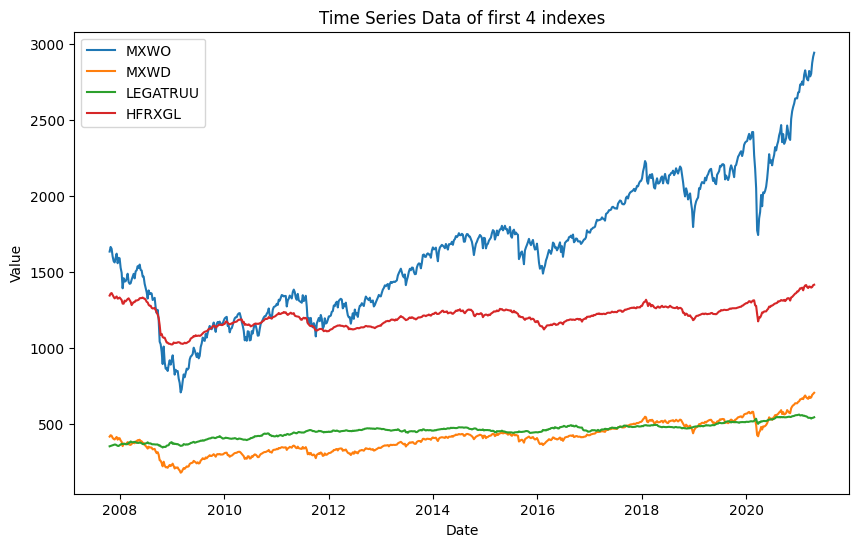

In [76]:
# Plotting
plt.figure(figsize=(10, 6))  # Adjust size if needed

# Plot each column
plt.plot(df['Date'], df['MXWO'], label='MXWO')
plt.plot(df['Date'], df['MXWD'], label='MXWD')
plt.plot(df['Date'], df['LEGATRUU'], label='LEGATRUU')
plt.plot(df['Date'], df['HFRXGL'], label='HFRXGL')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Time Series Data of first 4 indexes')
plt.legend()  # Show legend with labels

plt.show()

Now we normalize each serie by dividing it by its first element.

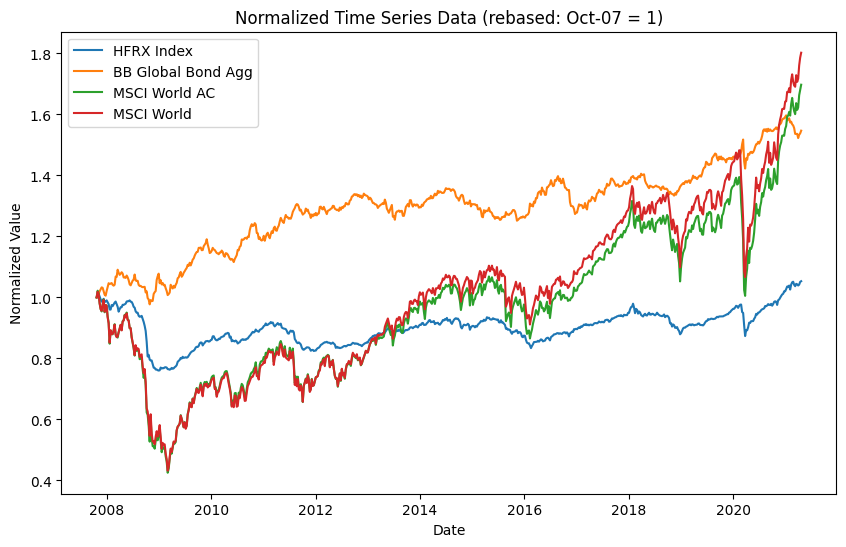

In [77]:
# Normalize data
df_normalized = df.copy()
for col in ['HFRXGL', 'LEGATRUU', 'MXWD', 'MXWO']:
    df_normalized[col] = df[col] / df[col].iloc[0]

# Plotting
plt.figure(figsize=(10, 6))  # Adjust size if needed

# Plot each column
plt.plot(df['Date'], df_normalized['HFRXGL'], label='HFRX Index')
plt.plot(df['Date'], df_normalized['LEGATRUU'], label='BB Global Bond Agg')
plt.plot(df['Date'], df_normalized['MXWD'], label='MSCI World AC')
plt.plot(df['Date'], df_normalized['MXWO'], label='MSCI World')

plt.xlabel('Date')
plt.ylabel('Normalized Value')
plt.title('Normalized Time Series Data (rebased: Oct-07 = 1)')
plt.legend()  # Show legend with labels

plt.show()

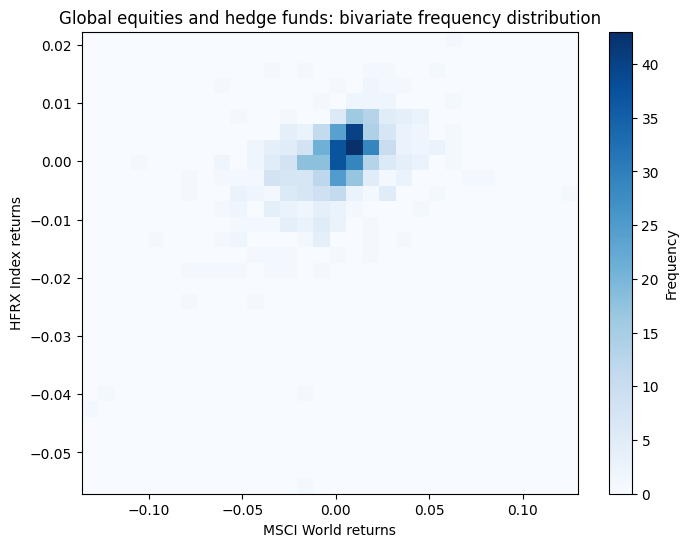

In [78]:
# Calculate returns for MSCI World and HFRX Index
returns_MXWO = df['MXWO'].pct_change().dropna()
returns_HFRXGL = df['HFRXGL'].pct_change().dropna()

# Plotting
plt.figure(figsize=(8, 6))  # Adjust size if needed

plt.hist2d(returns_MXWO, returns_HFRXGL, bins=30, cmap='Blues')

plt.xlabel('MSCI World returns')
plt.ylabel('HFRX Index returns')
plt.title('Global equities and hedge funds: bivariate frequency distribution')

plt.colorbar(label='Frequency')

plt.show()


next histogram doesn't feel right

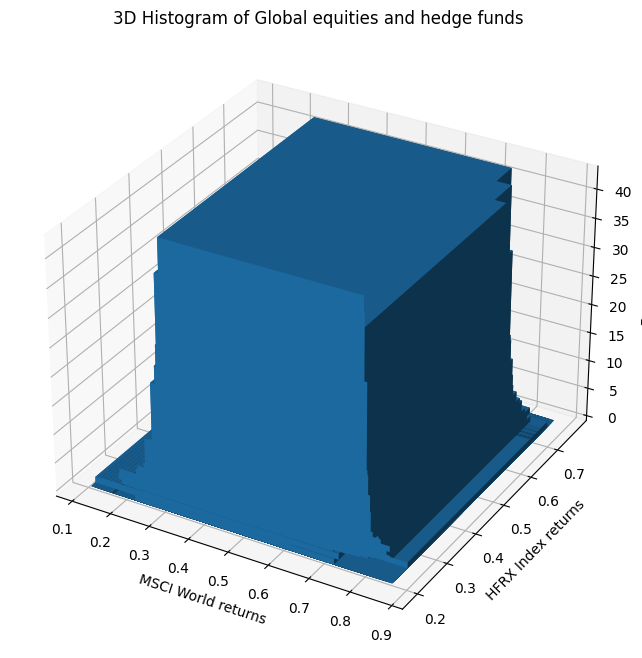

In [79]:
# Compute 2D histogram
hist, xedges, yedges = np.histogram2d(returns_MXWO, returns_HFRXGL, bins=30)

# Construct arrays for the bar plot
xpos, ypos = np.meshgrid(xedges[:-1] + 0.25, yedges[:-1] + 0.25, indexing="ij")
xpos = xpos.ravel()
ypos = ypos.ravel()
zpos = 0

# Construct arrays with the dimensions for the bars.
dx = dy = 0.5 * np.ones_like(zpos)
dz = hist.ravel()

# Plotting
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.bar3d(xpos, ypos, zpos, dx, dy, dz, zsort='average', cmap='Blues')

ax.set_xlabel('MSCI World returns')
ax.set_ylabel('HFRX Index returns')
ax.set_zlabel('Frequency')
ax.set_title('3D Histogram of Global equities and hedge funds')

plt.show()


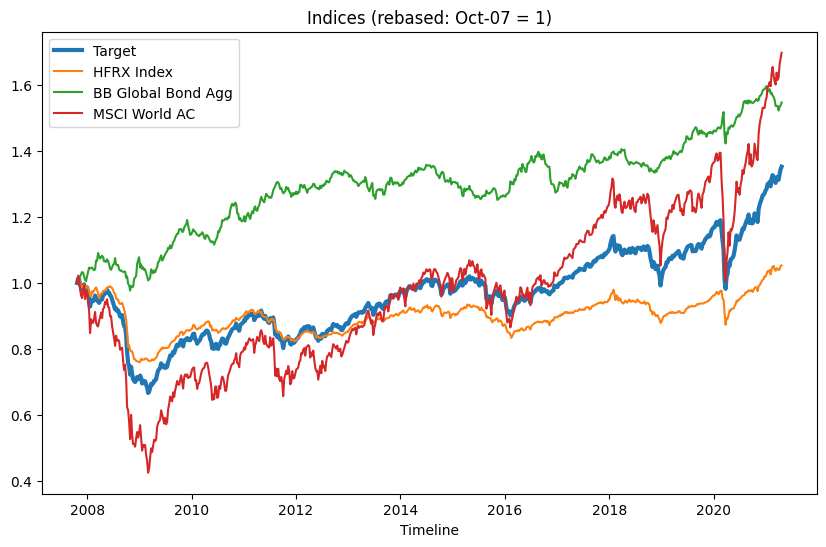

In [80]:
# target index
y = 0.5 * df['HFRXGL'] + 0.25 * df['MXWO'] + 0.25 * df['LEGATRUU']
target = y
df['Target'] = target

# Plotting
plt.figure(figsize=(10, 6))

# Plot Monster Index
plt.plot(df['Date'], target/target.iloc[0], label='Target', linewidth=3)

# Plot other indices
plt.plot(df['Date'], df['HFRXGL'] / df['HFRXGL'].iloc[0], label='HFRX Index')
plt.plot(df['Date'], df['LEGATRUU'] / df['LEGATRUU'].iloc[0], label='BB Global Bond Agg')
plt.plot(df['Date'], df['MXWD'] / df['MXWD'].iloc[0], label='MSCI World AC')

plt.xlabel('Timeline')
plt.title('Indices (rebased: Oct-07 = 1)')
plt.legend()

plt.show()

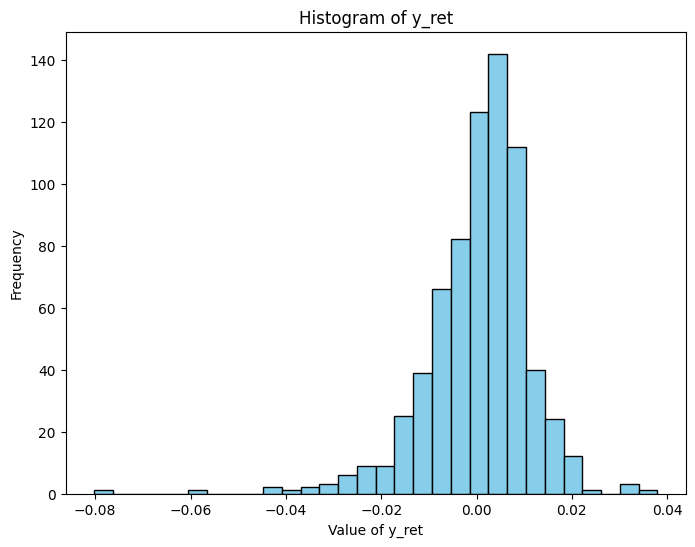

In [81]:
y_ret = y.pct_change().dropna()

plt.figure(figsize=(8, 6))
# Plot histogram
plt.hist(y_ret, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Value of y_ret')
plt.ylabel('Frequency')
plt.title('Histogram of y_ret')
plt.show()

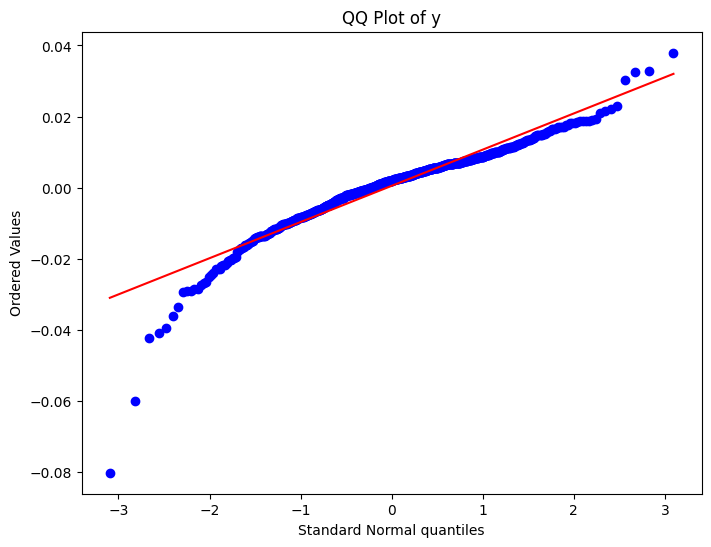

In [82]:
import scipy.stats as stats

plt.figure(figsize=(8, 6))
# Create QQ plot
stats.probplot(y_ret, dist="norm", plot=plt)
plt.xlabel('Standard Normal quantiles')
plt.ylabel('Ordered Values')
plt.title('QQ Plot of y')
plt.show()

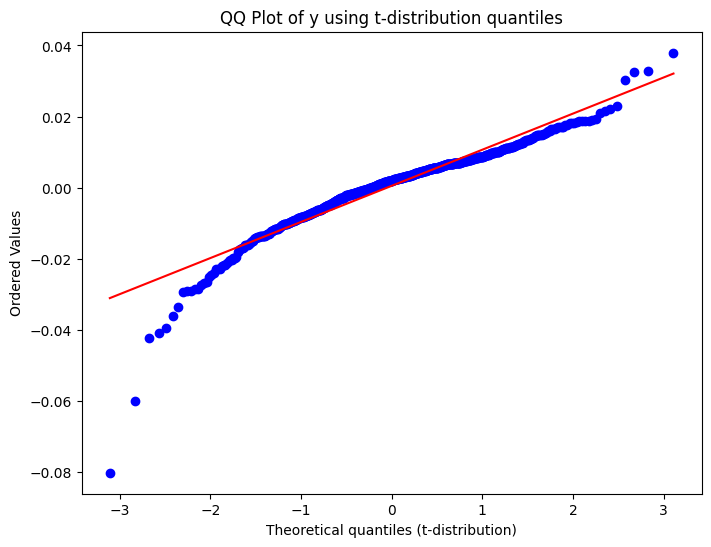

In [83]:
plt.figure(figsize=(8, 6))
# Calculate t-distribution quantiles
t_dist = stats.t(df=len(y_ret) - 1)
t_quantiles = t_dist.ppf(stats.uniform.rvs(size=len(y_ret)))
# Create QQ plot
stats.probplot(y_ret, dist=t_dist, plot=plt)

plt.xlabel('Theoretical quantiles (t-distribution)')
plt.ylabel('Ordered Values')
plt.title('QQ Plot of y using t-distribution quantiles')
plt.show()

now we plot the futures

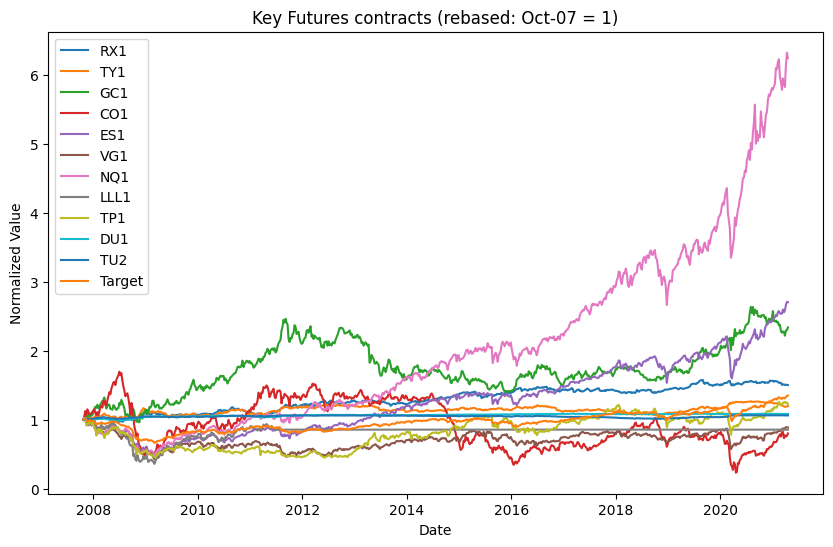

In [84]:
# Normalize data
df_normalized = df.copy()
for col in df.columns[1:]:
    df_normalized[col] = df[col] / df[col].iloc[0]

# Plotting
plt.figure(figsize=(10, 6))  # Adjust size if needed

# Plot each column

for col in df.columns[5:]:
  plt.plot(df['Date'], df_normalized[col], label=col)

plt.xlabel('Date')
plt.ylabel('Normalized Value')
plt.title('Key Futures contracts (rebased: Oct-07 = 1)')
plt.legend()  # Show legend with labels

plt.show()


And we explore the correlation among them

In [85]:
df.columns

Index(['Date', 'MXWO', 'MXWD', 'LEGATRUU', 'HFRXGL', 'RX1', 'TY1', 'GC1',
       'CO1', 'ES1', 'VG1', 'NQ1', 'LLL1', 'TP1', 'DU1', 'TU2', 'Target'],
      dtype='object')

In [86]:
import seaborn as sns

Pearson correlation

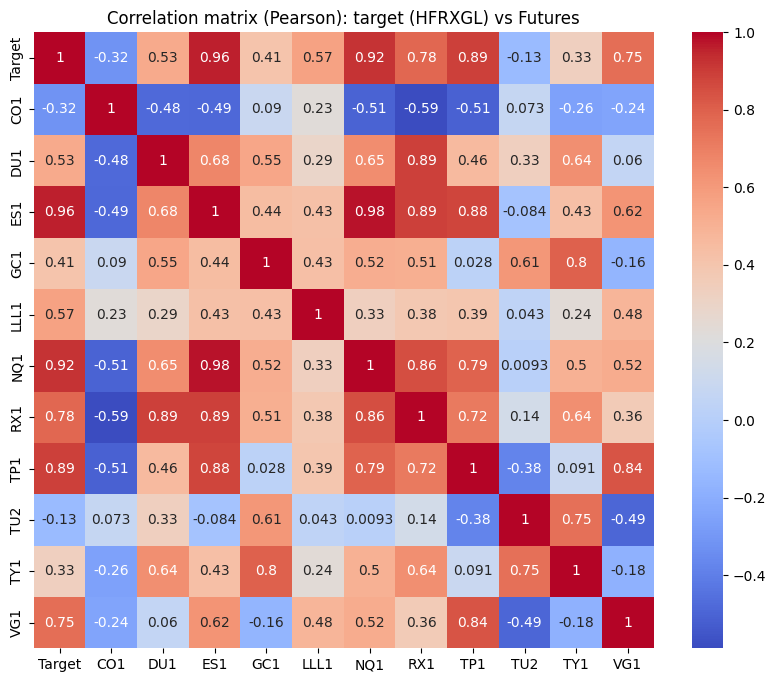

In [87]:
# Define the variables
yvalues = ['Target', 'CO1', 'DU1', 'ES1', 'GC1', 'LLL1', 'NQ1', 'RX1', 'TP1', 'TU2', 'TY1', 'VG1']
xvalues = yvalues#df.columns[5:].tolist()  # Get all column names in the DataFrame starting from the 5th column

# Compute the correlation between each column in 'df' and each variable in 'yvalues'
correlation_values = [[df[col].corr(df[y]) for col in xvalues] for y in yvalues]

# Create a DataFrame from the correlation values
correlation_df = pd.DataFrame(correlation_values, index=yvalues, columns=xvalues)

# Plotting
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm')
plt.title('Correlation matrix (Pearson): target (HFRXGL) vs Futures')
plt.show()


Kendall correlation

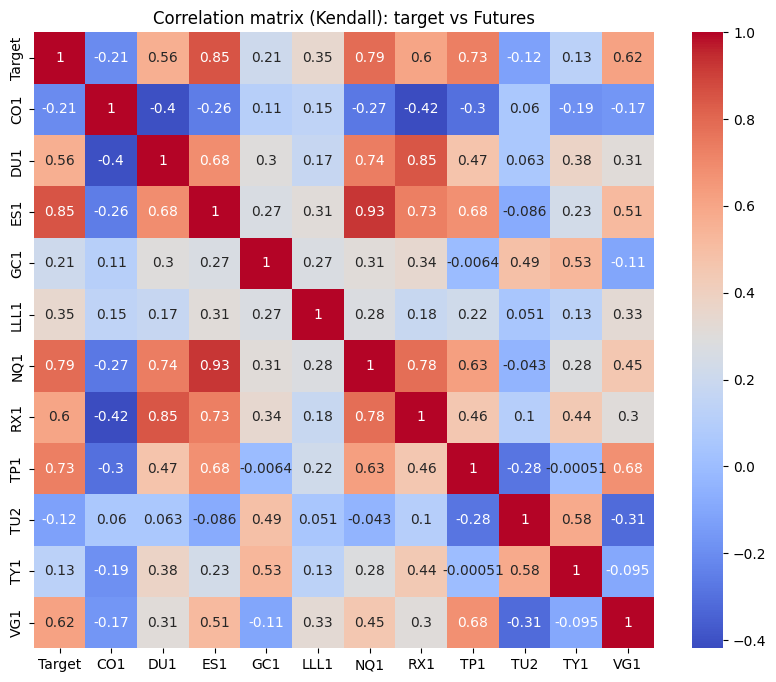

In [88]:
# Compute the Kendall correlation between each column in 'df' and each variable in 'yvalues'
correlation_values = [[df[col].corr(df[y], method='kendall') for col in xvalues] for y in yvalues]

# Create a DataFrame from the correlation values
correlation_df = pd.DataFrame(correlation_values, index=yvalues, columns=xvalues)

# Plotting
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm')
plt.title('Correlation matrix (Kendall): target vs Futures')
plt.show()

Target returns autocorrelation and partial autocorrelation

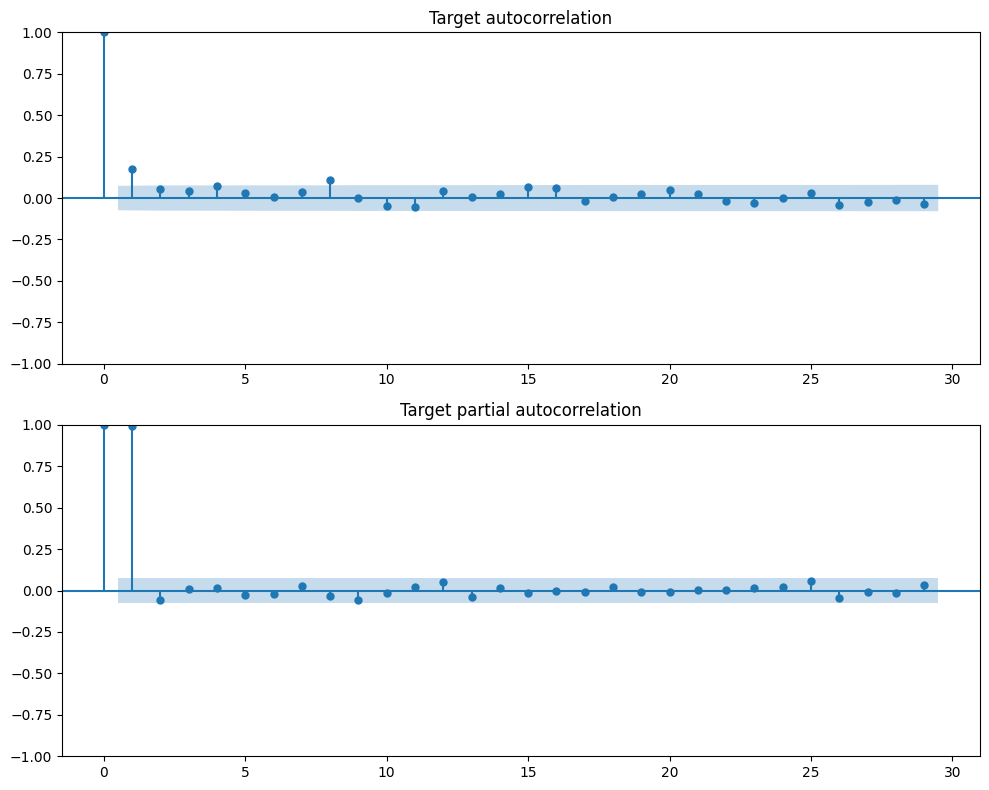

In [89]:
import statsmodels.api as sm

# Assuming y is your variable of interest

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Autocorrelation plot
sm.graphics.tsa.plot_acf(y_ret, ax=axes[0])
axes[0].set_title('Target autocorrelation')

# Partial autocorrelation plot
sm.graphics.tsa.plot_pacf(y, ax=axes[1])
axes[1].set_title('Target partial autocorrelation')

plt.tight_layout()
plt.show()


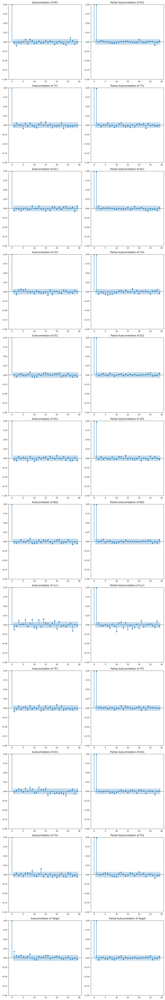

In [90]:
# Get column names starting from the 5th column
columns_to_plot = df.columns[5:]

# Create subplots
fig, axes = plt.subplots(len(columns_to_plot), 2, figsize=(12, 6*len(columns_to_plot)))

# Loop through each column
for i, col in enumerate(columns_to_plot):
    # Autocorrelation plot
    sm.graphics.tsa.plot_acf(df[col].pct_change().dropna(), ax=axes[i, 0])
    axes[i, 0].set_title(f'Autocorrelation of {col}')

    # Partial autocorrelation plot
    sm.graphics.tsa.plot_pacf(df[col], ax=axes[i, 1])
    axes[i, 1].set_title(f'Partial Autocorrelation of {col}')

plt.tight_layout()
plt.show()


## Datasets Construction

In [91]:
# target index
y = 0.5 * df['HFRXGL'] + 0.25 * df['MXWO'] + 0.25 * df['LEGATRUU']
target = y
df['Target'] = target

In [92]:
X = df[df.columns[5:-1]].copy()
X_ret = df[df.columns[5:-1]].copy()

for col in X_ret.columns:
    X_ret[col] = X_ret[col].pct_change().dropna()

X = X.dropna()
X_ret = X_ret.dropna()

In [93]:
y = df['Target']
y_ret = y.pct_change().dropna()
# CROPPING NEGATIVE VALUES
y_cropped = y_ret
y_cropped[y_cropped < 0] = 0
# ========================
y_ret = y.pct_change().dropna()

In [94]:
y = df['Target']
y_ret = y.pct_change().dropna()
# COMPUTING ABSOLUTE VALUES
y_abs = np.abs(y_ret)
# ========================
y_ret = y.pct_change().dropna()

In [95]:
y = df['Target']
y_ret = y.pct_change().dropna()

In [96]:
X_ret, y_ret, y_cropped, y_abs

(          RX1       TY1       GC1       CO1       ES1       VG1       NQ1  \
 1    0.000792  0.001272  0.037945  0.055401  0.006883  0.018894  0.002599   
 2    0.000000  0.001977  0.045189  0.066560 -0.007161 -0.011394  0.007102   
 3    0.004921  0.007610 -0.029633 -0.047502 -0.027377 -0.023051 -0.074659   
 4    0.003236  0.012867 -0.009512  0.074975 -0.025114 -0.006246 -0.015120   
 5    0.003138  0.007042  0.028557 -0.031103 -0.013485 -0.012803 -0.001474   
 ..        ...       ...       ...       ...       ...       ...       ...   
 700  0.000815 -0.008689 -0.003351 -0.111127 -0.015799 -0.020000 -0.011044   
 701 -0.005351 -0.005567 -0.023883  0.055108  0.012283  0.026239 -0.009841   
 702  0.003977  0.003811  0.034206 -0.021827  0.029460  0.012397  0.053715   
 703 -0.002446  0.002966  0.002699  0.014823  0.016929 -0.000765  0.029901   
 704 -0.002277  0.003549  0.016436  0.044605 -0.001403 -0.003829 -0.012379   
 
          LLL1       TP1       DU1       TU2  
 1    0.028671 

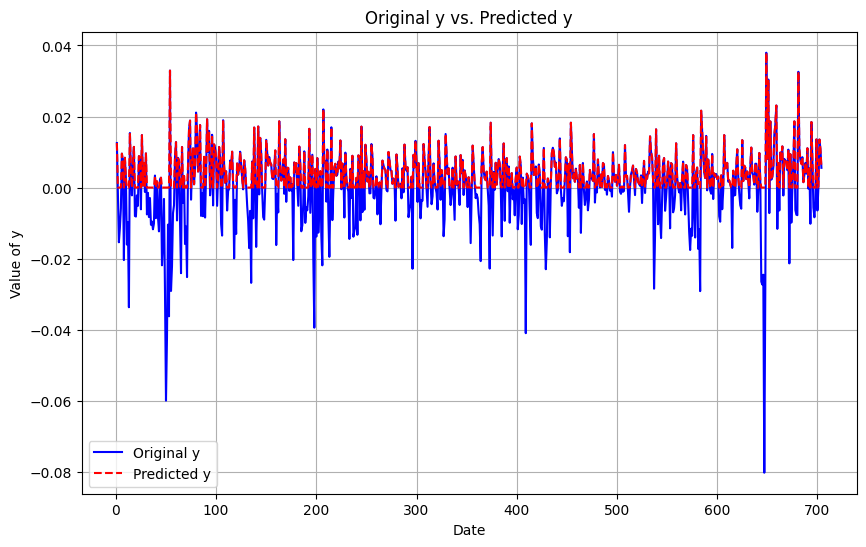

In [97]:
visualize(y_ret, y_cropped)

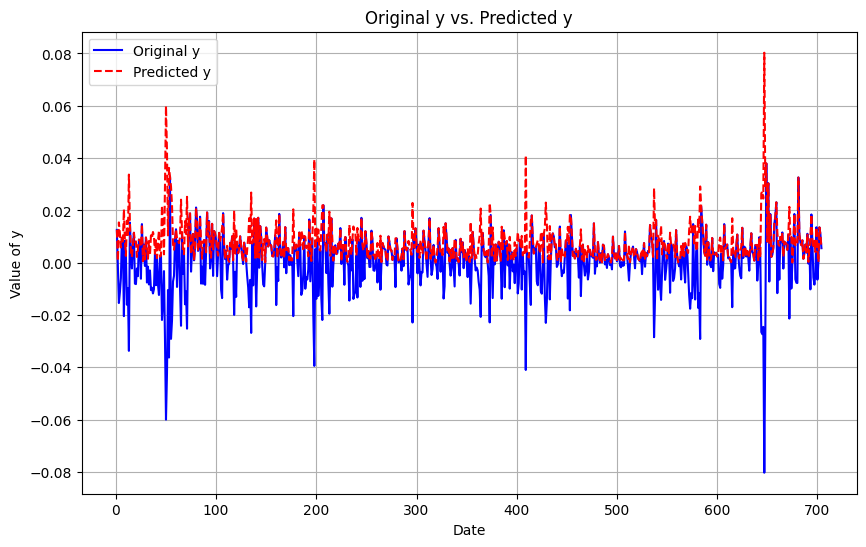

In [98]:
visualize(y_ret, y_abs)

## Regressions and State Space Models

In [99]:
import warnings
warnings.filterwarnings("ignore")

### Metrics

In [171]:
def calculate_total_return(daily_returns):
    """
    Calculates the total return from a list of daily returns.

    Args:
        daily_returns (list[float]): List of daily returns as decimal values (e.g., 0.02 for 2%).

    Returns:
        float: Total return as a percentage.
    """
    cumulative_return = 1.0
    for r in daily_returns:
        cumulative_return *= (1 + r)

    total_return = (cumulative_return - 1) * 100
    return total_return

In [172]:
def upper_partial_moment(series, threshold, order):
    """
    Compute the upper partial moment of a time series.

    Parameters:
    - series: list, numpy array, or pandas Series, the time series data
    - threshold: float, the threshold level
    - order: int, the order of the partial moment

    Returns:
    - UPM: float, the upper partial moment
    """
    # Convert the input series to a NumPy array if it's not already
    series = np.array(series)
    # Calculate positive deviations above the threshold
    positive_deviations = series[series > threshold] - threshold
    # Compute the upper partial moment
    UPM = np.mean(np.power(positive_deviations, order))
    return UPM

In [173]:
def lower_partial_moment(series, threshold, order):
    """
    Compute the lower partial moment of a time series.

    Parameters:
    - series: list, numpy array, or pandas Series, the time series data
    - threshold: float, the threshold level
    - order: int, the order of the partial moment

    Returns:
    - LPM: float, the lower partial moment
    """
    # Convert the input series to a NumPy array if it's not already
    series = np.array(series)
    # Calculate negative deviations below the threshold
    negative_deviations = threshold - series[series < threshold]
    # Compute the lower partial moment
    LPM = np.mean(np.power(negative_deviations, order))
    return LPM


In [174]:
def semi_deviation(returns, threshold=0):
    """
    Compute the semi-deviation of returns below a certain threshold.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - threshold: float, the threshold return level (default is 0)

    Returns:
    - semi_dev: float, the semi-deviation
    """
    below_threshold = returns[returns < threshold]
    semi_dev = np.std(below_threshold, ddof=0)
    return semi_dev

In [175]:
def value_at_risk(returns, confidence_level=0.95):
    """
    Compute the Value at Risk (VaR) of returns at a certain confidence level.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - confidence_level: float, the desired confidence level (default is 0.95)

    Returns:
    - var: float, the Value at Risk (VaR)
    """
    var = np.percentile(returns, 100 * (1 - confidence_level))
    return var

In [176]:
def conditional_value_at_risk(returns, confidence_level=0.95):
    """
    Compute the Conditional Value at Risk (CVaR) of returns at a certain confidence level.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - confidence_level: float, the desired confidence level (default is 0.95)

    Returns:
    - cvar: float, the Conditional Value at Risk (CVaR)
    """
    var = value_at_risk(returns, confidence_level)
    cvar = returns[returns <= var].mean()
    return cvar

In [177]:
def downside_deviation(returns, threshold=0):
    """
    Compute the downside deviation of returns below a certain threshold.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - threshold: float, the threshold return level (default is 0)

    Returns:
    - downside_dev: float, the downside deviation
    """
    below_threshold = returns[returns < threshold]
    downside_dev = np.std(below_threshold, ddof=0)
    return downside_dev

In [178]:
def lower_partial_standard_deviation(returns, threshold=0):
    """
    Compute the Lower Partial Standard Deviation (LPSD) of returns below a certain threshold.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - threshold: float, the threshold return level (default is 0)

    Returns:
    - lpsd: float, the Lower Partial Standard Deviation (LPSD)
    """
    below_threshold = returns[returns < threshold]
    lpsd = np.std(below_threshold, ddof=0)
    return lpsd

In [179]:
def omega_ratio(returns, risk_free_rate=0):
    """
    Compute the Omega Ratio of returns.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - risk_free_rate: float, the risk-free rate of return (default is 0)

    Returns:
    - omega: float, the Omega Ratio
    """
    excess_returns = returns - risk_free_rate
    omega = np.mean(excess_returns[excess_returns < 0]) / np.abs(np.mean(excess_returns[excess_returns >= 0]))
    return omega

In [180]:
def sortino_ratio(returns, risk_free_rate=0):
    """
    Compute the Sortino Ratio of returns.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - risk_free_rate: float, the risk-free rate of return (default is 0)

    Returns:
    - sortino_ratio: float, the Sortino Ratio
    """
    downside_dev = downside_deviation(returns)
    excess_returns = returns - risk_free_rate
    sortino_ratio = np.mean(excess_returns) / downside_dev
    return sortino_ratio

In [181]:
def conditional_drawdown_at_risk(returns, threshold=0):
    """
    Compute the Conditional Drawdown at Risk (CDaR) of returns below a certain threshold.

    Parameters:
    - returns: numpy array or pandas Series, the returns data
    - threshold: float, the threshold return level (default is 0)

    Returns:
    - cdrawdown_at_risk: float, the Conditional Drawdown at Risk (CDaR)
    """
    below_threshold = returns[returns < threshold]
    drawdowns = threshold - below_threshold
    cdrawdown_at_risk = np.mean(drawdowns)
    return cdrawdown_at_risk

In [204]:
def compute_metrics(returns, verbose=False):

  tot_return = calculate_total_return(returns)
  upm = upper_partial_moment(returns, threshold=0, order=2)
  lpm = lower_partial_moment(returns, threshold=0, order=2)
  semidev = semi_deviation(returns)
  var = value_at_risk(returns)
  cvar = conditional_value_at_risk(returns)
  dd = downside_deviation(returns)
  lpsd = lower_partial_standard_deviation(returns)
  omega = omega_ratio(returns)
  sortino = sortino_ratio(returns)
  cdar = conditional_drawdown_at_risk(returns)


  if verbose:
    print('============================')
    print(f'Return: {tot_return*100} %')
    print("Upper Partial Moment:", upm)
    print("Lower Partial Moment:", lpm)

    print("Semi-Deviation:", semidev)
    print("Value at Risk (VaR):", var)
    print("Conditional Value at Risk (CVaR):", cvar)
    print("Downside Deviation:", dd)
    print("Lower Partial Standard Deviation (LPSD):", lpsd)
    print("Omega Ratio:", omega)
    print("Sortino Ratio:", sortino)
    print("Conditional Drawdown at Risk (CDaR):", cdar)

  return (tot_return, upm, lpm, semidev, var, cvar, dd, lpsd, omega, sortino, cdar)

In [183]:
def explain_metrics(metrics):
  metrics_names = ["Return (%):", "Upper Partial Moment:", "Lower Partial Moment:", "Semi-Deviation:","Value at Risk (VaR):", "Conditional Value at Risk (CVaR):", "Downside Deviation:", "Lower Partial Standard Deviation (LPSD):", "Omega Ratio:", "Sortino Ratio:", "Conditional Drawdown at Risk (CDaR):"]
  for i in range(len(metrics)):
    print(metrics_names[i], metrics[i])

In [209]:
def get_metrics_df(metrics_list):
  df_metrics = pd.DataFrame(np.array(c))
  metrics_names = ["Return (%):", "Upper Partial Moment:", "Lower Partial Moment:", "Semi-Deviation:","Value at Risk (VaR):", "Conditional Value at Risk (CVaR):", "Downside Deviation:", "Lower Partial Standard Deviation (LPSD):", "Omega Ratio:", "Sortino Ratio:", "Conditional Drawdown at Risk (CDaR):"]
  df_metrics.columns = metrics_names
  #df_metrics.head()
  return df_metrics

In [231]:
def plot_bars_metrics(metrics_list):

  df_m = get_metrics_df(metrics_list)
  df_m.head()

  original = df_m.iloc[0]
  full_dataset = df_m.iloc[1:5]
  cropped_dataset = df_m.iloc[5:9]
  abs_dataset = df_m.iloc[9:13]

  for col in df_m.columns:
    plotdata = pd.DataFrame({
        "full":np.array(full_dataset[col]),
        "cropped":np.array(cropped_dataset[col]),
        "abs":np.array(abs_dataset[col])
        },
        index=["1st window", "2nd window", "3rd window", "4th window"]
    )
    plotdata.plot(kind="bar")
    plt.title(col)
    plt.xlabel("Window of training")
    plt.ylabel(col)

### Models

In [185]:
def perform_OLS(X, y):
  #visualize(y, y)
  name = 'OLS'
  model = sm.OLS(y, X)
  results = model.fit()
  b = results.params
  return b, name

In [186]:
def perform_Lasso(X, y):
  name = 'Lasso'

  # find alpha with grid search
  alphas = np.logspace(-6, -2, 100)
  lasso_model = Lasso()
  param_grid = {'alpha': alphas}
  grid_search = GridSearchCV(estimator=lasso_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X, y)
  best_alpha = grid_search.best_params_['alpha']

  #best_alpha = 0.00001
  model = Lasso(alpha=best_alpha)
  results = model.fit(X, y)
  b = results.coef_
  return b, name

In [187]:
def perform_Ridge(X, y):
  name = 'Ridge'

  ridge_model = Ridge()

  # find alpha with grid search
  alphas = np.logspace(-6, -2, 100)
  ridge_model = Ridge()
  param_grid = {'alpha': alphas}
  grid_search = GridSearchCV(estimator=ridge_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X, y)
  best_alpha = grid_search.best_params_['alpha']

  model = Ridge(alpha=best_alpha)
  results = model.fit(X, y)
  b = results.coef_
  return b, name

In [188]:
def perform_ElasticNet(X, y):
  name = 'Elastic Net'

  elastic_net_model = ElasticNet()

  # find alpha and L1 ratio with grid search
  alphas = np.logspace(-6, -2, 100)
  l1_ratios = [x/10 for x in range(1,10)]
  param_grid = {'alpha': alphas, 'l1_ratio': l1_ratios}
  grid_search = GridSearchCV(estimator=elastic_net_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
  grid_search.fit(X, y)
  best_alpha = grid_search.best_estimator_.alpha
  best_l1_ratio = grid_search.best_estimator_.l1_ratio

  model = ElasticNet(alpha=best_alpha, l1_ratio=best_l1_ratio)
  results = model.fit(X, y)
  b = results.coef_
  return b, name

In [189]:
def perform_ARIMA(X, y):
  name = 'ARIMA'
  model = sm.tsa.ARIMA(y, order=(1, 0, 1), exog=X, trend=[0,1,0,0])
  results = model.fit()
  params = results.params
  b = params[1:12] - params[0]
  return b, name

In [190]:
def perform_SARIMAX(X, y):
  name = 'SARIMAX'
  model = sm.tsa.statespace.SARIMAX(y, exog=X, order=(1, 0, 1), seasonal_order=(0, 0, 0, 0))
  results = model.fit(maxiter=1000)
  b = results.params[:11]
  return b, name


Kalman Filter (Built from scratch).

*Initialization :*
- **x** : state vector (Beta weights of the futures)
- **x_zero** : intial state vector (Initial beta weights of the futures)
- **P** : (Error) Covariance matrix
- **P_zero** : Initial (Error) Covariance matrix
- **Q** : Process uncertainty/noise matrix (Variane of Monster Index)*I
- **R** : Process measurement certainty/noise matrix (Variance of the residuals *Identity)
- **H** : Measurement function (Futures returns vector)
- **v** : Process gaussian with zero mean and covariance R [vt ~ N(0, R)]

In [191]:
def Kalmann_filter (x_zero,P_zero,Q,R,H,I,v,iterations):
    #Initialization.
    x_initial = x_zero
    P_initial = P_zero

    for i in range(iterations):
        #Prediction step.
        x_measured = x_initial
        P_measured = P_initial + Q

        #Measurement Update (Correction step).
        #Computing gain:
        K = np.dot(np.dot(P_measured,H[i].T), np.dot(np.dot(H[i],P_measured),H[i].T)+ R)
        rt = np.dot(H[i],x_initial) + v
        #Update estimate with measurement
        x_initial = x_measured +  np.dot(K,(rt - np.dot(H[i],x_measured)) )
        #Update the error covariance
        P_initial = np.dot((I -  np.dot(K,H[i])),P_measured)

    return x_initial

In [192]:
def perform_KalmanFilter(X, y):
  name = 'Kalman Filter'

  test_set_idx = int(0.2*X.shape[0])
  X_train = X.iloc[:test_set_idx]
  y_train = y.iloc[:test_set_idx]
  X_test = X.iloc[test_set_idx:]
  y_test = y.iloc[test_set_idx:]

  alpha = 0.001
  ridge = Ridge(alpha=alpha)
  ridge.fit(X_train, y_train)
  x_zero = ridge.coef_

  y_pred = ridge.predict(X_test)
  residuals = y_test - y_pred
  sigma2 = np.var(residuals, ddof=X_train.shape[1])

  XtX = X_train.T @ X_train
  lambda_I = alpha*np.eye(X_train.shape[1])
  inv_term = np.linalg.inv(XtX + lambda_I)
  cov_matrix = sigma2 * inv_term @ XtX @ inv_term

  beta_se = np.sqrt(np.diag(cov_matrix))

  # Variance computation
  beta_var = np.diag(beta_se) ** 2
  P_zero = np.diag(beta_var)

  variance_np = np.var(y, ddof=1)
  print (variance_np)
  I = np.eye(11)

  Q = variance_np * I
  w = np.var(residuals)
  R = w * I
  v= np.random.multivariate_normal(mean=np.zeros(len(R)), cov=R)
  H = X.values

  iterations = X.shape[0]

  b = Kalmann_filter(x_zero,P_zero,Q,R,H,I,v,iterations)

  return b, name


Kalman Filter (Pre-built, from filterpy)

*Initialization :*
- **State space dimension**: dim_x -> Dimensionalit of the state vector.
- **Measurement space dimension**: dim_z -> Dimensionality of the measurement vector.
- **Control space dimeansion**: dim_u -> Dimensionality of the control input vector

- **x** : state vector (Beta weights of the futures)
- **x_zero** : intial state vector (Initial beta weights of the futures)
- **P** : (Error) Covariance matrix
- **P_zero** : Initial (Error) Covariance matrix
- **Q** : Process uncertainty/noise matrix (Variane of Monster Index)*I
- **R** : Process measurement certainty/noise matrix (Covariance matrix of futures)
- **H** : Measurement function (Futures returns vector)
- **F** : State transition matrix
- **B** : Control transition matrix
- **u** : Control transition vector
- **v** : Process gaussian with zero mean and covariance R [vt ~ N(0, R)]

In [193]:
def KalmanfilterLIB(dim_x, dim_z, dim_u, x_zero, P_zero,Q,R,H,F,B,v):
    #Initializing the Kalman filter.
    kf = KalmanFilter(dim_x=dim_x, dim_z=dim_z, dim_u=dim_u)
    #setting intial state (beta weights of the futures).
    kf.x = x_zero
    #defining covariance matrix :
    kf.P = P_zero
    #defining process uncertainty/noise :
    kf.Q = Q
    #defining process measurement certainty/noise :
    kf.R = R
    #defining state transition matrix :
    kf.F = F
    #defining control transition matrix :
    kf.B = B

    iterations = H.shape[0]

    # Replication loop
    replicated_index = []
    z= []

    for i in range(iterations):
        #defining measurement function :
        kf.H = H[i]

        #Predict next state
        kf.predict()

        # Get observation for current time step
        kf.z = H[i]

        # Update measurement based on observation
        kf.update(kf.z)

        '''
        # Estimate the current state (replicated index)
        replicated_index.append(kf.x[0])
        '''
    return kf.x



In [194]:
def get_cov(R):
    X  = R - R.mean(axis = 0)
    C  = R.T @ R
    return C

def get_mean(R):
    return R.mean(axis = 0)

In [195]:
def perform_PrebuiltKalmanFilter(X, y):
  name = 'Prebuilt Kalman Filter'

  test_set_idx = int(0.2*X.shape[0])
  X_train = X.iloc[:test_set_idx]
  y_train = y.iloc[:test_set_idx]
  X_test = X.iloc[test_set_idx:]
  y_test = y.iloc[test_set_idx:]

  alpha = 0.001
  ridge = Ridge(alpha=alpha)
  ridge.fit(X_train, y_train)
  x_zero = ridge.coef_

  y_pred = ridge.predict(X_test)
  residuals = y_test - y_pred
  sigma2 = np.var(residuals, ddof=X_train.shape[1])

  XtX = X_train.T @ X_train
  lambda_I = alpha*np.eye(X_train.shape[1])
  inv_term = np.linalg.inv(XtX + lambda_I)
  cov_matrix = sigma2 * inv_term @ XtX @ inv_term

  beta_se = np.sqrt(np.diag(cov_matrix))

  # Variance computation
  beta_var = np.diag(beta_se) ** 2
  P_zero = np.diag(beta_var)

  variance_np = np.var(y, ddof=1)
  print (variance_np)
  I = np.eye(11)

  # Initialize Kalman filter parameters.

  dim_x = 11

  dim_z =11

  dim_u = 11

  Q = variance_np * I
  w = np.var(residuals)
  H = X.values
  R = get_cov(X)

  # Apply Ledoit-Wolf shrinkage
  lw = LedoitWolf()
  lw.fit(R)
  R = lw.covariance_

  #Control input vector : (diff between weights of 2 best models)
  u = [0.00000338741527,0.00000338741527,0.00000338741527,0.00000338741527,0.00000338741527,0.00000338741527,
       0.00000338741527,0.00000338741527,0.00000338741527,0.00000338741527,0.00000338741527]

  #Control vector :
  B = np.dot(u,I)

  F= I


  #observation_noise
  v= np.random.multivariate_normal(mean=np.zeros(len(R)), cov=R)

  x_fin = KalmanfilterLIB(dim_x,dim_z,dim_u,x_zero,P_zero,Q,R,H,F,B,v)

  return x_fin


** Encountered Problem : **

Our R ( Covariance matrix of the futures ) had huge values, therefore; it became uninvertable which made the filter non functional. To bypass this obstacle, we had to use the Covariance matrix shrinkage approach by (Ledoit and Wolf (2004)), which is implemented in python; in order to transform our matrix to non-singular.

22956.13256583598


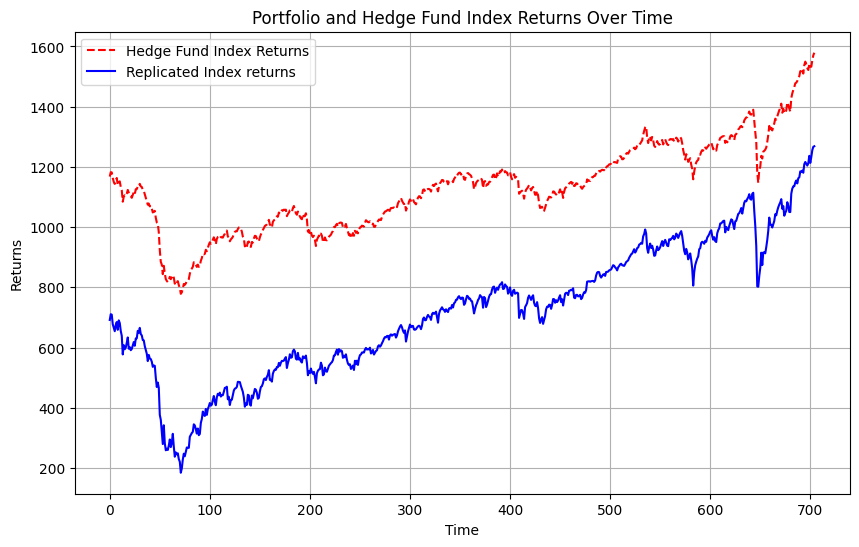

In [196]:
x_fin =  perform_PrebuiltKalmanFilter(X, y)
#Computing the replicated index returns.
rep_index= np.dot(X, x_fin)

# Plot both portfolio returns and hedge fund index returns on the same graph
plt.figure(figsize=(10, 6))
plt.plot(y, label='Hedge Fund Index Returns', color='red',linestyle='--')
plt.plot(rep_index, label='Replicated Index returns', color='blue')

plt.xlabel('Time')
plt.ylabel('Returns')
plt.title('Portfolio and Hedge Fund Index Returns Over Time')
plt.legend()
plt.grid(True)
plt.show()

### Backtesting Function

In [205]:
def backtest(X, y_ret, y_cropped, y_abs, rolling_window, model_function, plots = [0,0,0], print_every=200, rolling=True, metrics=True):

  plot_w = plots[0]
  plot_rets = plots[1]
  plot_price = plots[2]

  step = print_every

  metrics_final = []

  if metrics:
    print(f"Metrics of target serie:")
    metrics = compute_metrics(y_ret, verbose=metrics)
    metrics_final.append(metrics)


  for y in [y_ret, y_cropped, y_abs]:

    print("==================================")
    i = 1
    endsample = 0

    while endsample < X.shape[0] - 2:

      startsample = i
      endsample = i + rolling_window - 1

      if rolling == False:
        startsample = 1

      if i%print_every==1:
        print(f"Starting training from observation {startsample}")
        print(f"Starting prediction from observation {endsample}")
        print(f"Using rolling window: {rolling}")

      b, name = model_function(X[startsample:endsample], y[startsample:endsample])

      if plot_w and i%print_every == 1:
        plot_weights(b)

      r = np.dot(np.array(X.iloc[endsample:]),b)
      if (y == y_abs).all() and 'Learning' not in name:
        r *= -1

      if name == 'Random Learning':
        tgt_serie_std = np.std(y_ret)
        repl_serie_std = np.std(r)
        coef = repl_serie_std / tgt_serie_std
        r = r/coef

      total = np.concatenate((np.array(y_ret[startsample:endsample]), r))


      if plot_rets and i%print_every == 1:
        visualize(y[startsample:], total)

      cumulative_y = (1 + y_ret[startsample:]).cumprod()
      cumulative_predicted_y = (1 + total).cumprod()

      # compute metrics
      pred_metrics = compute_metrics(total, verbose=metrics)
      metrics_final.append(pred_metrics)


      if plot_price and i%print_every == 1:
        visualize(cumulative_y, cumulative_predicted_y)

      i = i + step

  return metrics_final

### Rolling window tests

In [206]:
# Window parameters
rolling = True
rolling_window = 156

# Status Parameters
print_every = 200
plots = [0,0,1]

#### OLS

Metrics of target serie:
Return: 3521.9532417832243 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 3950.3477227497074 %
Upper Partial Moment: 6.199560046250285e-05
Lower Partial Moment: 0.00014136482169154502
Semi-Deviation: 0.008785628311625344
Value at Risk (VaR): -0.015369391649601431
Conditional Value at Risk (CVaR): -0.02587814660854729
Downside Deviation: 0.008785628311625344
Lower Partial Standard Deviation (LPSD): 0.008785628311625344
Omega Ratio: -1.2916838339080117
Sortin

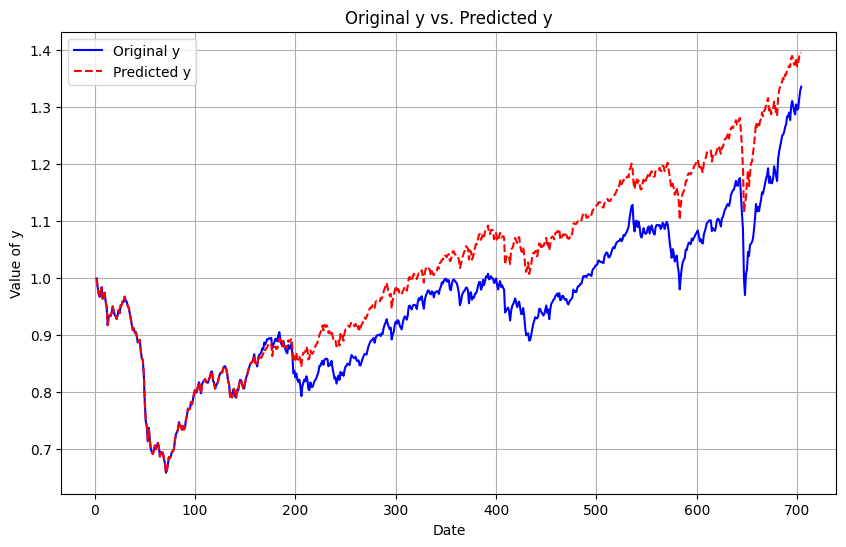

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 5836.641296812692 %
Upper Partial Moment: 4.906606487822393e-05
Lower Partial Moment: 8.821444963621686e-05
Semi-Deviation: 0.007008952201912594
Value at Risk (VaR): -0.012100875950769542
Conditional Value at Risk (CVaR): -0.01952398857131488
Downside Deviation: 0.007008952201912594
Lower Partial Standard Deviation (LPSD): 0.007008952201912594
Omega Ratio: -1.135980751478981
Sortino Ratio: 0.13501125337249453
Conditional Drawdown at Risk (CDaR): 0.006252122732922112


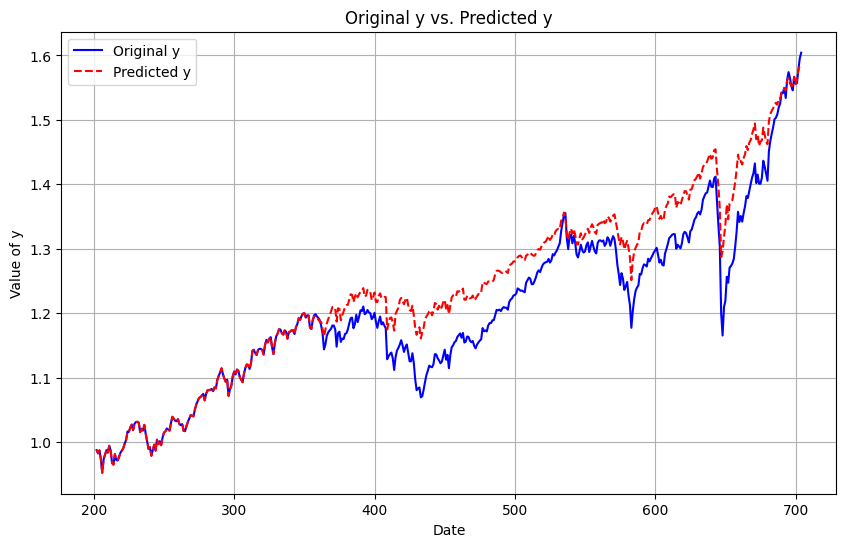

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 3314.357076933465 %
Upper Partial Moment: 6.424211641970736e-05
Lower Partial Moment: 0.000158158870410404
Semi-Deviation: 0.009375574954608298
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.025608250866227304
Downside Deviation: 0.009375574954608298
Lower Partial Standard Deviation (LPSD): 0.009375574954608298
Omega Ratio: -1.3713251140597165
Sortino Ratio: 0.1060063978109262
Conditional Drawdown at Risk (CDaR): 0.008381972600821694


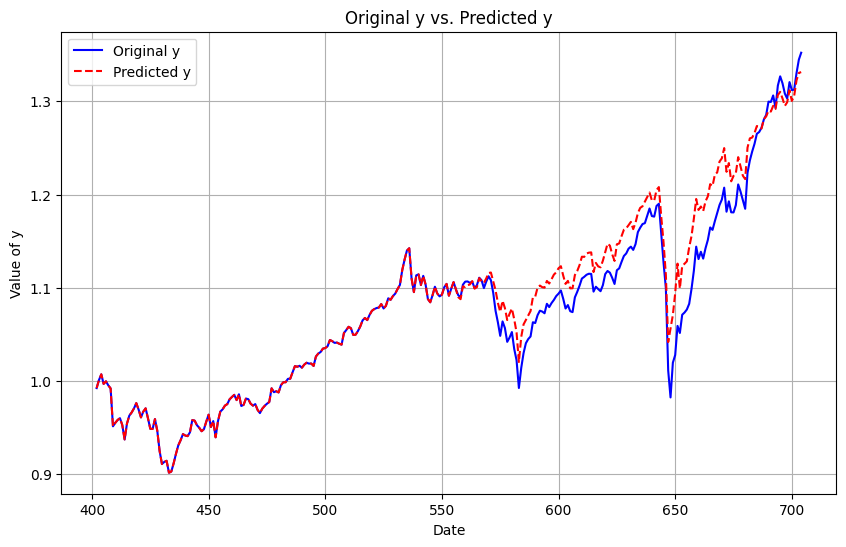

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


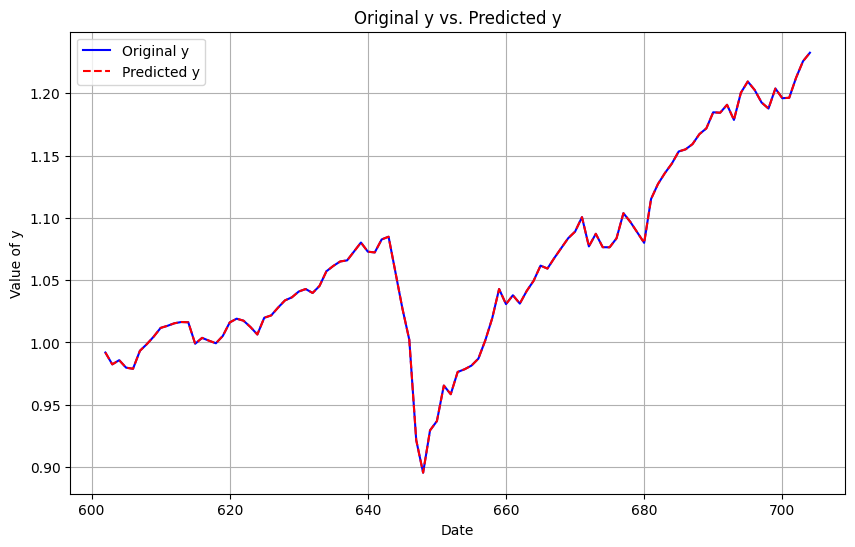

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -167.59842908998235 %
Upper Partial Moment: 2.5894913433816212e-05
Lower Partial Moment: 6.624349690685815e-05
Semi-Deviation: 0.006876757031690766
Value at Risk (VaR): -0.009343386163211613
Conditional Value at Risk (CVaR): -0.01883828630116859
Downside Deviation: 0.006876757031690766
Lower Partial Standard Deviation (LPSD): 0.006876757031690766
Omega Ratio: -1.3607764221844998
Sortino Ratio: -0.0003384229549902865
Conditional Drawdown at Risk (CDaR): 0.004353585836290558


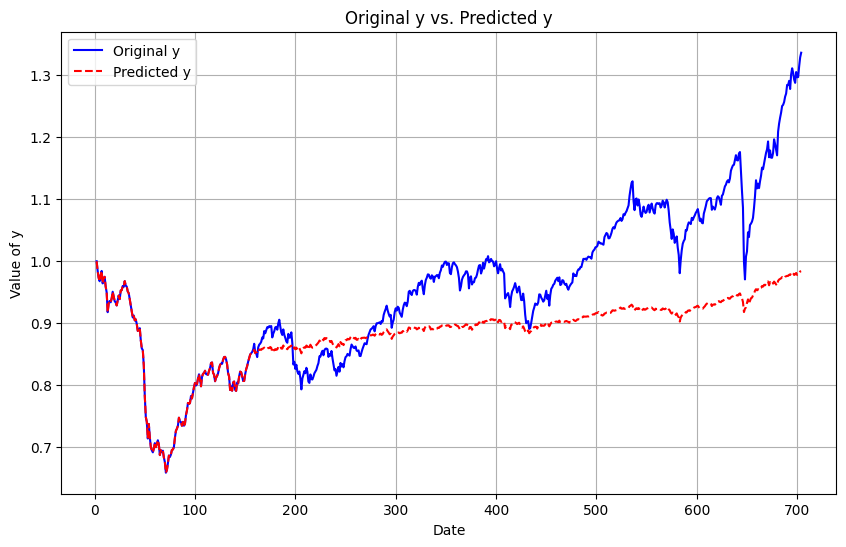

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 4310.163862482271 %
Upper Partial Moment: 3.08167408060076e-05
Lower Partial Moment: 4.115445916436092e-05
Semi-Deviation: 0.004602316200180606
Value at Risk (VaR): -0.008956588338529102
Conditional Value at Risk (CVaR): -0.013937098167694043
Downside Deviation: 0.004602316200180606
Lower Partial Standard Deviation (LPSD): 0.004602316200180606
Omega Ratio: -1.052033926895202
Sortino Ratio: 0.15861683982849614
Conditional Drawdown at Risk (CDaR): 0.004469132439066453


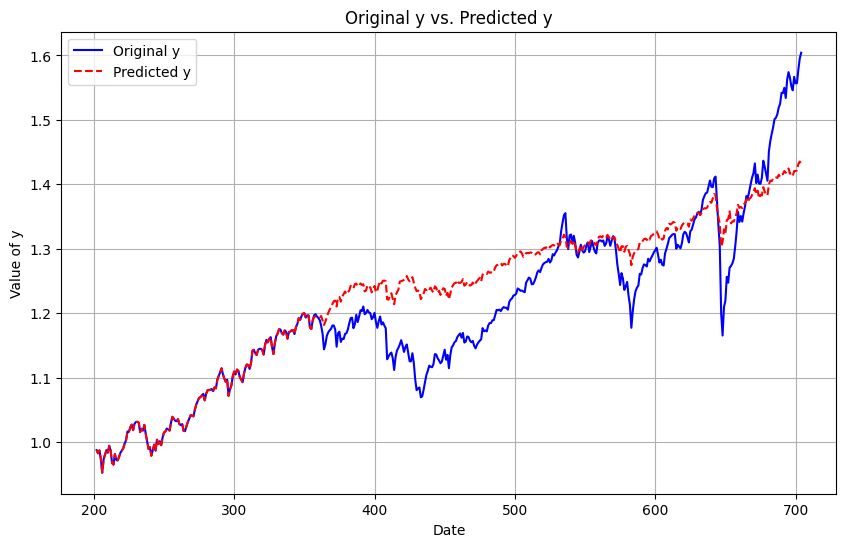

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 1794.4191632486727 %
Upper Partial Moment: 3.189895113358114e-05
Lower Partial Moment: 7.159243064095743e-05
Semi-Deviation: 0.0063742413860372734
Value at Risk (VaR): -0.01181532083063866
Conditional Value at Risk (CVaR): -0.017935675631377677
Downside Deviation: 0.0063742413860372734
Lower Partial Standard Deviation (LPSD): 0.0063742413860372734
Omega Ratio: -1.272539617683923
Sortino Ratio: 0.08916690657750394
Conditional Drawdown at Risk (CDaR): 0.005564303855244342


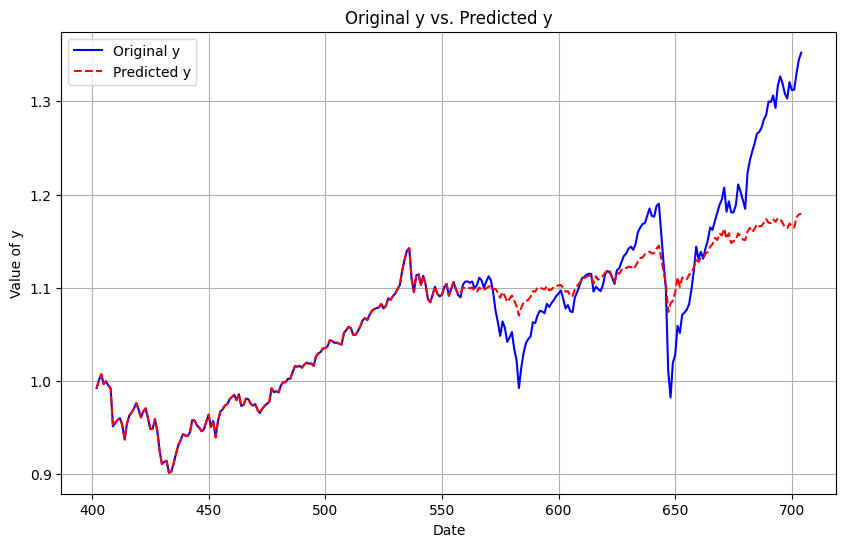

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


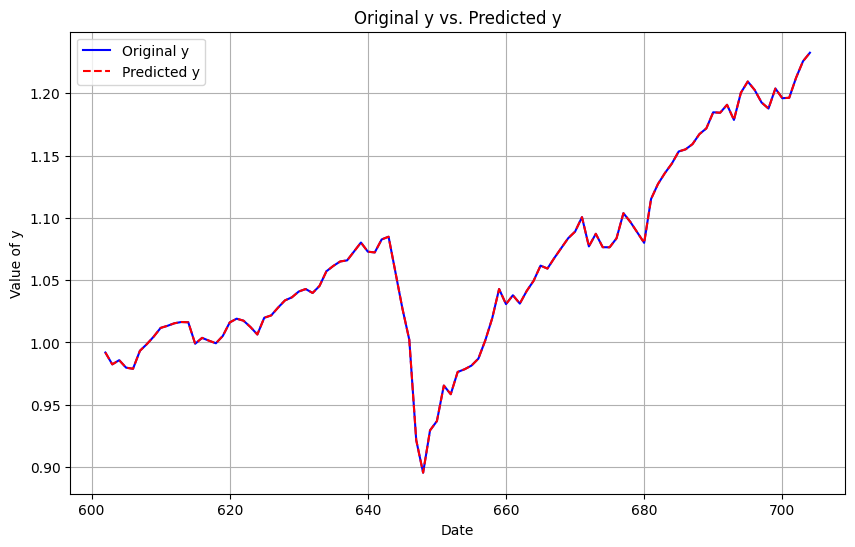

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 573.6061491574196 %
Upper Partial Moment: 2.9713234277499806e-05
Lower Partial Moment: 8.074969918333255e-05
Semi-Deviation: 0.007246996074395896
Value at Risk (VaR): -0.010421562399833802
Conditional Value at Risk (CVaR): -0.02028250134958173
Downside Deviation: 0.007246996074395896
Lower Partial Standard Deviation (LPSD): 0.007246996074395896
Omega Ratio: -1.3986321491286833
Sortino Ratio: 0.014458342123739835
Conditional Drawdown at Risk (CDaR): 0.005313261435410742


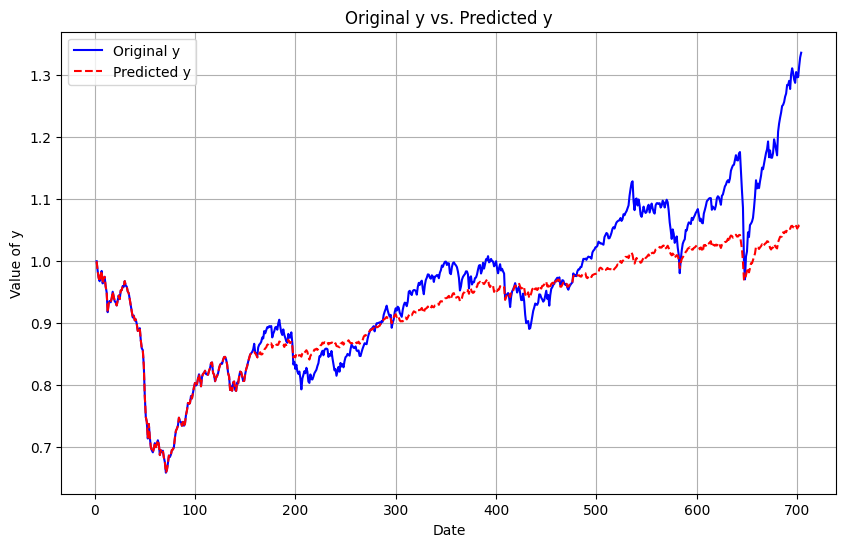

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 941.7246858964212 %
Upper Partial Moment: 3.572738927550134e-05
Lower Partial Moment: 2.7851261484483387e-05
Semi-Deviation: 0.0037377697620604162
Value at Risk (VaR): -0.008425631146720989
Conditional Value at Risk (CVaR): -0.0125883185354315
Downside Deviation: 0.0037377697620604162
Lower Partial Standard Deviation (LPSD): 0.0037377697620604162
Omega Ratio: -0.8749712620784438
Sortino Ratio: 0.05210656458467744
Conditional Drawdown at Risk (CDaR): 0.003725632656383371


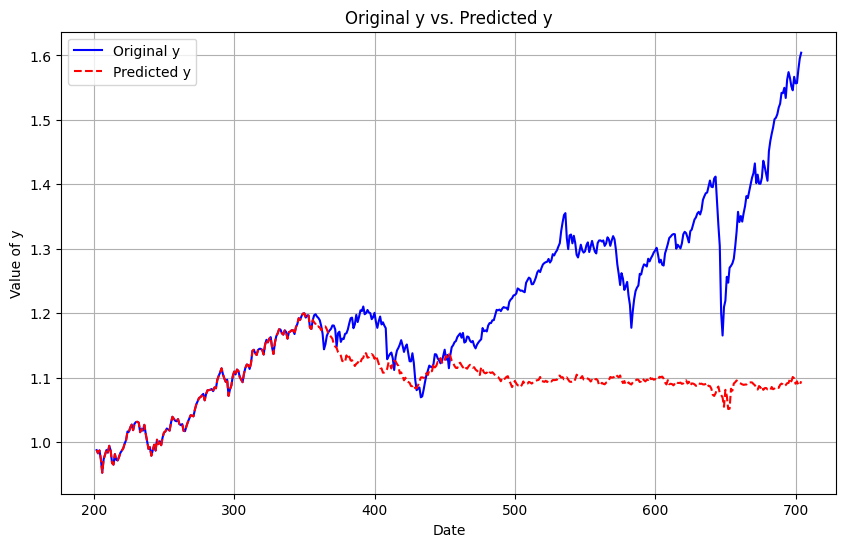

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 1601.5134594177027 %
Upper Partial Moment: 2.9390315141660013e-05
Lower Partial Moment: 6.0878997979741044e-05
Semi-Deviation: 0.005947689232707252
Value at Risk (VaR): -0.010841604410642284
Conditional Value at Risk (CVaR): -0.016770260308236182
Downside Deviation: 0.005947689232707252
Lower Partial Standard Deviation (LPSD): 0.005947689232707252
Omega Ratio: -1.2595825377545764
Sortino Ratio: 0.08594057290838442
Conditional Drawdown at Risk (CDaR): 0.005050147598920182


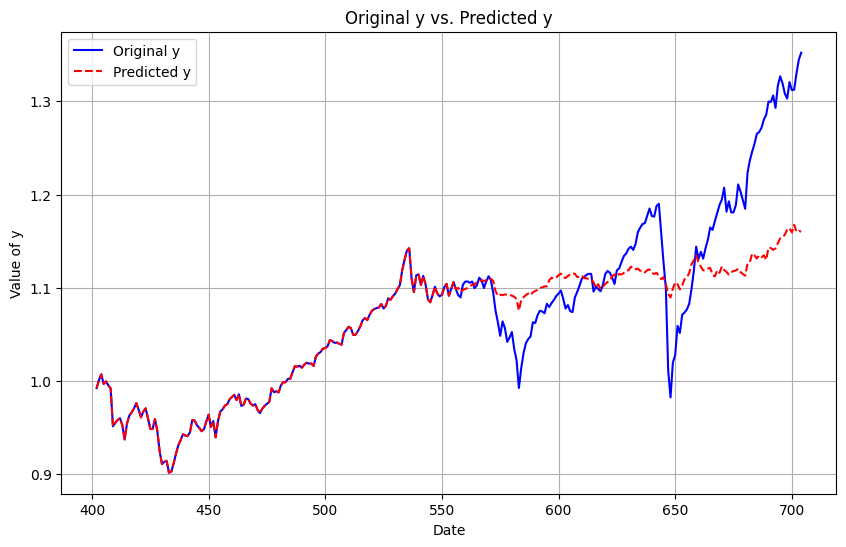

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


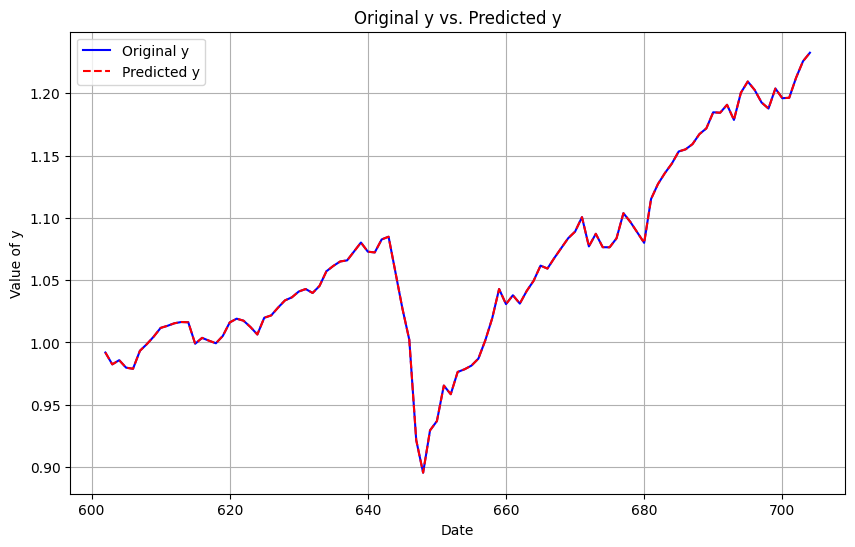

In [232]:
# Model function and plots
model_function = perform_OLS

# Backtesting Function
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

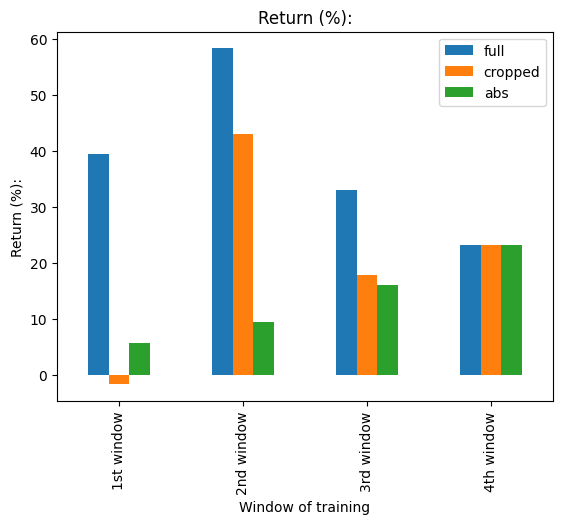

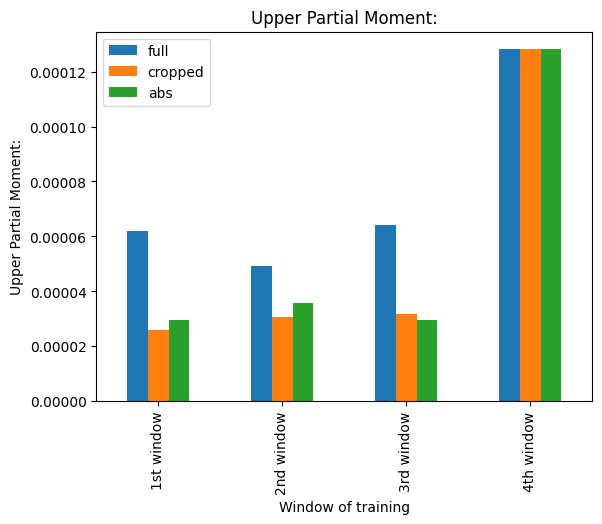

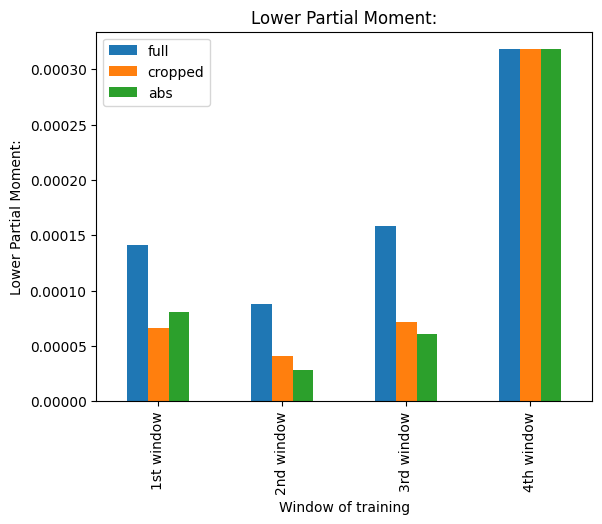

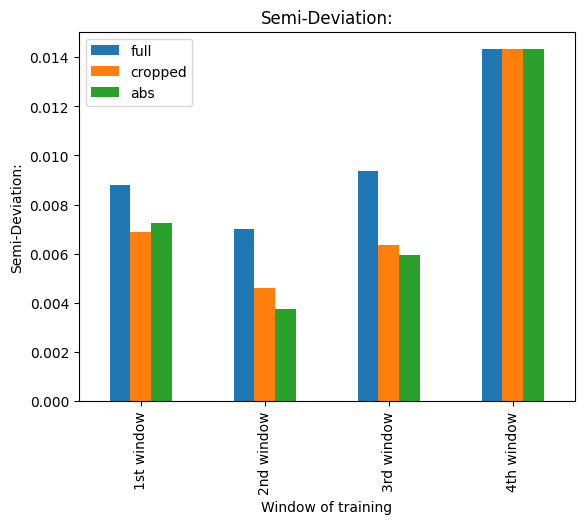

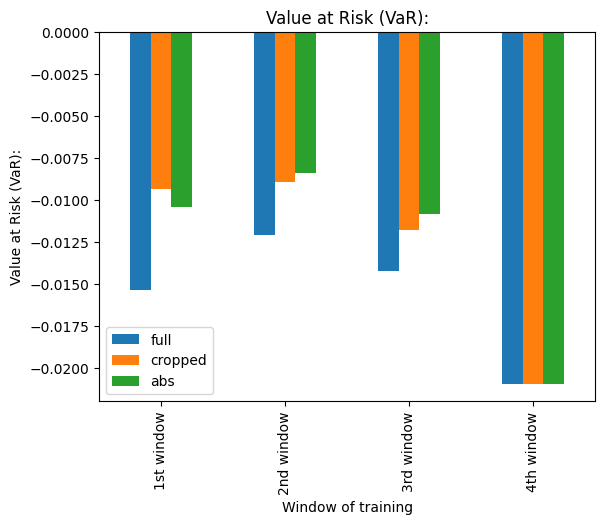

...

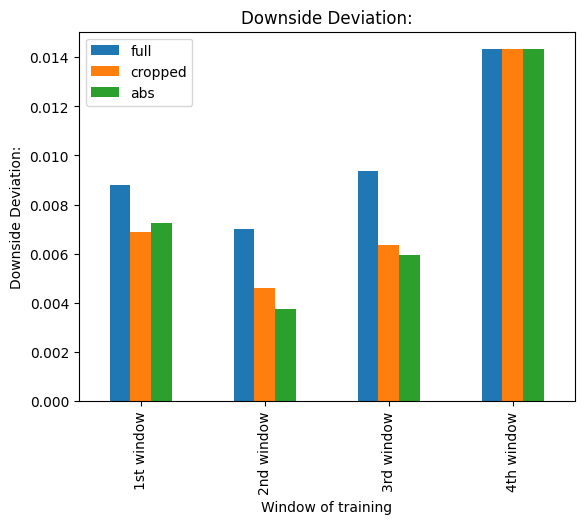

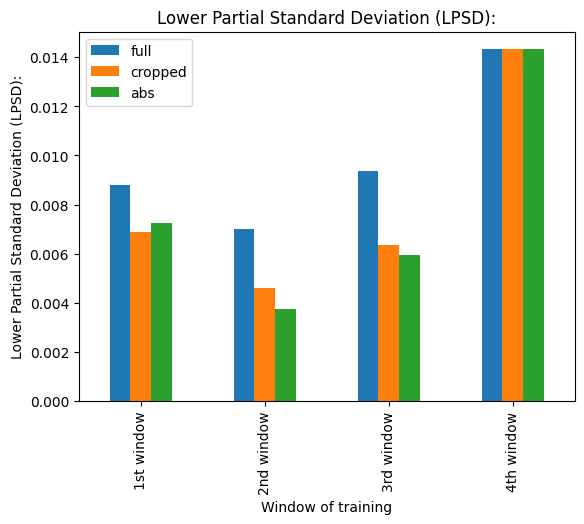

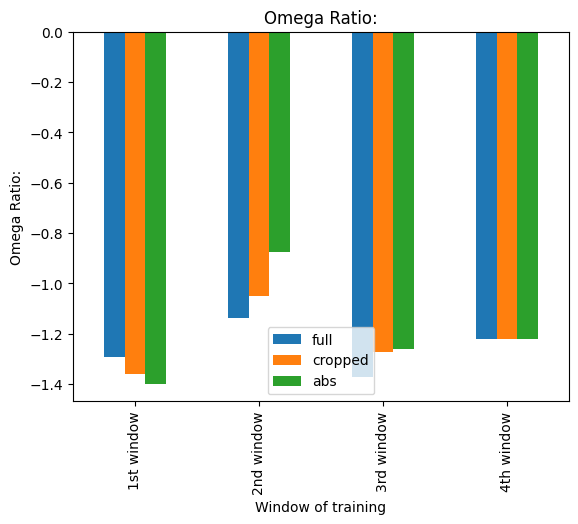

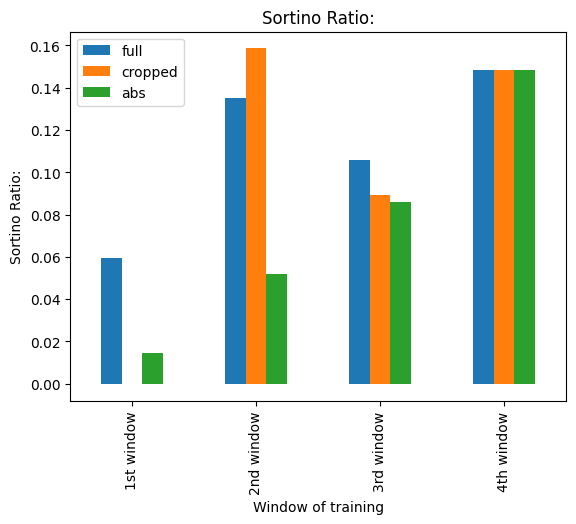

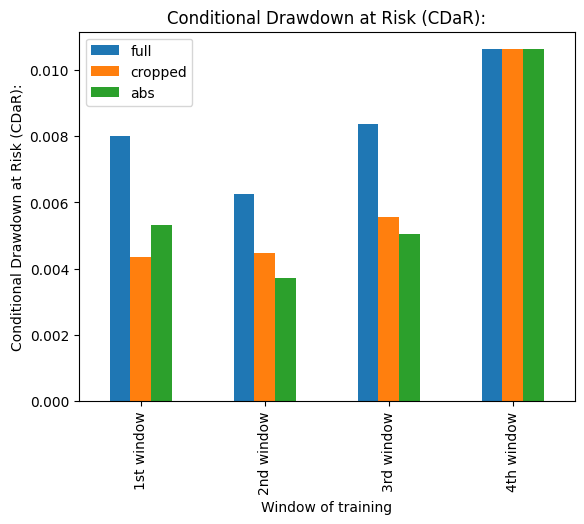

In [233]:
plot_bars_metrics(c)

#### Lasso

Metrics of target serie:
Return: 3521.9532417832243 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 3700.0541461941184 %
Upper Partial Moment: 6.016707667391787e-05
Lower Partial Moment: 0.0001359381239089791
Semi-Deviation: 0.008607988980727104
Value at Risk (VaR): -0.014952019150810996
Conditional Value at Risk (CVaR): -0.025393892658396023
Downside Deviation: 0.008607988980727104
Lower Partial Standard Deviation (LPSD): 0.008607988980727104
Omega Ratio: -1.2909563329277878
Sortin

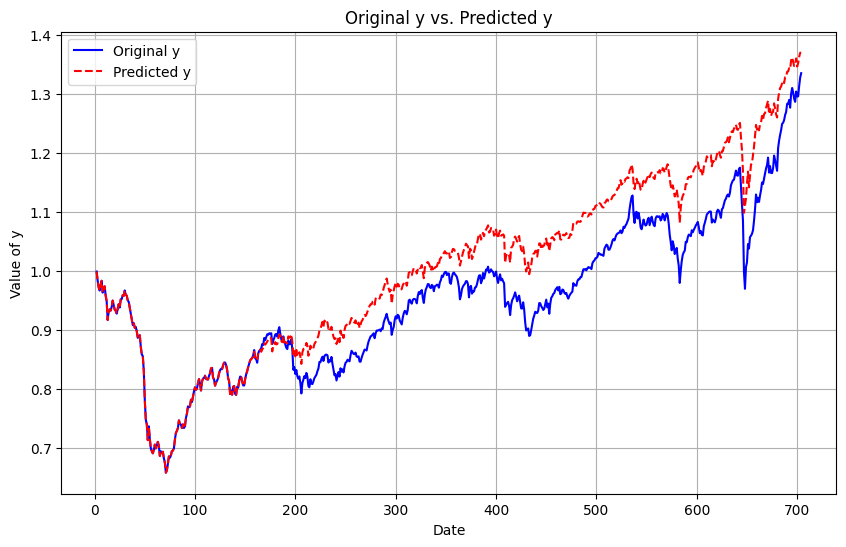

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 5840.221417826037 %
Upper Partial Moment: 4.872400749365515e-05
Lower Partial Moment: 8.49891294487749e-05
Semi-Deviation: 0.006900222458952177
Value at Risk (VaR): -0.011986752524451026
Conditional Value at Risk (CVaR): -0.019271926667625304
Downside Deviation: 0.006900222458952177
Lower Partial Standard Deviation (LPSD): 0.006900222458952177
Omega Ratio: -1.113383305202805
Sortino Ratio: 0.1371062152314265
Conditional Drawdown at Risk (CDaR): 0.006113596279257148


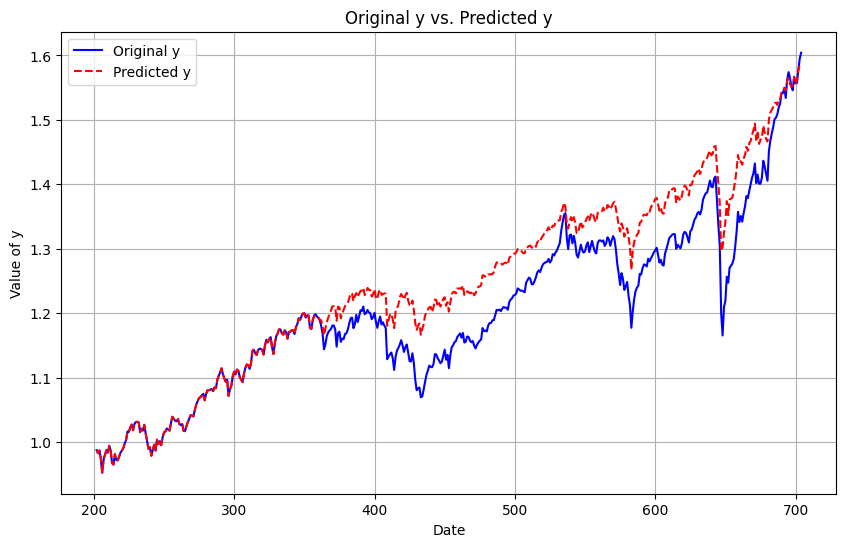

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 3208.284067748408 %
Upper Partial Moment: 6.10607203456744e-05
Lower Partial Moment: 0.0001490235630467247
Semi-Deviation: 0.009123452700800432
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.024898351907492434
Downside Deviation: 0.009123452700800432
Lower Partial Standard Deviation (LPSD): 0.009123452700800432
Omega Ratio: -1.3537158352443266
Sortino Ratio: 0.10576600815565056
Conditional Drawdown at Risk (CDaR): 0.008110867639345496


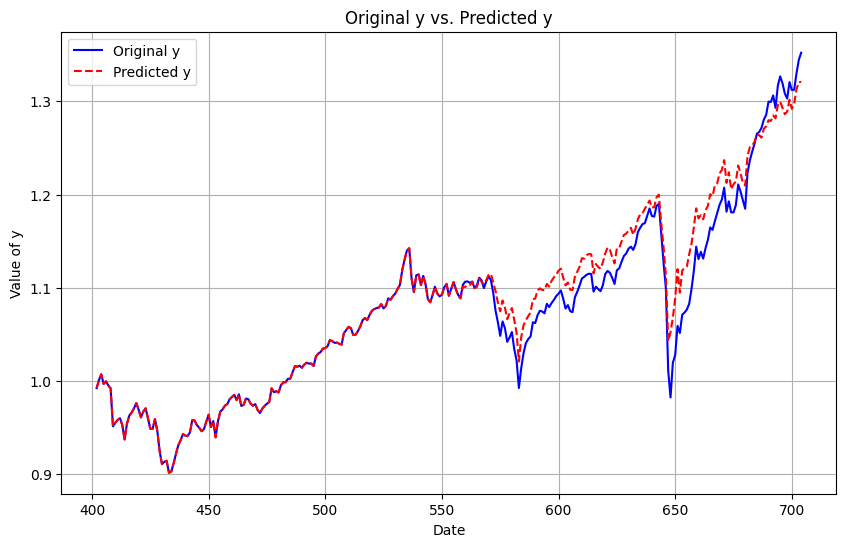

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


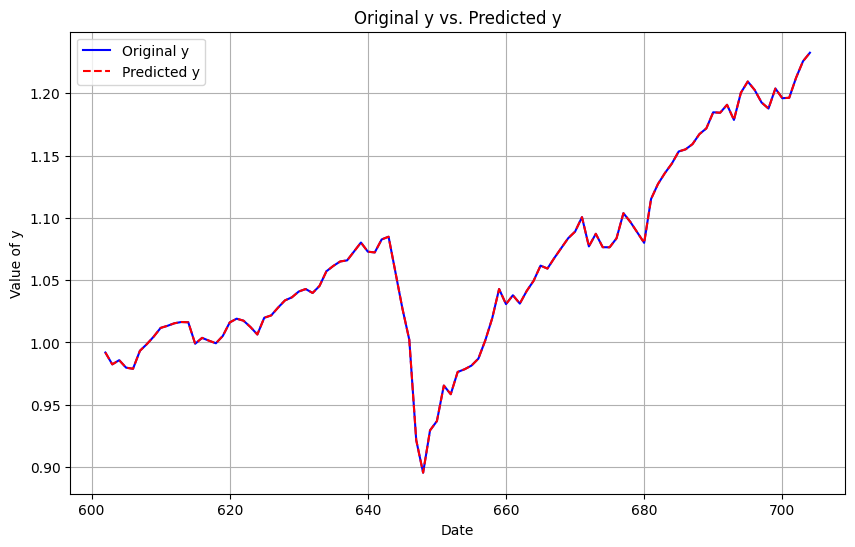

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -354.4757848995306 %
Upper Partial Moment: 2.5246187192834765e-05
Lower Partial Moment: 6.832984704788285e-05
Semi-Deviation: 0.0069653556189222966
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.018945383922143164
Downside Deviation: 0.0069653556189222966
Lower Partial Standard Deviation (LPSD): 0.0069653556189222966
Omega Ratio: -1.430395767810967
Sortino Ratio: -0.0042424387755955525
Conditional Drawdown at Risk (CDaR): 0.0044512546714191095


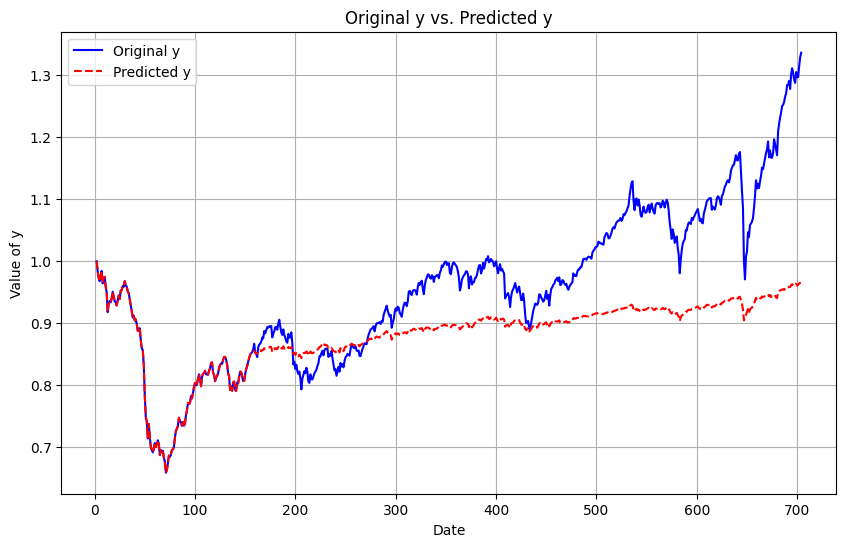

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 3529.6192216882405 %
Upper Partial Moment: 2.5811269878466848e-05
Lower Partial Moment: 3.3421082484719715e-05
Semi-Deviation: 0.00431577969333045
Value at Risk (VaR): -0.008646652077839994
Conditional Value at Risk (CVaR): -0.013024507899236874
Downside Deviation: 0.00431577969333045
Lower Partial Standard Deviation (LPSD): 0.00431577969333045
Omega Ratio: -1.0296196040347059
Sortino Ratio: 0.1426087114448639
Conditional Drawdown at Risk (CDaR): 0.0038464435682011816


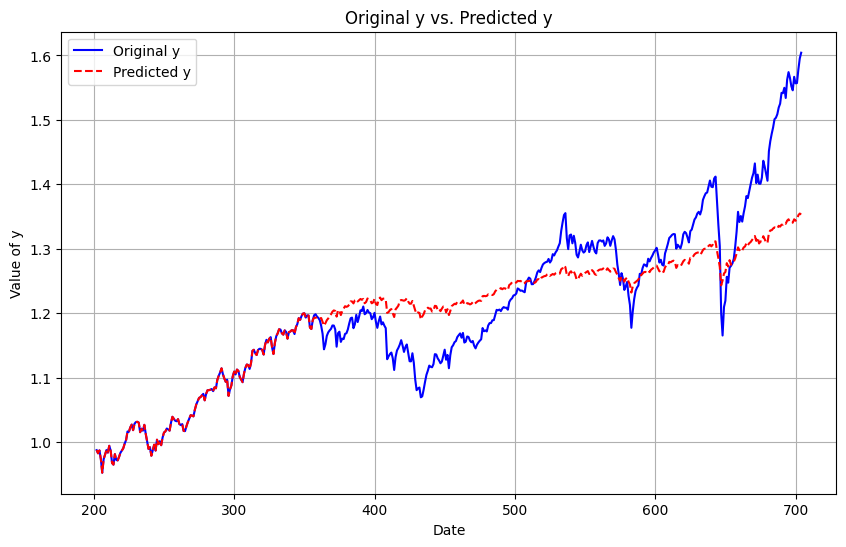

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 1685.0790229786526 %
Upper Partial Moment: 2.628168334447273e-05
Lower Partial Moment: 6.59364026148919e-05
Semi-Deviation: 0.006321650692285071
Value at Risk (VaR): -0.010841604410642284
Conditional Value at Risk (CVaR): -0.017359177477137454
Downside Deviation: 0.006321650692285071
Lower Partial Standard Deviation (LPSD): 0.006321650692285071
Omega Ratio: -1.3613325285359361
Sortino Ratio: 0.08453670442026917
Conditional Drawdown at Risk (CDaR): 0.005096384516461014


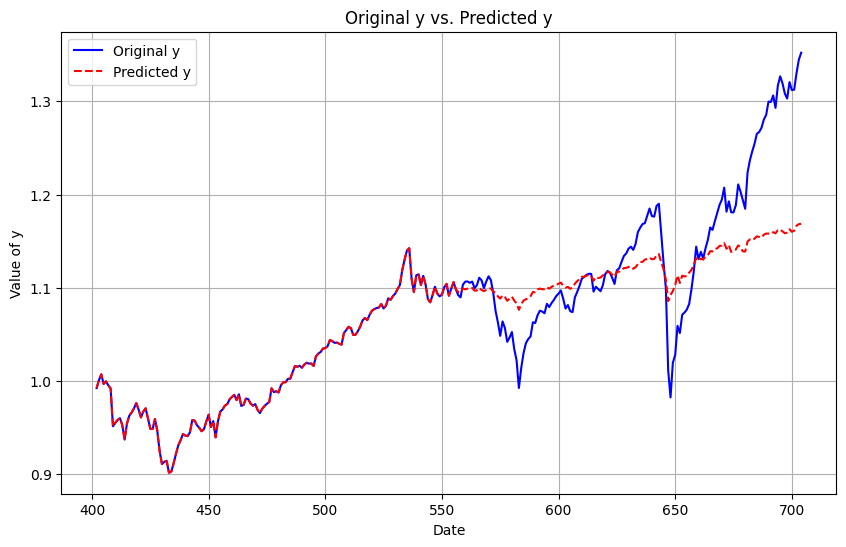

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


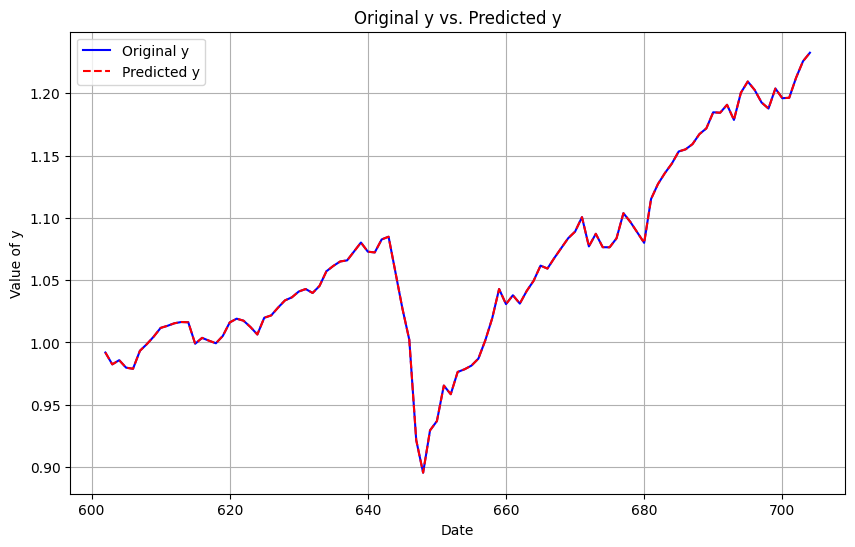

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -1489.3787837182292 %
Upper Partial Moment: 0.00010812260053488014
Lower Partial Moment: 0.0002377244480233455
Semi-Deviation: 0.010566516315292106
Value at Risk (VaR): -0.008655094189447708
Conditional Value at Risk (CVaR): -0.01852442380334916
Downside Deviation: 0.010566516315292106
Lower Partial Standard Deviation (LPSD): 0.010566516315292106
Omega Ratio: -10.156955035141946
Sortino Ratio: -0.019907864854665964
Conditional Drawdown at Risk (CDaR): 0.01122823142716658


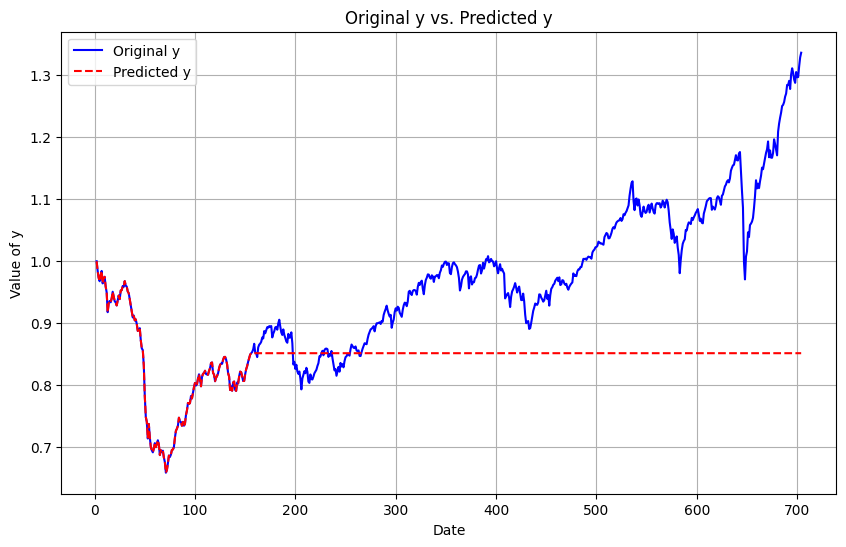

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 2265.8283559233228 %
Upper Partial Moment: 2.1490703256652066e-05
Lower Partial Moment: 2.2754438186282827e-05
Semi-Deviation: 0.0038495890725419864
Value at Risk (VaR): -0.006248457705782594
Conditional Value at Risk (CVaR): -0.011630848788959832
Downside Deviation: 0.0038495890725419864
Lower Partial Standard Deviation (LPSD): 0.0038495890725419864
Omega Ratio: -0.9880592599329745
Sortino Ratio: 0.10833429746792456
Conditional Drawdown at Risk (CDaR): 0.0028169313372619067


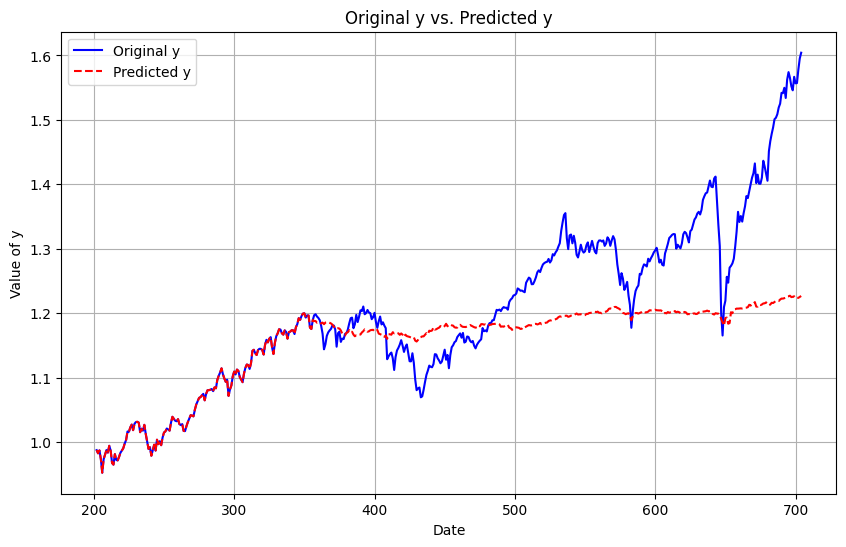

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 1033.1346971674416 %
Upper Partial Moment: 2.36541790663656e-05
Lower Partial Moment: 5.262502261389531e-05
Semi-Deviation: 0.0062155957722588966
Value at Risk (VaR): -0.010316035050022763
Conditional Value at Risk (CVaR): -0.01671084172440987
Downside Deviation: 0.0062155957722588966
Lower Partial Standard Deviation (LPSD): 0.0062155957722588966
Omega Ratio: -1.2388604589790588
Sortino Ratio: 0.05504803218187268
Conditional Drawdown at Risk (CDaR): 0.0037405068920899807


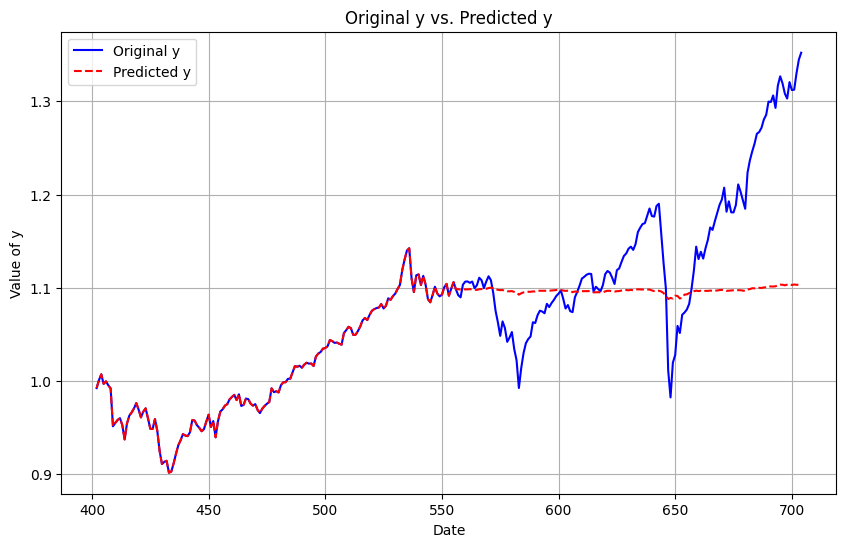

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 2326.5221620504108 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


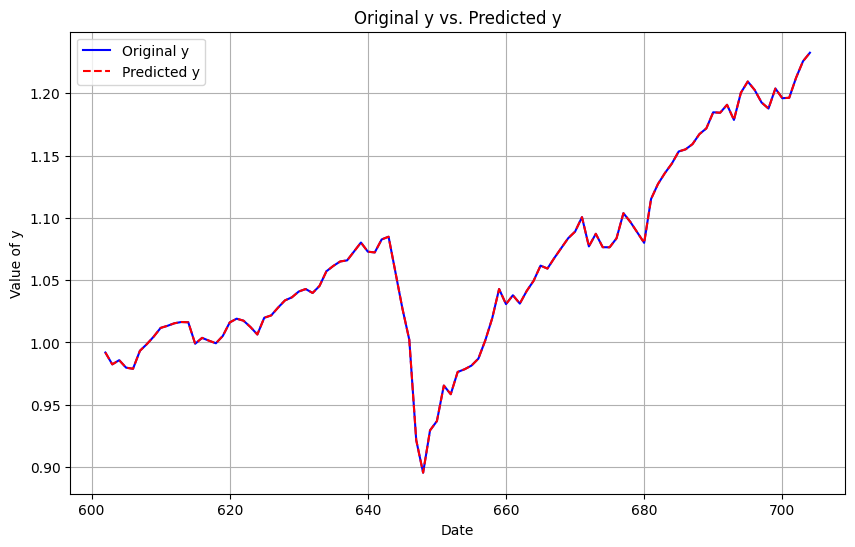

In [234]:
model_function = perform_Lasso
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

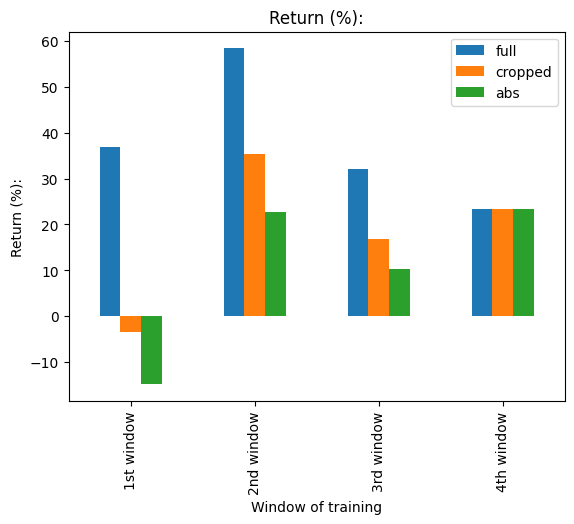

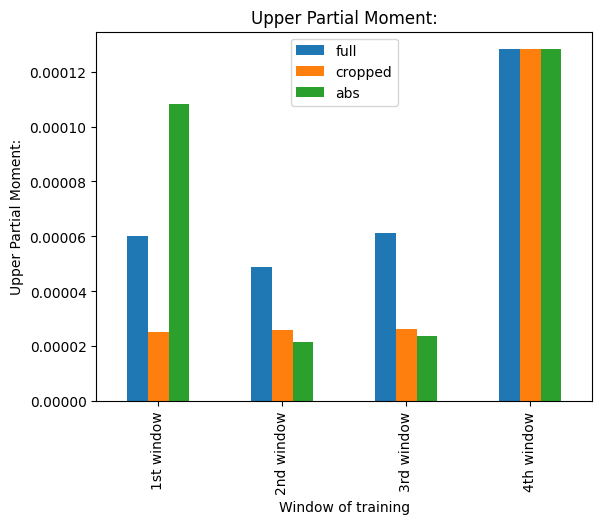

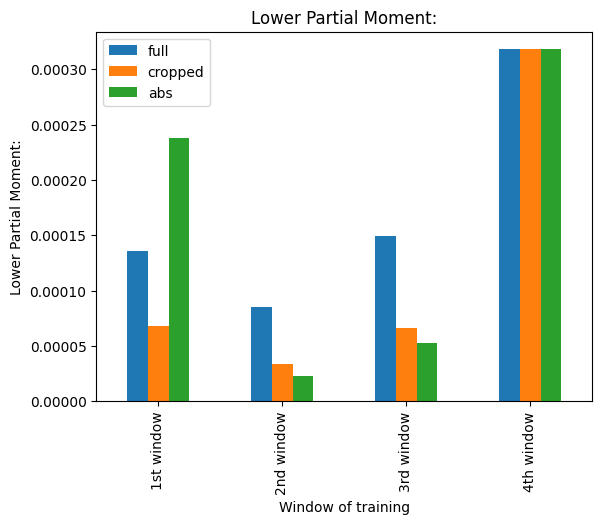

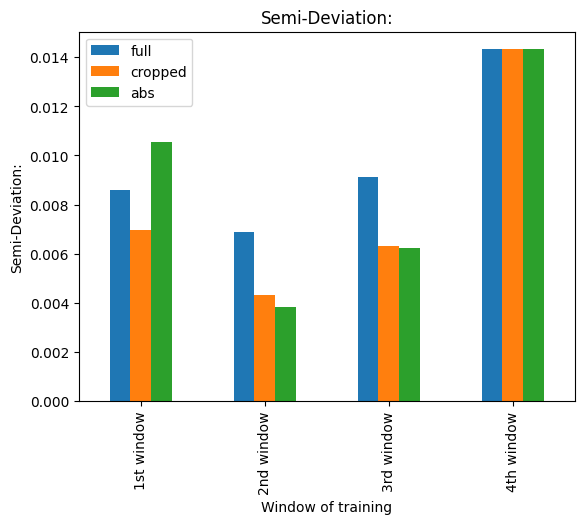

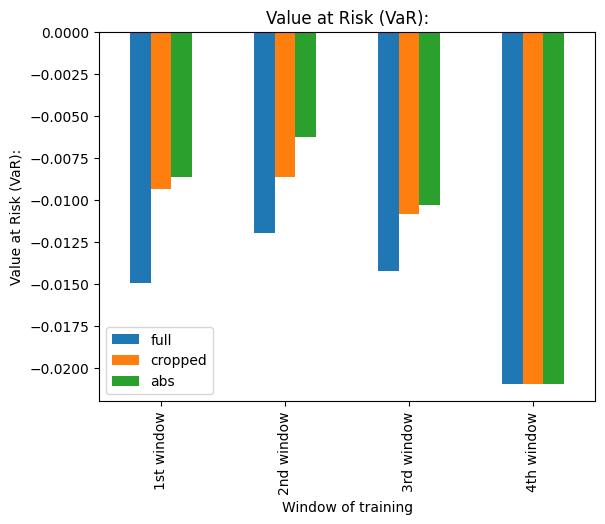

...

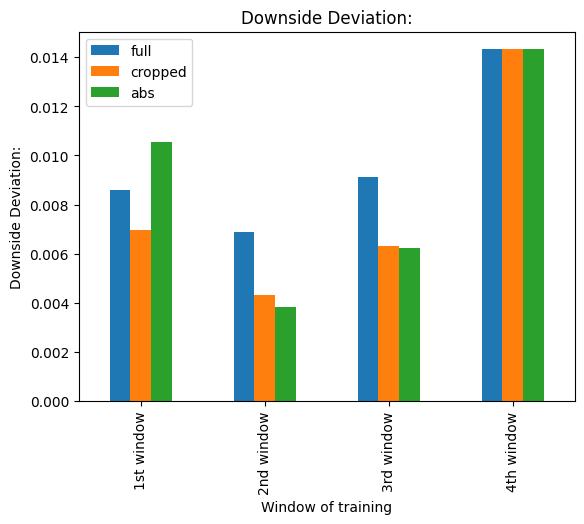

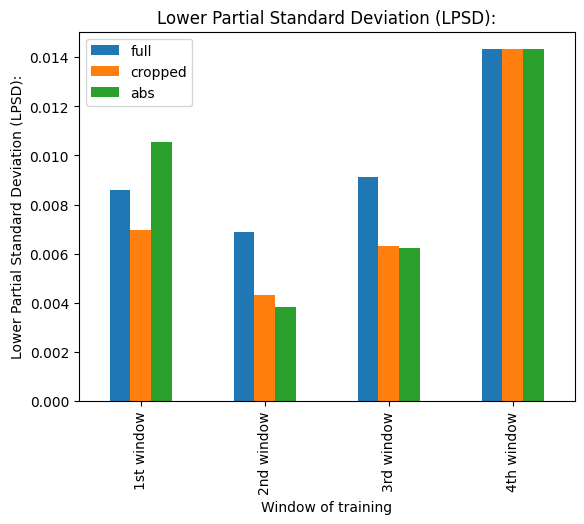

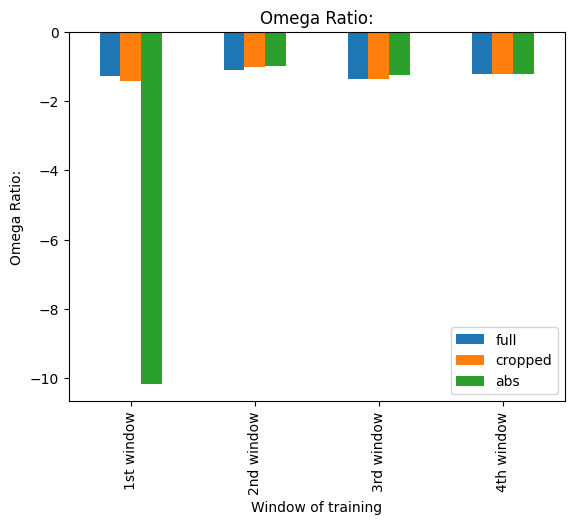

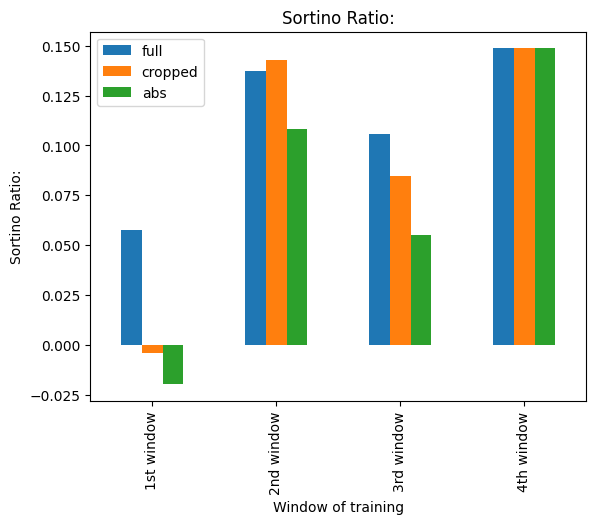

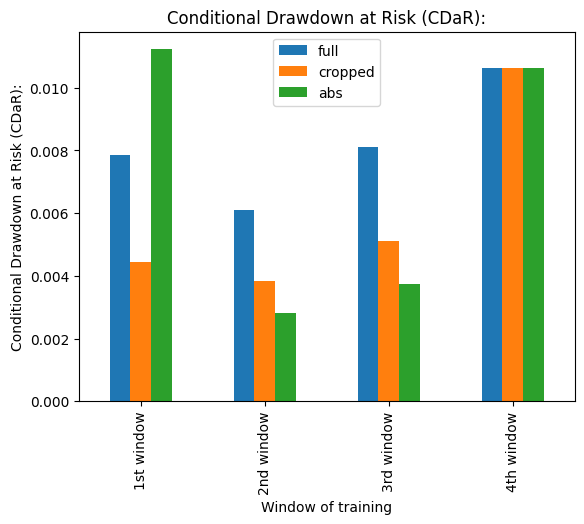

In [235]:
plot_bars_metrics(c)

#### Ridge

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.022912525385463928 %
Upper Partial Moment: 5.969716151552394e-05
Lower Partial Moment: 0.0001339512382597757
Semi-Deviation: 0.008549619507211894
Value at Risk (VaR): -0.014953192368722728
Conditional Value at Risk (CVaR): -0.02527970361769525
Downside Deviation: 0.008549619507211894
Lower Partial Standard Deviation (LPSD): 0.008549619507211894
Omega Ratio: -1.2856035241735964
Sort

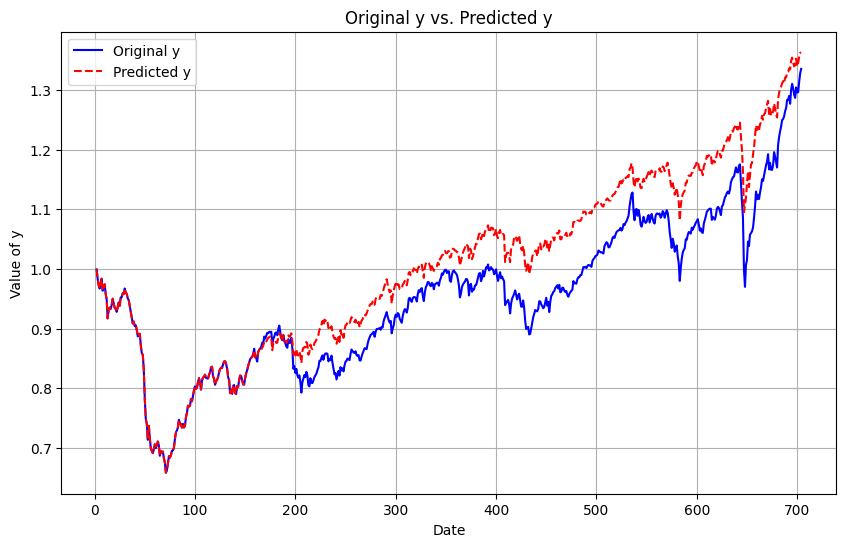

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.07407019008251914 %
Upper Partial Moment: 4.938700377169444e-05
Lower Partial Moment: 8.781576061188351e-05
Semi-Deviation: 0.007013147681932309
Value at Risk (VaR): -0.012013214602528296
Conditional Value at Risk (CVaR): -0.019517690963890503
Downside Deviation: 0.007013147681932309
Lower Partial Standard Deviation (LPSD): 0.007013147681932309
Omega Ratio: -1.123996472829596
Sortino Ratio: 0.13590251849500337
Conditional Drawdown at Risk (CDaR): 0.006215425987274806


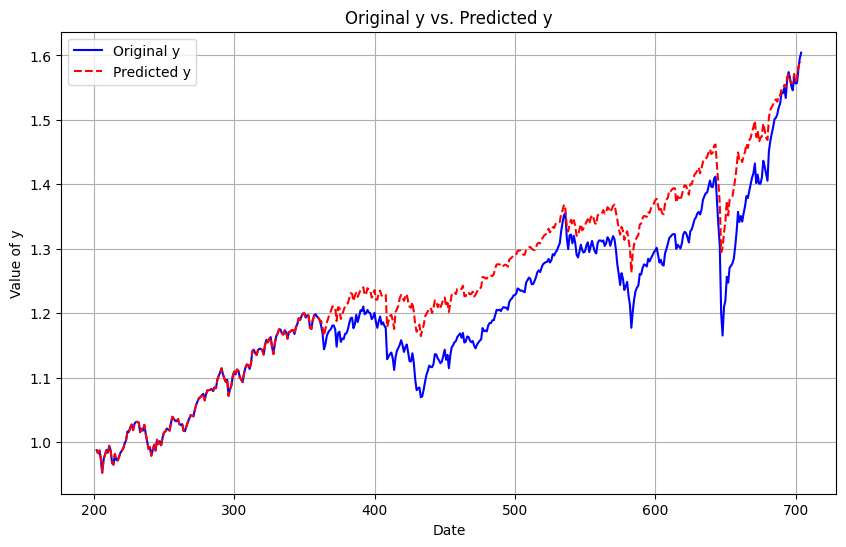

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.011438402208652427 %
Upper Partial Moment: 6.248545583857835e-05
Lower Partial Moment: 0.0001499256229322466
Semi-Deviation: 0.009101087982999405
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.02504430281885279
Downside Deviation: 0.009101087982999405
Lower Partial Standard Deviation (LPSD): 0.009101087982999405
Omega Ratio: -1.3495965405751191
Sortino Ratio: 0.10838205929546452
Conditional Drawdown at Risk (CDaR): 0.0081912038466852


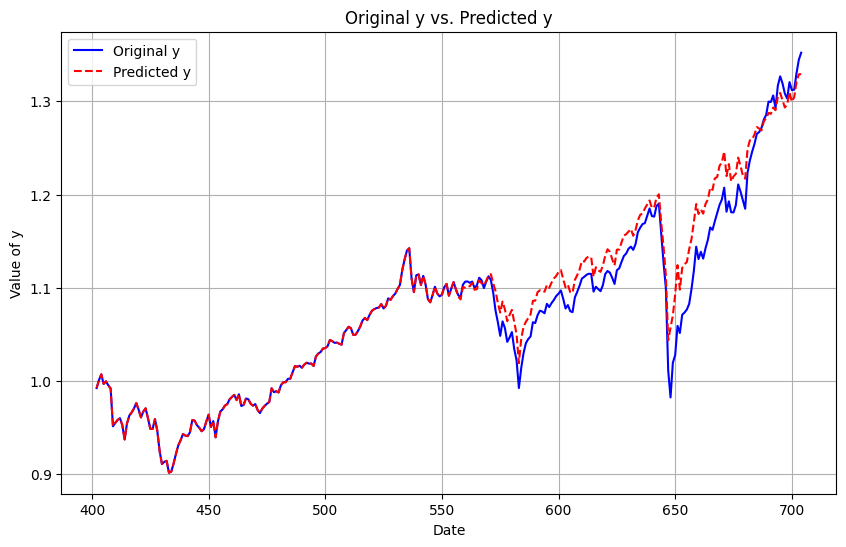

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


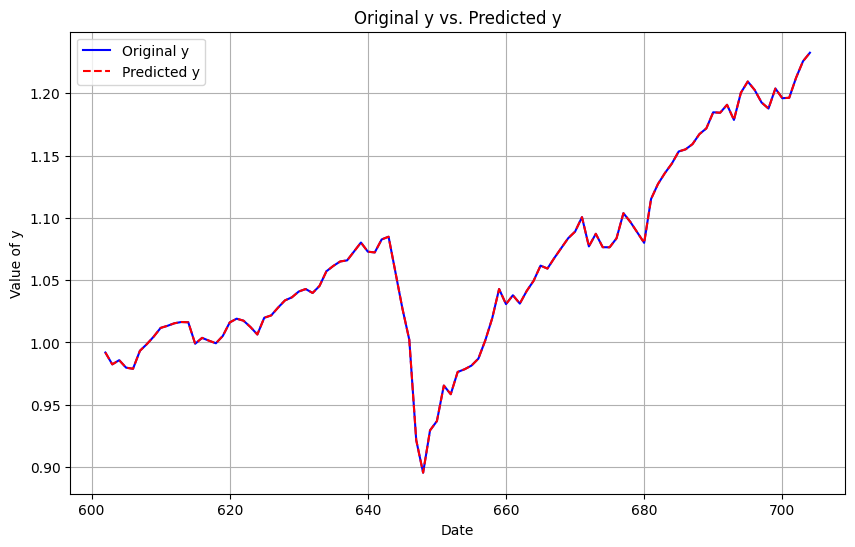

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 0.011503553127681386 %
Upper Partial Moment: 2.5246740334959148e-05
Lower Partial Moment: 6.766871934423083e-05
Semi-Deviation: 0.006947804389461046
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.01892370724064365
Downside Deviation: 0.006947804389461046
Lower Partial Standard Deviation (LPSD): 0.006947804389461046
Omega Ratio: -1.4224246831272471
Sortino Ratio: -0.0058275043824010326
Conditional Drawdown at Risk (CDaR): 0.004404172284325021


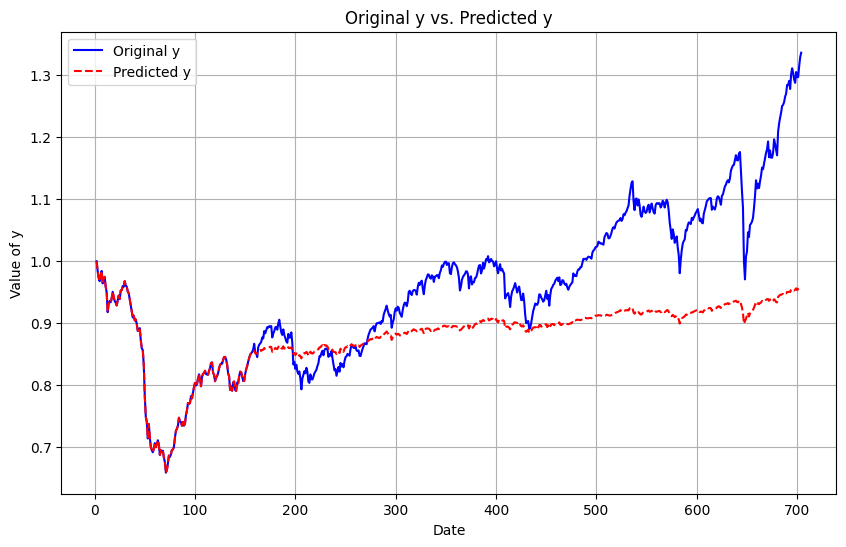

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.12631309762950235 %
Upper Partial Moment: 2.5507355557225367e-05
Lower Partial Moment: 3.3475814003952006e-05
Semi-Deviation: 0.0043071544485814425
Value at Risk (VaR): -0.008610889063219619
Conditional Value at Risk (CVaR): -0.012976163441622253
Downside Deviation: 0.0043071544485814425
Lower Partial Standard Deviation (LPSD): 0.0043071544485814425
Omega Ratio: -1.0420468394810423
Sortino Ratio: 0.14439160074071325
Conditional Drawdown at Risk (CDaR): 0.0038631896872943095


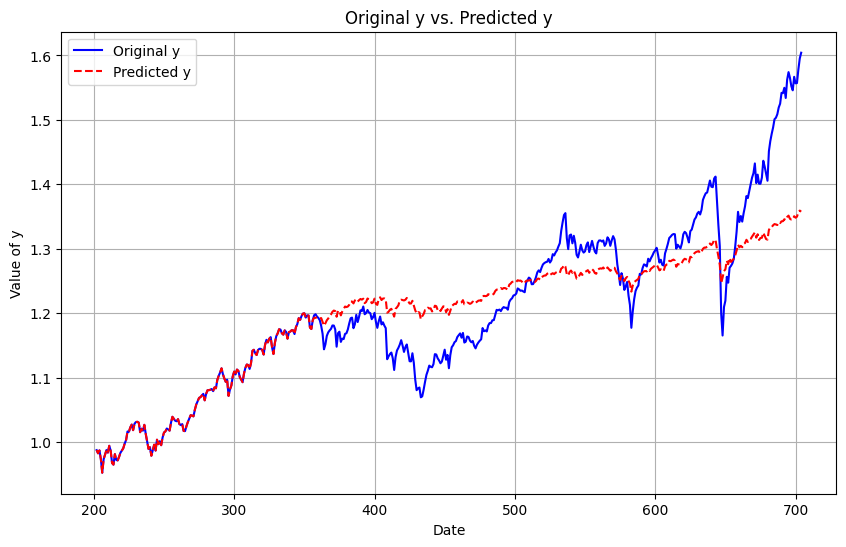

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.023732040957034323 %
Upper Partial Moment: 2.8012993575321707e-05
Lower Partial Moment: 6.534927757757774e-05
Semi-Deviation: 0.006300168356736468
Value at Risk (VaR): -0.010841604410642284
Conditional Value at Risk (CVaR): -0.017468554343318593
Downside Deviation: 0.006300168356736468
Lower Partial Standard Deviation (LPSD): 0.006300168356736468
Omega Ratio: -1.276690171155798
Sortino Ratio: 0.09032061913374576
Conditional Drawdown at Risk (CDaR): 0.005065289355442024


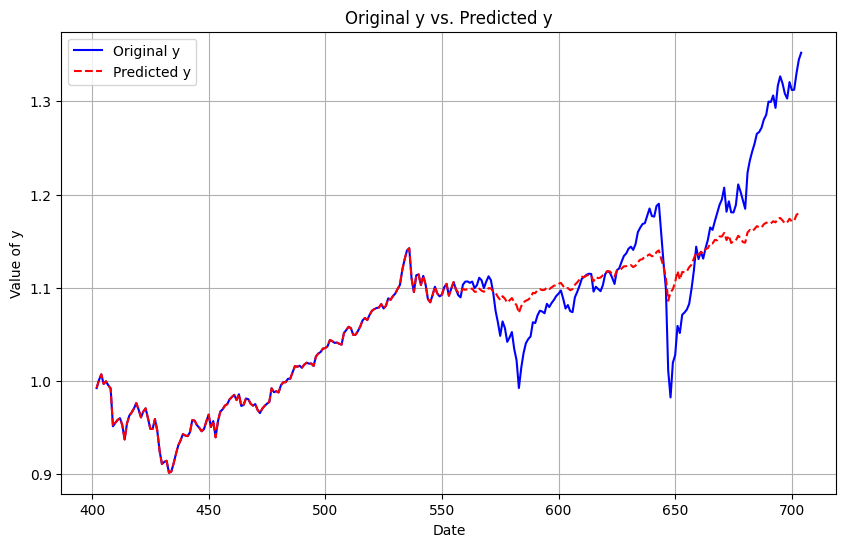

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


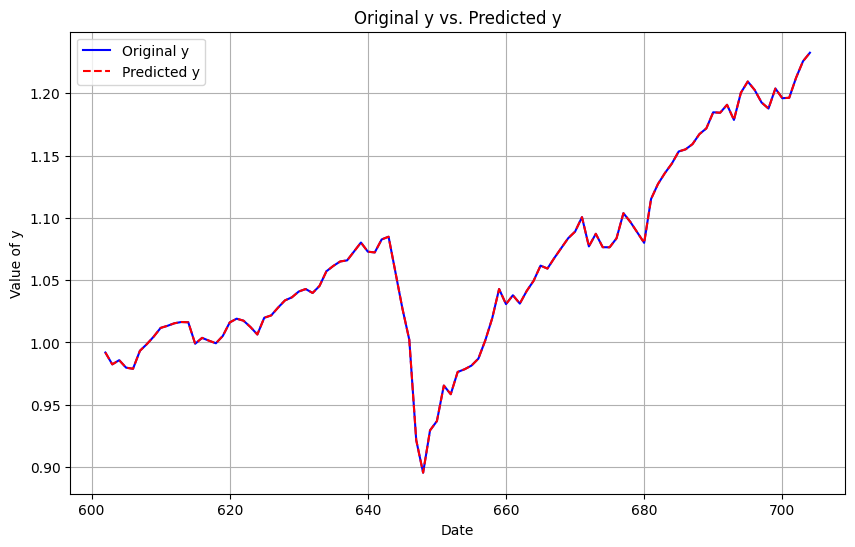

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.034672833244935156 %
Upper Partial Moment: 2.535435040715903e-05
Lower Partial Moment: 7.457270380428462e-05
Semi-Deviation: 0.007168343613245497
Value at Risk (VaR): -0.009532232327803576
Conditional Value at Risk (CVaR): -0.019096782152436695
Downside Deviation: 0.007168343613245497
Lower Partial Standard Deviation (LPSD): 0.007168343613245497
Omega Ratio: -1.4999828699058917
Sortino Ratio: 0.014654899141250493
Conditional Drawdown at Risk (CDaR): 0.004815345641459927


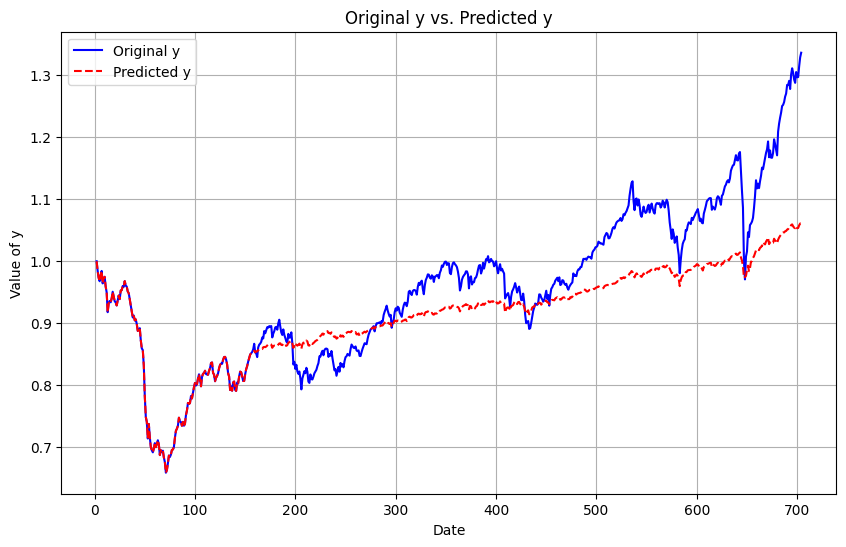

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 0.11609570016810124 %
Upper Partial Moment: 2.2278195315941154e-05
Lower Partial Moment: 2.178003668905604e-05
Semi-Deviation: 0.0038074419507932284
Value at Risk (VaR): -0.006248457705782594
Conditional Value at Risk (CVaR): -0.011641644444703149
Downside Deviation: 0.0038074419507932284
Lower Partial Standard Deviation (LPSD): 0.0038074419507932284
Omega Ratio: -0.9211260706962424
Sortino Ratio: 0.10823137685795778
Conditional Drawdown at Risk (CDaR): 0.002698781665936669


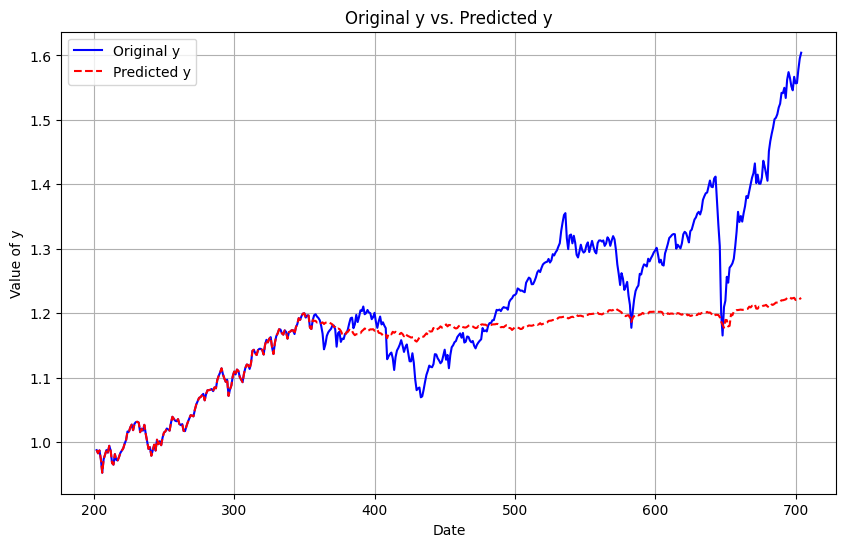

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: -0.10544472704968395 %
Upper Partial Moment: 2.6230796583800683e-05
Lower Partial Moment: 6.044424769803344e-05
Semi-Deviation: 0.0060910629894596465
Value at Risk (VaR): -0.011291626552807828
Conditional Value at Risk (CVaR): -0.016869272969708957
Downside Deviation: 0.0060910629894596465
Lower Partial Standard Deviation (LPSD): 0.0060910629894596465
Omega Ratio: -1.2969316397094504
Sortino Ratio: 0.0737879117289968
Conditional Drawdown at Risk (CDaR): 0.004831480037883666


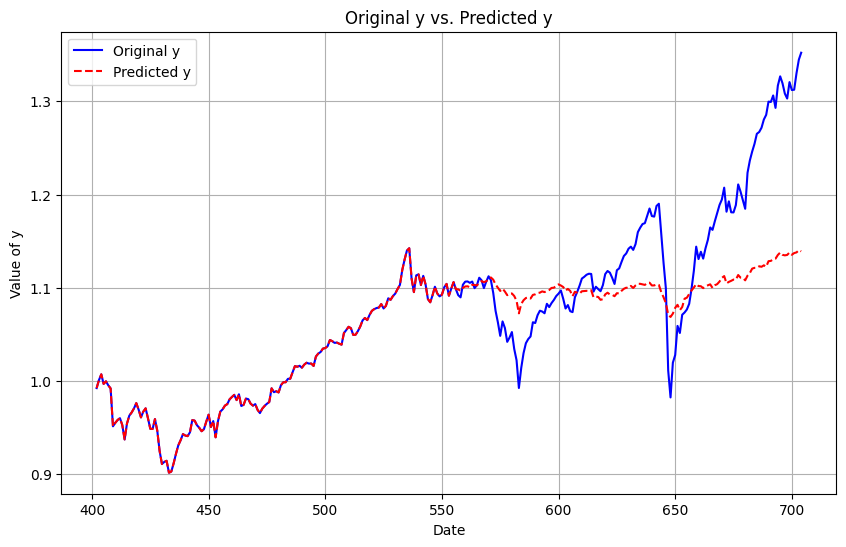

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


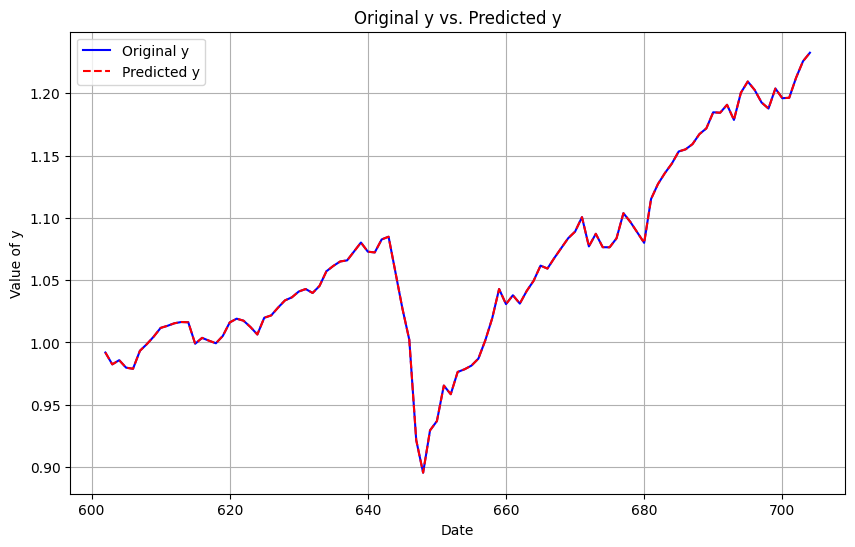

In [ ]:
model_function = perform_Ridge
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### ElasticNet

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.007861337788818229 %
Upper Partial Moment: 6.0740831940713224e-05
Lower Partial Moment: 0.00013780074209544167
Semi-Deviation: 0.008654464611248736
Value at Risk (VaR): -0.014940355113099725
Conditional Value at Risk (CVaR): -0.025521685428906163
Downside Deviation: 0.008654464611248736
Lower Partial Standard Deviation (LPSD): 0.008654464611248736
Omega Ratio: -1.2959603549897816
S

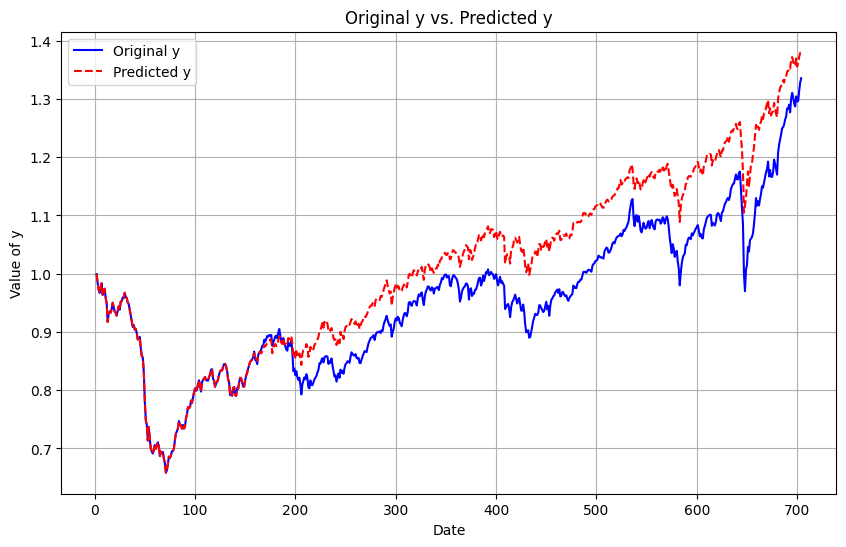

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.07590112035068594 %
Upper Partial Moment: 4.951412053443837e-05
Lower Partial Moment: 8.715945171681998e-05
Semi-Deviation: 0.006999416289577667
Value at Risk (VaR): -0.01208207813059535
Conditional Value at Risk (CVaR): -0.019495281145149812
Downside Deviation: 0.006999416289577667
Lower Partial Standard Deviation (LPSD): 0.006999416289577667
Omega Ratio: -1.1140722604422113
Sortino Ratio: 0.13628870771411922
Conditional Drawdown at Risk (CDaR): 0.006177995089186685


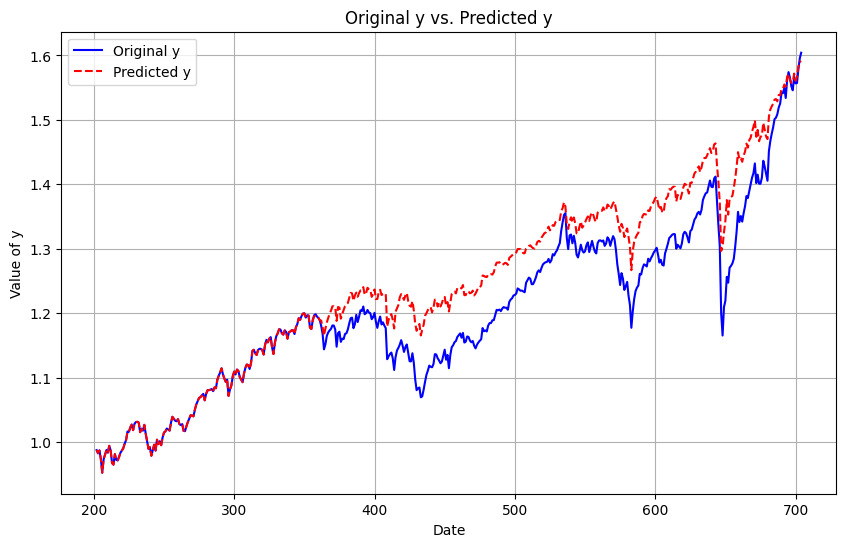

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.0068540793427347545 %
Upper Partial Moment: 6.19642440659264e-05
Lower Partial Moment: 0.00014928647839059178
Semi-Deviation: 0.009090975340222638
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.02497750154721672
Downside Deviation: 0.009090975340222638
Lower Partial Standard Deviation (LPSD): 0.009090975340222638
Omega Ratio: -1.3504446921478541
Sortino Ratio: 0.1078650242821552
Conditional Drawdown at Risk (CDaR): 0.008163372204797213


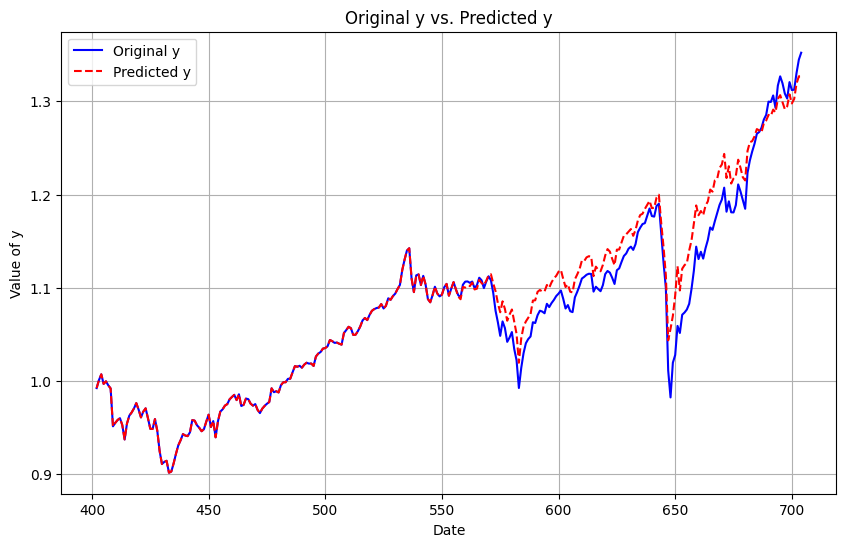

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


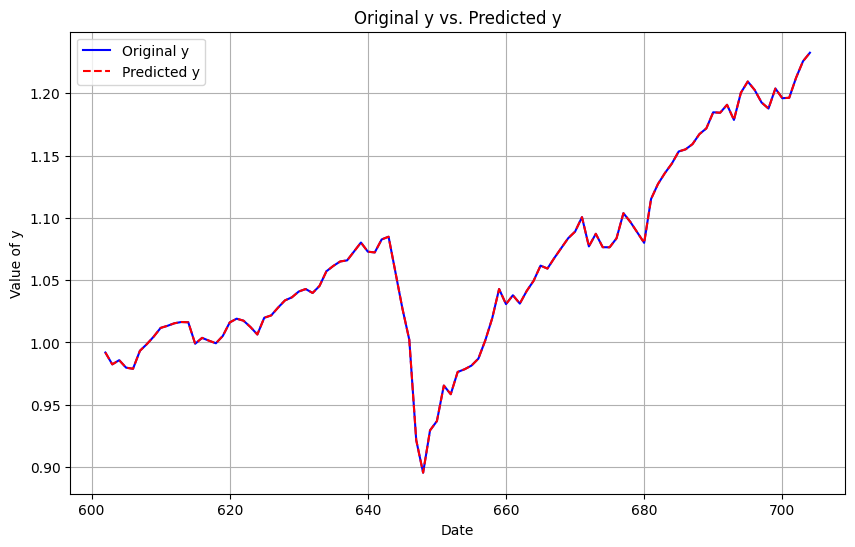

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -1.9493530247210056e-05 %
Upper Partial Moment: 2.5217764276395676e-05
Lower Partial Moment: 6.789909340527772e-05
Semi-Deviation: 0.00695455123895785
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.01892047026891184
Downside Deviation: 0.00695455123895785
Lower Partial Standard Deviation (LPSD): 0.00695455123895785
Omega Ratio: -1.4237541977949983
Sortino Ratio: -0.004546113550206803
Conditional Drawdown at Risk (CDaR): 0.004419650491836152


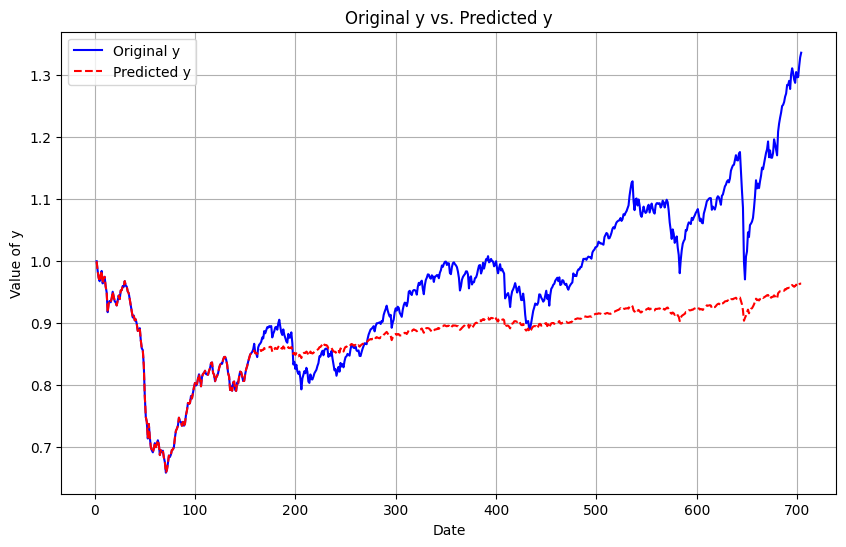

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.08989984175881562 %
Upper Partial Moment: 2.4929097956813272e-05
Lower Partial Moment: 3.3450106362727626e-05
Semi-Deviation: 0.004323697525375297
Value at Risk (VaR): -0.008653487341311609
Conditional Value at Risk (CVaR): -0.013000894760738263
Downside Deviation: 0.004323697525375297
Lower Partial Standard Deviation (LPSD): 0.004323697525375297
Omega Ratio: -1.051094405927098
Sortino Ratio: 0.13867702274253593
Conditional Drawdown at Risk (CDaR): 0.00384132087592161


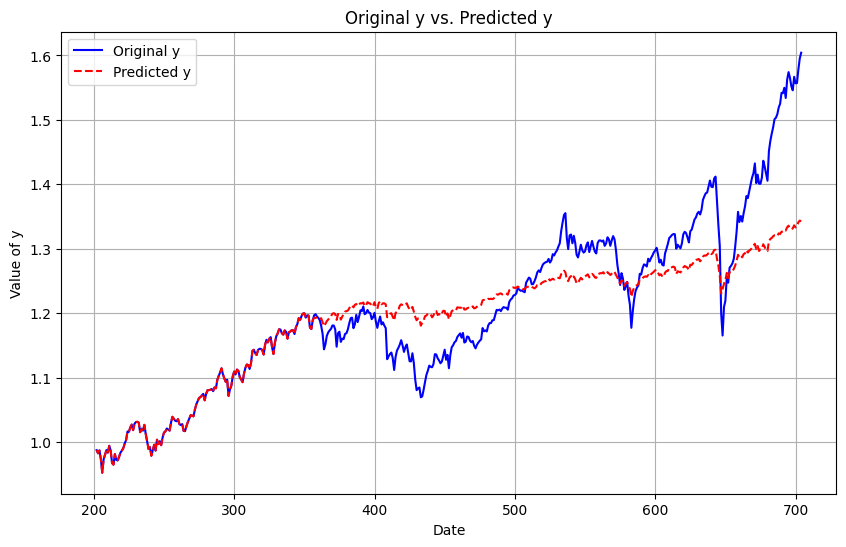

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.007932452113705893 %
Upper Partial Moment: 2.5965119491206046e-05
Lower Partial Moment: 6.601219504789353e-05
Semi-Deviation: 0.006318476606514191
Value at Risk (VaR): -0.010841604410642284
Conditional Value at Risk (CVaR): -0.01730577152667495
Downside Deviation: 0.006318476606514191
Lower Partial Standard Deviation (LPSD): 0.006318476606514191
Omega Ratio: -1.3791020024975633
Sortino Ratio: 0.08449661048027793
Conditional Drawdown at Risk (CDaR): 0.005107743965864621


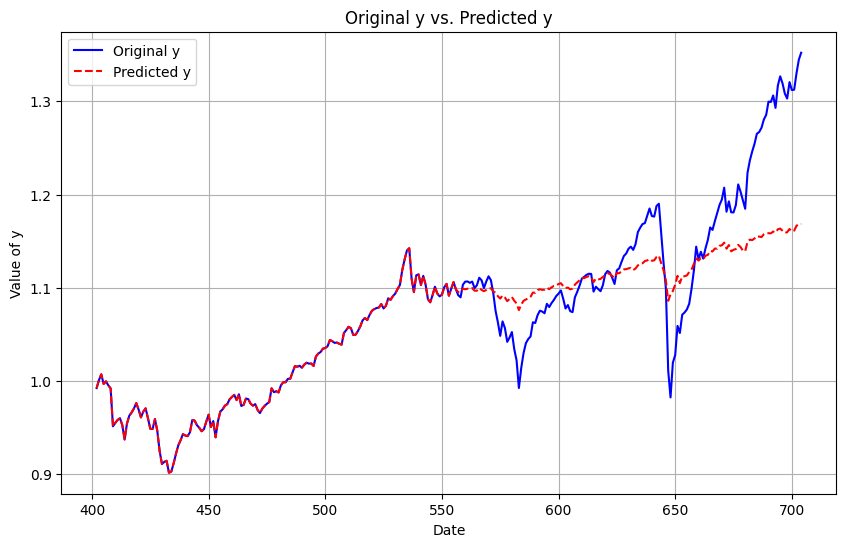

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


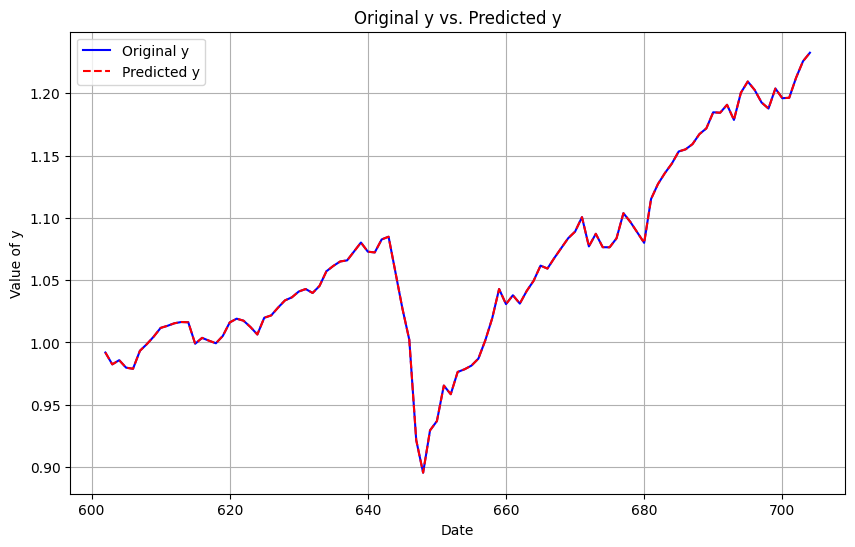

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.0 %
Upper Partial Moment: 0.00010812260053488014
Lower Partial Moment: 0.0002377244480233455
Semi-Deviation: 0.010566516315292106
Value at Risk (VaR): -0.008655094189447708
Conditional Value at Risk (CVaR): -0.01852442380334916
Downside Deviation: 0.010566516315292106
Lower Partial Standard Deviation (LPSD): 0.010566516315292106
Omega Ratio: -10.156955035141946
Sortino Ratio: -0.019907864854665964
Conditional Drawdown at Risk (CDaR): 0.01122823142716658


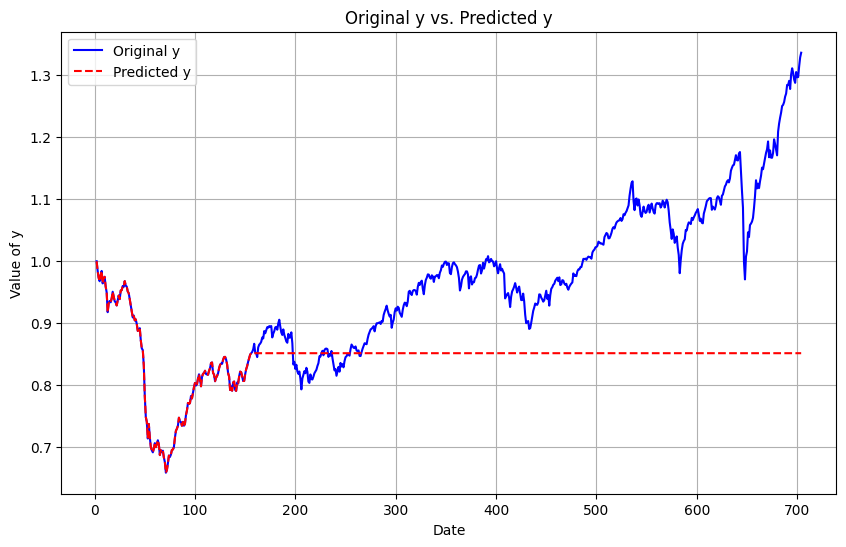

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 0.11697244913275325 %
Upper Partial Moment: 2.1794408510799727e-05
Lower Partial Moment: 2.210623955636854e-05
Semi-Deviation: 0.003826378058340736
Value at Risk (VaR): -0.006248457705782594
Conditional Value at Risk (CVaR): -0.011629681390854914
Downside Deviation: 0.003826378058340736
Lower Partial Standard Deviation (LPSD): 0.003826378058340736
Omega Ratio: -0.9496708999297769
Sortino Ratio: 0.1078102686292918
Conditional Drawdown at Risk (CDaR): 0.002732228122067615


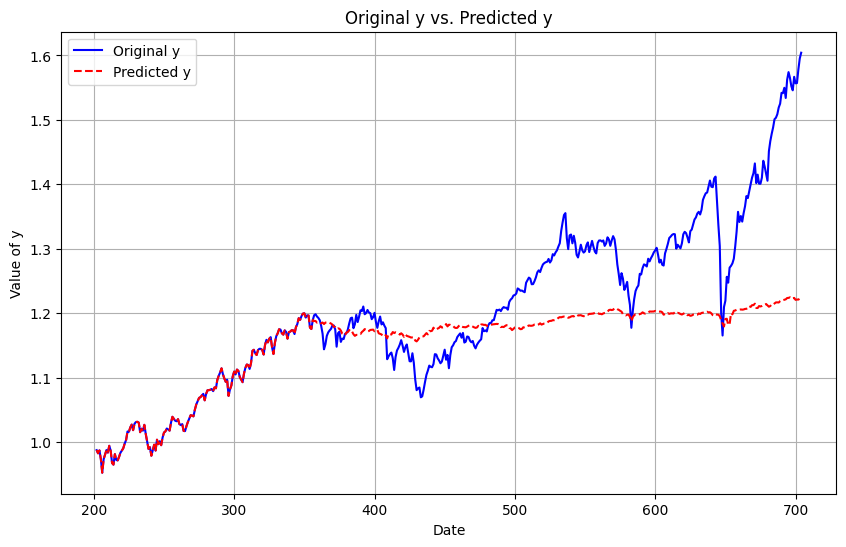

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.011632754816361605 %
Upper Partial Moment: 2.3713870494299403e-05
Lower Partial Moment: 5.2048472196574465e-05
Semi-Deviation: 0.006224526753881425
Value at Risk (VaR): -0.010316035050022763
Conditional Value at Risk (CVaR): -0.01671084172440987
Downside Deviation: 0.006224526753881425
Lower Partial Standard Deviation (LPSD): 0.006224526753881425
Omega Ratio: -1.2205187630916705
Sortino Ratio: 0.05437579889674605
Conditional Drawdown at Risk (CDaR): 0.003647429079062244


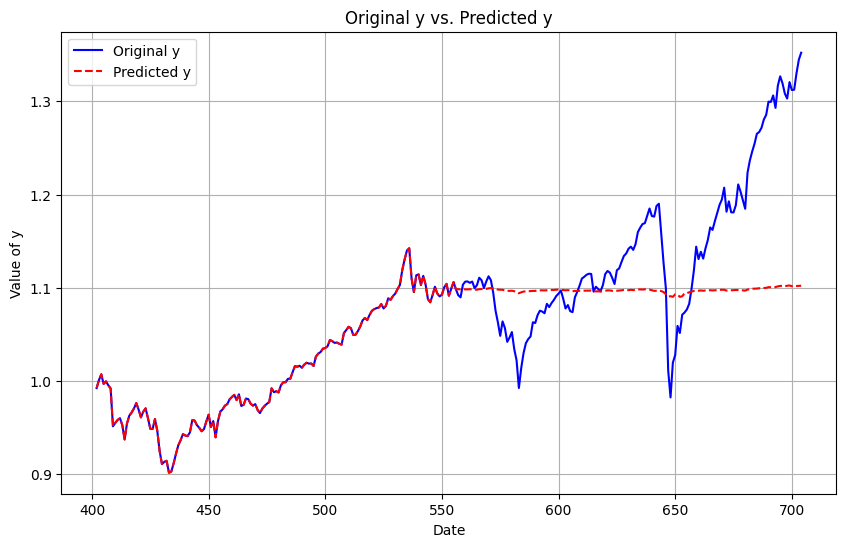

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


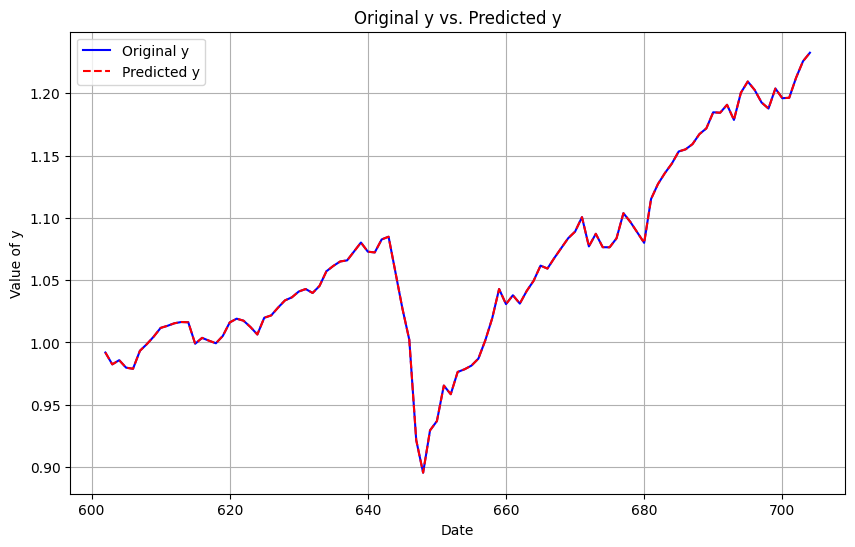

In [ ]:
model_function = perform_ElasticNet
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### ARIMA

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.006905782797538007 %
Upper Partial Moment: 6.197412984368013e-05
Lower Partial Moment: 0.0001413503670660964
Semi-Deviation: 0.008785297799066265
Value at Risk (VaR): -0.01536720406967274
Conditional Value at Risk (CVaR): -0.02587702197997306
Downside Deviation: 0.008785297799066265
Lower Partial Standard Deviation (LPSD): 0.008785297799066265
Omega Ratio: -1.2918912562714848
Sorti

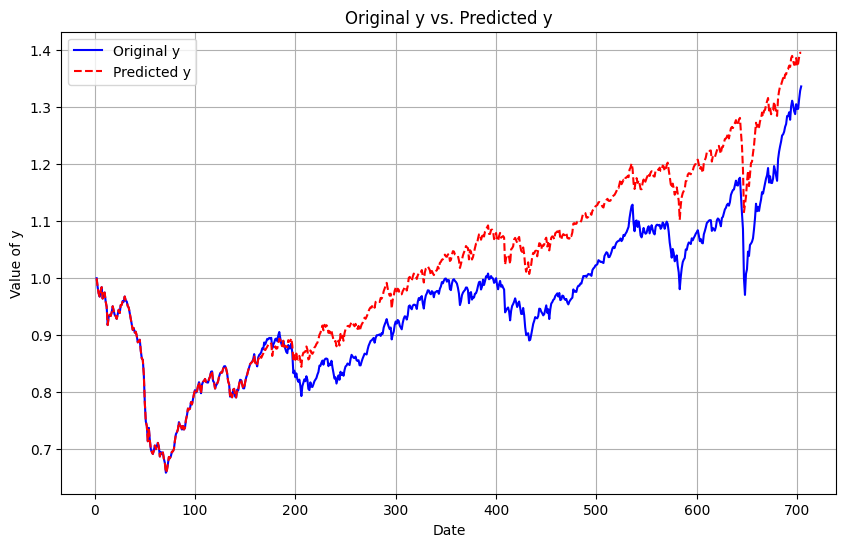

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.06525391347045882 %
Upper Partial Moment: 4.883413269326624e-05
Lower Partial Moment: 8.780721865580675e-05
Semi-Deviation: 0.006990558563533309
Value at Risk (VaR): -0.012086310456367757
Conditional Value at Risk (CVaR): -0.019485966265067784
Downside Deviation: 0.006990558563533309
Lower Partial Standard Deviation (LPSD): 0.006990558563533309
Omega Ratio: -1.1366732218106206
Sortino Ratio: 0.13481386023222516
Conditional Drawdown at Risk (CDaR): 0.006240136987728543


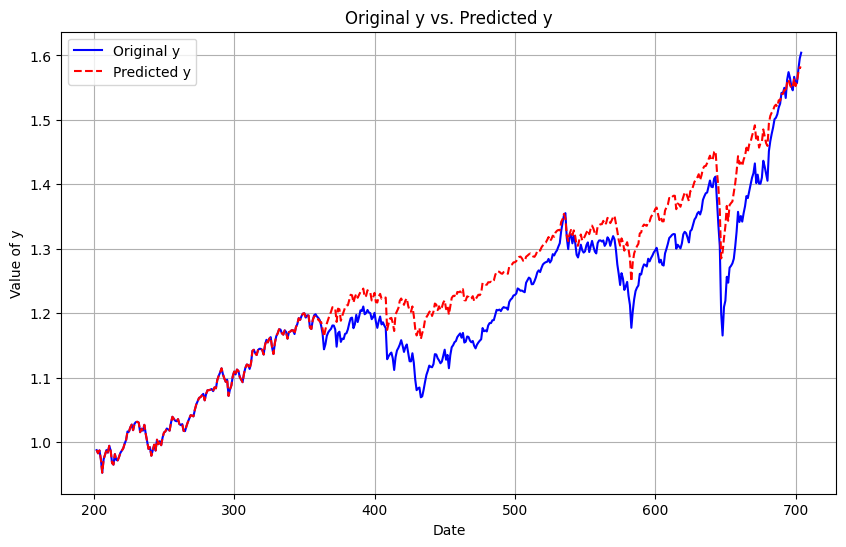

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.06567614688538322 %
Upper Partial Moment: 6.419662695680397e-05
Lower Partial Moment: 0.00015801980208804506
Semi-Deviation: 0.00937165662431645
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.025594050216190732
Downside Deviation: 0.00937165662431645
Lower Partial Standard Deviation (LPSD): 0.00937165662431645
Omega Ratio: -1.3711146688702105
Sortino Ratio: 0.10606591381915914
Conditional Drawdown at Risk (CDaR): 0.008378057901682862


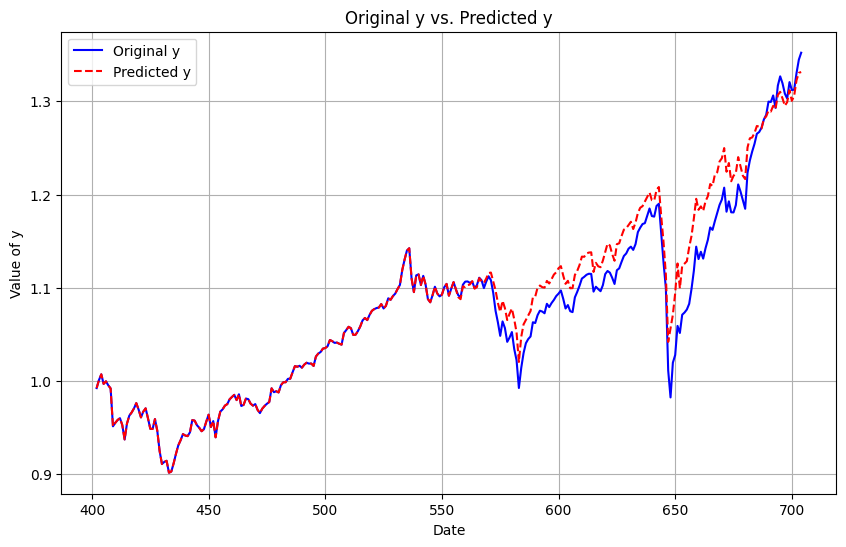

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


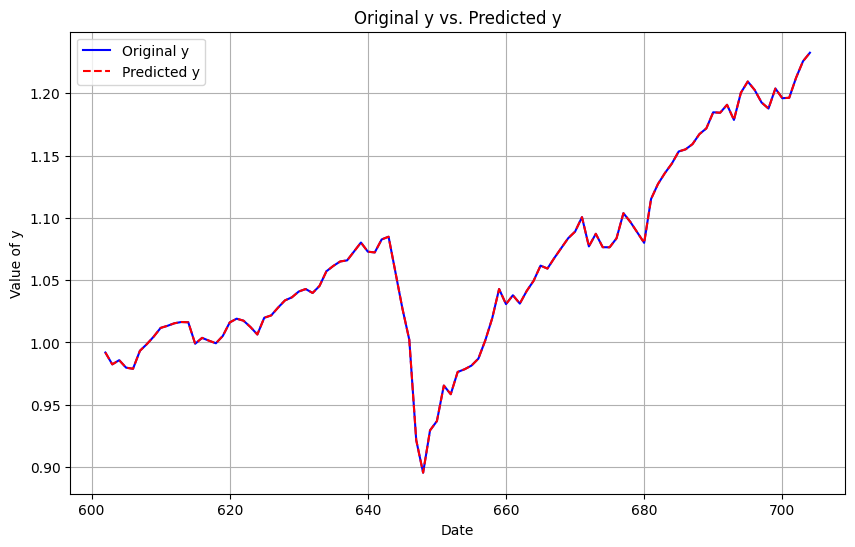

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 0.0687388813222526 %
Upper Partial Moment: 2.598087486510797e-05
Lower Partial Moment: 6.425071640395931e-05
Semi-Deviation: 0.00679358450573341
Value at Risk (VaR): -0.009239161402227051
Conditional Value at Risk (CVaR): -0.018765770984932695
Downside Deviation: 0.00679358450573341
Lower Partial Standard Deviation (LPSD): 0.00679358450573341
Omega Ratio: -1.3609339570952284
Sortino Ratio: -0.012727662690079378
Conditional Drawdown at Risk (CDaR): 0.004254165719317744


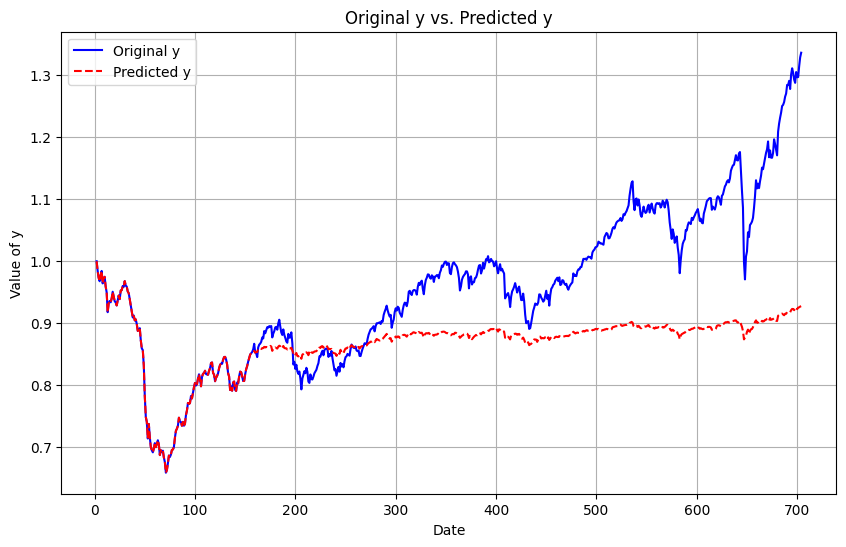

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.16800000897036882 %
Upper Partial Moment: 2.6862101771845354e-05
Lower Partial Moment: 3.47179526199174e-05
Semi-Deviation: 0.00435797429895142
Value at Risk (VaR): -0.008425631146720989
Conditional Value at Risk (CVaR): -0.013093988384972537
Downside Deviation: 0.00435797429895142
Lower Partial Standard Deviation (LPSD): 0.00435797429895142
Omega Ratio: -1.0386897711713632
Sortino Ratio: 0.14816310654286308
Conditional Drawdown at Risk (CDaR): 0.003965603690435579


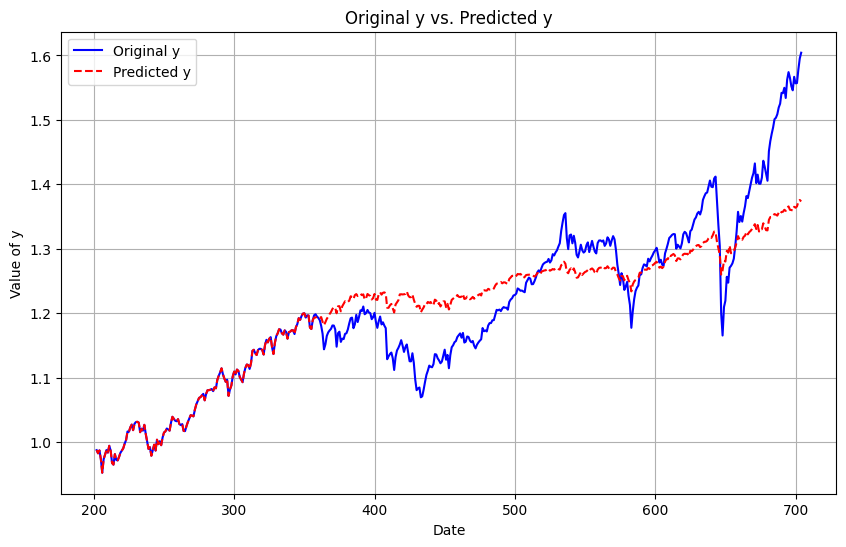

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.08033039944295155 %
Upper Partial Moment: 2.946956034023529e-05
Lower Partial Moment: 7.049425240757739e-05
Semi-Deviation: 0.006395171277516828
Value at Risk (VaR): -0.011186452382652022
Conditional Value at Risk (CVaR): -0.01776455677992227
Downside Deviation: 0.006395171277516828
Lower Partial Standard Deviation (LPSD): 0.006395171277516828
Omega Ratio: -1.325082610856156
Sortino Ratio: 0.09023900093424264
Conditional Drawdown at Risk (CDaR): 0.00544022396035321


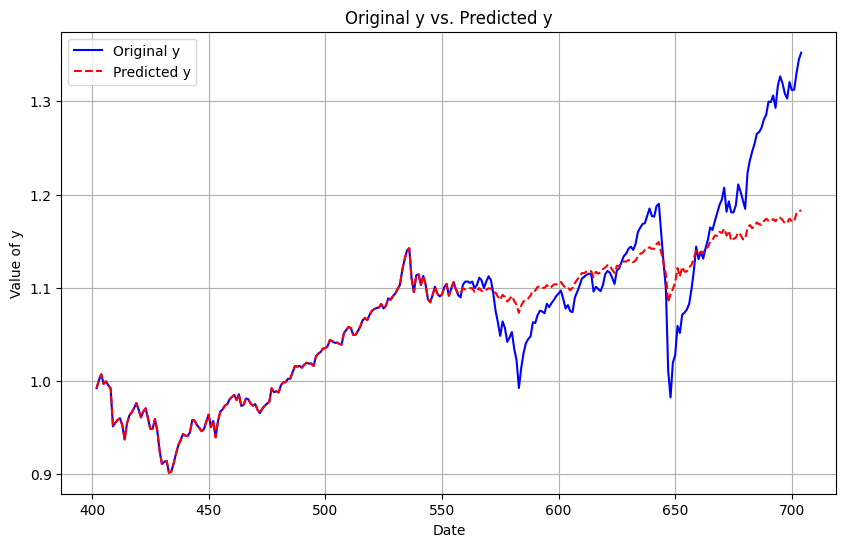

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


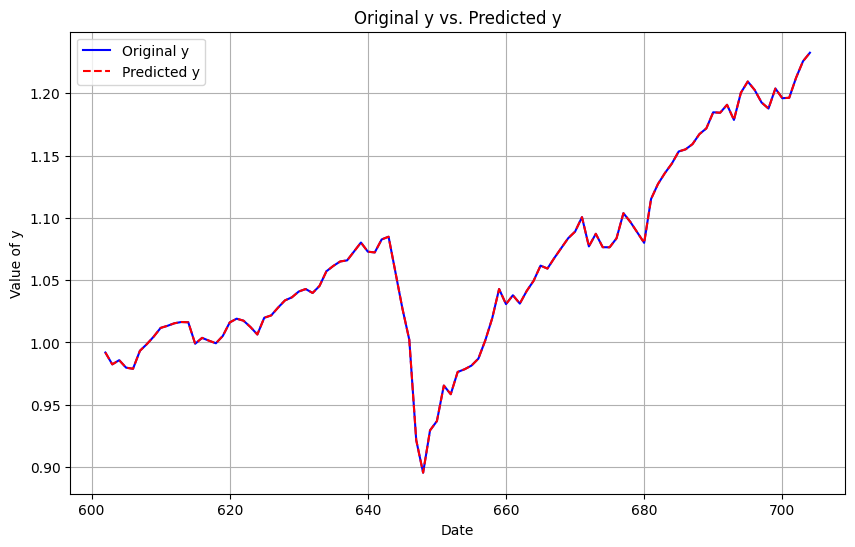

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.0908579823172543 %
Upper Partial Moment: 2.8657085720731664e-05
Lower Partial Moment: 7.780727330495561e-05
Semi-Deviation: 0.007160548802684188
Value at Risk (VaR): -0.010279130370883465
Conditional Value at Risk (CVaR): -0.019722324975990677
Downside Deviation: 0.007160548802684188
Lower Partial Standard Deviation (LPSD): 0.007160548802684188
Omega Ratio: -1.383671884764525
Sortino Ratio: 0.02278136050732169
Conditional Drawdown at Risk (CDaR): 0.005151098343978074


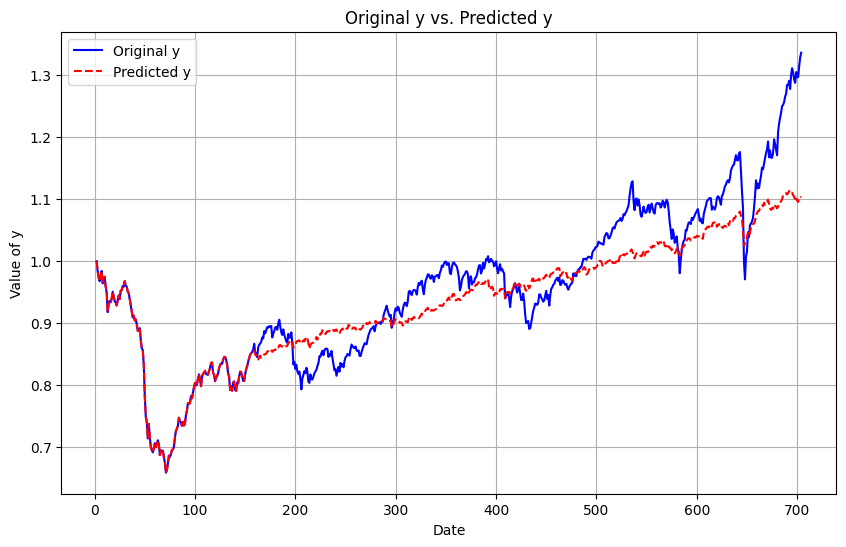

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 0.2502165338192898 %
Upper Partial Moment: 2.6520968440342463e-05
Lower Partial Moment: 2.4446470779228473e-05
Semi-Deviation: 0.0038169193609585744
Value at Risk (VaR): -0.007549795625329148
Conditional Value at Risk (CVaR): -0.012117350479720072
Downside Deviation: 0.0038169193609585744
Lower Partial Standard Deviation (LPSD): 0.0038169193609585744
Omega Ratio: -0.9004903633017117
Sortino Ratio: 0.10250083238247994
Conditional Drawdown at Risk (CDaR): 0.0031428645168330204


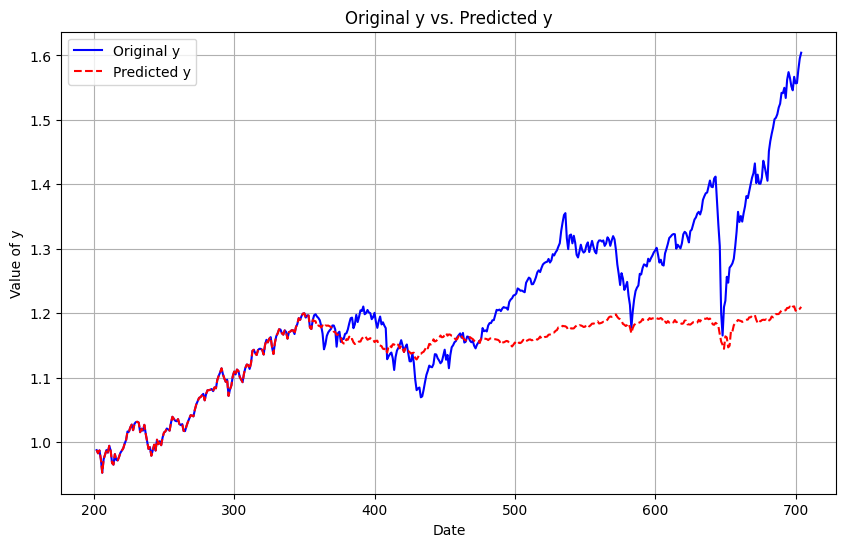

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: -0.09498391974502586 %
Upper Partial Moment: 2.8103250809130258e-05
Lower Partial Moment: 6.292764078510352e-05
Semi-Deviation: 0.006073217906291102
Value at Risk (VaR): -0.010894601183167733
Conditional Value at Risk (CVaR): -0.01698419276178919
Downside Deviation: 0.006073217906291102
Lower Partial Standard Deviation (LPSD): 0.006073217906291102
Omega Ratio: -1.302648304613284
Sortino Ratio: 0.08131561547511583
Conditional Drawdown at Risk (CDaR): 0.005103299427606482


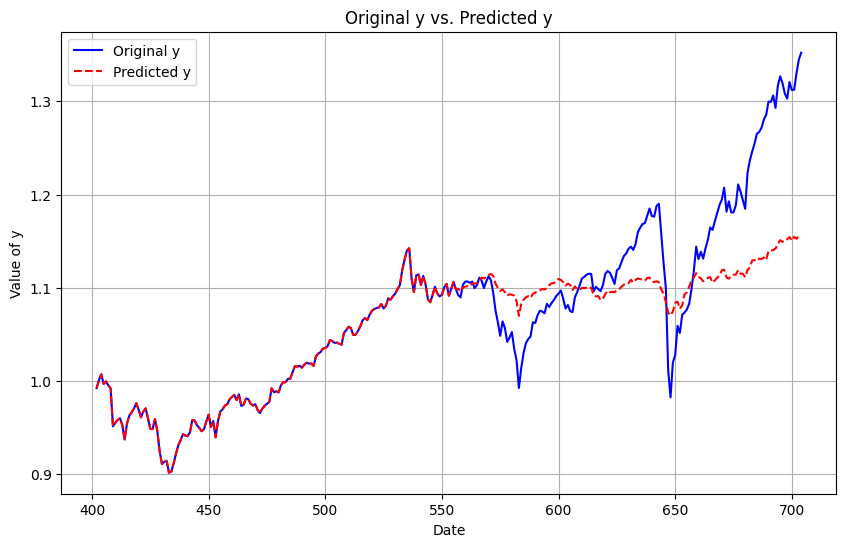

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


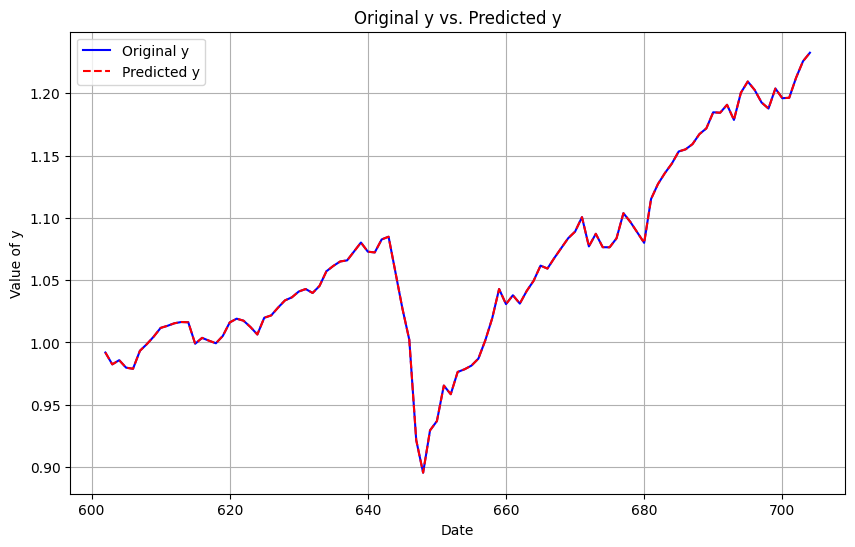

In [ ]:
model_function = perform_ARIMA
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### SARIMAX

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.006395291565543639 %
Upper Partial Moment: 5.496182686834188e-05
Lower Partial Moment: 0.00013109537867570328
Semi-Deviation: 0.008438735769099896
Value at Risk (VaR): -0.014221355299693691
Conditional Value at Risk (CVaR): -0.024723084535024566
Downside Deviation: 0.008438735769099896
Lower Partial Standard Deviation (LPSD): 0.008438735769099896
Omega Ratio: -1.3444618773628352
So

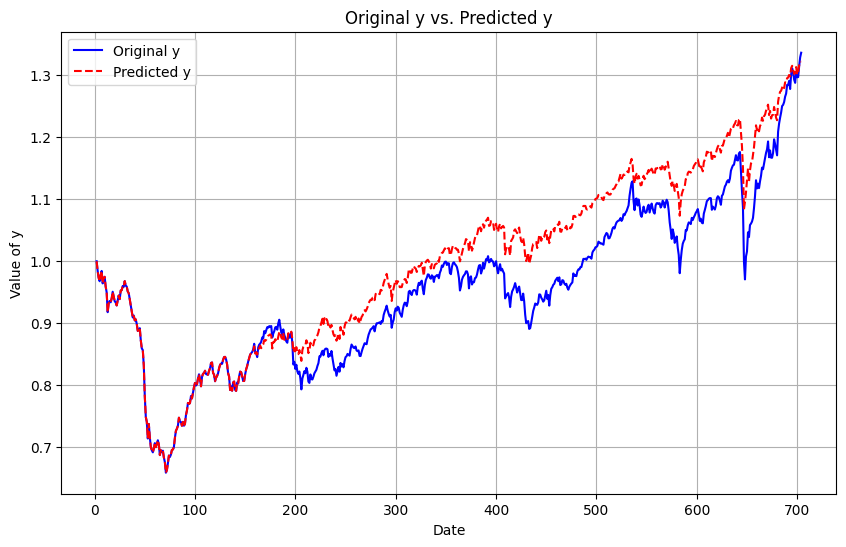

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.07114505954137551 %
Upper Partial Moment: 4.906688807787356e-05
Lower Partial Moment: 8.821632239429896e-05
Semi-Deviation: 0.007009034541459275
Value at Risk (VaR): -0.012101010970030395
Conditional Value at Risk (CVaR): -0.01952418640165403
Downside Deviation: 0.007009034541459275
Lower Partial Standard Deviation (LPSD): 0.007009034541459275
Omega Ratio: -1.135980927939504
Sortino Ratio: 0.13501083346898923
Conditional Drawdown at Risk (CDaR): 0.006252180195014354


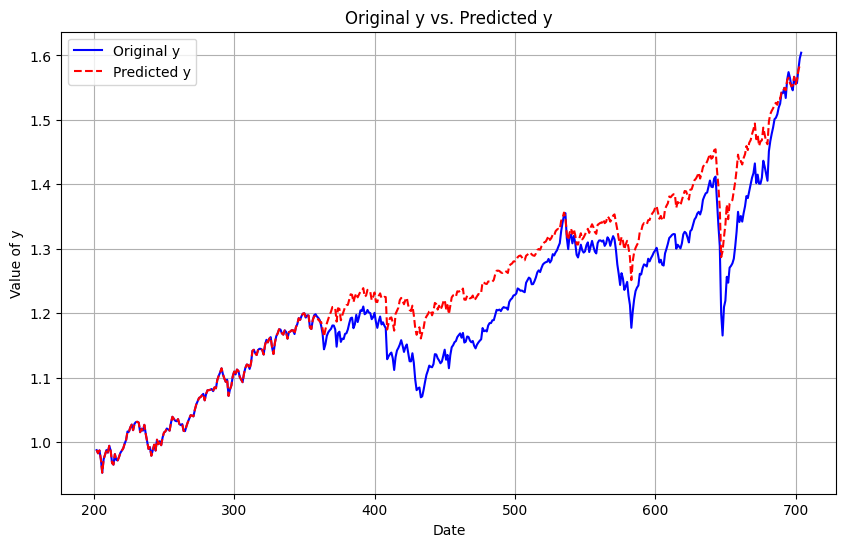

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.05873439589449863 %
Upper Partial Moment: 6.569938135448592e-05
Lower Partial Moment: 0.00015893232770464923
Semi-Deviation: 0.009426864783330163
Value at Risk (VaR): -0.014200154816739172
Conditional Value at Risk (CVaR): -0.025812061655882797
Downside Deviation: 0.009426864783330163
Lower Partial Standard Deviation (LPSD): 0.009426864783330163
Omega Ratio: -1.3504862441224745
Sortino Ratio: 0.106648952508974
Conditional Drawdown at Risk (CDaR): 0.008370576327915467


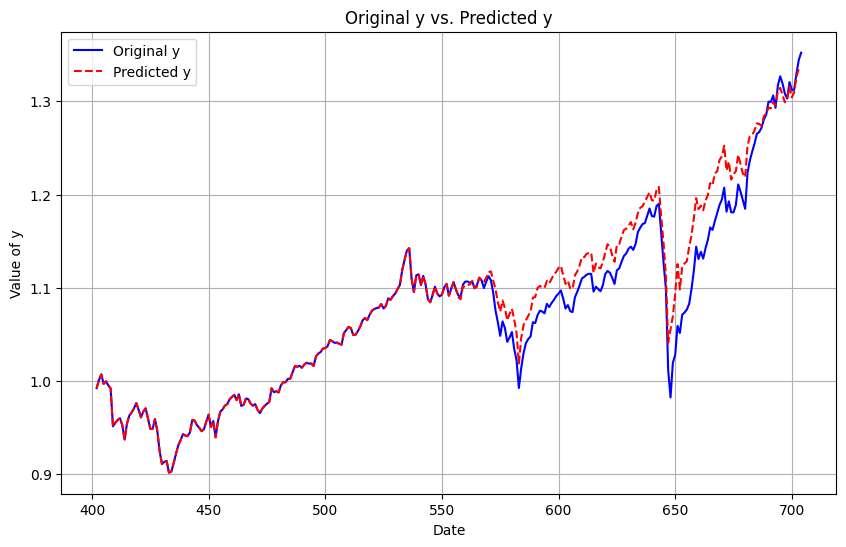

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


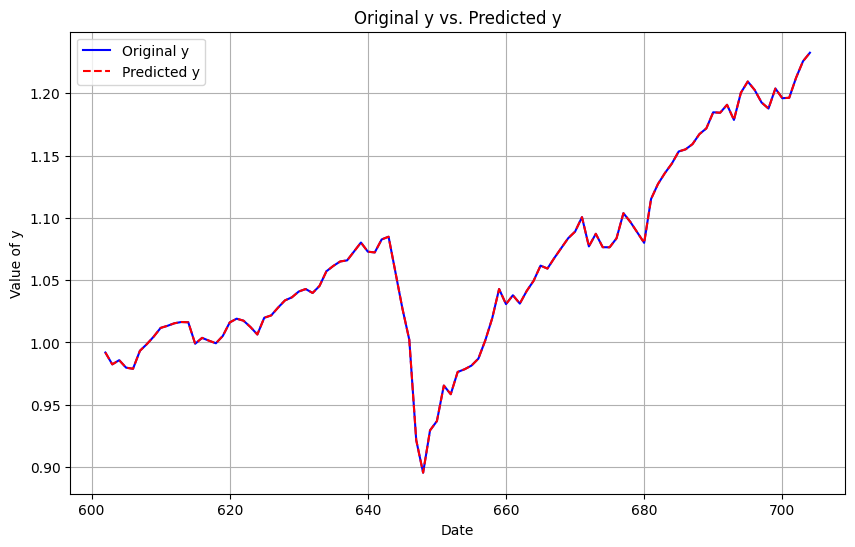

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: 0.05072248864852879 %
Upper Partial Moment: 2.6431220605888512e-05
Lower Partial Moment: 6.883663897253432e-05
Semi-Deviation: 0.006927098876931002
Value at Risk (VaR): -0.009383234216396575
Conditional Value at Risk (CVaR): -0.019020066059859828
Downside Deviation: 0.006927098876931002
Lower Partial Standard Deviation (LPSD): 0.006927098876931002
Omega Ratio: -1.3970273598253329
Sortino Ratio: -0.00437638749582771
Conditional Drawdown at Risk (CDaR): 0.004566392462519574


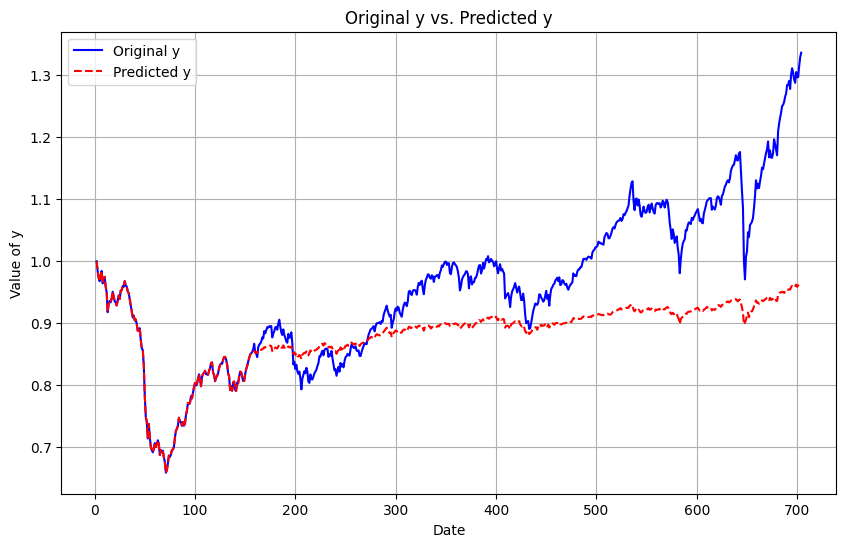

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: -0.17661658140341255 %
Upper Partial Moment: 2.6562550156810985e-05
Lower Partial Moment: 3.424624871149747e-05
Semi-Deviation: 0.004323614079753464
Value at Risk (VaR): -0.008910944211051973
Conditional Value at Risk (CVaR): -0.013050733754459561
Downside Deviation: 0.004323614079753464
Lower Partial Standard Deviation (LPSD): 0.004323614079753464
Omega Ratio: -1.0308895558559976
Sortino Ratio: 0.14887904683714778
Conditional Drawdown at Risk (CDaR): 0.003943679753840958


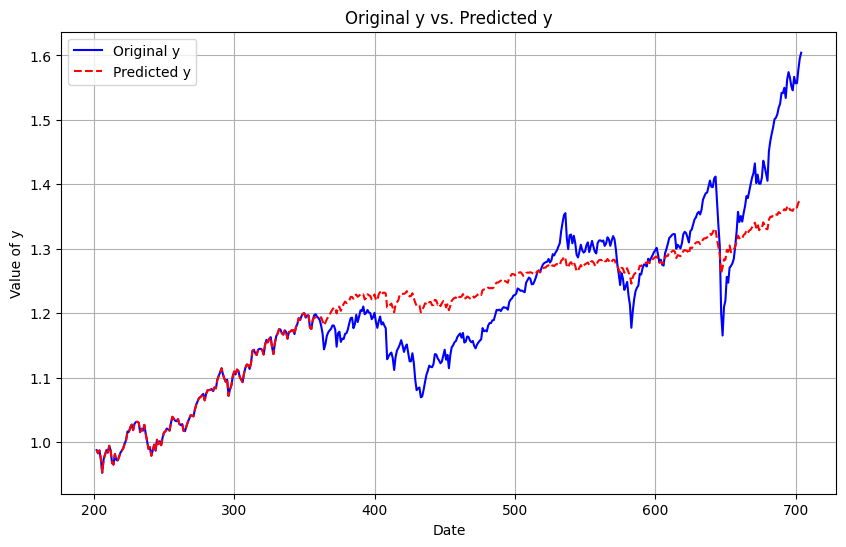

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: 0.07273751772189839 %
Upper Partial Moment: 2.9558471618793485e-05
Lower Partial Moment: 6.95293204037879e-05
Semi-Deviation: 0.006376361208821355
Value at Risk (VaR): -0.01142281928171776
Conditional Value at Risk (CVaR): -0.017746560361261245
Downside Deviation: 0.006376361208821355
Lower Partial Standard Deviation (LPSD): 0.006376361208821355
Omega Ratio: -1.3032334342557583
Sortino Ratio: 0.09119595381552908
Conditional Drawdown at Risk (CDaR): 0.005373205573810311


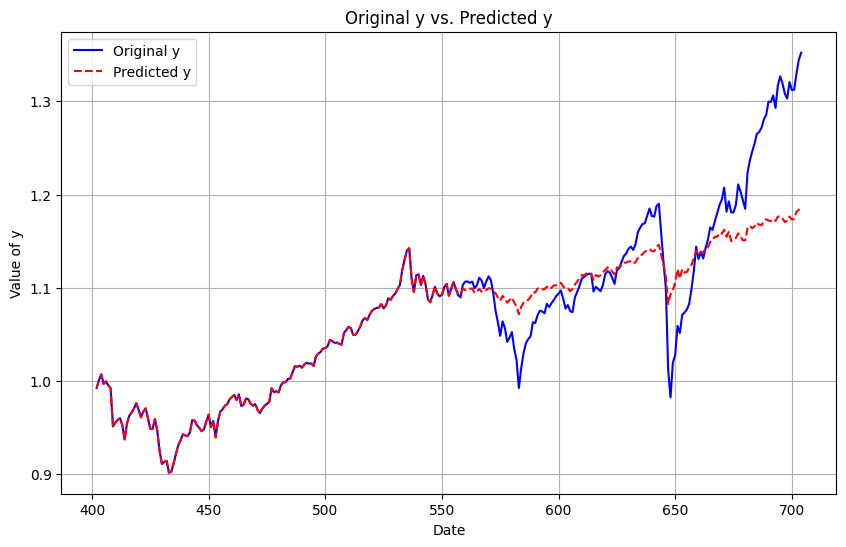

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


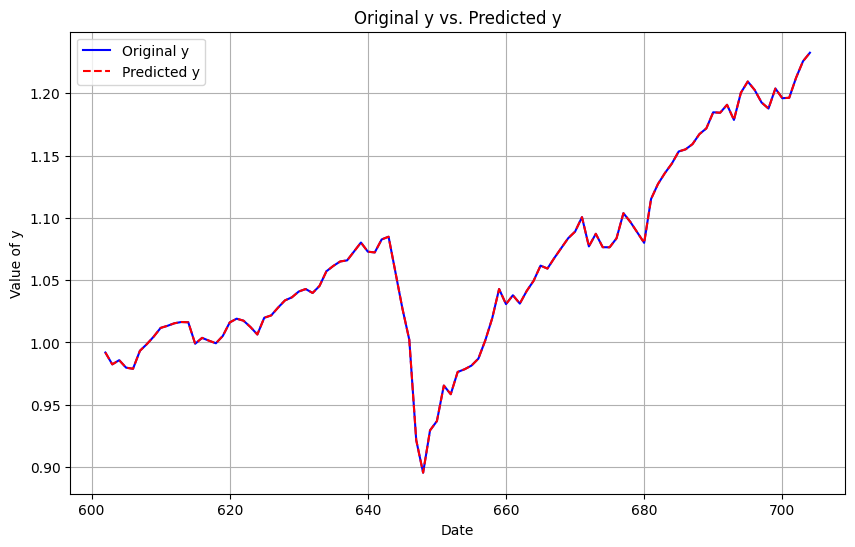

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Return: -0.12066722781466808 %
Upper Partial Moment: 2.4538539724496905e-05
Lower Partial Moment: 7.111272653331236e-05
Semi-Deviation: 0.007100852481541368
Value at Risk (VaR): -0.009360583540775916
Conditional Value at Risk (CVaR): -0.01887945427297138
Downside Deviation: 0.007100852481541368
Lower Partial Standard Deviation (LPSD): 0.007100852481541368
Omega Ratio: -1.4599702514462065
Sortino Ratio: 0.010403230968513071
Conditional Drawdown at Risk (CDaR): 0.004548694380665748


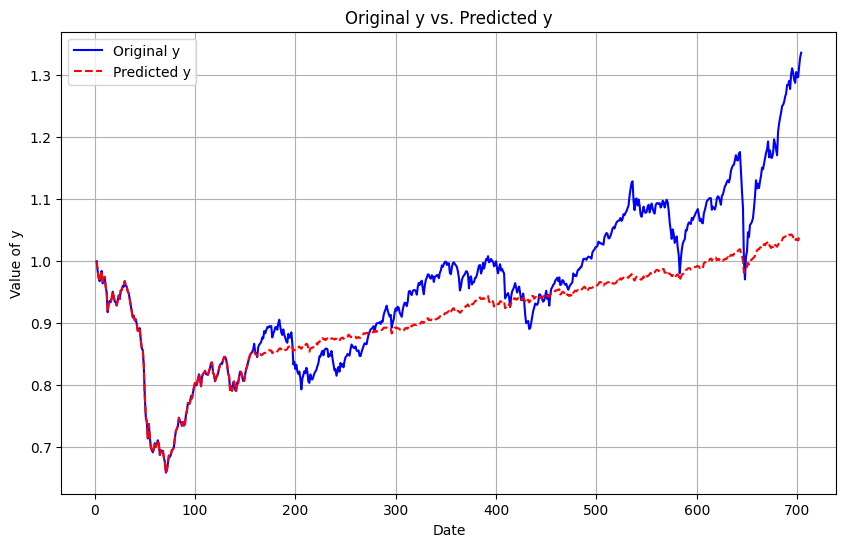

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Return: 0.22076628261101122 %
Upper Partial Moment: 2.4457071596139563e-05
Lower Partial Moment: 2.454764388997614e-05
Semi-Deviation: 0.0038254569296649237
Value at Risk (VaR): -0.00745112136769468
Conditional Value at Risk (CVaR): -0.011892124980024019
Downside Deviation: 0.0038254569296649237
Lower Partial Standard Deviation (LPSD): 0.0038254569296649237
Omega Ratio: -0.9700705587852355
Sortino Ratio: 0.1074047108666656
Conditional Drawdown at Risk (CDaR): 0.003148574783811679


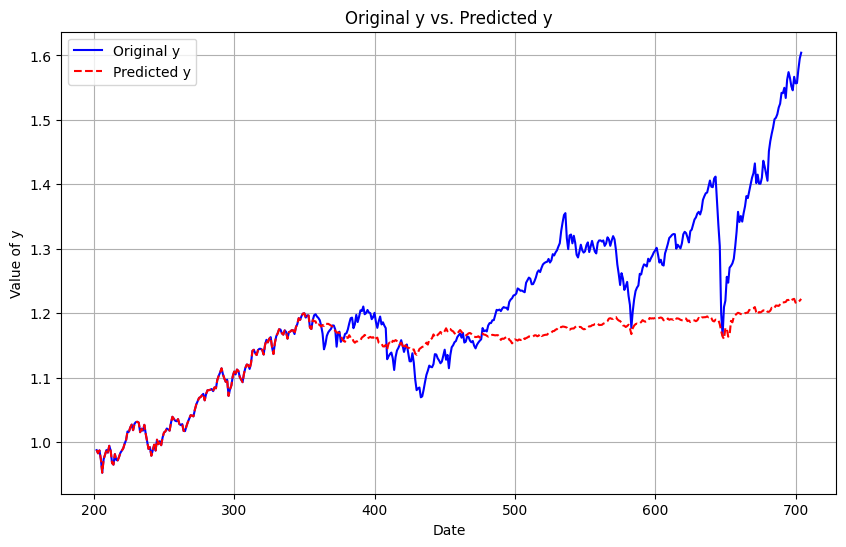

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Return: -0.05147448144440796 %
Upper Partial Moment: 2.6847005087615475e-05
Lower Partial Moment: 6.092936023134274e-05
Semi-Deviation: 0.006055136788233022
Value at Risk (VaR): -0.01142281928171776
Conditional Value at Risk (CVaR): -0.01699803559370272
Downside Deviation: 0.006055136788233022
Lower Partial Standard Deviation (LPSD): 0.006055136788233022
Omega Ratio: -1.2920565140396445
Sortino Ratio: 0.06761158320683362
Conditional Drawdown at Risk (CDaR): 0.004925919072328511


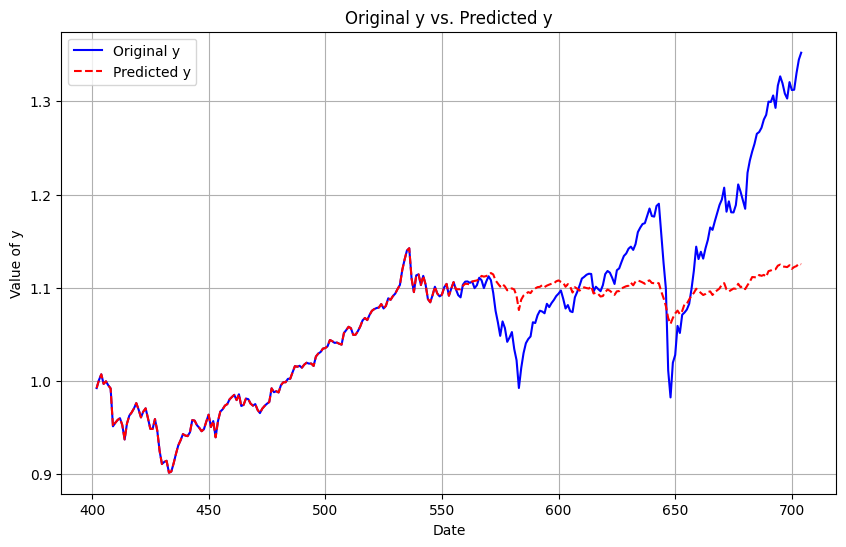

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


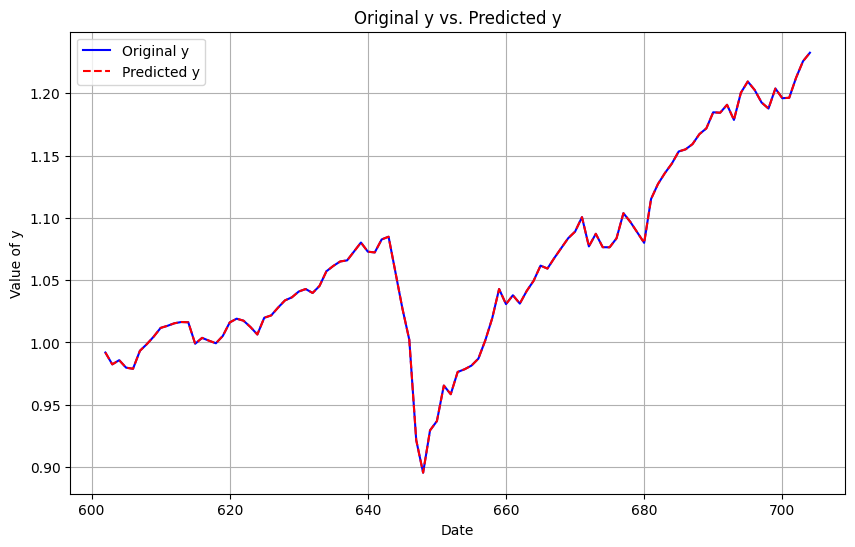

In [ ]:
model_function = perform_SARIMAX
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### Kalman Filter

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
0.0001710263183625562
Return: -0.1601097961236335 %
Upper Partial Moment: 5.4907759552808475e-05
Lower Partial Moment: 0.00011180726928037584
Semi-Deviation: 0.007921426517796263
Value at Risk (VaR): -0.014049475217215933
Conditional Value at Risk (CVaR): -0.023425249690460167
Downside Deviation: 0.007921426517796263
Lower Partial Standard Deviation (LPSD): 0.007921426517796263
Omega Ratio: -

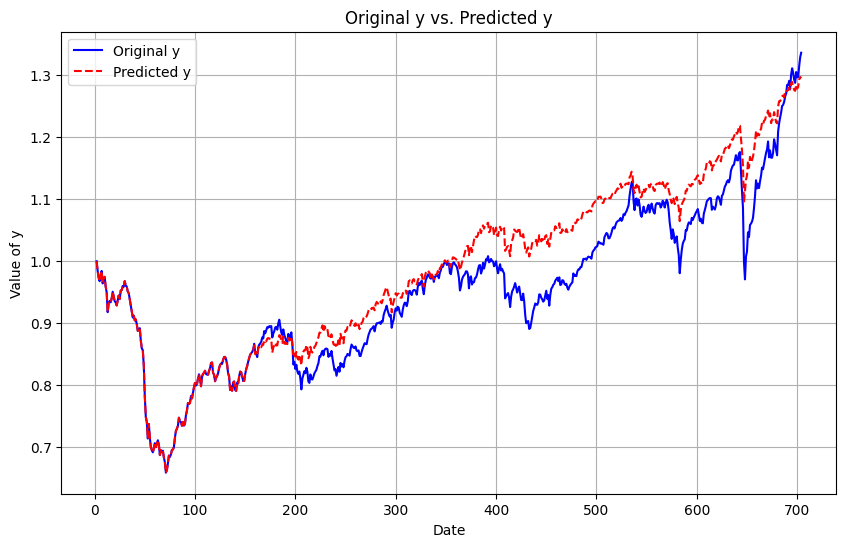

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
6.217875963930156e-05
Return: -0.016641566891770144 %
Upper Partial Moment: 4.526953542274587e-05
Lower Partial Moment: 7.693823273587713e-05
Semi-Deviation: 0.0065253689090460035
Value at Risk (VaR): -0.01117192776338281
Conditional Value at Risk (CVaR): -0.018712429474965063
Downside Deviation: 0.0065253689090460035
Lower Partial Standard Deviation (LPSD): 0.0065253689090460035
Omega Ratio: -1.0990676900918421
Sortino Ratio: 0.1419874716212103
Conditional Drawdown at Risk (CDaR): 0.005861552126931305


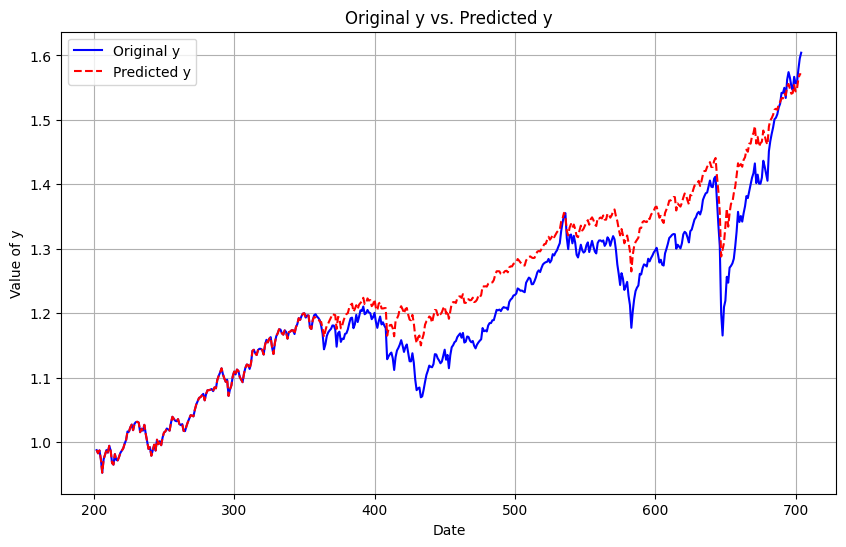

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
6.817172416160607e-05
Return: -0.17987438106430276 %
Upper Partial Moment: 5.2692891100739235e-05
Lower Partial Moment: 0.00012275877974707693
Semi-Deviation: 0.008090375164521902
Value at Risk (VaR): -0.01398750172996342
Conditional Value at Risk (CVaR): -0.023396373371928986
Downside Deviation: 0.008090375164521902
Lower Partial Standard Deviation (LPSD): 0.008090375164521902
Omega Ratio: -1.3101701760159892
Sortino Ratio: 0.10432212278550733
Conditional Drawdown at Risk (CDaR): 0.007569980808718352


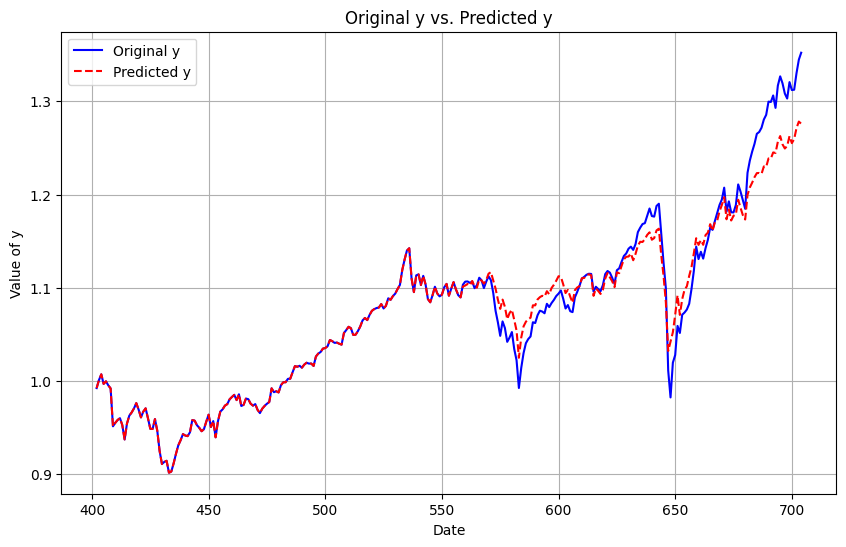

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
0.00018999482949210236
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


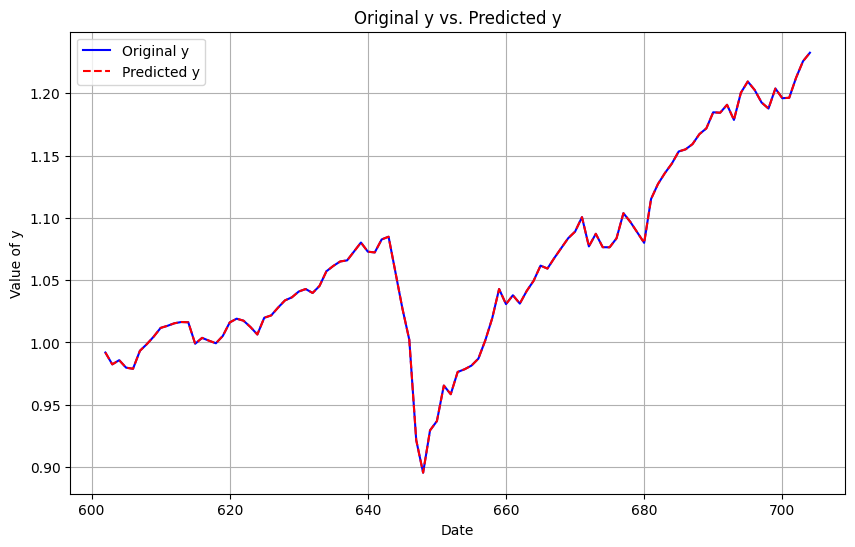

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
3.597636661128135e-05
Return: 0.0698804497724969 %
Upper Partial Moment: 2.3819152040888184e-05
Lower Partial Moment: 6.265164075740118e-05
Semi-Deviation: 0.00689690288435557
Value at Risk (VaR): -0.009239161402227051
Conditional Value at Risk (CVaR): -0.01864403374782733
Downside Deviation: 0.00689690288435557
Lower Partial Standard Deviation (LPSD): 0.00689690288435557
Omega Ratio: -1.4089427457143642
Sortino Ratio: -0.01256004716656855
Conditional Drawdown at Risk (CDaR): 0.0038838603683923824


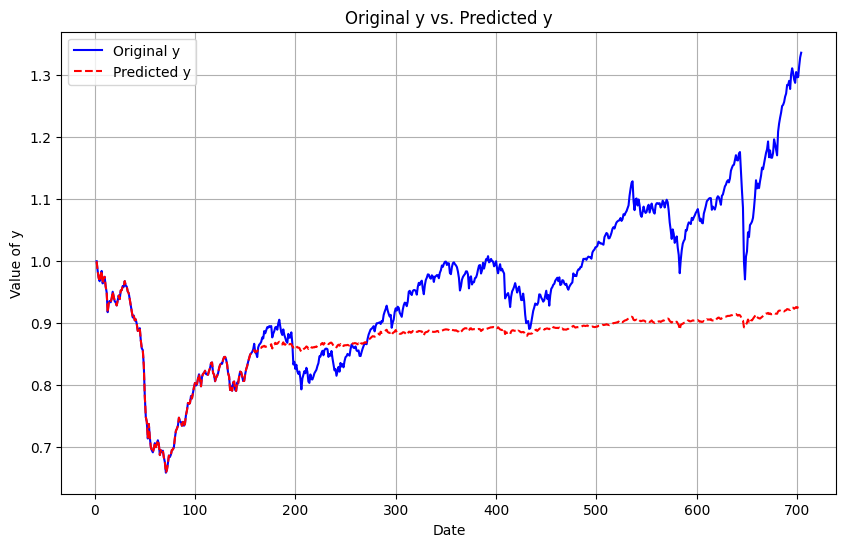

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
2.120728800693019e-05
Return: 0.15909360293753858 %
Upper Partial Moment: 2.669034126126451e-05
Lower Partial Moment: 3.524231806247662e-05
Semi-Deviation: 0.004369075825988187
Value at Risk (VaR): -0.008425631146720989
Conditional Value at Risk (CVaR): -0.013371442087152092
Downside Deviation: 0.004369075825988187
Lower Partial Standard Deviation (LPSD): 0.004369075825988187
Omega Ratio: -1.0979220539717518
Sortino Ratio: 0.11448573162770496
Conditional Drawdown at Risk (CDaR): 0.004019141013853864


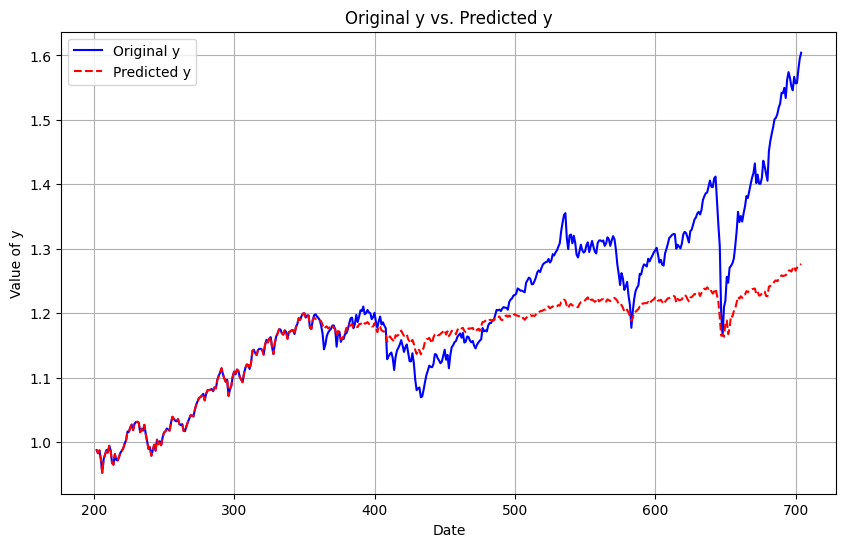

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
1.675222311652982e-05
Return: 0.06117665466921376 %
Upper Partial Moment: 2.4997463569865574e-05
Lower Partial Moment: 6.455348764586602e-05
Semi-Deviation: 0.00623138305285823
Value at Risk (VaR): -0.010845210208720106
Conditional Value at Risk (CVaR): -0.016953098625432882
Downside Deviation: 0.00623138305285823
Lower Partial Standard Deviation (LPSD): 0.00623138305285823
Omega Ratio: -1.4261924791591292
Sortino Ratio: 0.07716802452870056
Conditional Drawdown at Risk (CDaR): 0.005071819485590674


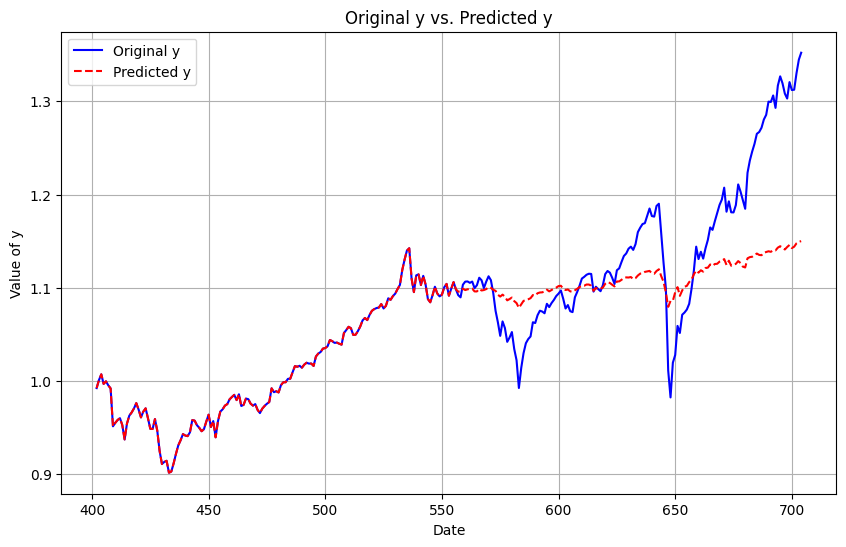

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
5.2166198484832155e-05
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


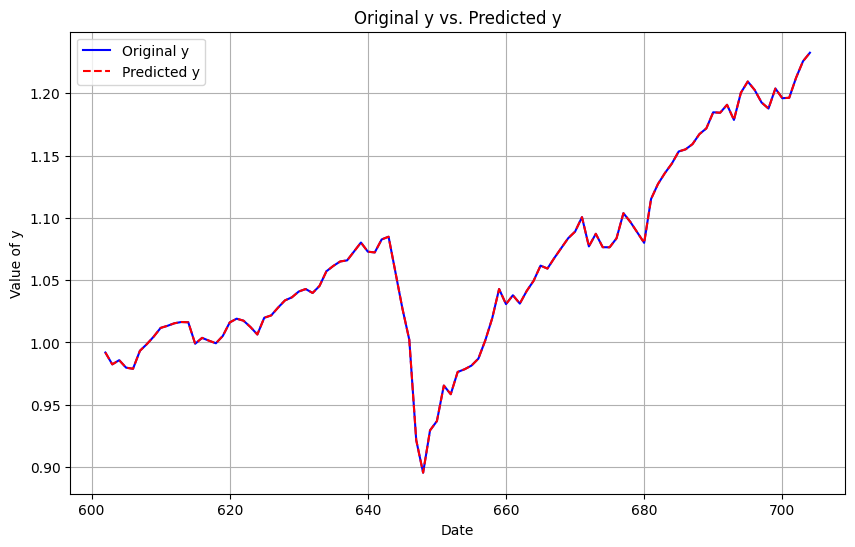

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
7.305754726449564e-05
Return: -0.29985493933787144 %
Upper Partial Moment: 4.0005028735685734e-05
Lower Partial Moment: 7.787630001252097e-05
Semi-Deviation: 0.006867283106928529
Value at Risk (VaR): -0.010587939280907495
Conditional Value at Risk (CVaR): -0.02019630020328051
Downside Deviation: 0.006867283106928529
Lower Partial Standard Deviation (LPSD): 0.006867283106928529
Omega Ratio: -1.1901873603672153
Sortino Ratio: 0.02319001048466237
Conditional Drawdown at Risk (CDaR): 0.0055422669316638855


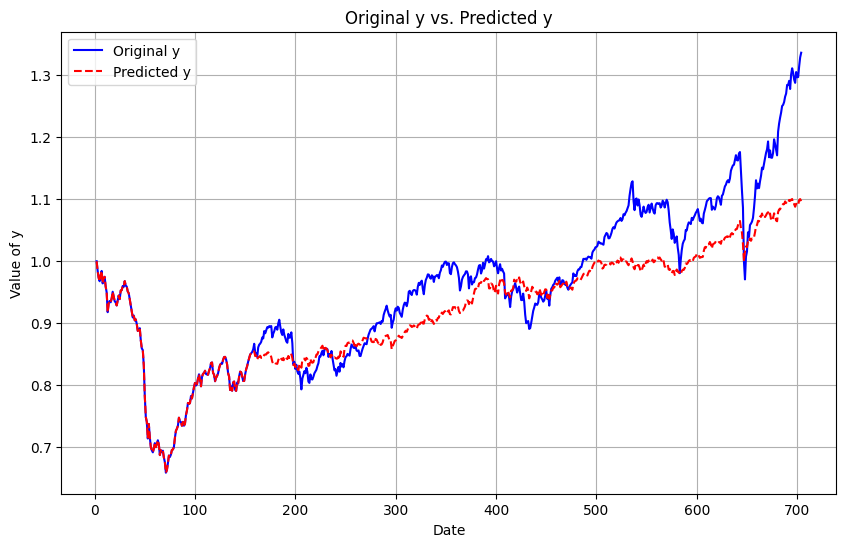

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
2.3257933195019477e-05
Return: -0.33482907084843594 %
Upper Partial Moment: 2.9539924686549237e-05
Lower Partial Moment: 3.071620306388245e-05
Semi-Deviation: 0.004173818274586836
Value at Risk (VaR): -0.008425631146720989
Conditional Value at Risk (CVaR): -0.013082663790145043
Downside Deviation: 0.004173818274586836
Lower Partial Standard Deviation (LPSD): 0.004173818274586836
Omega Ratio: -0.9139715860071
Sortino Ratio: 0.15204559813826543
Conditional Drawdown at Risk (CDaR): 0.0036462918252119407


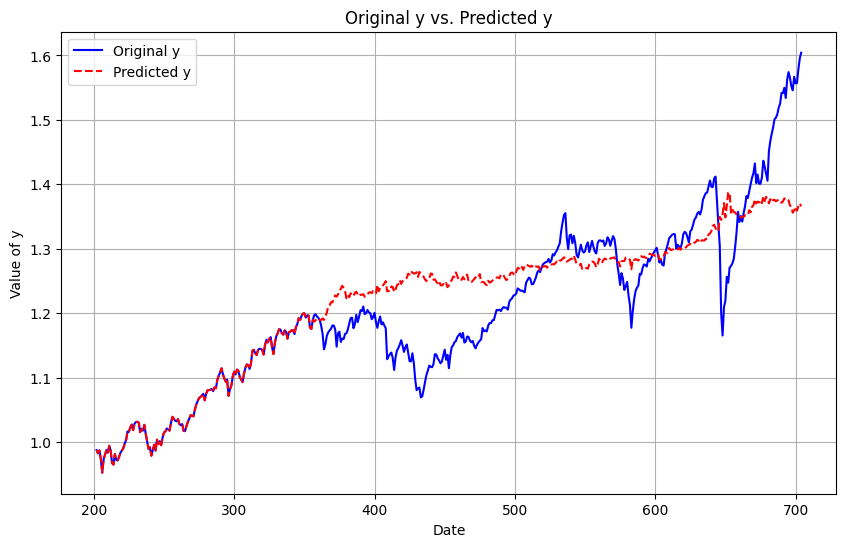

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
3.230019564450576e-05
Return: -0.30222808426243264 %
Upper Partial Moment: 2.968254609288537e-05
Lower Partial Moment: 6.799709373759651e-05
Semi-Deviation: 0.006264963819245293
Value at Risk (VaR): -0.011427504523398026
Conditional Value at Risk (CVaR): -0.017751922995059052
Downside Deviation: 0.006264963819245293
Lower Partial Standard Deviation (LPSD): 0.006264963819245293
Omega Ratio: -1.2938086873702006
Sortino Ratio: 0.08560249899771914
Conditional Drawdown at Risk (CDaR): 0.005361652924345619


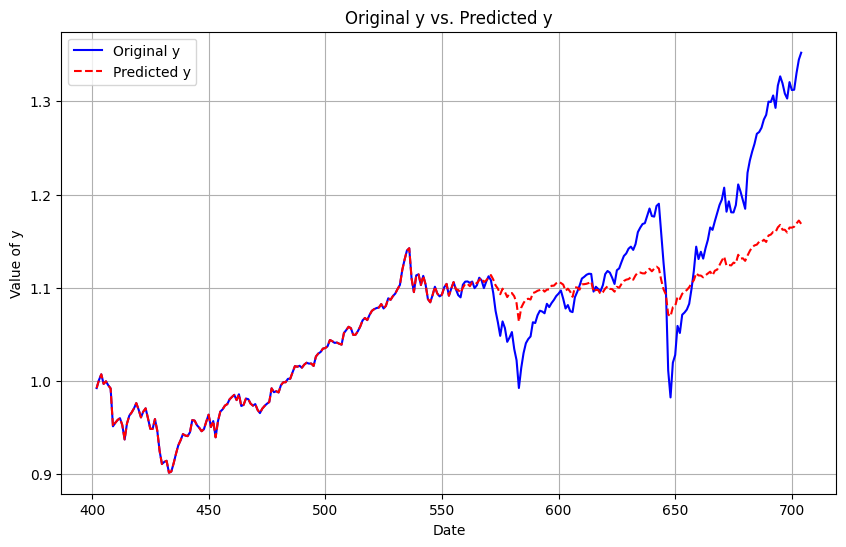

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
0.00010628710983858546
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


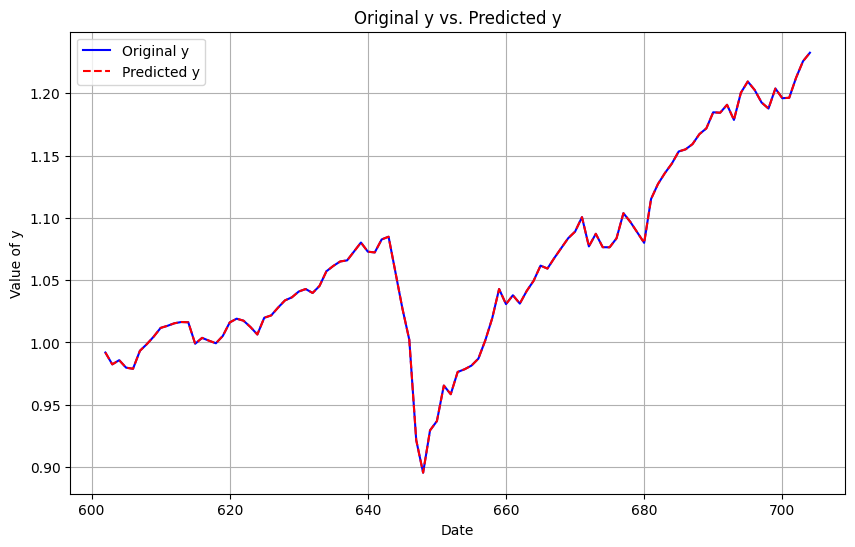

In [ ]:
model_function = perform_KalmanFilter
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

### Fixed window tests

In [ ]:
# Window parameters
rolling = False
rolling_window = 156

# Status Parameters
print_every = 200
plots = [0,0,1]

#### OLS

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.007097293847790637 %
Upper Partial Moment: 6.199560046250285e-05
Lower Partial Moment: 0.00014136482169154502
Semi-Deviation: 0.008785628311625344
Value at Risk (VaR): -0.015369391649601431
Conditional Value at Risk (CVaR): -0.02587814660854729
Downside Deviation: 0.008785628311625344
Lower Partial Standard Deviation (LPSD): 0.008785628311625344
Omega Ratio: -1.2916838339080117
So

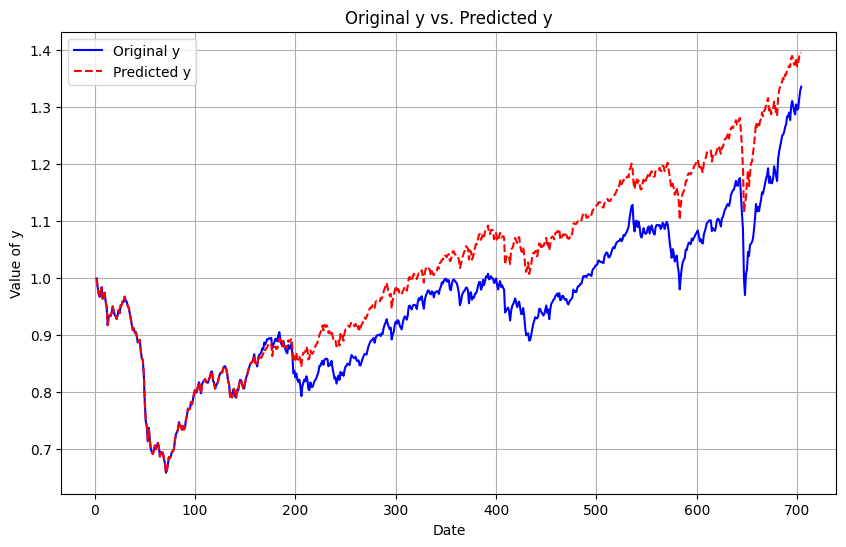

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.006304815806086215 %
Upper Partial Moment: 6.512204212801827e-05
Lower Partial Moment: 0.00014138603974298437
Semi-Deviation: 0.008769853207880686
Value at Risk (VaR): -0.016042864963178933
Conditional Value at Risk (CVaR): -0.0261894883922847
Downside Deviation: 0.008769853207880686
Lower Partial Standard Deviation (LPSD): 0.008769853207880686
Omega Ratio: -1.249010441539377
Sortino Ratio: 0.04826826662895185
Conditional Drawdown at Risk (CDaR): 0.008029677107780188


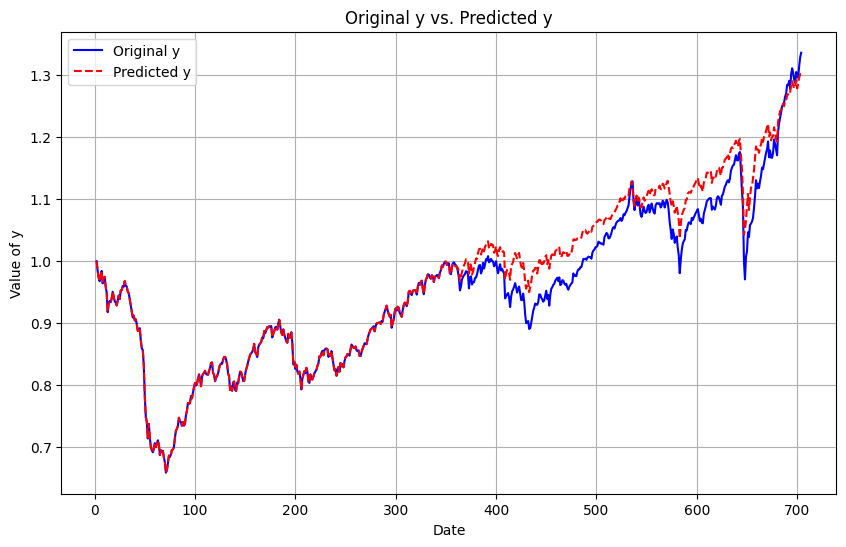

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.004445013691923368 %
Upper Partial Moment: 6.698769561421696e-05
Lower Partial Moment: 0.00014797478523156178
Semi-Deviation: 0.008778624093566518
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.02658412174308046
Downside Deviation: 0.008778624093566518
Lower Partial Standard Deviation (LPSD): 0.008778624093566518
Omega Ratio: -1.2841950132221565
Sortino Ratio: 0.04554830702003508
Conditional Drawdown at Risk (CDaR): 0.008420839878267203


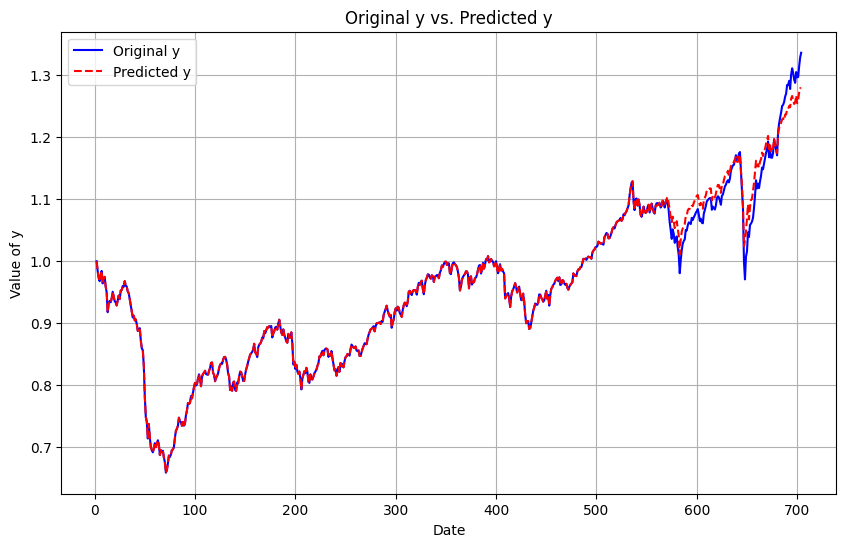

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


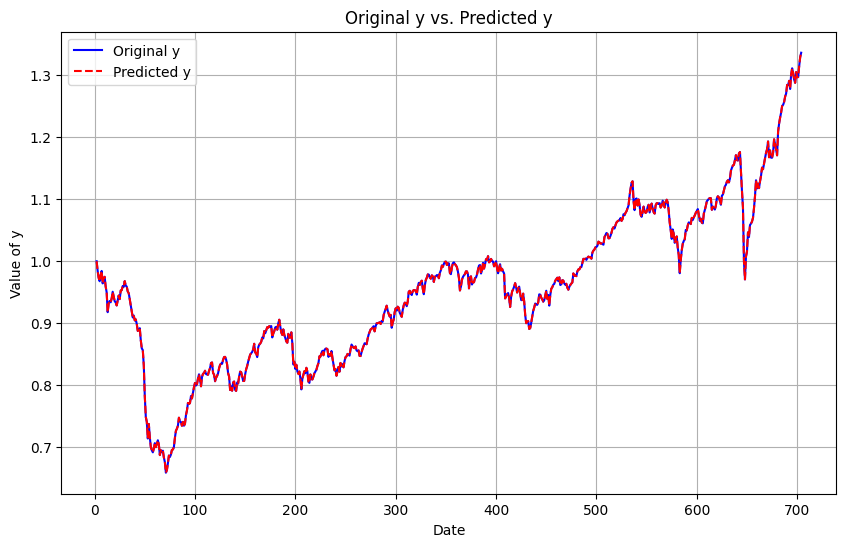

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: 0.04325640248167718 %
Upper Partial Moment: 2.5894913433816212e-05
Lower Partial Moment: 6.624349690685815e-05
Semi-Deviation: 0.006876757031690766
Value at Risk (VaR): -0.009343386163211613
Conditional Value at Risk (CVaR): -0.01883828630116859
Downside Deviation: 0.006876757031690766
Lower Partial Standard Deviation (LPSD): 0.006876757031690766
Omega Ratio: -1.3607764221844998
Sortino Ratio: -0.0003384229549902865
Conditional Drawdown at Risk (CDaR): 0.004353585836290558


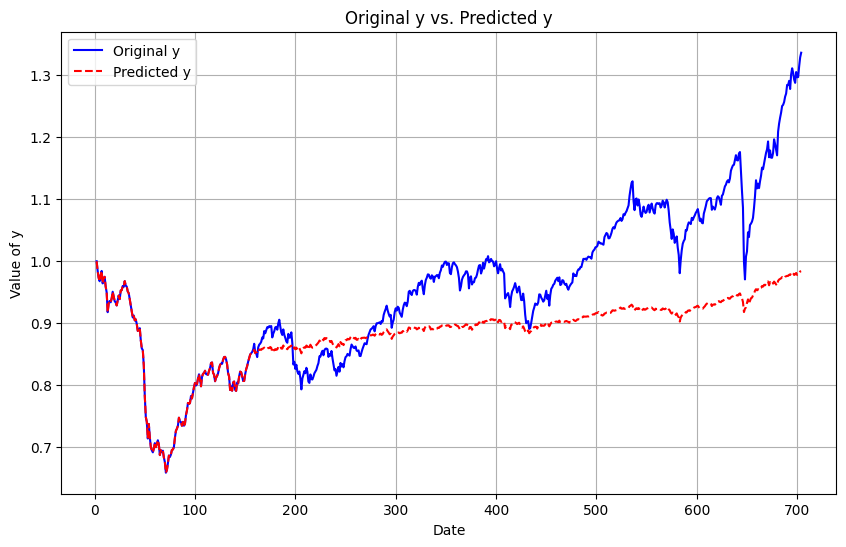

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.01341937649574624 %
Upper Partial Moment: 4.341809832324428e-05
Lower Partial Moment: 9.593322516761142e-05
Semi-Deviation: 0.007606671893611733
Value at Risk (VaR): -0.013273510565063333
Conditional Value at Risk (CVaR): -0.02223682083429147
Downside Deviation: 0.007606671893611733
Lower Partial Standard Deviation (LPSD): 0.007606671893611733
Omega Ratio: -1.293231335583683
Sortino Ratio: 0.027733282633897904
Conditional Drawdown at Risk (CDaR): 0.006170232400043673


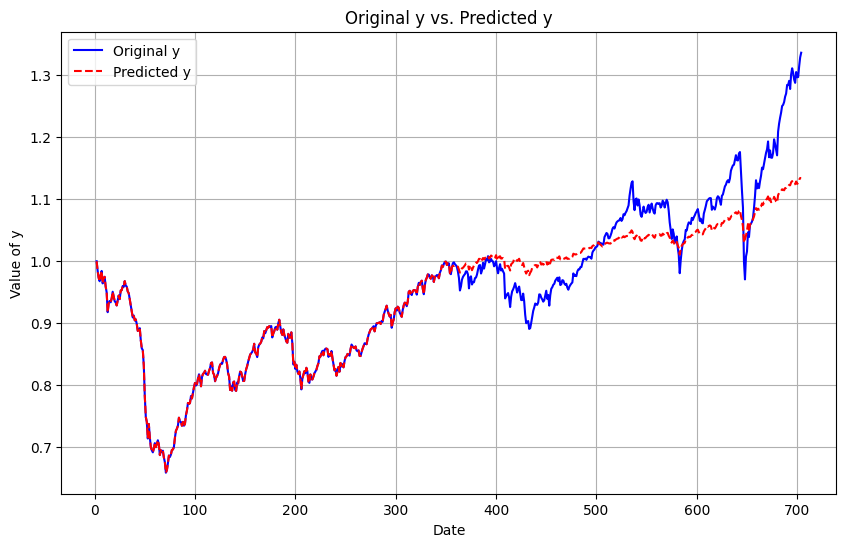

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.01902046981814102 %
Upper Partial Moment: 5.440814244665089e-05
Lower Partial Moment: 0.00012140386060906874
Semi-Deviation: 0.00808384348070574
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024246506743416867
Downside Deviation: 0.00808384348070574
Lower Partial Standard Deviation (LPSD): 0.00808384348070574
Omega Ratio: -1.307131015727445
Sortino Ratio: 0.0341999651854079
Conditional Drawdown at Risk (CDaR): 0.007487011098463795


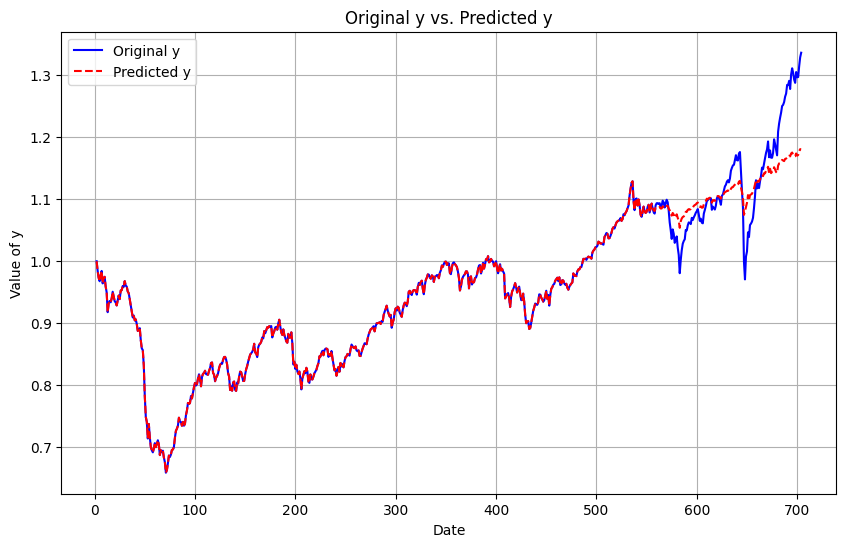

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


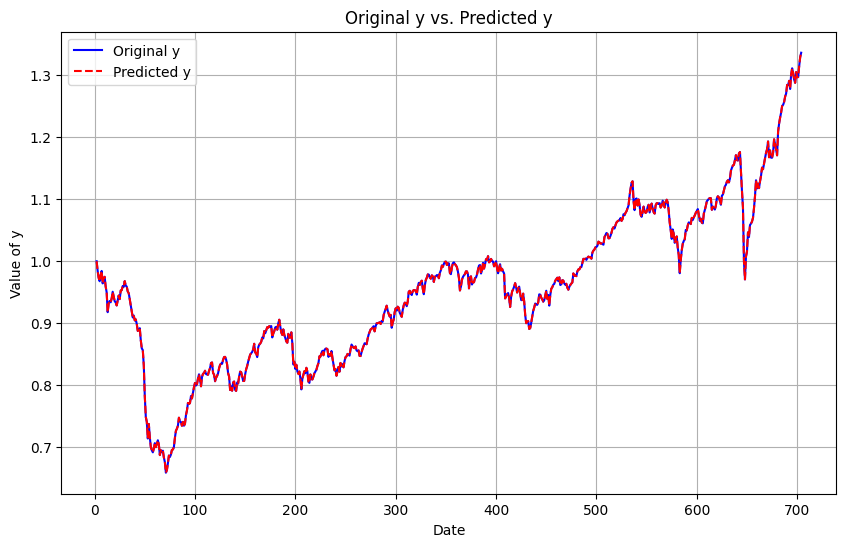

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.09361009881114501 %
Upper Partial Moment: 2.9713234277499806e-05
Lower Partial Moment: 8.074969918333255e-05
Semi-Deviation: 0.007246996074395896
Value at Risk (VaR): -0.010421562399833802
Conditional Value at Risk (CVaR): -0.02028250134958173
Downside Deviation: 0.007246996074395896
Lower Partial Standard Deviation (LPSD): 0.007246996074395896
Omega Ratio: -1.3986321491286833
Sortino Ratio: 0.014458342123739835
Conditional Drawdown at Risk (CDaR): 0.005313261435410742


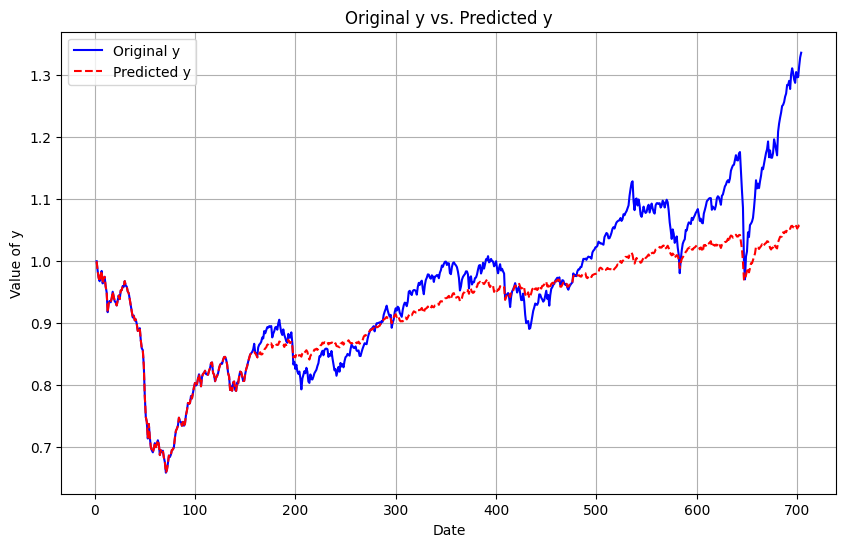

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.03314356879757856 %
Upper Partial Moment: 4.214816998166918e-05
Lower Partial Moment: 8.600064165490859e-05
Semi-Deviation: 0.007474551662437561
Value at Risk (VaR): -0.013022178046300214
Conditional Value at Risk (CVaR): -0.021844485929974795
Downside Deviation: 0.007474551662437561
Lower Partial Standard Deviation (LPSD): 0.007474551662437561
Omega Ratio: -1.2439549897938738
Sortino Ratio: 0.004308082645084241
Conditional Drawdown at Risk (CDaR): 0.005489236659177712


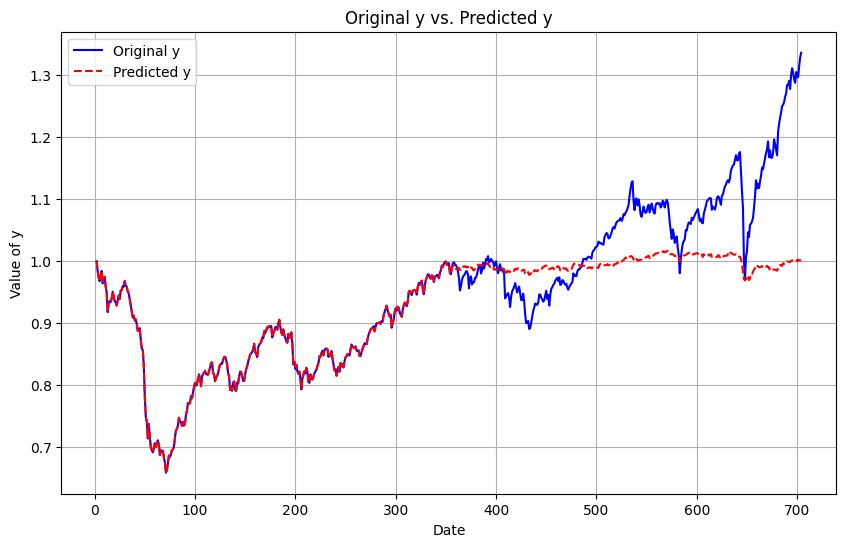

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.04248595332820552 %
Upper Partial Moment: 5.381190248517251e-05
Lower Partial Moment: 0.00011474867581058656
Semi-Deviation: 0.008041079598790312
Value at Risk (VaR): -0.014451914771916433
Conditional Value at Risk (CVaR): -0.023970020264721944
Downside Deviation: 0.008041079598790312
Lower Partial Standard Deviation (LPSD): 0.008041079598790312
Omega Ratio: -1.2769061515125453
Sortino Ratio: 0.019539466250282793
Conditional Drawdown at Risk (CDaR): 0.0070774087557880115


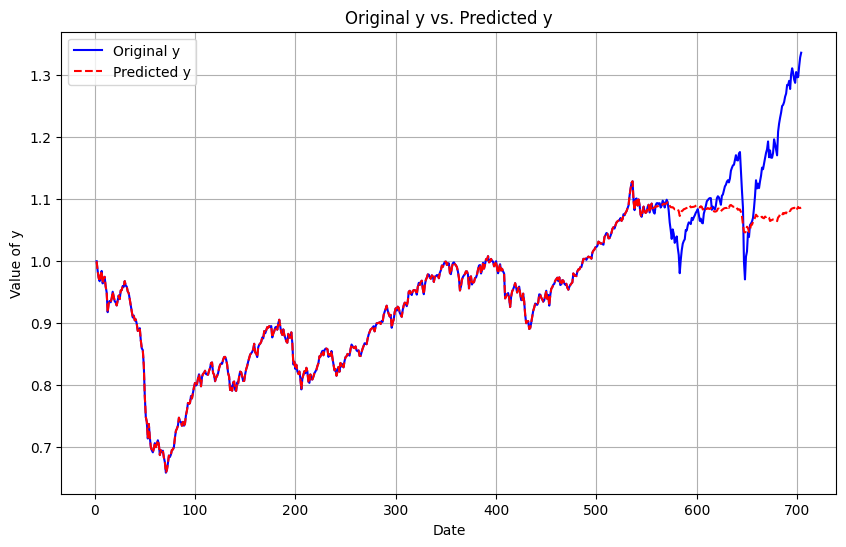

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


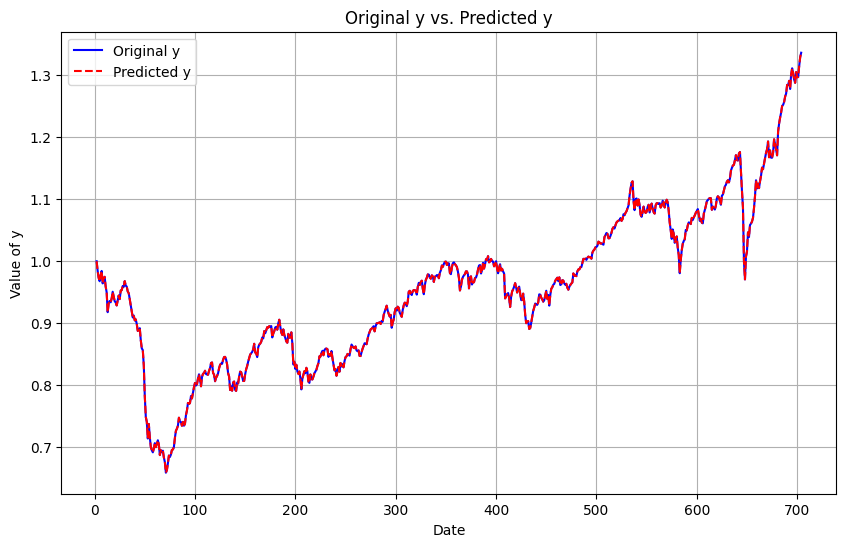

In [ ]:
# Model function and plots
model_function = perform_OLS

# Backtesting Function
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### Lasso

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.006945130111427121 %
Upper Partial Moment: 6.016707667391787e-05
Lower Partial Moment: 0.0001359381239089791
Semi-Deviation: 0.008607988980727104
Value at Risk (VaR): -0.014952019150810996
Conditional Value at Risk (CVaR): -0.025393892658396023
Downside Deviation: 0.008607988980727104
Lower Partial Standard Deviation (LPSD): 0.008607988980727104
Omega Ratio: -1.2909563329277878
So

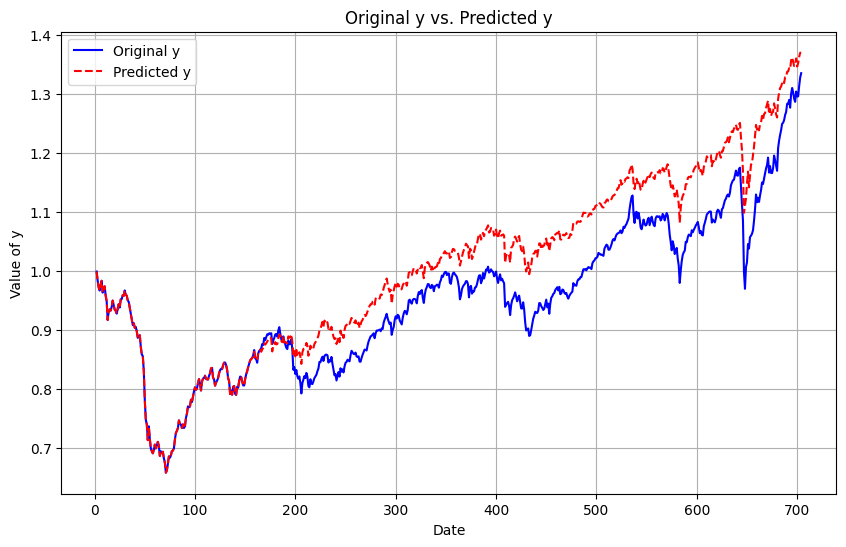

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.010775511298111422 %
Upper Partial Moment: 6.452299435817421e-05
Lower Partial Moment: 0.00013893883609997988
Semi-Deviation: 0.0086918335687105
Value at Risk (VaR): -0.01605087430233167
Conditional Value at Risk (CVaR): -0.026051794054061026
Downside Deviation: 0.0086918335687105
Lower Partial Standard Deviation (LPSD): 0.0086918335687105
Omega Ratio: -1.2446166526200504
Sortino Ratio: 0.04745380651926343
Conditional Drawdown at Risk (CDaR): 0.007961838061265575


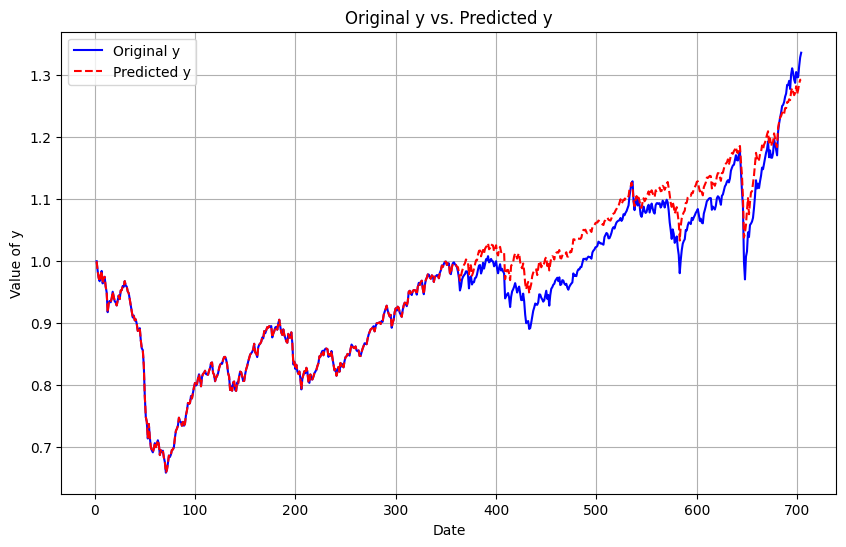

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.015543880865400848 %
Upper Partial Moment: 6.667389900632711e-05
Lower Partial Moment: 0.00014520477903331506
Semi-Deviation: 0.008703499193762017
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.026423070821901453
Downside Deviation: 0.008703499193762017
Lower Partial Standard Deviation (LPSD): 0.008703499193762017
Omega Ratio: -1.271053370780174
Sortino Ratio: 0.04513977439176212
Conditional Drawdown at Risk (CDaR): 0.00833389949648416


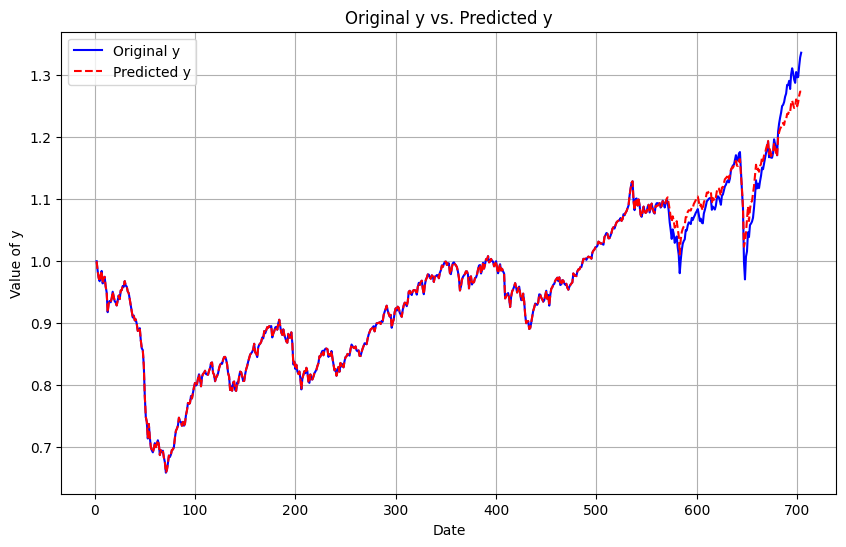

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


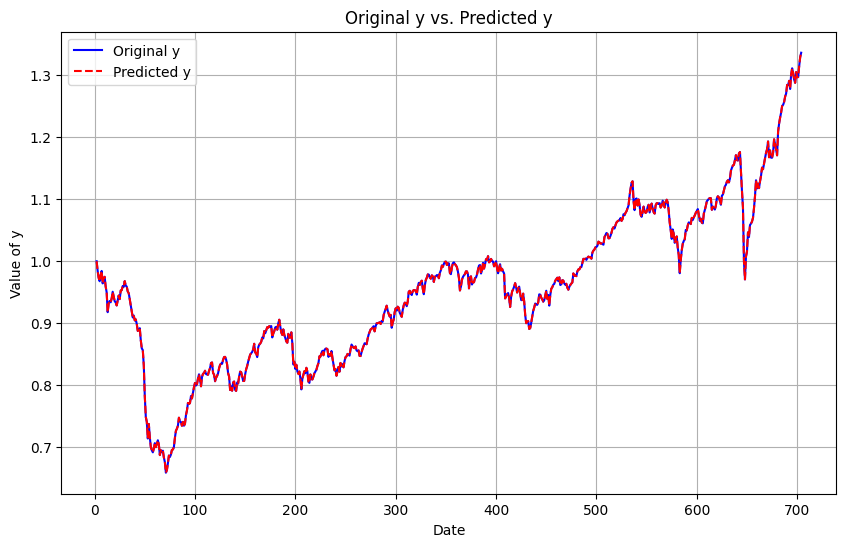

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: 0.006205484283727455 %
Upper Partial Moment: 2.5246187192834765e-05
Lower Partial Moment: 6.832984704788285e-05
Semi-Deviation: 0.0069653556189222966
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.018945383922143164
Downside Deviation: 0.0069653556189222966
Lower Partial Standard Deviation (LPSD): 0.0069653556189222966
Omega Ratio: -1.430395767810967
Sortino Ratio: -0.0042424387755955525
Conditional Drawdown at Risk (CDaR): 0.0044512546714191095


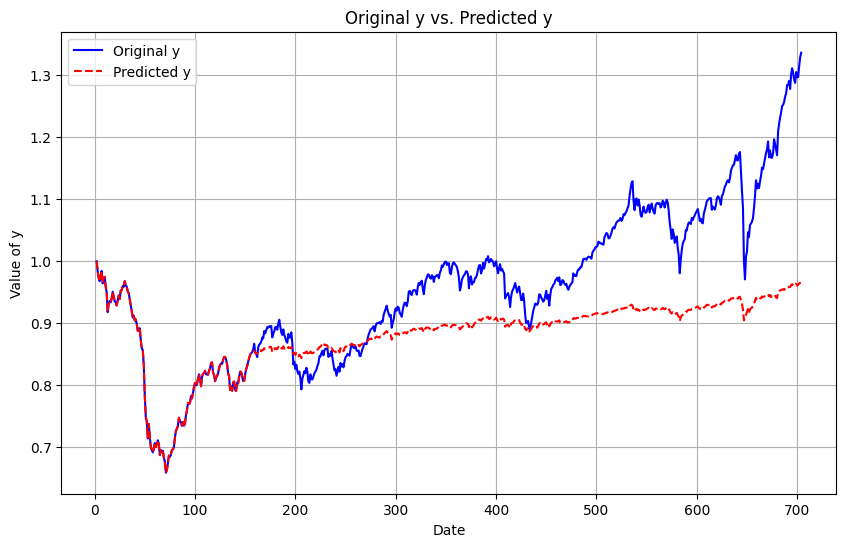

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.01653746970242988 %
Upper Partial Moment: 4.184570939945239e-05
Lower Partial Moment: 9.127347906771118e-05
Semi-Deviation: 0.007559313416411245
Value at Risk (VaR): -0.013022178046300214
Conditional Value at Risk (CVaR): -0.021936607958279807
Downside Deviation: 0.007559313416411245
Lower Partial Standard Deviation (LPSD): 0.007559313416411245
Omega Ratio: -1.3004804182568954
Sortino Ratio: 0.01475685528692184
Conditional Drawdown at Risk (CDaR): 0.005842110897627341


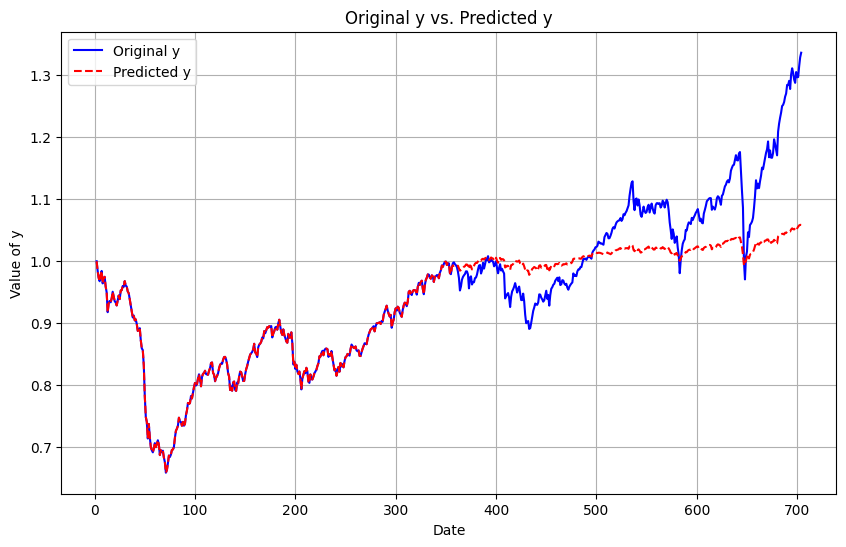

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.0020579459975566487 %
Upper Partial Moment: 5.368953677538904e-05
Lower Partial Moment: 0.00011953941892128981
Semi-Deviation: 0.008088936001770264
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.02415750971414576
Downside Deviation: 0.008088936001770264
Lower Partial Standard Deviation (LPSD): 0.008088936001770264
Omega Ratio: -1.3071454007275312
Sortino Ratio: 0.029008853849347843
Conditional Drawdown at Risk (CDaR): 0.007355850275838592


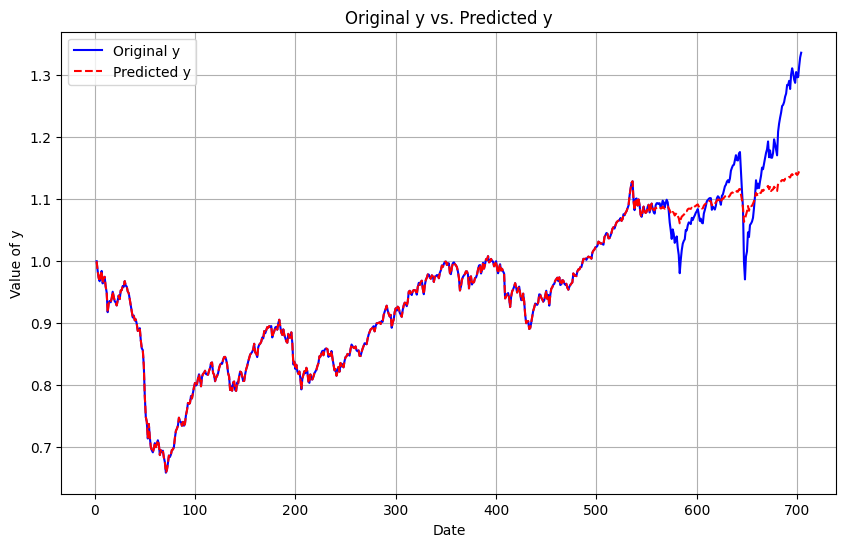

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


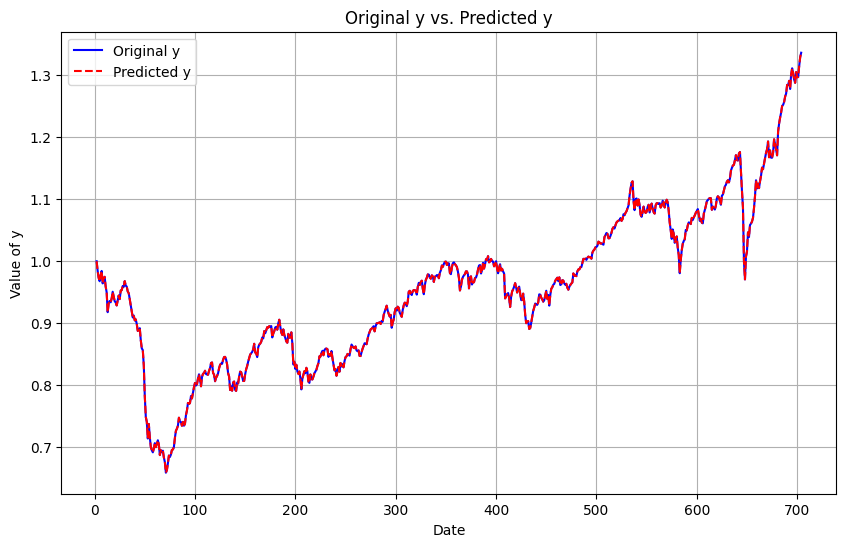

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.0 %
Upper Partial Moment: 0.00010812260053488014
Lower Partial Moment: 0.0002377244480233455
Semi-Deviation: 0.010566516315292106
Value at Risk (VaR): -0.008655094189447708
Conditional Value at Risk (CVaR): -0.01852442380334916
Downside Deviation: 0.010566516315292106
Lower Partial Standard Deviation (LPSD): 0.010566516315292106
Omega Ratio: -10.156955035141946
Sortino Ratio: -0.019907864854665964
Conditional Drawdown at Risk (CDaR): 0.01122823142716658


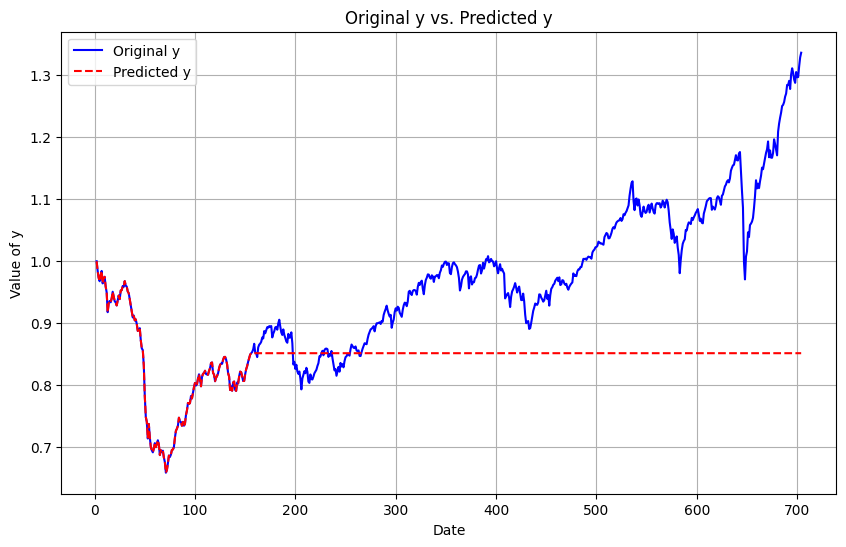

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.0 %
Upper Partial Moment: 8.175287588453309e-05
Lower Partial Moment: 0.00015810218610186254
Semi-Deviation: 0.00893453139930233
Value at Risk (VaR): -0.012656647352609662
Conditional Value at Risk (CVaR): -0.02180403925212308
Downside Deviation: 0.00893453139930233
Lower Partial Standard Deviation (LPSD): 0.00893453139930233
Omega Ratio: -3.314461315379931
Sortino Ratio: 0.0017242838511993925
Conditional Drawdown at Risk (CDaR): 0.008847391410847793


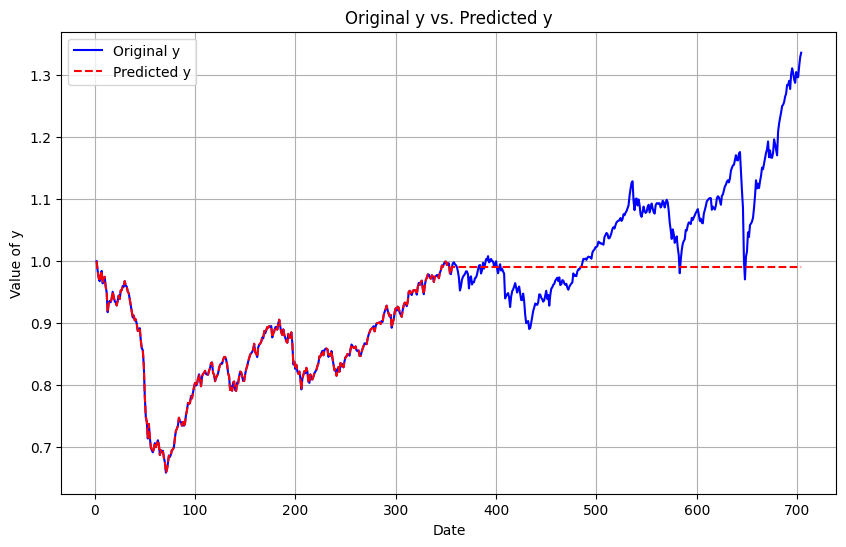

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.049863462752894654 %
Upper Partial Moment: 5.318825270373161e-05
Lower Partial Moment: 0.00011878955674430135
Semi-Deviation: 0.0080798881833802
Value at Risk (VaR): -0.014723719440182912
Conditional Value at Risk (CVaR): -0.023977614973358794
Downside Deviation: 0.0080798881833802
Lower Partial Standard Deviation (LPSD): 0.0080798881833802
Omega Ratio: -1.318374541926192
Sortino Ratio: 0.027694702102803545
Conditional Drawdown at Risk (CDaR): 0.0073147087220458975


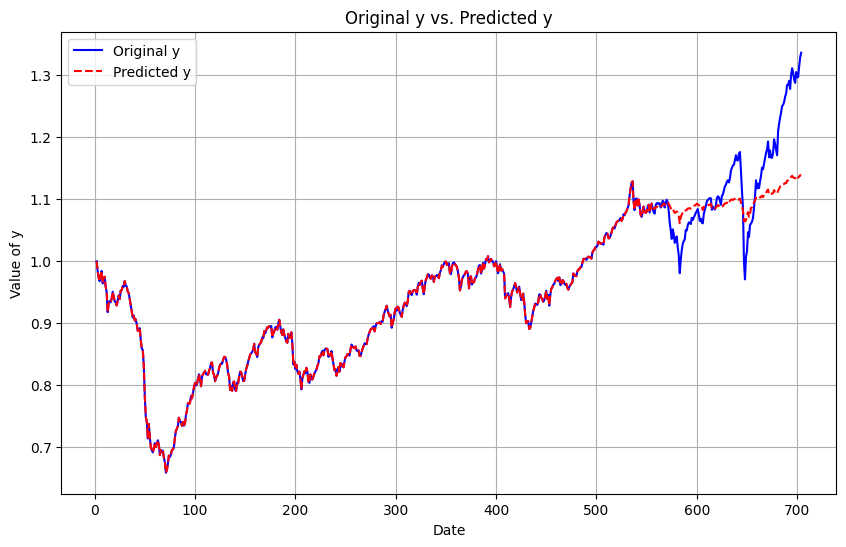

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


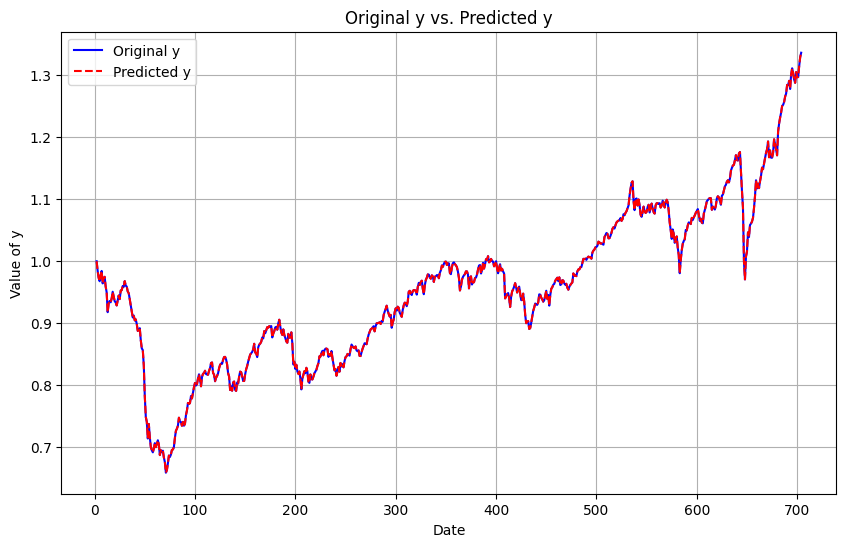

In [ ]:
model_function = perform_Lasso
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### Ridge

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.022912525385463928 %
Upper Partial Moment: 5.969716151552394e-05
Lower Partial Moment: 0.0001339512382597757
Semi-Deviation: 0.008549619507211894
Value at Risk (VaR): -0.014953192368722728
Conditional Value at Risk (CVaR): -0.02527970361769525
Downside Deviation: 0.008549619507211894
Lower Partial Standard Deviation (LPSD): 0.008549619507211894
Omega Ratio: -1.2856035241735964
Sor

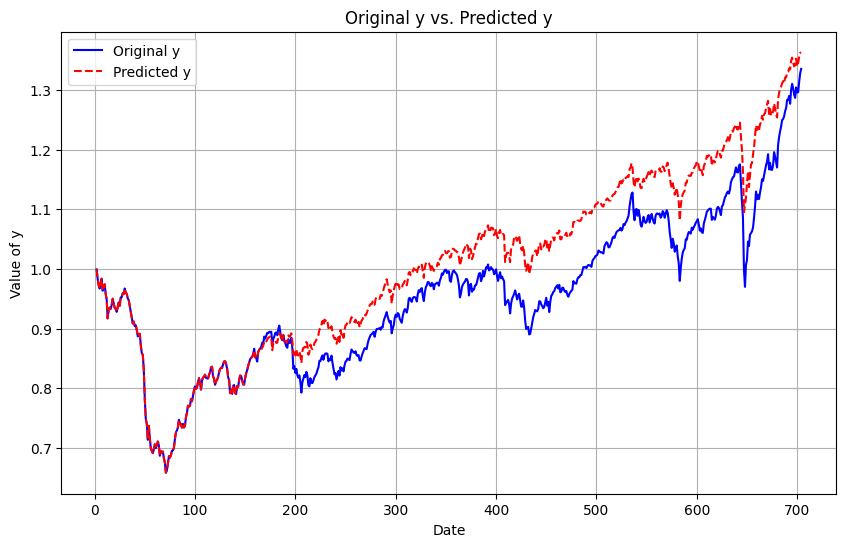

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.0011174923859985772 %
Upper Partial Moment: 6.490420853434413e-05
Lower Partial Moment: 0.0001420505110299758
Semi-Deviation: 0.008754133022612682
Value at Risk (VaR): -0.016042864963178933
Conditional Value at Risk (CVaR): -0.026191597713510897
Downside Deviation: 0.008754133022612682
Lower Partial Standard Deviation (LPSD): 0.008754133022612682
Omega Ratio: -1.263053832335978
Sortino Ratio: 0.04860726952999462
Conditional Drawdown at Risk (CDaR): 0.008087995181278113


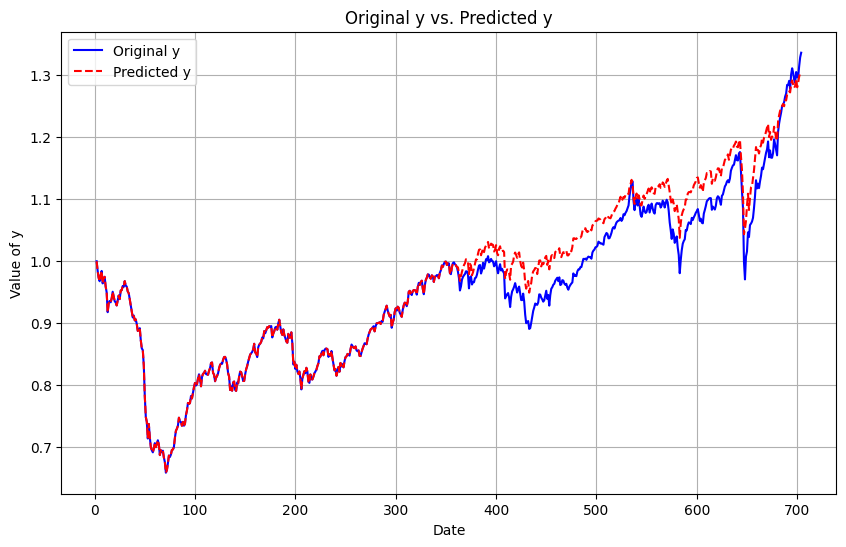

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.003765684284180921 %
Upper Partial Moment: 6.725074446126754e-05
Lower Partial Moment: 0.00014739333886359984
Semi-Deviation: 0.008770810824061243
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.02657887302127365
Downside Deviation: 0.008770810824061243
Lower Partial Standard Deviation (LPSD): 0.008770810824061243
Omega Ratio: -1.2761483080098448
Sortino Ratio: 0.04578503181833803
Conditional Drawdown at Risk (CDaR): 0.008394415783848808


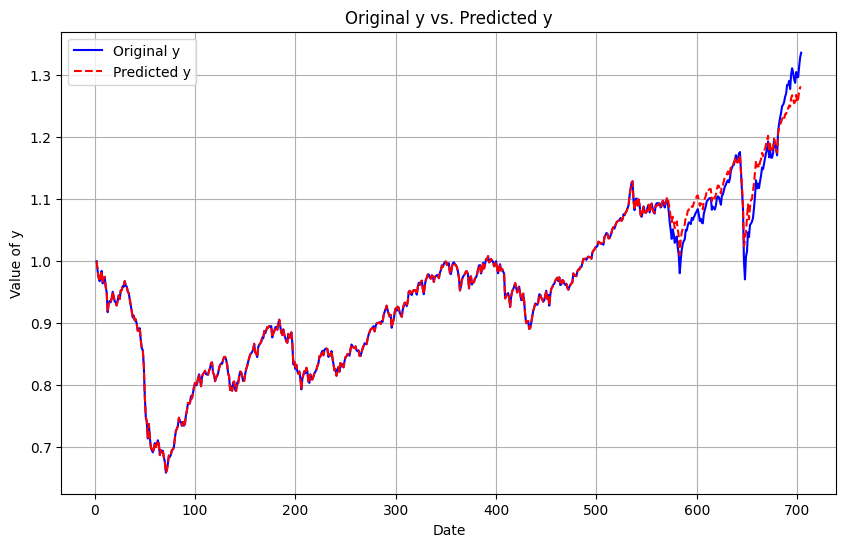

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


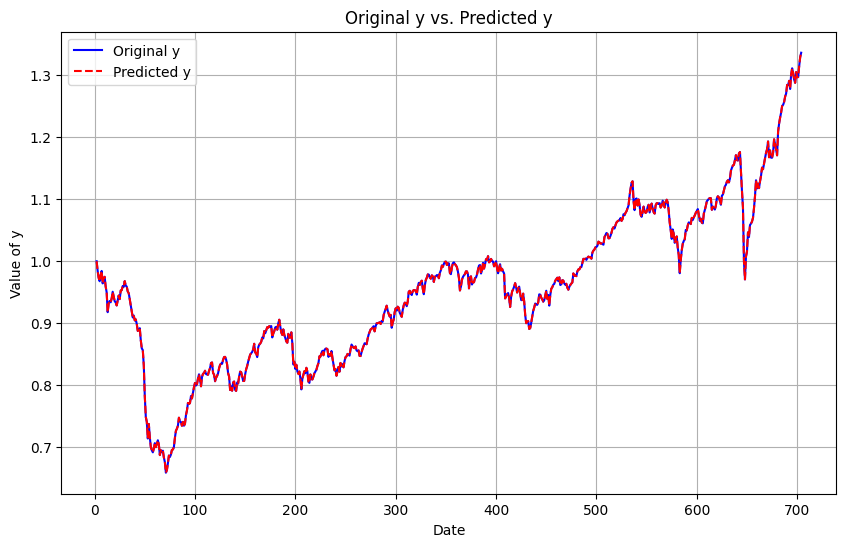

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: 0.011503553127681386 %
Upper Partial Moment: 2.5246740334959148e-05
Lower Partial Moment: 6.766871934423083e-05
Semi-Deviation: 0.006947804389461046
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.01892370724064365
Downside Deviation: 0.006947804389461046
Lower Partial Standard Deviation (LPSD): 0.006947804389461046
Omega Ratio: -1.4224246831272471
Sortino Ratio: -0.0058275043824010326
Conditional Drawdown at Risk (CDaR): 0.004404172284325021


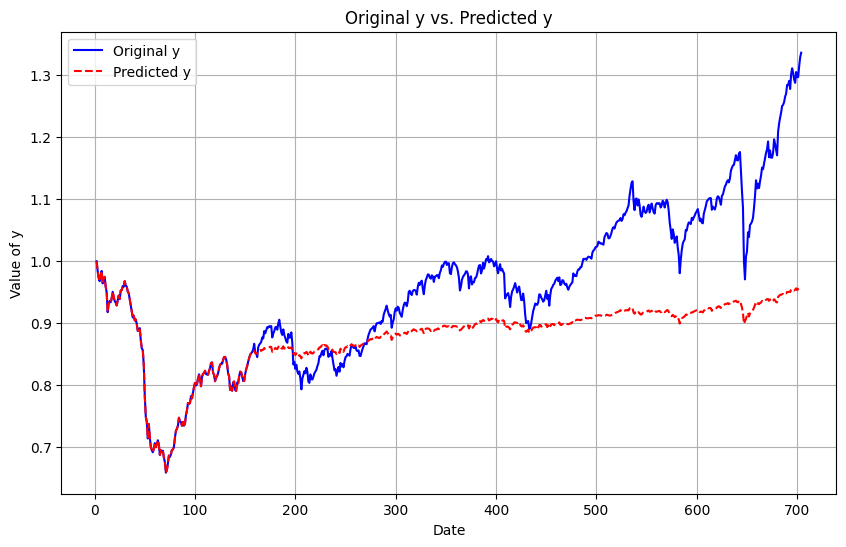

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.014655097865264158 %
Upper Partial Moment: 4.2324545070542545e-05
Lower Partial Moment: 9.333549795179437e-05
Semi-Deviation: 0.007573818314783057
Value at Risk (VaR): -0.013273510565063333
Conditional Value at Risk (CVaR): -0.022048387968554718
Downside Deviation: 0.007573818314783057
Lower Partial Standard Deviation (LPSD): 0.007573818314783057
Omega Ratio: -1.3082100531962968
Sortino Ratio: 0.019010768745751586
Conditional Drawdown at Risk (CDaR): 0.005997730744744308


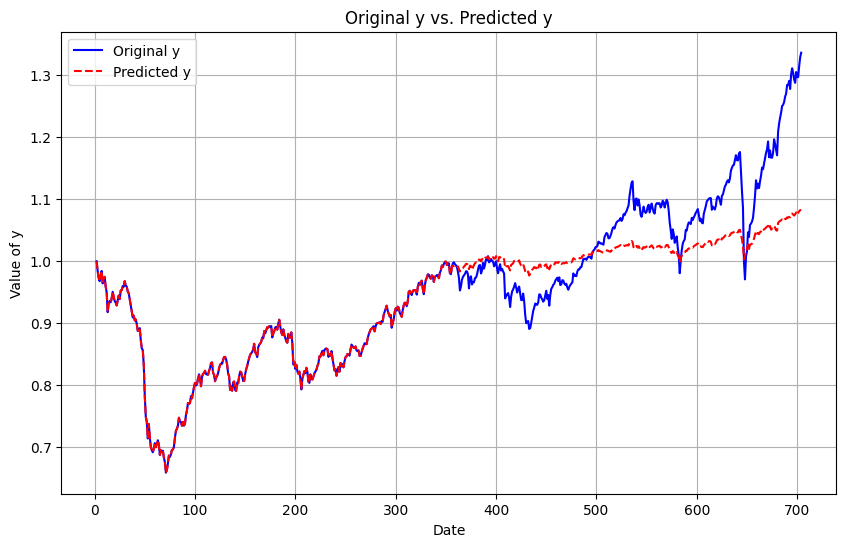

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.003844631213099849 %
Upper Partial Moment: 5.3115197812016566e-05
Lower Partial Moment: 0.00012159467390393666
Semi-Deviation: 0.008097155000347387
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024156236540904968
Downside Deviation: 0.008097155000347387
Lower Partial Standard Deviation (LPSD): 0.008097155000347387
Omega Ratio: -1.3429474271547552
Sortino Ratio: 0.029937805609262534
Conditional Drawdown at Risk (CDaR): 0.0074853693832893755


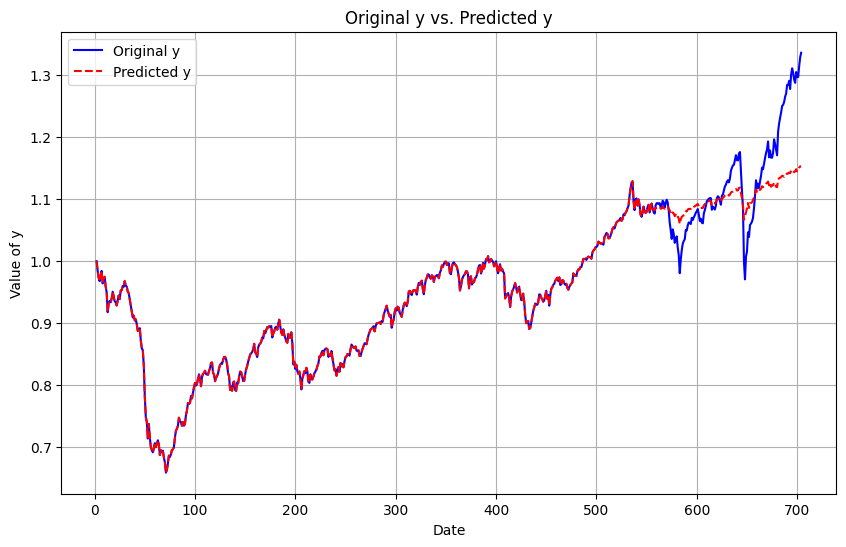

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


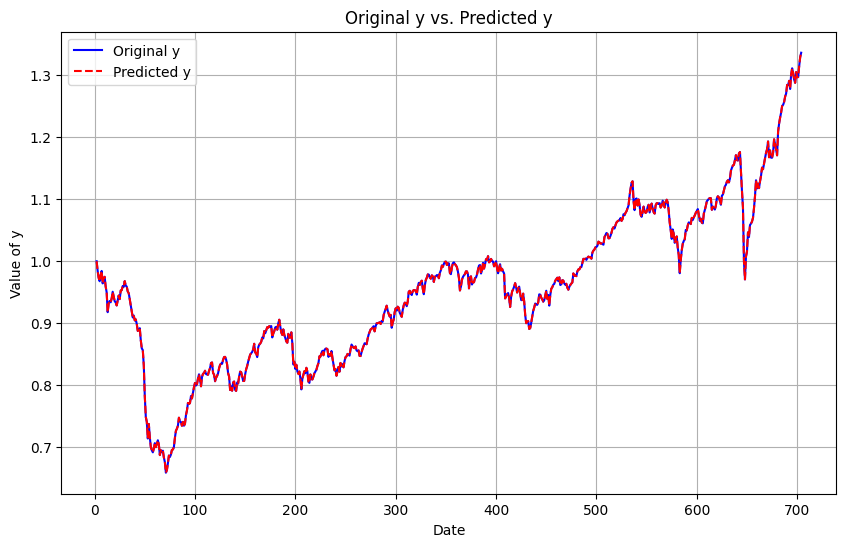

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.034672833244935156 %
Upper Partial Moment: 2.535435040715903e-05
Lower Partial Moment: 7.457270380428462e-05
Semi-Deviation: 0.007168343613245497
Value at Risk (VaR): -0.009532232327803576
Conditional Value at Risk (CVaR): -0.019096782152436695
Downside Deviation: 0.007168343613245497
Lower Partial Standard Deviation (LPSD): 0.007168343613245497
Omega Ratio: -1.4999828699058917
Sortino Ratio: 0.014654899141250493
Conditional Drawdown at Risk (CDaR): 0.004815345641459927


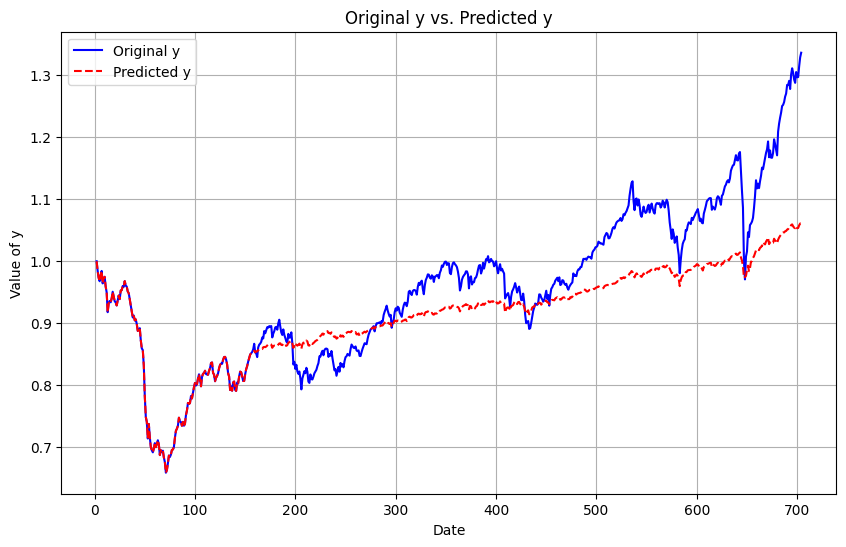

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.03275781301581677 %
Upper Partial Moment: 4.3341614895198666e-05
Lower Partial Moment: 9.224606272860295e-05
Semi-Deviation: 0.007557891805607478
Value at Risk (VaR): -0.013273510565063333
Conditional Value at Risk (CVaR): -0.022061108717011294
Downside Deviation: 0.007557891805607478
Lower Partial Standard Deviation (LPSD): 0.007557891805607478
Omega Ratio: -1.2571775824330529
Sortino Ratio: 0.022932793115076303
Conditional Drawdown at Risk (CDaR): 0.005926578623736826


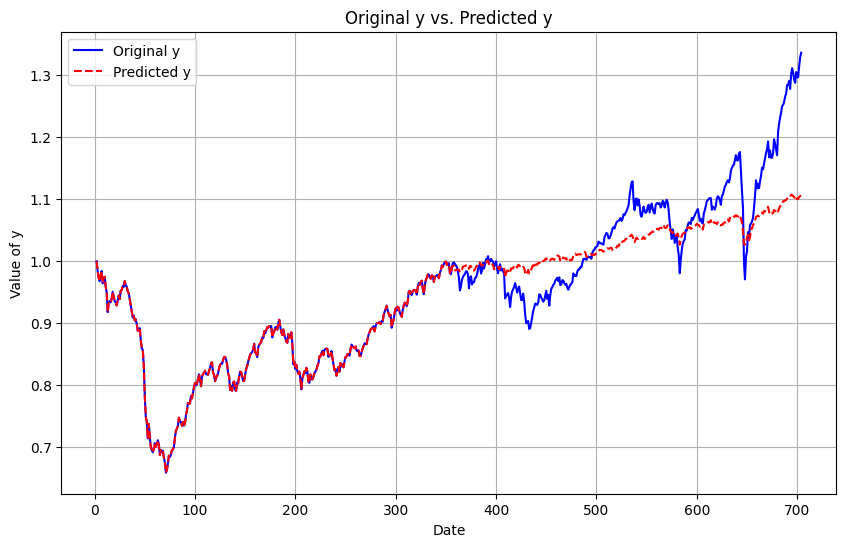

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.037744822586863326 %
Upper Partial Moment: 5.407542115099939e-05
Lower Partial Moment: 0.00011744601330003584
Semi-Deviation: 0.008059195324189935
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024029237917675188
Downside Deviation: 0.008059195324189935
Lower Partial Standard Deviation (LPSD): 0.008059195324189935
Omega Ratio: -1.2827261448601335
Sortino Ratio: 0.027230146748756817
Conditional Drawdown at Risk (CDaR): 0.007245369833665563


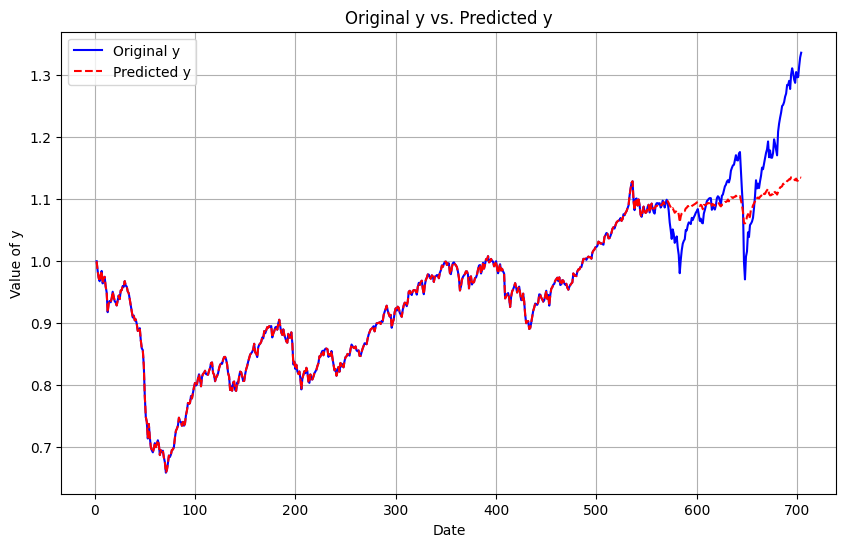

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


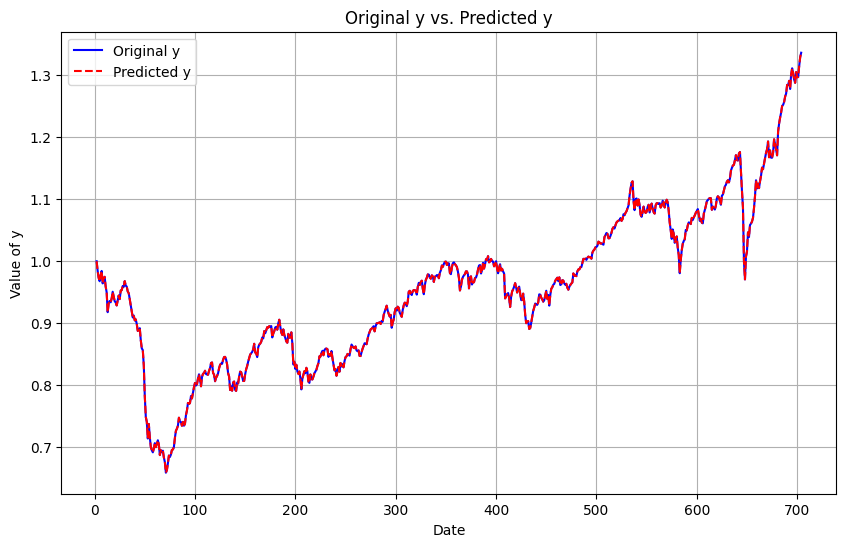

In [ ]:
model_function = perform_Ridge
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### ElasticNet

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.007861337788818229 %
Upper Partial Moment: 6.0740831940713224e-05
Lower Partial Moment: 0.00013780074209544167
Semi-Deviation: 0.008654464611248736
Value at Risk (VaR): -0.014940355113099725
Conditional Value at Risk (CVaR): -0.025521685428906163
Downside Deviation: 0.008654464611248736
Lower Partial Standard Deviation (LPSD): 0.008654464611248736
Omega Ratio: -1.2959603549897816


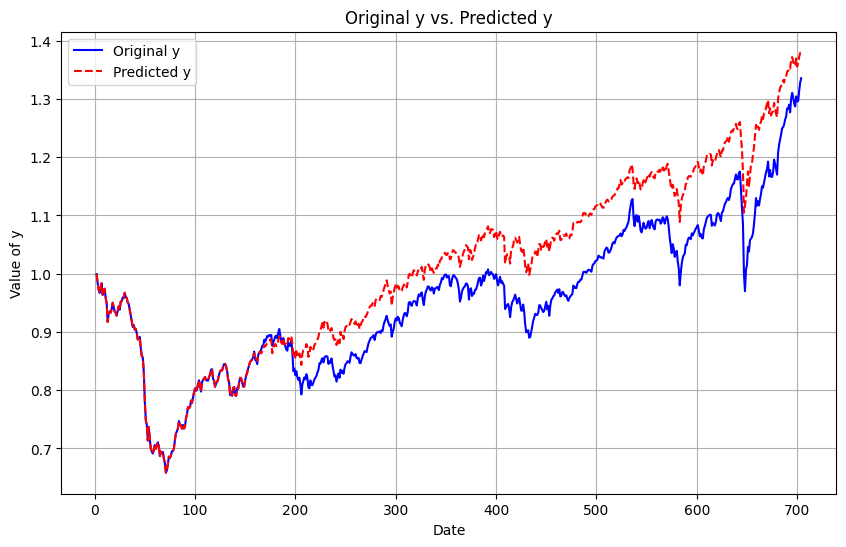

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.003074716496450627 %
Upper Partial Moment: 6.499959606293792e-05
Lower Partial Moment: 0.00014066101131284114
Semi-Deviation: 0.008737969502528536
Value at Risk (VaR): -0.016045524677325104
Conditional Value at Risk (CVaR): -0.026151397869208656
Downside Deviation: 0.008737969502528536
Lower Partial Standard Deviation (LPSD): 0.008737969502528536
Omega Ratio: -1.2491143368009103
Sortino Ratio: 0.04834595148640782
Conditional Drawdown at Risk (CDaR): 0.00801928302815921


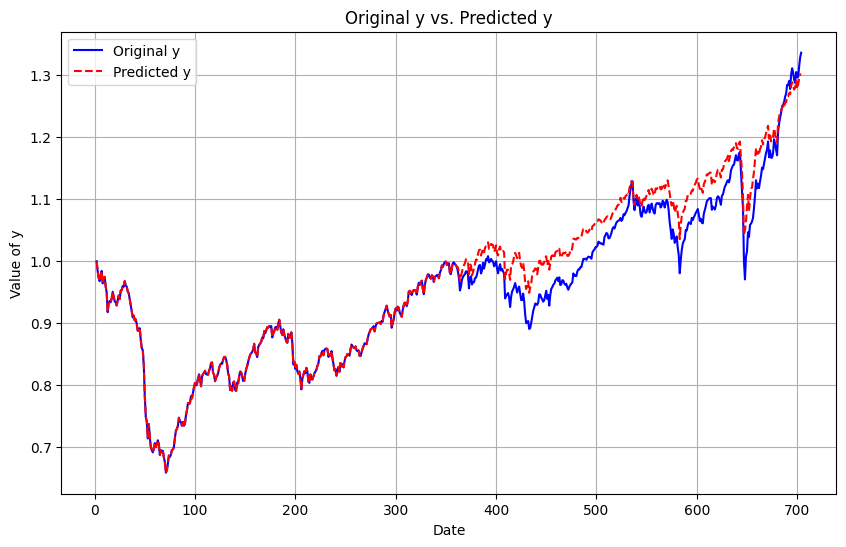

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.017337591674955726 %
Upper Partial Moment: 6.662695104989721e-05
Lower Partial Moment: 0.00014510624633596285
Semi-Deviation: 0.00869950120344612
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.02641506492491103
Downside Deviation: 0.00869950120344612
Lower Partial Standard Deviation (LPSD): 0.00869950120344612
Omega Ratio: -1.2711417096543385
Sortino Ratio: 0.045120414094525
Conditional Drawdown at Risk (CDaR): 0.008332162093190598


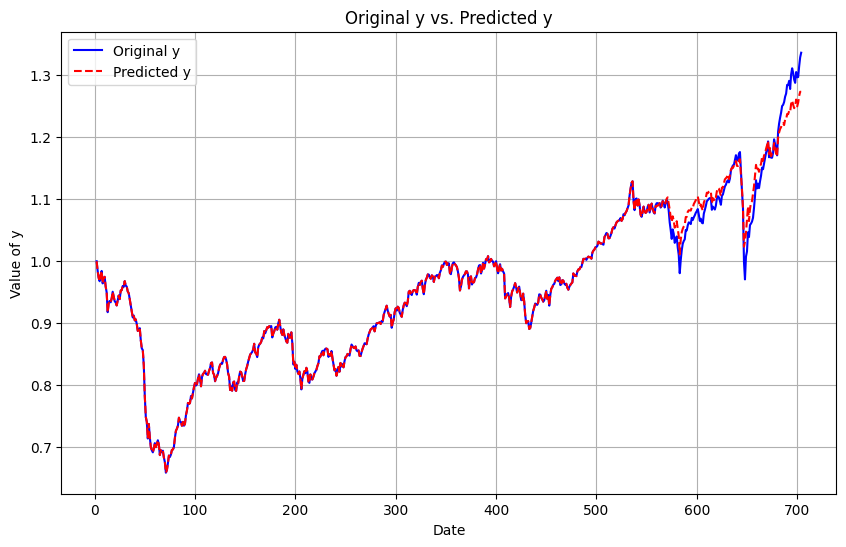

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


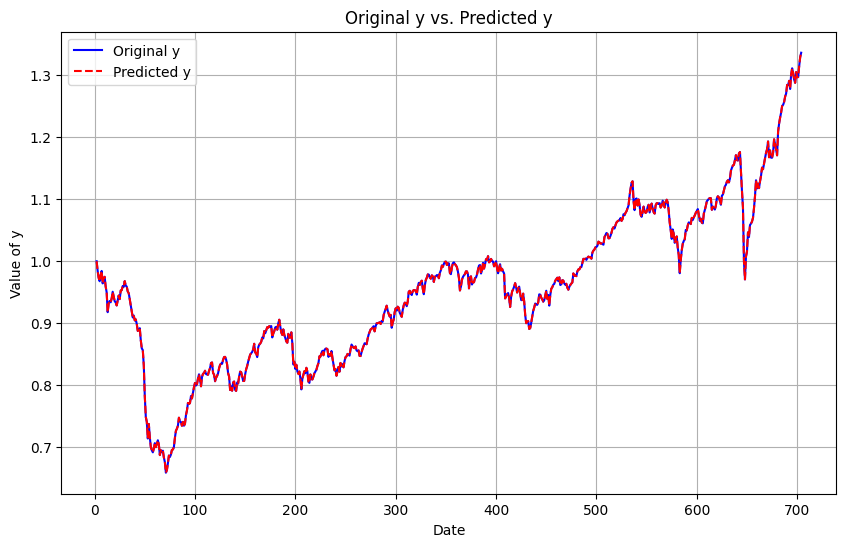

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -1.9493530247210056e-05 %
Upper Partial Moment: 2.5217764276395676e-05
Lower Partial Moment: 6.789909340527772e-05
Semi-Deviation: 0.00695455123895785
Value at Risk (VaR): -0.009371551705368594
Conditional Value at Risk (CVaR): -0.01892047026891184
Downside Deviation: 0.00695455123895785
Lower Partial Standard Deviation (LPSD): 0.00695455123895785
Omega Ratio: -1.4237541977949983
Sortino Ratio: -0.004546113550206803
Conditional Drawdown at Risk (CDaR): 0.004419650491836152


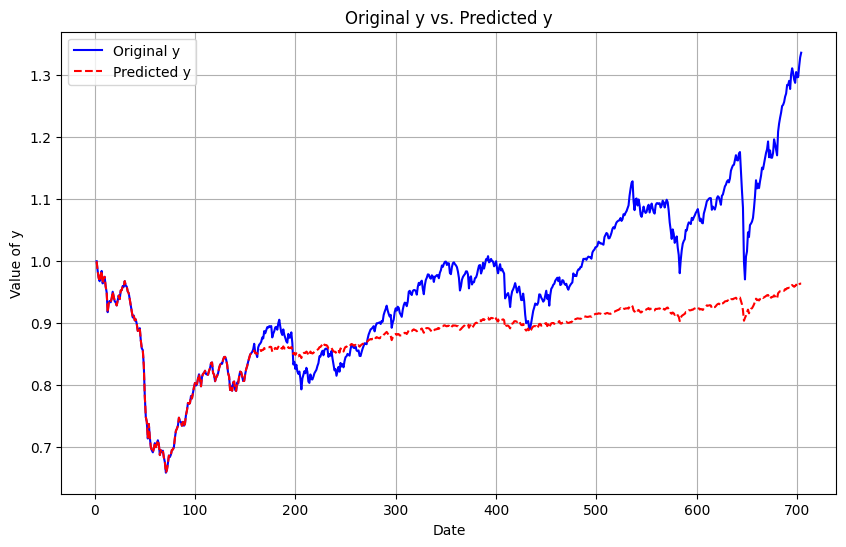

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.016485541340092565 %
Upper Partial Moment: 4.184667241305661e-05
Lower Partial Moment: 9.127641308173653e-05
Semi-Deviation: 0.007559614442258669
Value at Risk (VaR): -0.013022178046300214
Conditional Value at Risk (CVaR): -0.021937226632284843
Downside Deviation: 0.007559614442258669
Lower Partial Standard Deviation (LPSD): 0.007559614442258669
Omega Ratio: -1.3003522842860427
Sortino Ratio: 0.014789651380623733
Conditional Drawdown at Risk (CDaR): 0.005841972489333604


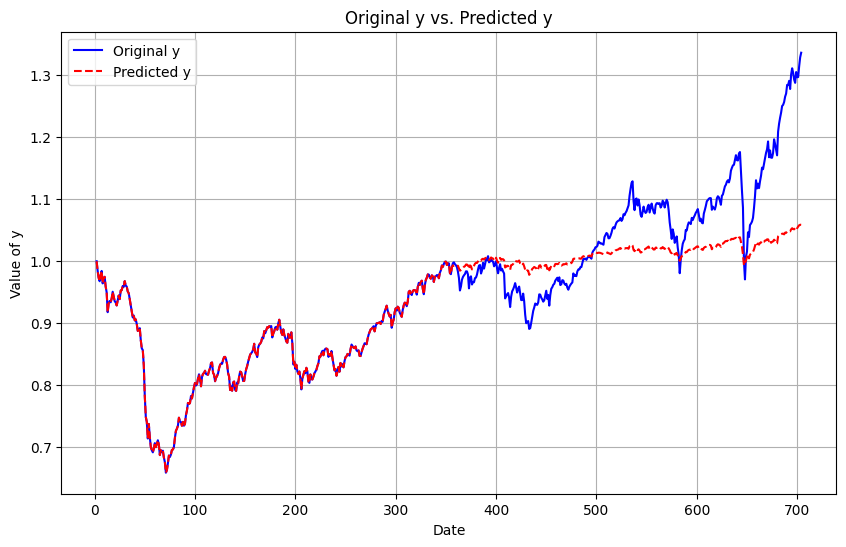

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.0022991777111592182 %
Upper Partial Moment: 5.381253910303812e-05
Lower Partial Moment: 0.00011911886720443314
Semi-Deviation: 0.008086398140896544
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.02415607760799914
Downside Deviation: 0.008086398140896544
Lower Partial Standard Deviation (LPSD): 0.008086398140896544
Omega Ratio: -1.2996347135729887
Sortino Ratio: 0.02897744844026045
Conditional Drawdown at Risk (CDaR): 0.00733000902532446


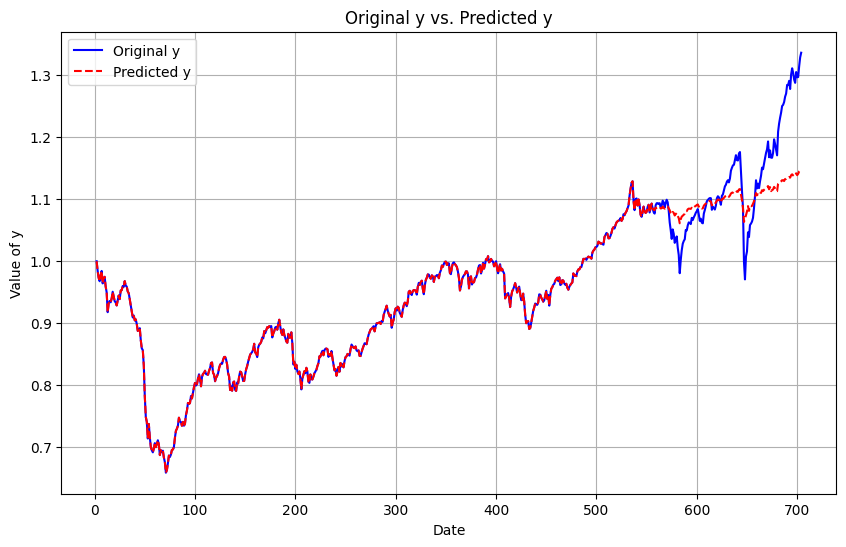

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


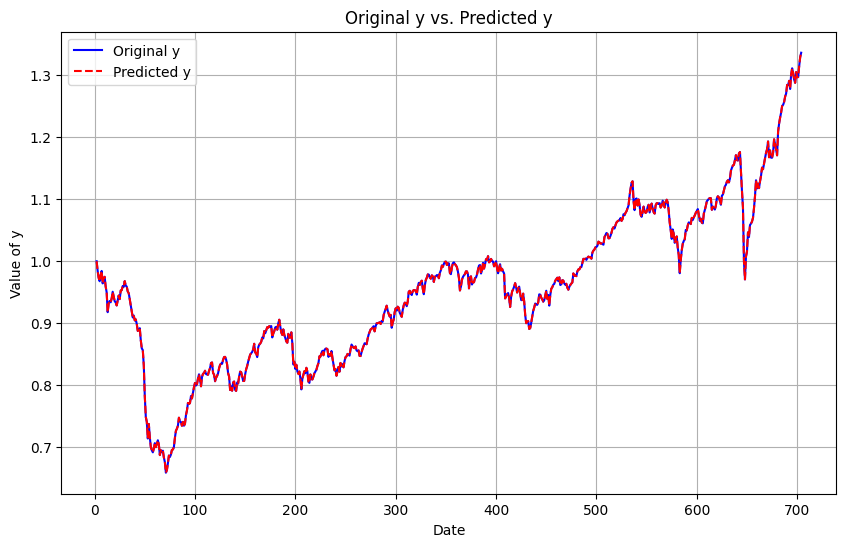

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.0 %
Upper Partial Moment: 0.00010812260053488014
Lower Partial Moment: 0.0002377244480233455
Semi-Deviation: 0.010566516315292106
Value at Risk (VaR): -0.008655094189447708
Conditional Value at Risk (CVaR): -0.01852442380334916
Downside Deviation: 0.010566516315292106
Lower Partial Standard Deviation (LPSD): 0.010566516315292106
Omega Ratio: -10.156955035141946
Sortino Ratio: -0.019907864854665964
Conditional Drawdown at Risk (CDaR): 0.01122823142716658


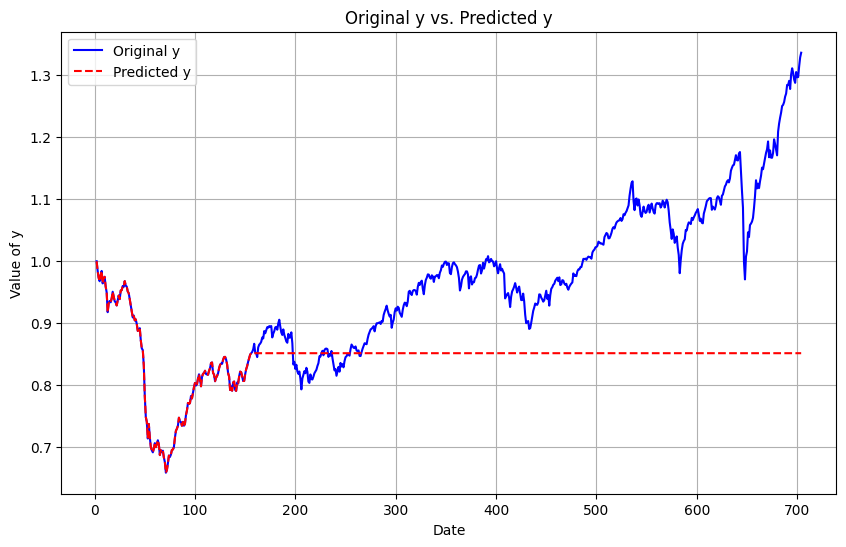

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.0 %
Upper Partial Moment: 8.175287588453309e-05
Lower Partial Moment: 0.00015810218610186254
Semi-Deviation: 0.00893453139930233
Value at Risk (VaR): -0.012656647352609662
Conditional Value at Risk (CVaR): -0.02180403925212308
Downside Deviation: 0.00893453139930233
Lower Partial Standard Deviation (LPSD): 0.00893453139930233
Omega Ratio: -3.314461315379931
Sortino Ratio: 0.0017242838511993925
Conditional Drawdown at Risk (CDaR): 0.008847391410847793


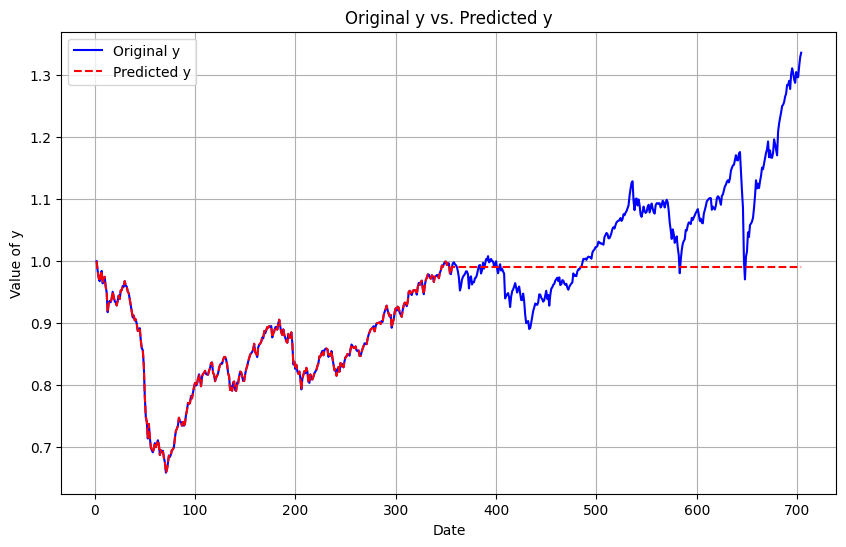

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.04244373826706839 %
Upper Partial Moment: 5.401173752644952e-05
Lower Partial Moment: 0.00011725438834077841
Semi-Deviation: 0.008058998471146446
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024016040982098977
Downside Deviation: 0.008058998471146446
Lower Partial Standard Deviation (LPSD): 0.008058998471146446
Omega Ratio: -1.2823356575778675
Sortino Ratio: 0.02730523168622704
Conditional Drawdown at Risk (CDaR): 0.007232353142846225


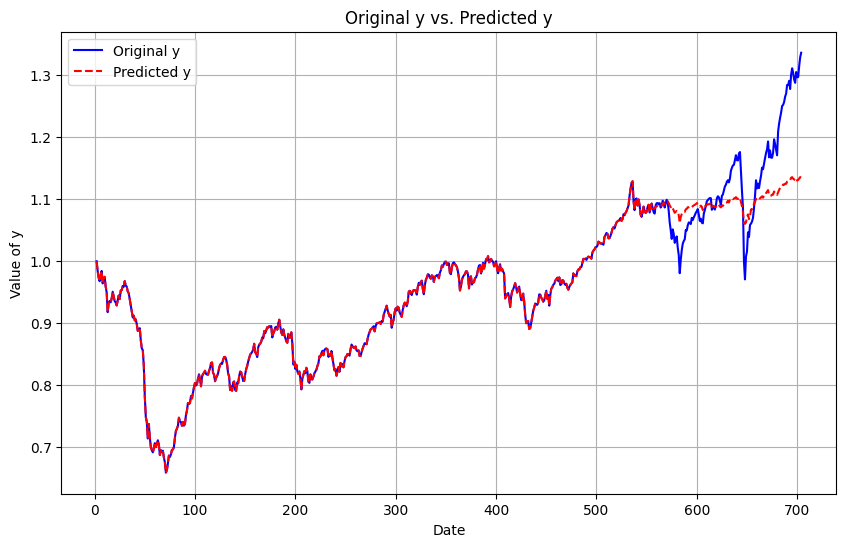

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


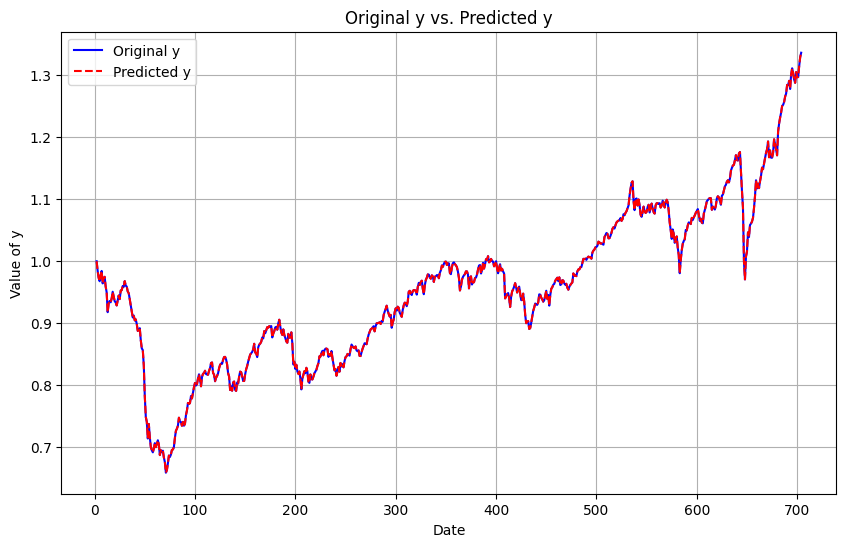

In [ ]:
model_function = perform_ElasticNet
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### ARIMA

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.006905782797538007 %
Upper Partial Moment: 6.197412984368013e-05
Lower Partial Moment: 0.0001413503670660964
Semi-Deviation: 0.008785297799066265
Value at Risk (VaR): -0.01536720406967274
Conditional Value at Risk (CVaR): -0.02587702197997306
Downside Deviation: 0.008785297799066265
Lower Partial Standard Deviation (LPSD): 0.008785297799066265
Omega Ratio: -1.2918912562714848
Sort

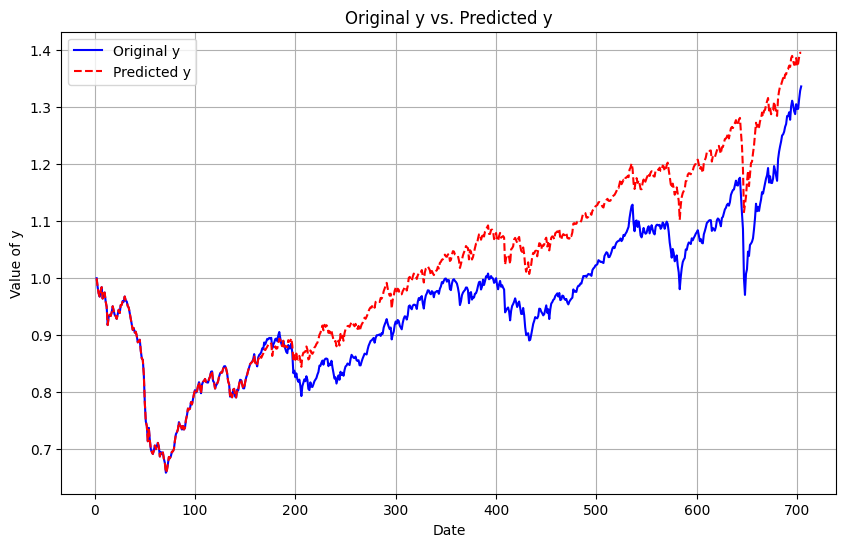

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.005662945129097799 %
Upper Partial Moment: 6.5170336000949e-05
Lower Partial Moment: 0.0001414730055442013
Semi-Deviation: 0.008772901023504745
Value at Risk (VaR): -0.016042864963178933
Conditional Value at Risk (CVaR): -0.026197174699385022
Downside Deviation: 0.008772901023504745
Lower Partial Standard Deviation (LPSD): 0.008772901023504745
Omega Ratio: -1.2487873716019986
Sortino Ratio: 0.04834057986320856
Conditional Drawdown at Risk (CDaR): 0.00803176276890638


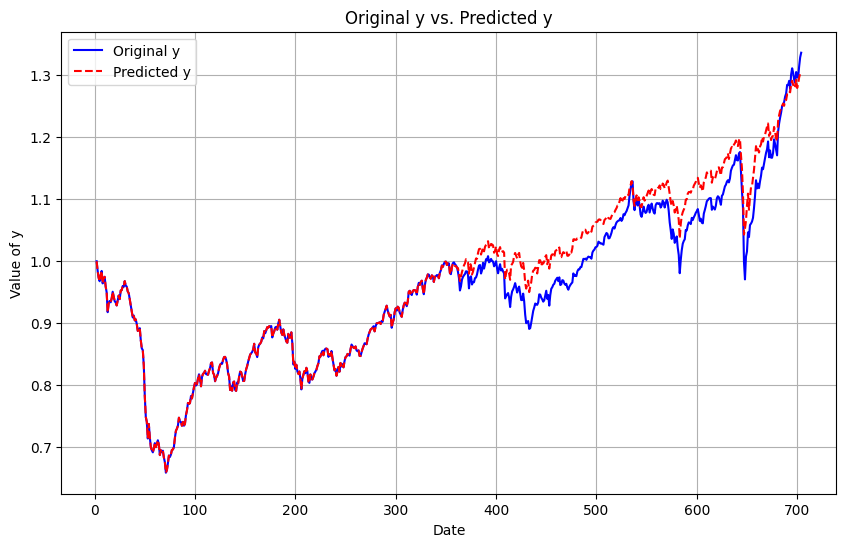

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.003521669004232734 %
Upper Partial Moment: 6.702803865846038e-05
Lower Partial Moment: 0.00014804473149774574
Semi-Deviation: 0.008780894633978823
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.026591343854239582
Downside Deviation: 0.008780894633978823
Lower Partial Standard Deviation (LPSD): 0.008780894633978823
Omega Ratio: -1.2840705503519727
Sortino Ratio: 0.04558882111189342
Conditional Drawdown at Risk (CDaR): 0.008422625536298503


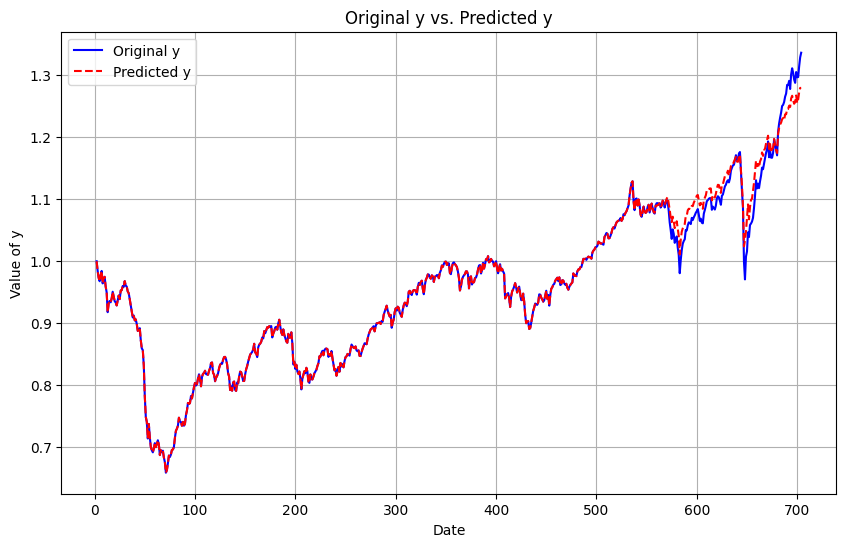

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


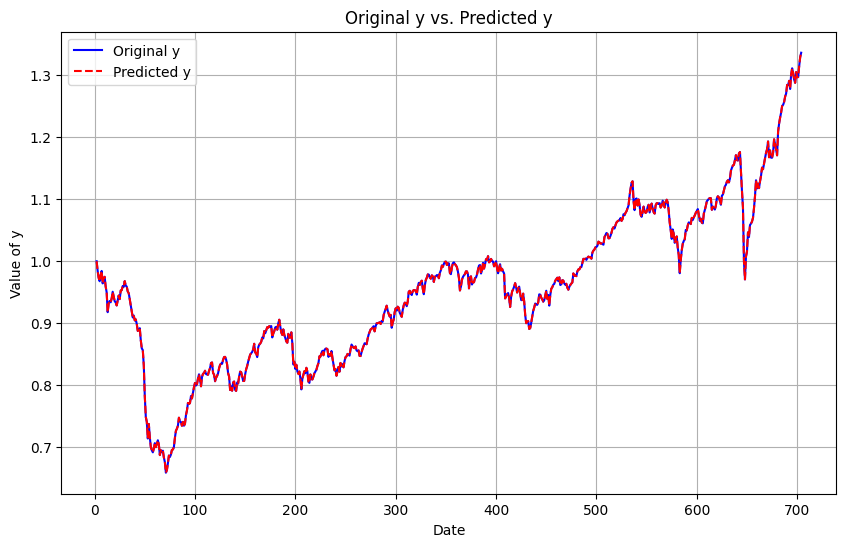

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: 0.0687388813222526 %
Upper Partial Moment: 2.598087486510797e-05
Lower Partial Moment: 6.425071640395931e-05
Semi-Deviation: 0.00679358450573341
Value at Risk (VaR): -0.009239161402227051
Conditional Value at Risk (CVaR): -0.018765770984932695
Downside Deviation: 0.00679358450573341
Lower Partial Standard Deviation (LPSD): 0.00679358450573341
Omega Ratio: -1.3609339570952284
Sortino Ratio: -0.012727662690079378
Conditional Drawdown at Risk (CDaR): 0.004254165719317744


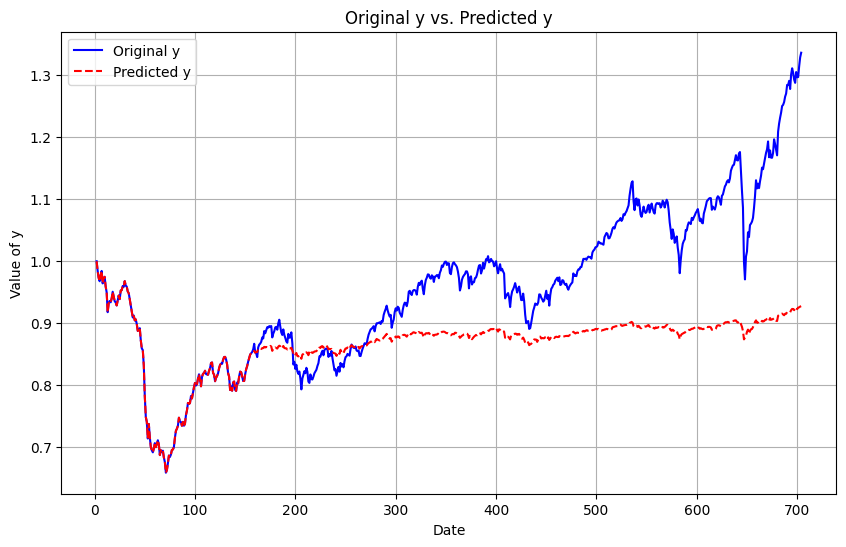

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.03565795225224401 %
Upper Partial Moment: 4.261660816487538e-05
Lower Partial Moment: 9.204140951690033e-05
Semi-Deviation: 0.007546953797009084
Value at Risk (VaR): -0.013097671579053255
Conditional Value at Risk (CVaR): -0.022009784985906746
Downside Deviation: 0.007546953797009084
Lower Partial Standard Deviation (LPSD): 0.007546953797009084
Omega Ratio: -1.2818619213951359
Sortino Ratio: 0.020036269579040377
Conditional Drawdown at Risk (CDaR): 0.00592325061961002


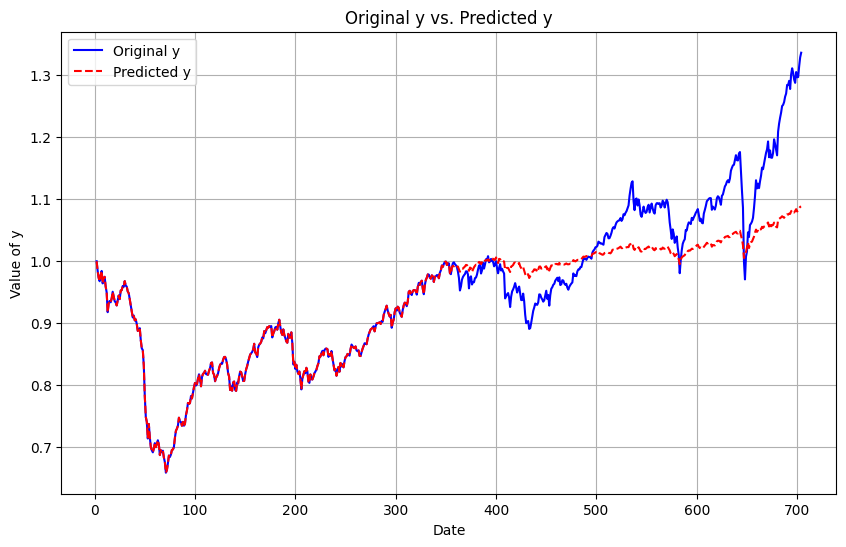

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.016739763456244117 %
Upper Partial Moment: 5.335018767116016e-05
Lower Partial Moment: 0.00012165161717336614
Semi-Deviation: 0.008092766410104337
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.02417440817863374
Downside Deviation: 0.008092766410104337
Lower Partial Standard Deviation (LPSD): 0.008092766410104337
Omega Ratio: -1.3364723184368392
Sortino Ratio: 0.03196510235781445
Conditional Drawdown at Risk (CDaR): 0.007493914131136887


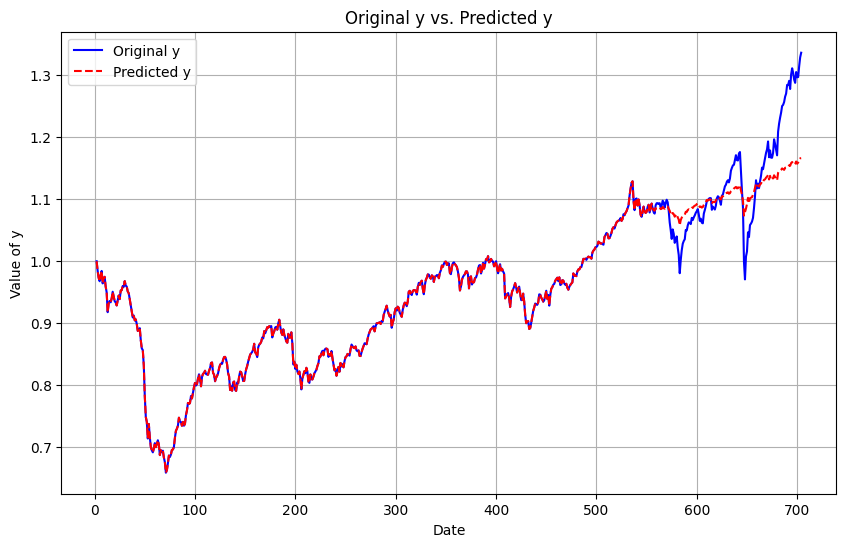

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


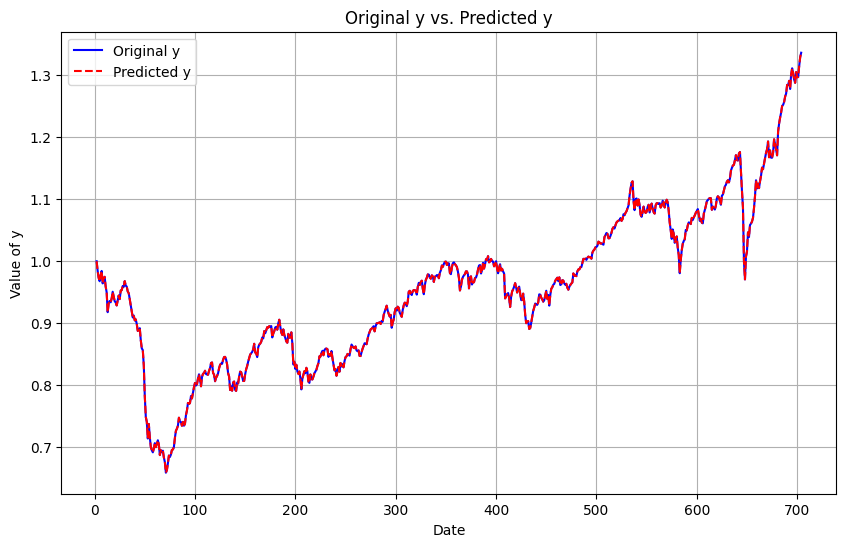

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.0908579823172543 %
Upper Partial Moment: 2.8657085720731664e-05
Lower Partial Moment: 7.780727330495561e-05
Semi-Deviation: 0.007160548802684188
Value at Risk (VaR): -0.010279130370883465
Conditional Value at Risk (CVaR): -0.019722324975990677
Downside Deviation: 0.007160548802684188
Lower Partial Standard Deviation (LPSD): 0.007160548802684188
Omega Ratio: -1.383671884764525
Sortino Ratio: 0.02278136050732169
Conditional Drawdown at Risk (CDaR): 0.005151098343978074


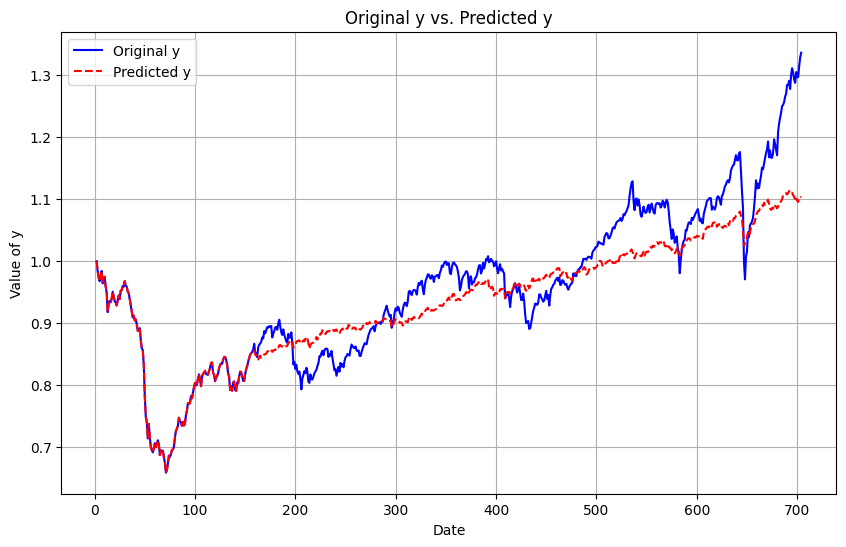

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.06564841599975237 %
Upper Partial Moment: 4.2631671536066506e-05
Lower Partial Moment: 9.463638310212729e-05
Semi-Deviation: 0.007596665268697436
Value at Risk (VaR): -0.013487555333348571
Conditional Value at Risk (CVaR): -0.02216109589828345
Downside Deviation: 0.007596665268697436
Lower Partial Standard Deviation (LPSD): 0.007596665268697436
Omega Ratio: -1.3050146429252922
Sortino Ratio: 0.02007228521812105
Conditional Drawdown at Risk (CDaR): 0.006076763933006893


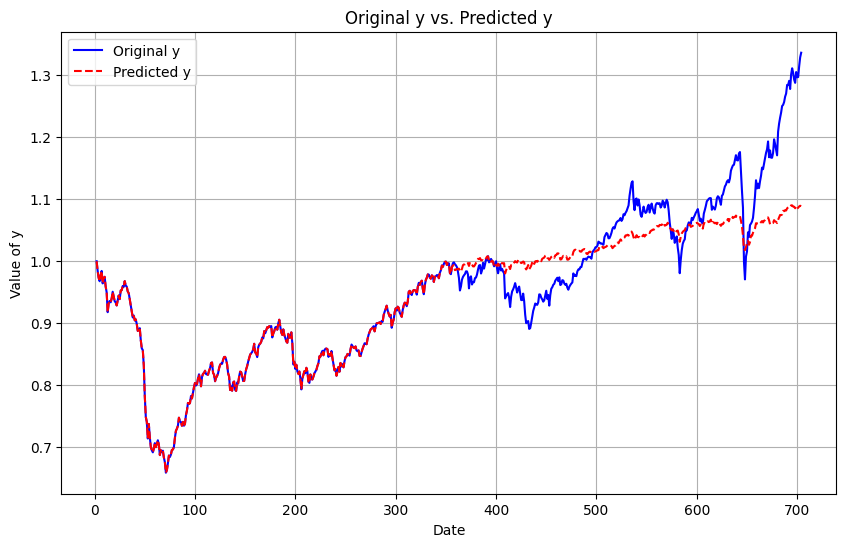

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.029955989863210148 %
Upper Partial Moment: 5.355986251202737e-05
Lower Partial Moment: 0.0001183381733520988
Semi-Deviation: 0.008052378687199192
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.02400649235277461
Downside Deviation: 0.008052378687199192
Lower Partial Standard Deviation (LPSD): 0.008052378687199192
Omega Ratio: -1.3085329993355748
Sortino Ratio: 0.023985719450089715
Conditional Drawdown at Risk (CDaR): 0.007314189690597244


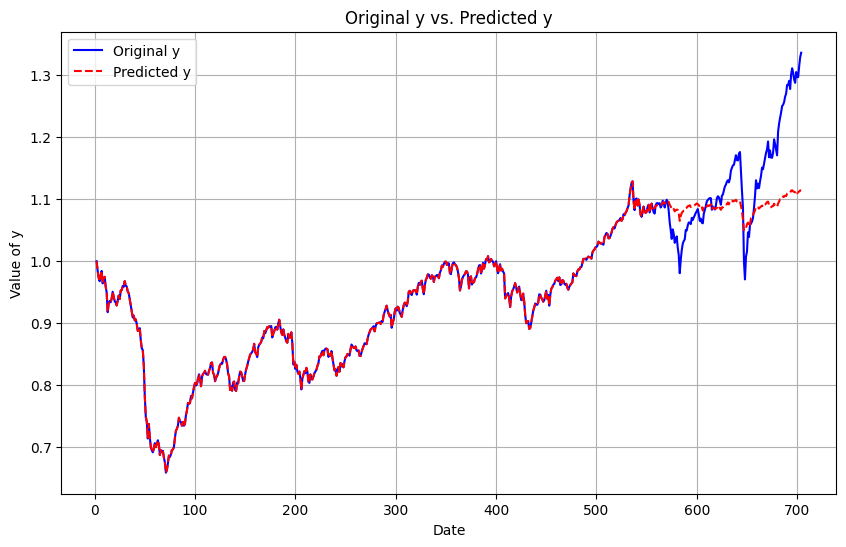

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


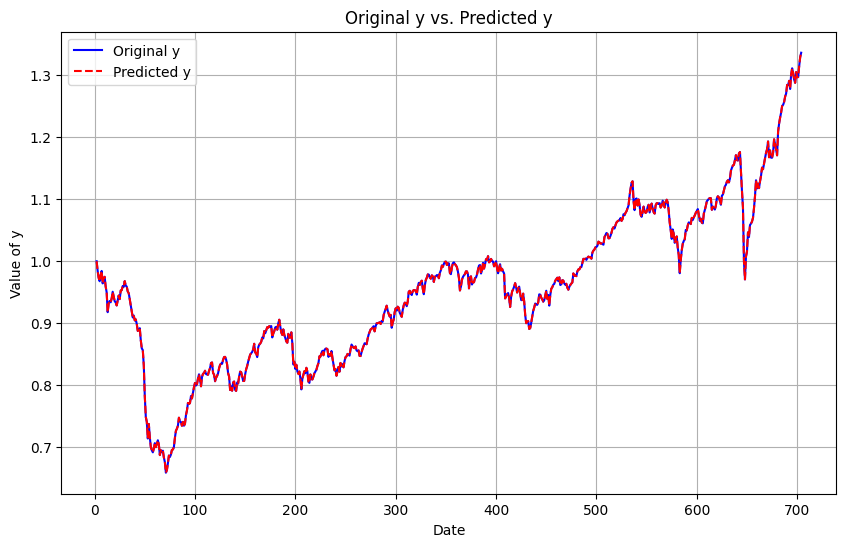

In [ ]:
model_function = perform_ARIMA
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### SARIMAX

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.006395291565543639 %
Upper Partial Moment: 5.496182686834188e-05
Lower Partial Moment: 0.00013109537867570328
Semi-Deviation: 0.008438735769099896
Value at Risk (VaR): -0.014221355299693691
Conditional Value at Risk (CVaR): -0.024723084535024566
Downside Deviation: 0.008438735769099896
Lower Partial Standard Deviation (LPSD): 0.008438735769099896
Omega Ratio: -1.3444618773628352
S

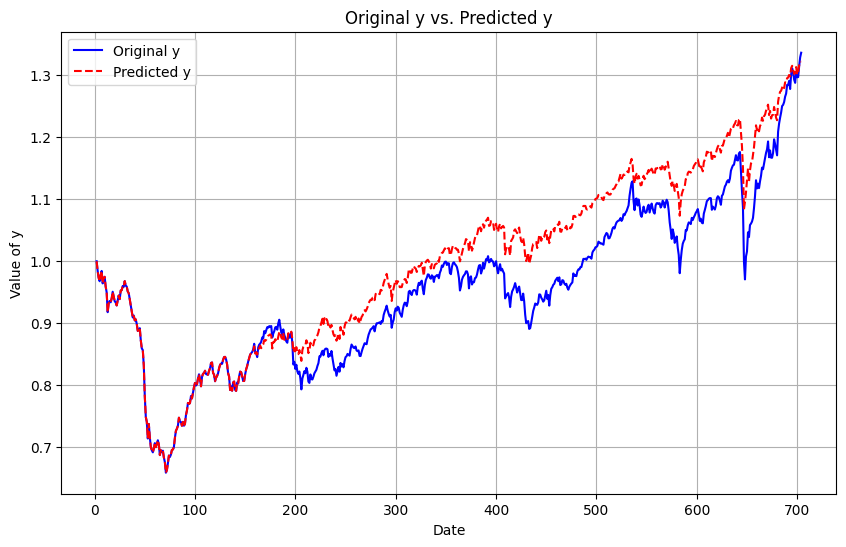

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.006304795933793081 %
Upper Partial Moment: 6.512203915419626e-05
Lower Partial Moment: 0.00014138603377964978
Semi-Deviation: 0.008769853034330968
Value at Risk (VaR): -0.016042864963178933
Conditional Value at Risk (CVaR): -0.026189487829860327
Downside Deviation: 0.008769853034330968
Lower Partial Standard Deviation (LPSD): 0.008769853034330968
Omega Ratio: -1.2490104436517393
Sortino Ratio: 0.04826826576658997
Conditional Drawdown at Risk (CDaR): 0.008029676925996815


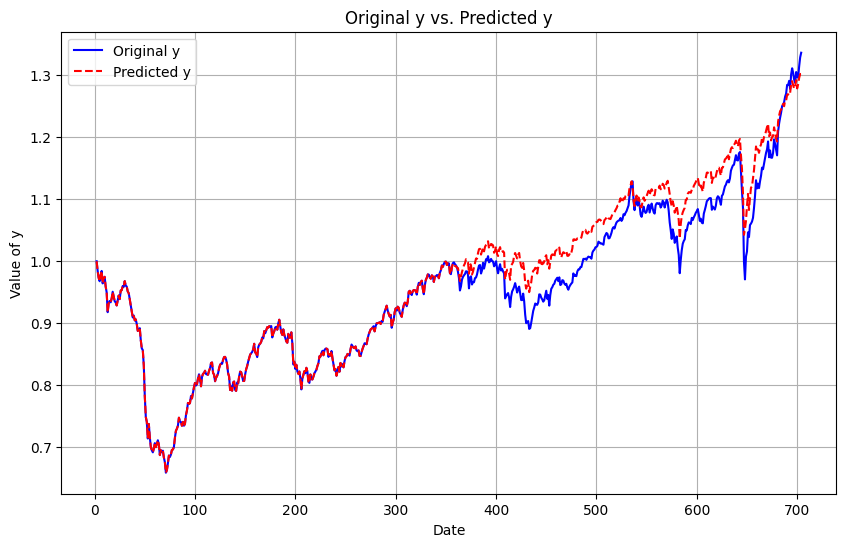

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.004444988234945501 %
Upper Partial Moment: 6.698769386976179e-05
Lower Partial Moment: 0.00014797478141787896
Semi-Deviation: 0.00877862396891563
Value at Risk (VaR): -0.016181798351298713
Conditional Value at Risk (CVaR): -0.026584121338355512
Downside Deviation: 0.00877862396891563
Lower Partial Standard Deviation (LPSD): 0.00877862396891563
Omega Ratio: -1.284195014986375
Sortino Ratio: 0.04554830654052843
Conditional Drawdown at Risk (CDaR): 0.008420839781771113


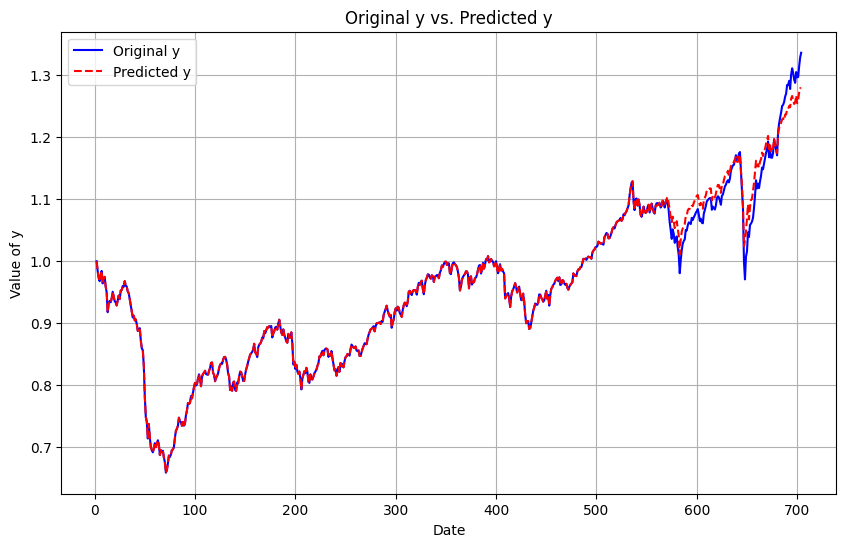

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


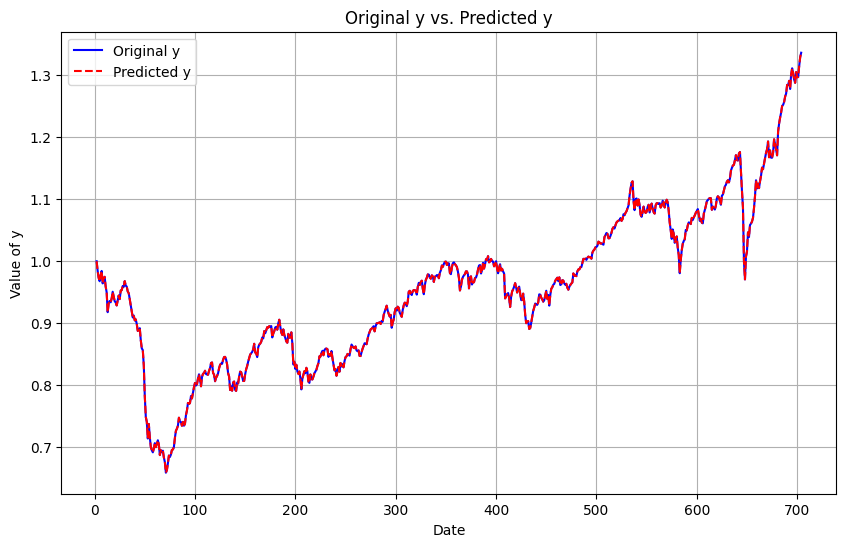

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: 0.05072248864852879 %
Upper Partial Moment: 2.6431220605888512e-05
Lower Partial Moment: 6.883663897253432e-05
Semi-Deviation: 0.006927098876931002
Value at Risk (VaR): -0.009383234216396575
Conditional Value at Risk (CVaR): -0.019020066059859828
Downside Deviation: 0.006927098876931002
Lower Partial Standard Deviation (LPSD): 0.006927098876931002
Omega Ratio: -1.3970273598253329
Sortino Ratio: -0.00437638749582771
Conditional Drawdown at Risk (CDaR): 0.004566392462519574


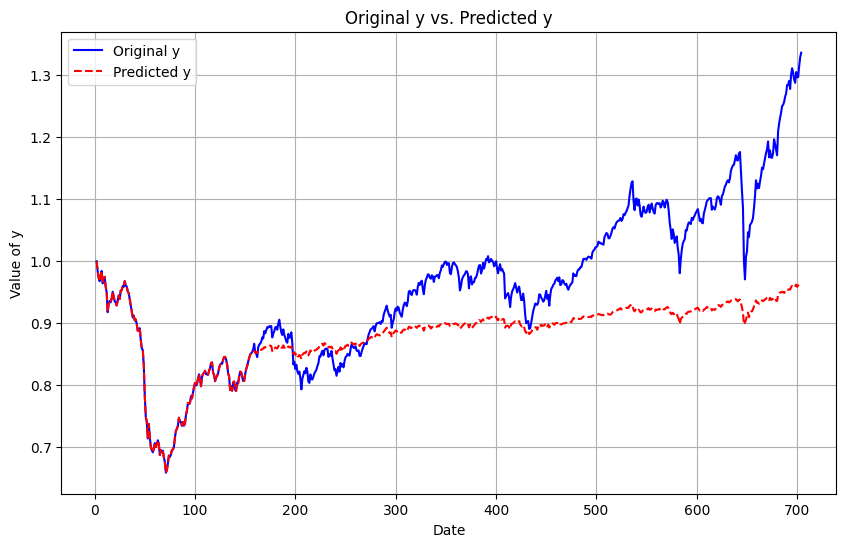

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: 0.021086385883887452 %
Upper Partial Moment: 4.298515688615527e-05
Lower Partial Moment: 9.312560900060109e-05
Semi-Deviation: 0.007563407198477425
Value at Risk (VaR): -0.013273510565063333
Conditional Value at Risk (CVaR): -0.022110863690543655
Downside Deviation: 0.007563407198477425
Lower Partial Standard Deviation (LPSD): 0.007563407198477425
Omega Ratio: -1.2829711768994103
Sortino Ratio: 0.019921442902864177
Conditional Drawdown at Risk (CDaR): 0.0059933697158293985


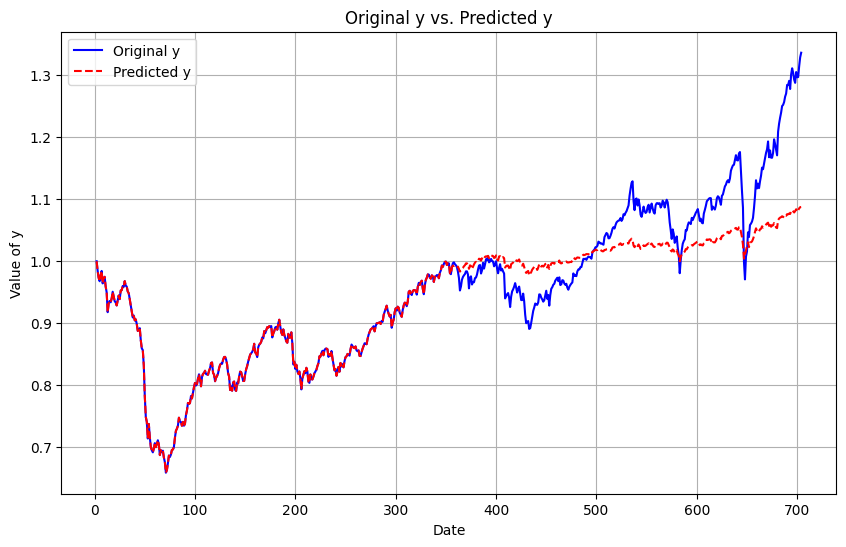

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: 0.02097162446981945 %
Upper Partial Moment: 5.373134198525278e-05
Lower Partial Moment: 0.00012071288112541951
Semi-Deviation: 0.008084381006244637
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024181704214802813
Downside Deviation: 0.008084381006244637
Lower Partial Standard Deviation (LPSD): 0.008084381006244637
Omega Ratio: -1.3193585947489437
Sortino Ratio: 0.030150167422319376
Conditional Drawdown at Risk (CDaR): 0.007440138766937783


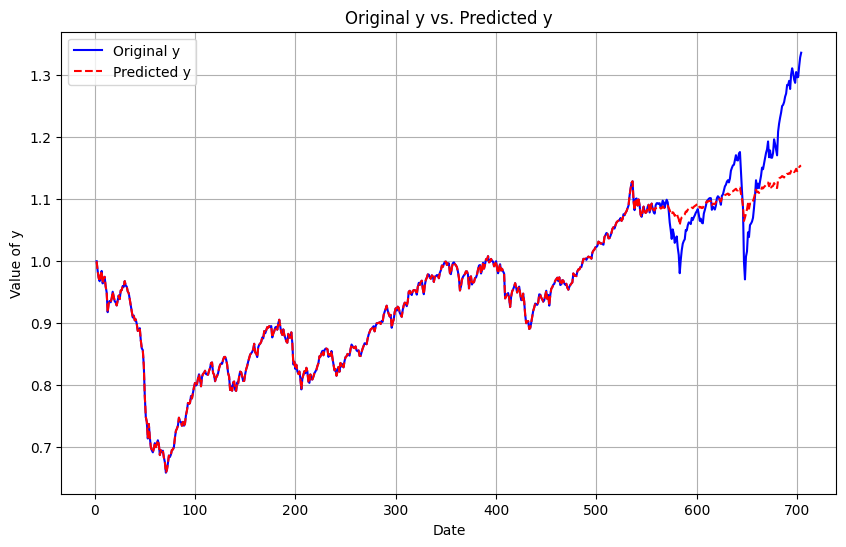

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


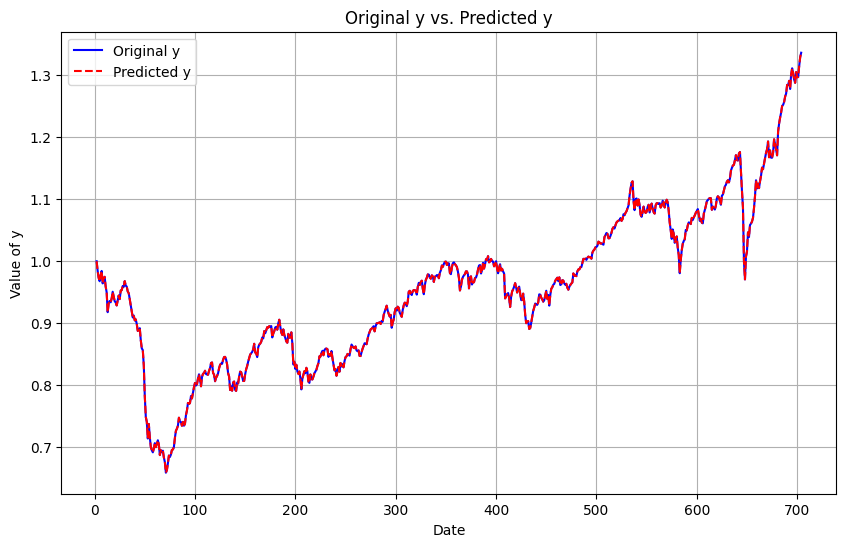

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
Return: -0.12066722781466808 %
Upper Partial Moment: 2.4538539724496905e-05
Lower Partial Moment: 7.111272653331236e-05
Semi-Deviation: 0.007100852481541368
Value at Risk (VaR): -0.009360583540775916
Conditional Value at Risk (CVaR): -0.01887945427297138
Downside Deviation: 0.007100852481541368
Lower Partial Standard Deviation (LPSD): 0.007100852481541368
Omega Ratio: -1.4599702514462065
Sortino Ratio: 0.010403230968513071
Conditional Drawdown at Risk (CDaR): 0.004548694380665748


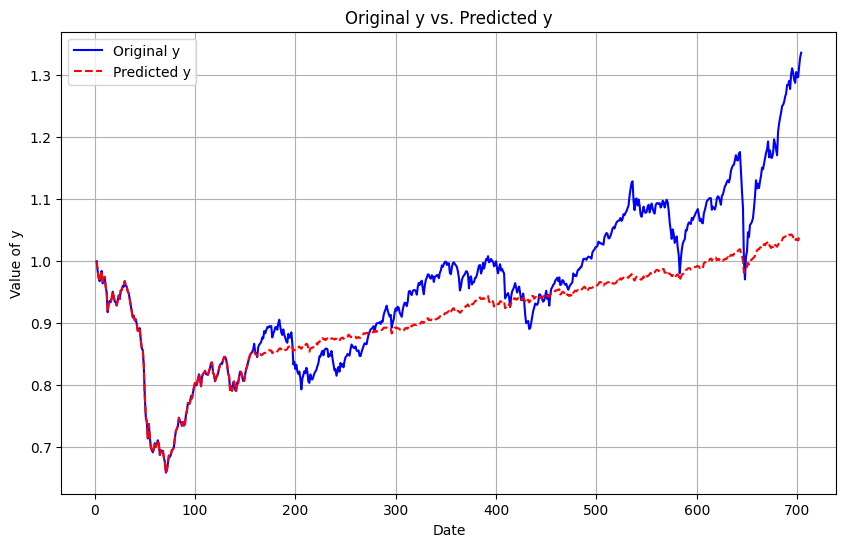

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
Return: -0.036500815721542755 %
Upper Partial Moment: 4.227416953320669e-05
Lower Partial Moment: 8.936904742088074e-05
Semi-Deviation: 0.007551293855021538
Value at Risk (VaR): -0.013022178046300214
Conditional Value at Risk (CVaR): -0.021900907266743368
Downside Deviation: 0.007551293855021538
Lower Partial Standard Deviation (LPSD): 0.007551293855021538
Omega Ratio: -1.2483801626812614
Sortino Ratio: 0.020587760461842373
Conditional Drawdown at Risk (CDaR): 0.005687443057824376


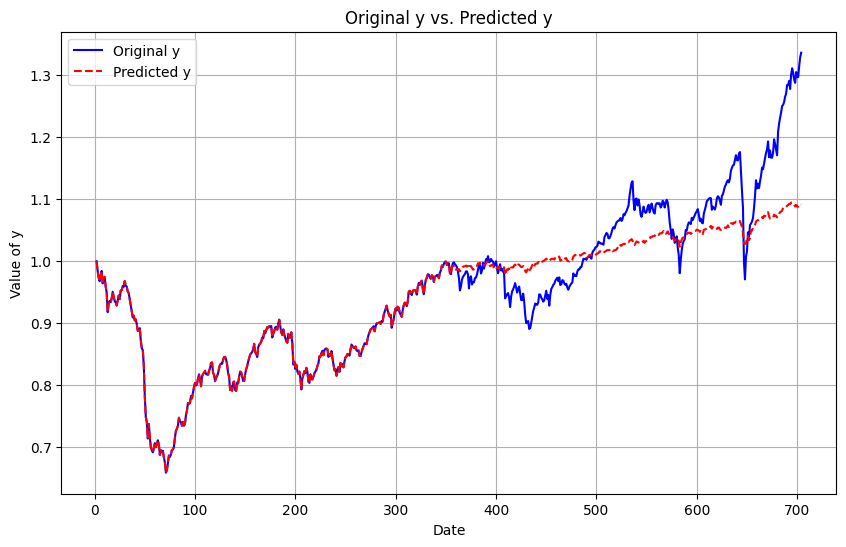

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
Return: -0.023056995777013634 %
Upper Partial Moment: 5.343784976022657e-05
Lower Partial Moment: 0.0001174613171955509
Semi-Deviation: 0.00807353136310342
Value at Risk (VaR): -0.014489887561122216
Conditional Value at Risk (CVaR): -0.02397039794005445
Downside Deviation: 0.00807353136310342
Lower Partial Standard Deviation (LPSD): 0.00807353136310342
Omega Ratio: -1.2994957369296996
Sortino Ratio: 0.02641813976101358
Conditional Drawdown at Risk (CDaR): 0.007230450091421441


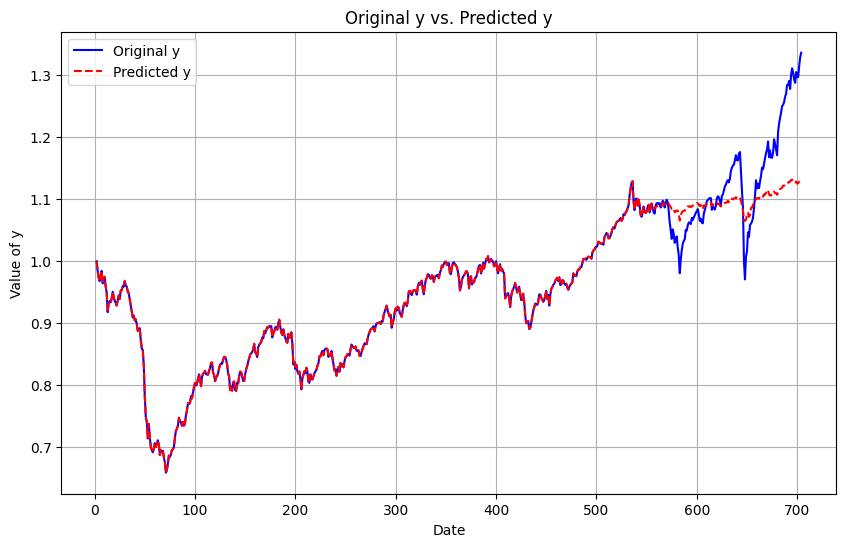

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


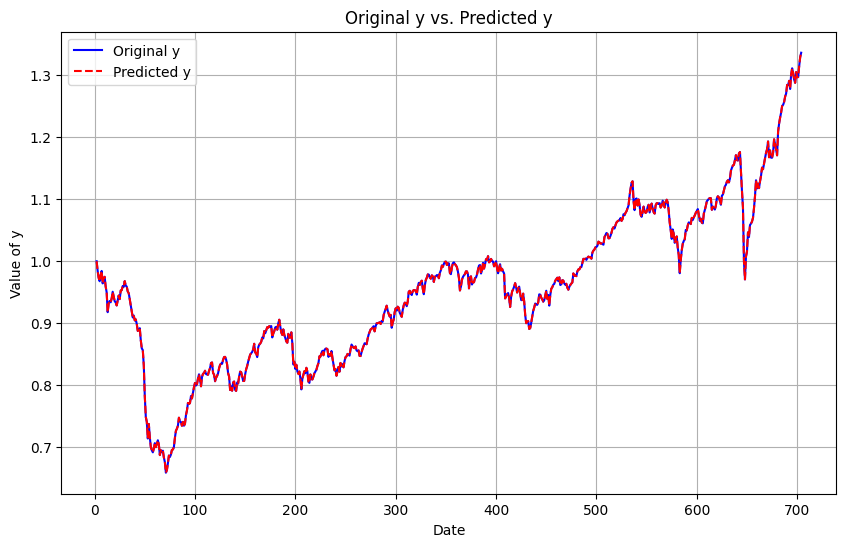

In [ ]:
model_function = perform_SARIMAX
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

#### Kalman Filter

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
0.0001710263183625562
Return: -0.16010990516003507 %
Upper Partial Moment: 5.4907721891533436e-05
Lower Partial Moment: 0.00011180720557916393
Semi-Deviation: 0.007921424542912189
Value at Risk (VaR): -0.014049469499380657
Conditional Value at Risk (CVaR): -0.023425243413096222
Downside Deviation: 0.007921424542912189
Lower Partial Standard Deviation (LPSD): 0.007921424542912189
Omega Ratio:

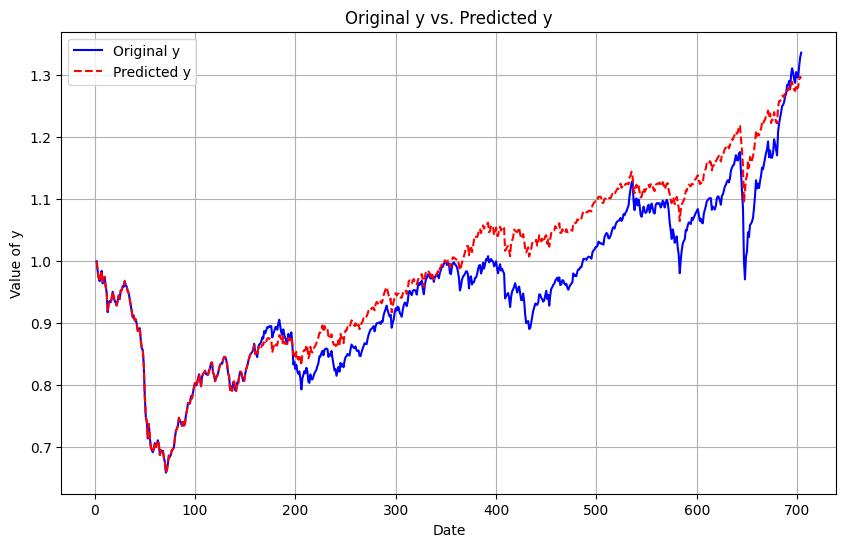

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
0.0001169223977166002
Return: 0.026136366532940433 %
Upper Partial Moment: 6.673171409582491e-05
Lower Partial Moment: 0.0001449307730441695
Semi-Deviation: 0.008915633682876286
Value at Risk (VaR): -0.016042864963178933
Conditional Value at Risk (CVaR): -0.026516641978231063
Downside Deviation: 0.008915633682876286
Lower Partial Standard Deviation (LPSD): 0.008915633682876286
Omega Ratio: -1.2457085040120803
Sortino Ratio: 0.05128614198986709
Conditional Drawdown at Risk (CDaR): 0.008089638377389394


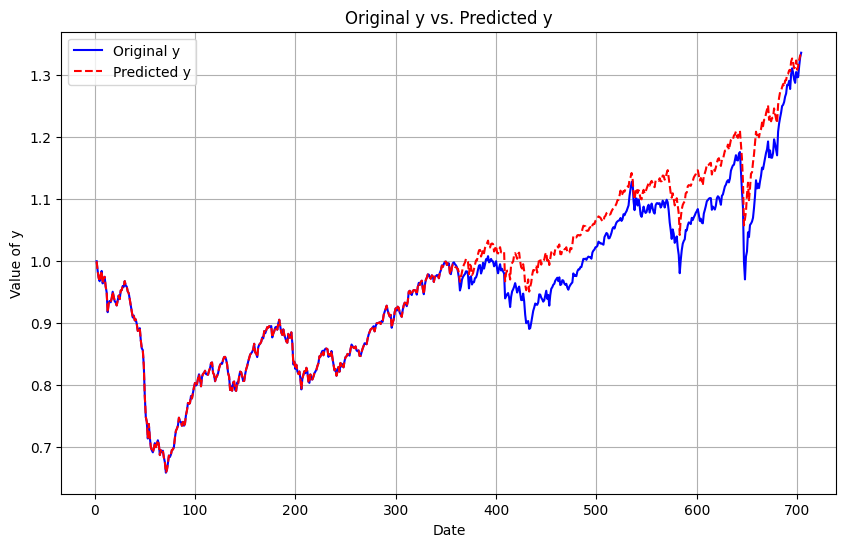

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
9.938825908666795e-05
Return: 0.01006706198479054 %
Upper Partial Moment: 6.66544481149096e-05
Lower Partial Moment: 0.00014893707356880852
Semi-Deviation: 0.008826075121940979
Value at Risk (VaR): -0.016127435948109857
Conditional Value at Risk (CVaR): -0.026570056202962024
Downside Deviation: 0.008826075121940979
Lower Partial Standard Deviation (LPSD): 0.008826075121940979
Omega Ratio: -1.2906025494039568
Sortino Ratio: 0.045580703799584385
Conditional Drawdown at Risk (CDaR): 0.008428373004955528


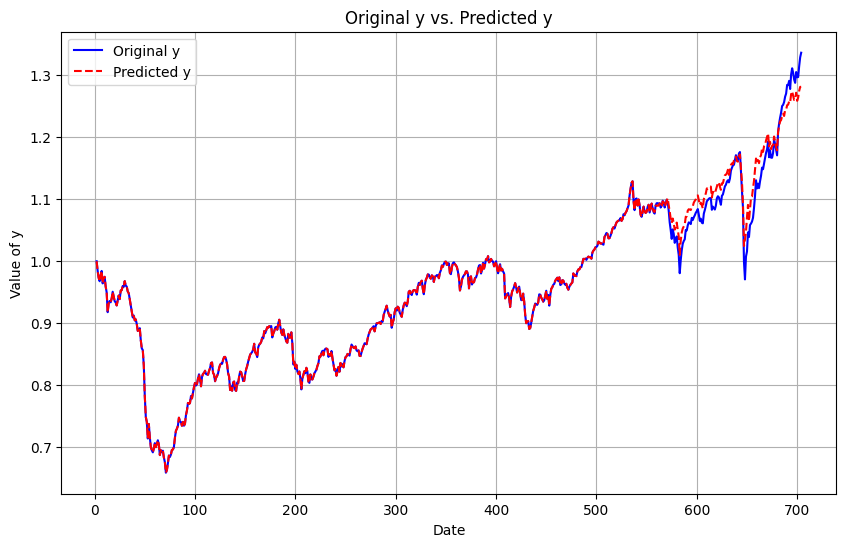

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
0.00011268575089582793
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


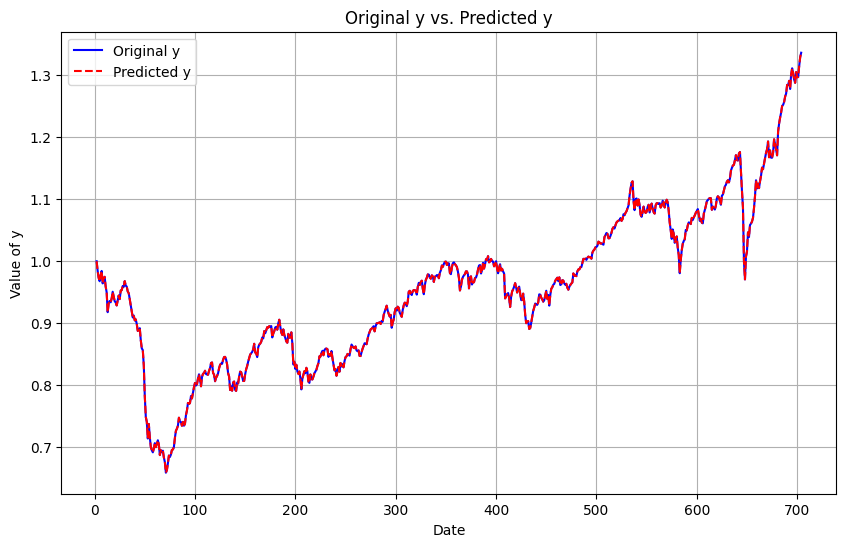

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
3.597636661128135e-05
Return: 0.06988026286793529 %
Upper Partial Moment: 2.3819137790267328e-05
Lower Partial Moment: 6.265161638254164e-05
Semi-Deviation: 0.006896902867726145
Value at Risk (VaR): -0.009239161402227051
Conditional Value at Risk (CVaR): -0.018644031051477796
Downside Deviation: 0.006896902867726145
Lower Partial Standard Deviation (LPSD): 0.006896902867726145
Omega Ratio: -1.4089433806325993
Sortino Ratio: -0.012560140138178235
Conditional Drawdown at Risk (CDaR): 0.00388385725995337


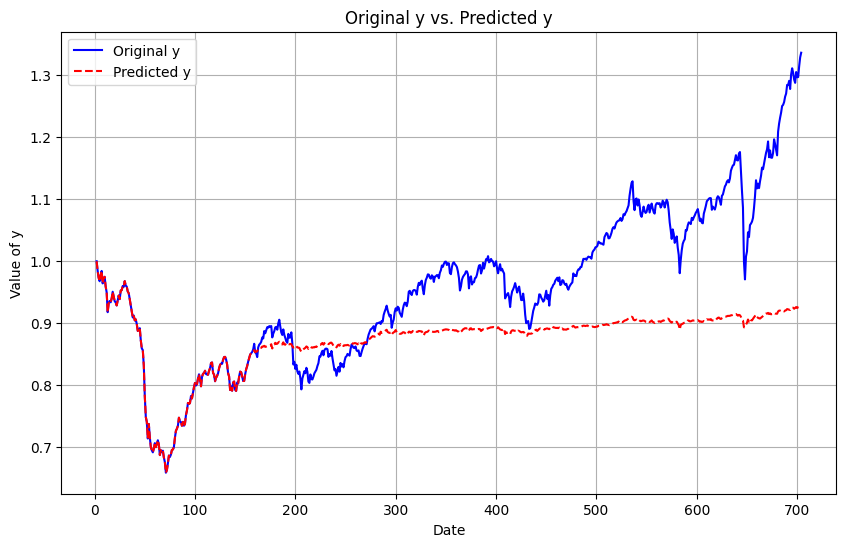

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
2.797685645083516e-05
Return: -0.025104254246487708 %
Upper Partial Moment: 4.272087309708225e-05
Lower Partial Moment: 7.938713504187271e-05
Semi-Deviation: 0.007450626374062114
Value at Risk (VaR): -0.012656647352609662
Conditional Value at Risk (CVaR): -0.02180403925212308
Downside Deviation: 0.007450626374062114
Lower Partial Standard Deviation (LPSD): 0.007450626374062114
Omega Ratio: -1.1389068882733322
Sortino Ratio: 0.002930295223214408
Conditional Drawdown at Risk (CDaR): 0.004886235941499628


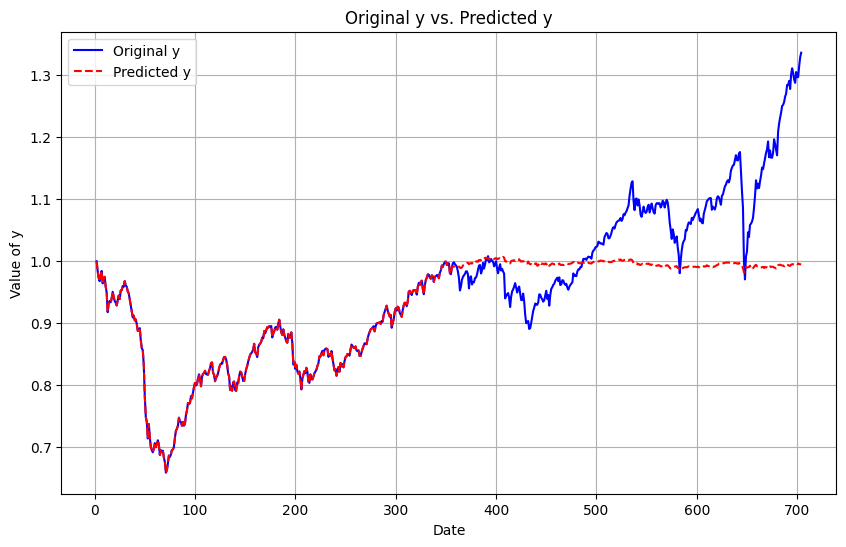

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
2.399527598846436e-05
Return: 0.014966123684927288 %
Upper Partial Moment: 5.280495213897483e-05
Lower Partial Moment: 0.00011792785573757279
Semi-Deviation: 0.008114684049193544
Value at Risk (VaR): -0.014927496199047192
Conditional Value at Risk (CVaR): -0.024039021853632308
Downside Deviation: 0.008114684049193544
Lower Partial Standard Deviation (LPSD): 0.008114684049193544
Omega Ratio: -1.3162400943452717
Sortino Ratio: 0.02562112743946706
Conditional Drawdown at Risk (CDaR): 0.007216630690241578


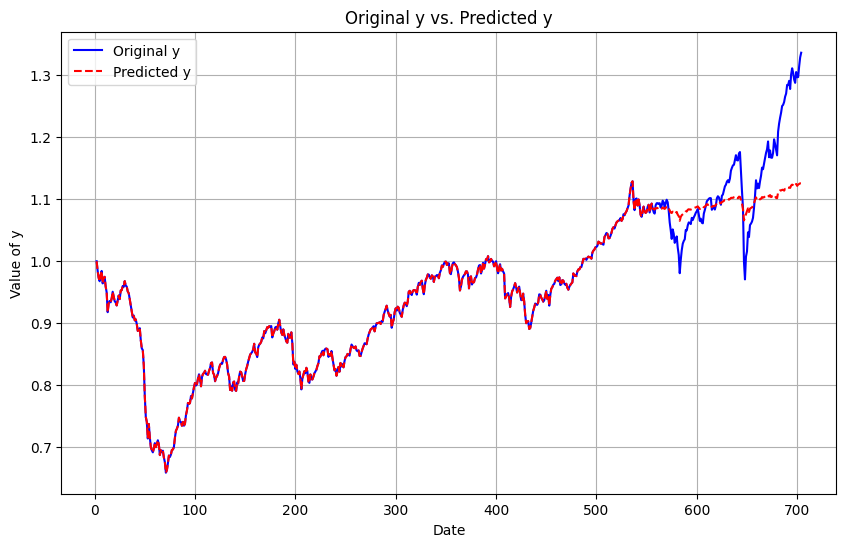

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
2.8704456207192308e-05
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


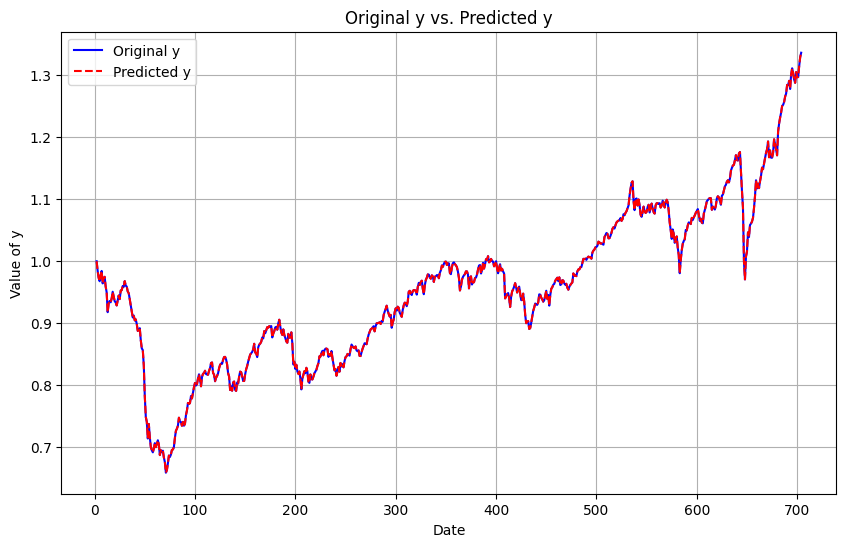

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: False
7.305754726449564e-05
Return: -0.29985577170206573 %
Upper Partial Moment: 4.000485130536313e-05
Lower Partial Moment: 7.7876059113187e-05
Semi-Deviation: 0.006867275606441536
Value at Risk (VaR): -0.01058788626866146
Conditional Value at Risk (CVaR): -0.02019626778454864
Downside Deviation: 0.006867275606441536
Lower Partial Standard Deviation (LPSD): 0.006867275606441536
Omega Ratio: -1.190188502109077
Sortino Ratio: 0.023189620120652264
Conditional Drawdown at Risk (CDaR): 0.005542254492384849


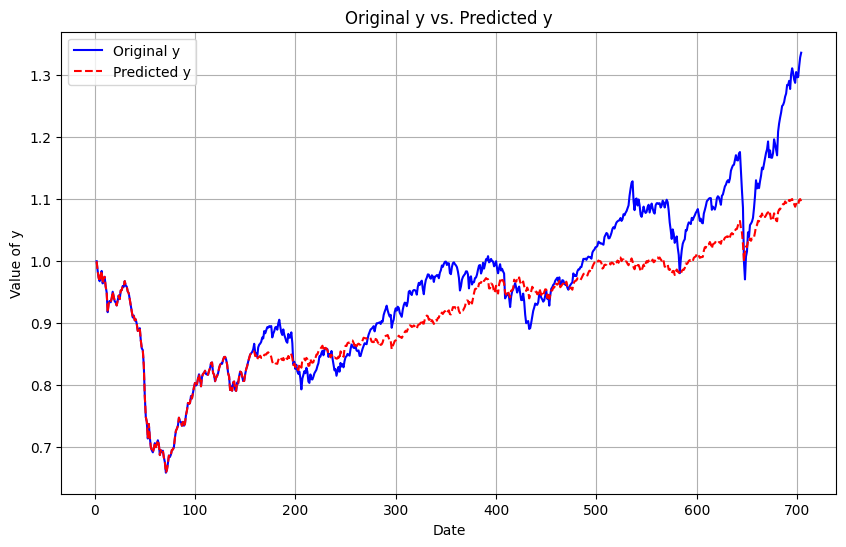

Starting training from observation 1
Starting prediction from observation 356
Using rolling window: False
5.104170100248499e-05
Return: 0.07634494559335529 %
Upper Partial Moment: 6.267725741458572e-05
Lower Partial Moment: 0.00012421432418484654
Semi-Deviation: 0.008260572837920968
Value at Risk (VaR): -0.014948391102789251
Conditional Value at Risk (CVaR): -0.025026907623950514
Downside Deviation: 0.008260572837920968
Lower Partial Standard Deviation (LPSD): 0.008260572837920968
Omega Ratio: -1.205012021347858
Sortino Ratio: 0.05379710082577898
Conditional Drawdown at Risk (CDaR): 0.007481795277488478


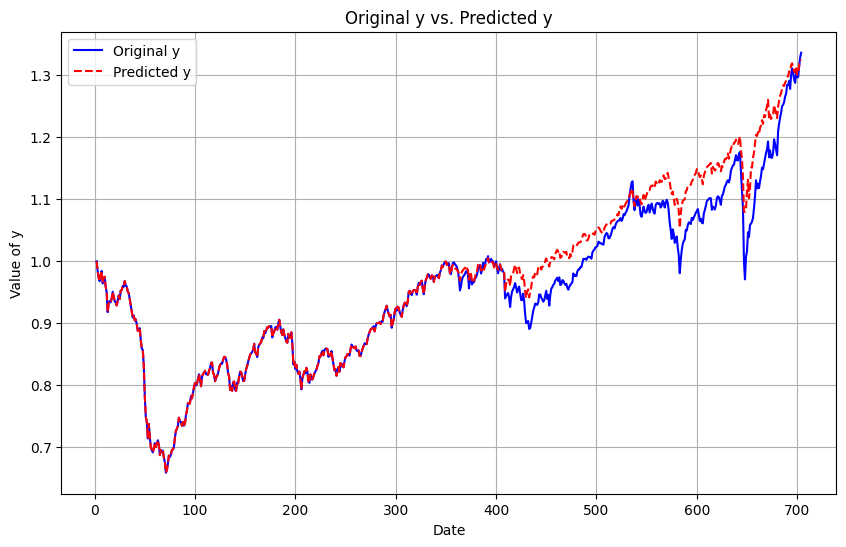

Starting training from observation 1
Starting prediction from observation 556
Using rolling window: False
4.477362684226697e-05
Return: -0.019862307780249187 %
Upper Partial Moment: 5.618899732364815e-05
Lower Partial Moment: 0.0001239213920339148
Semi-Deviation: 0.008108896009532414
Value at Risk (VaR): -0.015076565470854704
Conditional Value at Risk (CVaR): -0.024358051201329427
Downside Deviation: 0.008108896009532414
Lower Partial Standard Deviation (LPSD): 0.008108896009532414
Omega Ratio: -1.2941832332648888
Sortino Ratio: 0.036588085374241644
Conditional Drawdown at Risk (CDaR): 0.007626742262624593


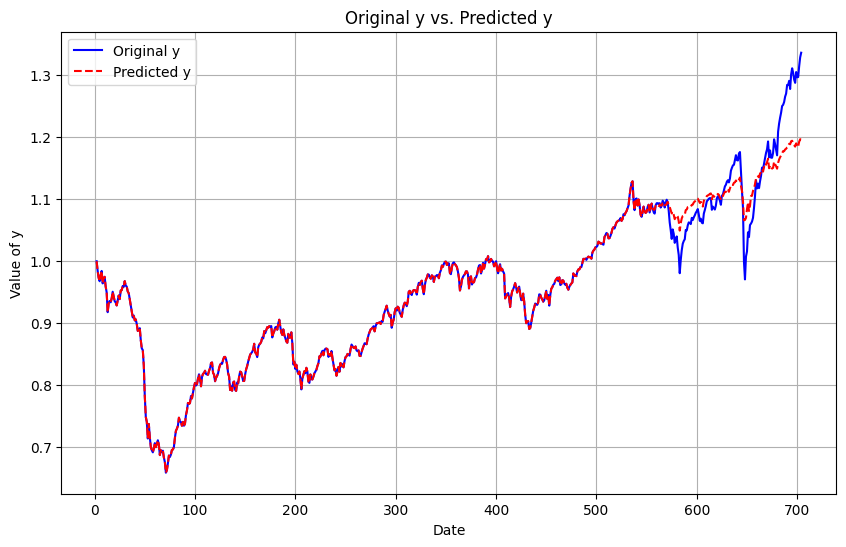

Starting training from observation 1
Starting prediction from observation 756
Using rolling window: False
5.374840103374381e-05
Return: 0.5556218303365279 %
Upper Partial Moment: 7.746112924489966e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01696944435078388
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.2458362598412864
Sortino Ratio: 0.050238103583845124
Conditional Drawdown at Risk (CDaR): 0.008688197235619664


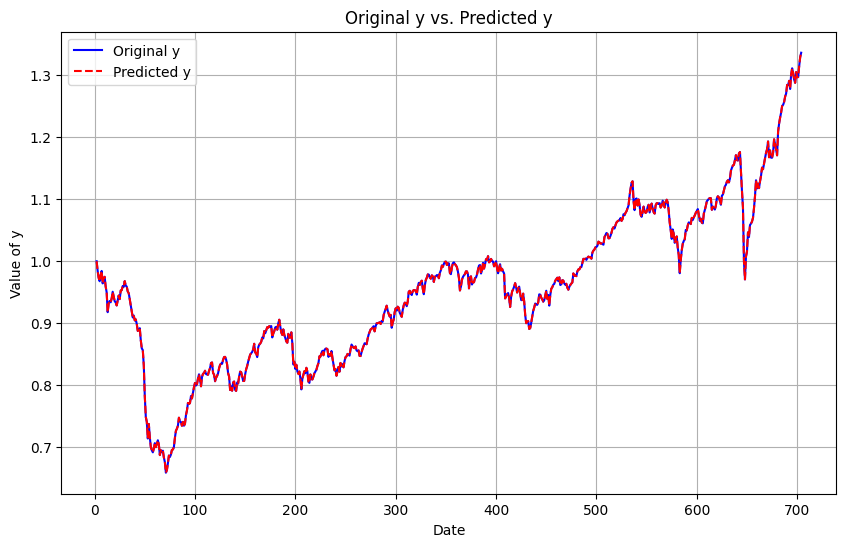

In [ ]:
model_function = perform_KalmanFilter
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

## Reinforcement Learning

### Random Agent

Remember that the random agent is not an agent that does things randomly, but an agent that randomly chooses what to do. It's a very inefficient way of optimizing but the optimization is present.

In [ ]:
import numpy as np

class RandomAgent:
    def __init__(self, action_size):
        self.action_size = action_size

    def choose_action(self, state):
        return np.random.randint(self.action_size)

class Environment:
    def __init__(self, target_series, asset_series):
        self.target_series = target_series
        self.asset_series = asset_series
        self.num_assets = len(asset_series)
        self.num_steps = len(target_series)

    def reset(self):
        self.current_step = 0
        return 0  # Initial state

    def step(self, action):
        weights = action / np.sum(action) if np.sum(action) > 0 else action
        predicted_series = np.dot(weights, self.asset_series)
        reward = -np.mean(np.abs(predicted_series - self.target_series[self.current_step]))
        self.current_step += 1
        next_state = self.current_step if self.current_step < self.num_steps else None
        return reward, next_state

def train_agent(agent, env, episodes=30000):
    final_weights = []
    for episode in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        while not done:
            action = agent.choose_action(state)
            reward, next_state = env.step(action)
            if next_state is None:
                done = True
                next_state = 0  # Reset the environment
                final_weights.append(action)  # Store final weights
            state = next_state
            total_reward += reward
        if (episode+1) % 100 == 0:
            print(f"Episode {episode+1}/{episodes}, Total Reward: {total_reward}")
        if next_state is None:
            done = True
            next_state = 0  # Reset the environment
            final_weights.append(action)  # Store final weights
    return final_weights

In [ ]:
target_series = y_ret.to_numpy()
asset_series = [X_ret[col].to_numpy() for col in X_ret.columns]

# Environment setup
env = Environment(target_series, asset_series)
state_size = env.num_steps
action_size = env.num_assets

# Agent setup
agent = RandomAgent(action_size)

# Training
final_weights = train_agent(agent, env, episodes=1000)

Episode 100/1000, Total Reward: -11.866571075715065
Episode 200/1000, Total Reward: -11.900541784821334
Episode 300/1000, Total Reward: -11.87760182170389
Episode 400/1000, Total Reward: -11.780460070286653
Episode 500/1000, Total Reward: -11.77726670622665
Episode 600/1000, Total Reward: -11.964746422514757
Episode 700/1000, Total Reward: -12.009410607407627
Episode 800/1000, Total Reward: -11.999122049014785
Episode 900/1000, Total Reward: -12.001130190011457
Episode 1000/1000, Total Reward: -11.689686185162047


In [ ]:
import matplotlib.pyplot as plt

def visualize_results(target_series, replicated_series):
    plt.figure(figsize=(10, 6))
    plt.plot(target_series, label='Target Series', color='blue')
    plt.plot(replicated_series, label='Replicated Series', color='red')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.title('Target Series vs. Replicated Series')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
final_weights[-11:]

[5, 2, 1, 6, 10, 4, 8, 4, 6, 7, 8]

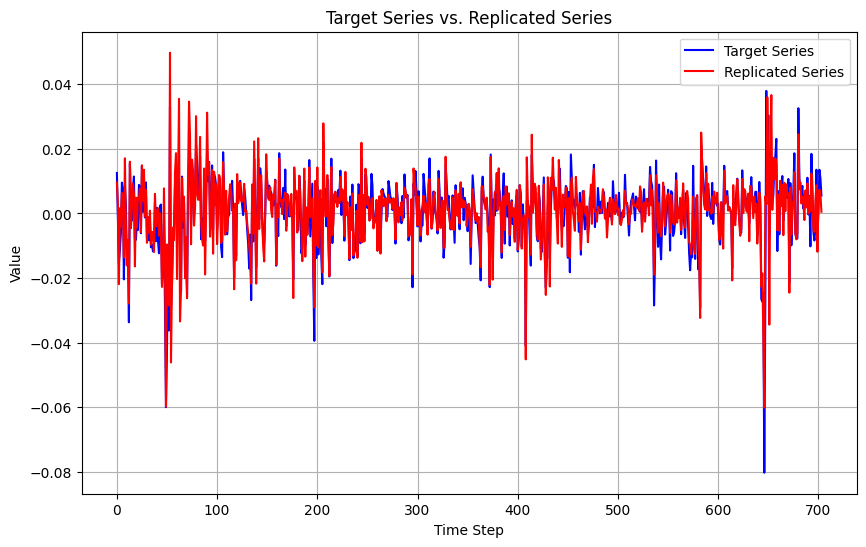

In [ ]:
weights = final_weights[-11:]
replicated_series = np.dot(weights, asset_series)

# calculate variance of target_serie
tgt_serie_std = np.std(target_series)
# calculate variance of replicated_serie
repl_serie_std = np.std(replicated_series)

# scaling
coef = repl_serie_std / tgt_serie_std

# Visualize the results
visualize_results(target_series, replicated_series/coef)

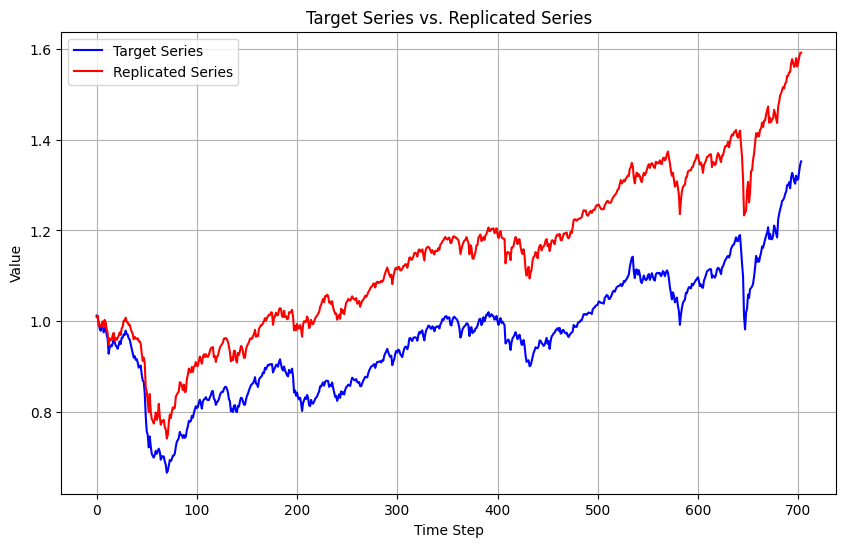

In [ ]:
# Calculate cumulative returns
cumulative_y = (1 + target_series).cumprod()
cumulative_predicted_y = (1 + replicated_series/coef).cumprod()

visualize_results(cumulative_y, cumulative_predicted_y)

In [ ]:
def perform_RandomLearning(X, y):

  name = 'Random Learning'

  target_series = y.to_numpy()
  asset_series = [X[col].to_numpy() for col in X.columns]

  # Environment setup
  env = Environment(target_series, asset_series)
  state_size = env.num_steps
  action_size = env.num_assets

  # Agent setup
  agent = RandomAgent(action_size)

  # Training
  final_weights = train_agent(agent, env, episodes=1000)

  return final_weights[-11:], name

In [ ]:
# Window parameters
rolling = True
rolling_window = 156

# Status Parameters
print_every = 200

# Model function and plots
plots = [0,1,1]

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -3.716633618934091
Episode 200/1000, Total Reward: -3.6226510544295665
Episode 300/1000, Total Reward: -3.5564328113195707
Episode 400/1000, Total Reward: -3.5462071384964755
Episode 500/1000, Total Reward: -3.5709833087138567
Episode 600/1000, Total Reward: -3.7079237656795025
Episode 700/1000, Total Reward: -3.592475513030602
Episode 800/1000, Total Reward: -

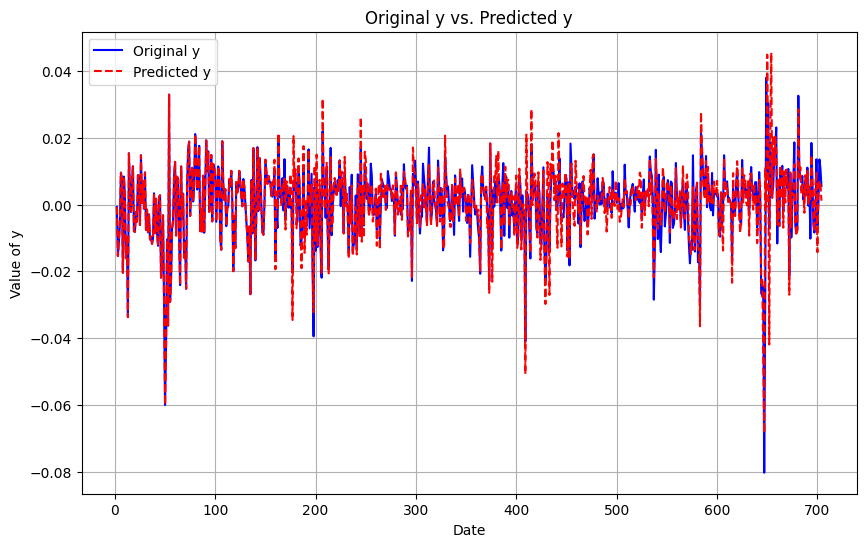

Return: 0.11499029103846947 %
Upper Partial Moment: 9.073289931269209e-05
Lower Partial Moment: 0.00017710706917401192
Semi-Deviation: 0.00971298169917711
Value at Risk (VaR): -0.017014921480343538
Conditional Value at Risk (CVaR): -0.02948012977871332
Downside Deviation: 0.00971298169917711
Lower Partial Standard Deviation (LPSD): 0.00971298169917711
Omega Ratio: -1.237155746730949
Sortino Ratio: 0.060806136217395744
Conditional Drawdown at Risk (CDaR): 0.009097530197007453


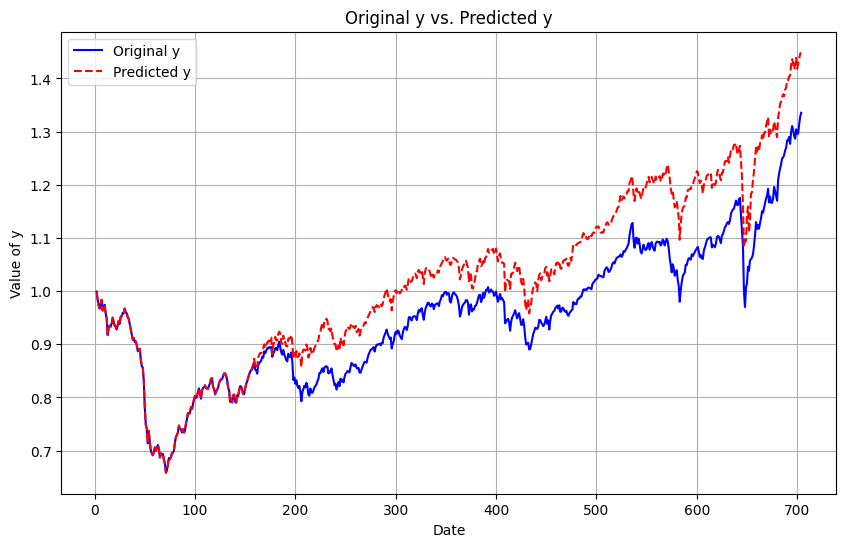

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -2.072835448637093
Episode 200/1000, Total Reward: -2.013247850149984
Episode 300/1000, Total Reward: -2.077865263753375
Episode 400/1000, Total Reward: -2.044096317822611
Episode 500/1000, Total Reward: -2.1015088796896464
Episode 600/1000, Total Reward: -2.07731177896318
Episode 700/1000, Total Reward: -2.068698368493021
Episode 800/1000, Total Reward: -2.0774438876419015
Episode 900/1000, Total Reward: -2.105704987388859
Episode 1000/1000, Total Reward: -2.064991539148554


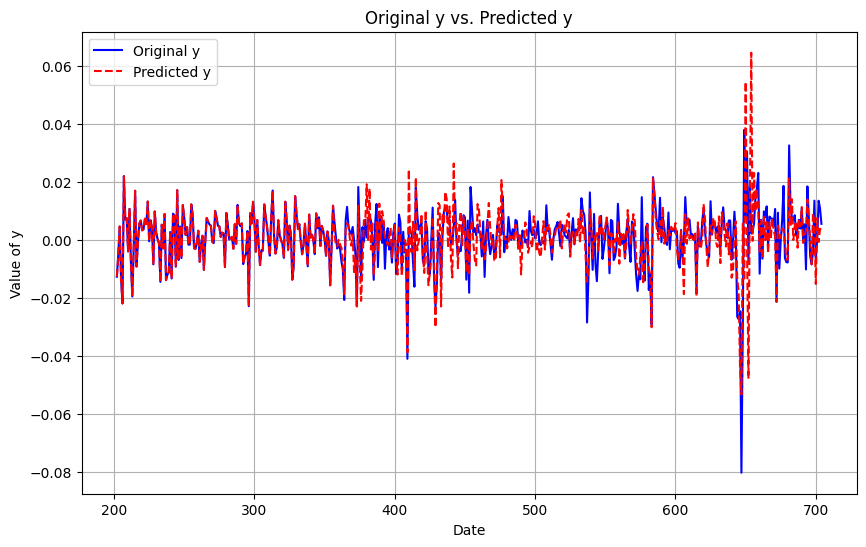

Return: 0.3344702893880429 %
Upper Partial Moment: 8.631215005750263e-05
Lower Partial Moment: 0.00011254517010514223
Semi-Deviation: 0.007903160528168949
Value at Risk (VaR): -0.013678550305340794
Conditional Value at Risk (CVaR): -0.023219302357916274
Downside Deviation: 0.007903160528168949
Lower Partial Standard Deviation (LPSD): 0.007903160528168949
Omega Ratio: -1.0807569873791816
Sortino Ratio: 0.09164812973815495
Conditional Drawdown at Risk (CDaR): 0.007077091476809845


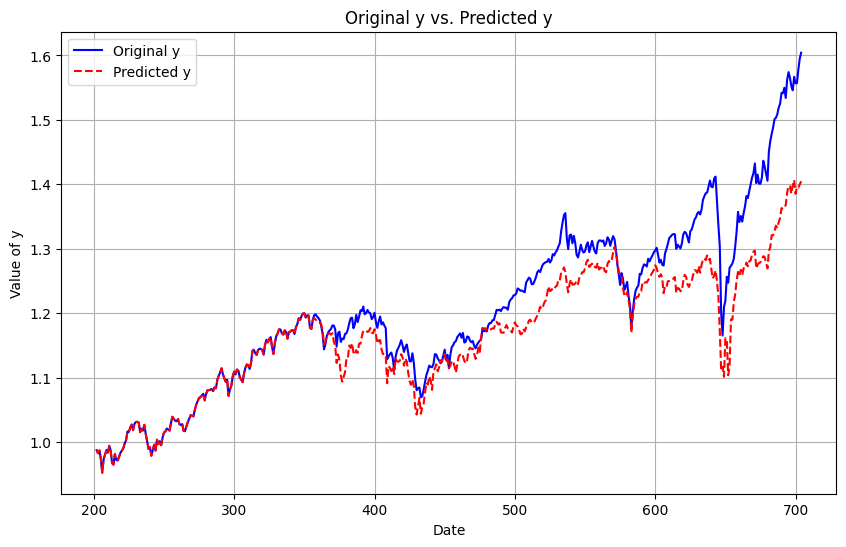

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -2.1298014314458036
Episode 200/1000, Total Reward: -2.077197233788614
Episode 300/1000, Total Reward: -2.159581459073879
Episode 400/1000, Total Reward: -2.12474653358305
Episode 500/1000, Total Reward: -2.1166949603559173
Episode 600/1000, Total Reward: -2.133560191087181
Episode 700/1000, Total Reward: -2.162154703859968
Episode 800/1000, Total Reward: -2.1280515147907657
Episode 900/1000, Total Reward: -2.141532095809079
Episode 1000/1000, Total Reward: -2.108363373138688


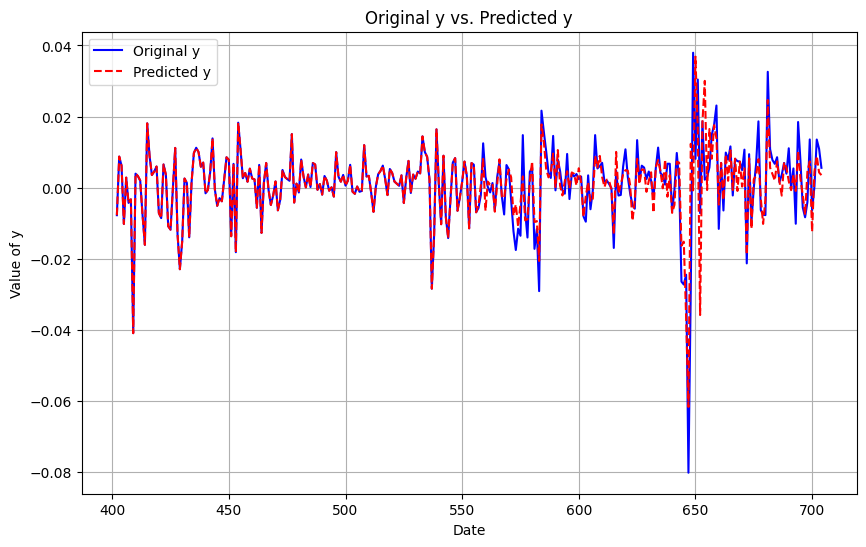

Return: 0.35027742755846714 %
Upper Partial Moment: 6.0333062865047315e-05
Lower Partial Moment: 0.00014426729303168055
Semi-Deviation: 0.009154249236878353
Value at Risk (VaR): -0.013646110769489553
Conditional Value at Risk (CVaR): -0.02431813825607319
Downside Deviation: 0.009154249236878353
Lower Partial Standard Deviation (LPSD): 0.009154249236878353
Omega Ratio: -1.3447462865390578
Sortino Ratio: 0.0988642802587404
Conditional Drawdown at Risk (CDaR): 0.00777605387975113


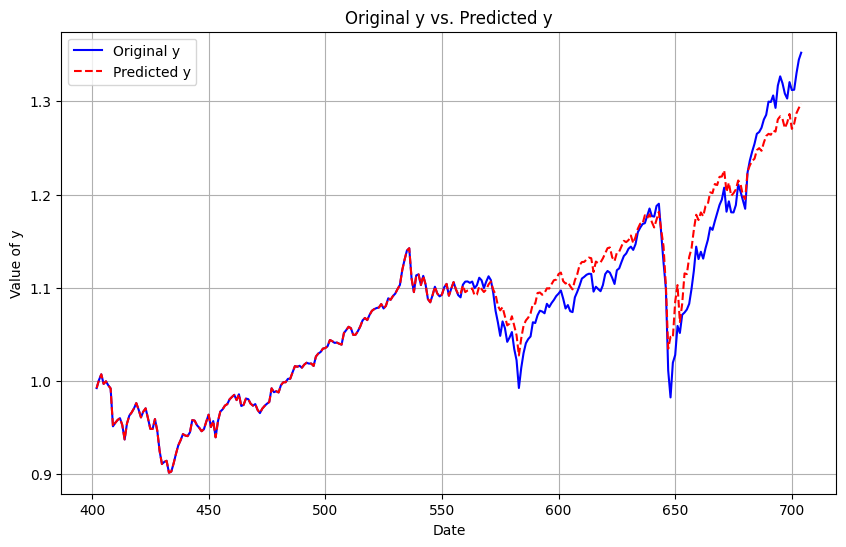

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.9453151962845232
Episode 200/1000, Total Reward: -1.9251206276375272
Episode 300/1000, Total Reward: -1.9766717757573287
Episode 400/1000, Total Reward: -1.9140074721970861
Episode 500/1000, Total Reward: -1.9630735895531324
Episode 600/1000, Total Reward: -1.9696208391202004
Episode 700/1000, Total Reward: -1.9386216210762468
Episode 800/1000, Total Reward: -1.9310746177535378
Episode 900/1000, Total Reward: -1.8793501919744209
Episode 1000/1000, Total Reward: -1.9075165744261822


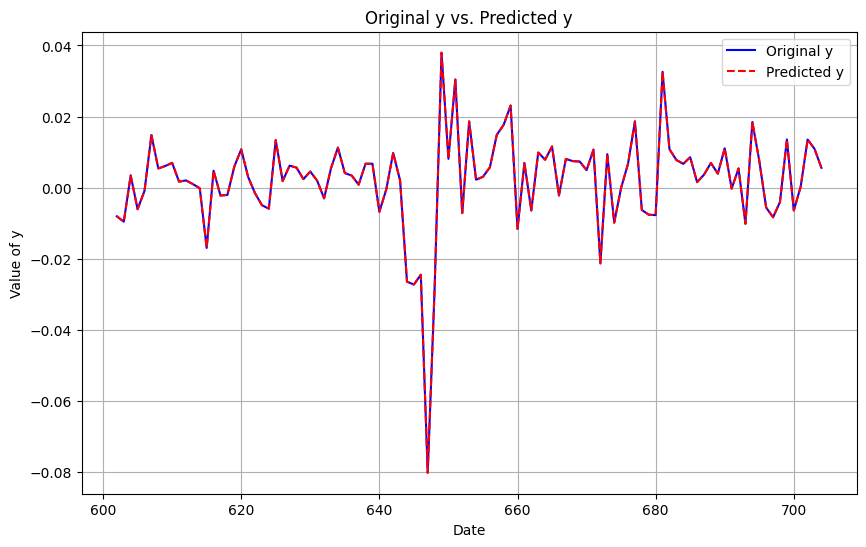

Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


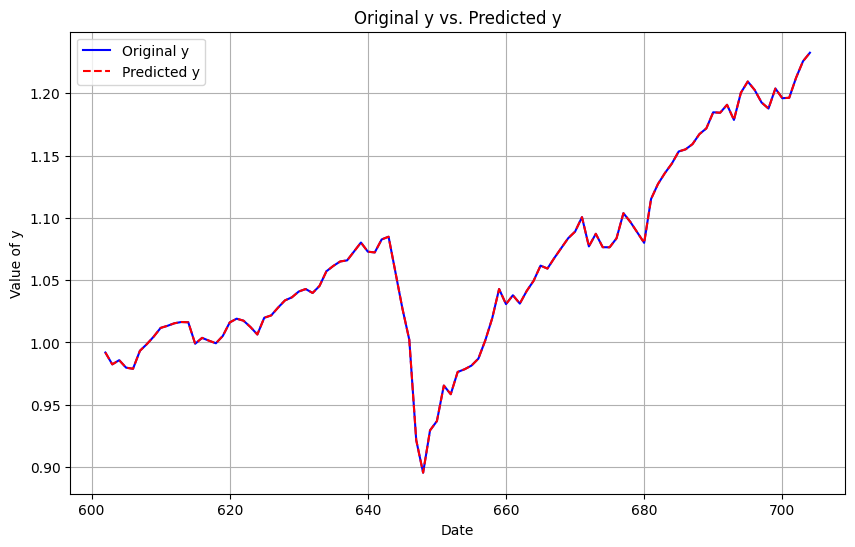

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -3.2092627594911383
Episode 200/1000, Total Reward: -3.156568993708751
Episode 300/1000, Total Reward: -3.2643059857570256
Episode 400/1000, Total Reward: -3.266456927463851
Episode 500/1000, Total Reward: -3.2166421038231867
Episode 600/1000, Total Reward: -3.210451416561589
Episode 700/1000, Total Reward: -3.224346812736067
Episode 800/1000, Total Reward: -3.2347827401586886
Episode 900/1000, Total Reward: -3.2797837186996546
Episode 1000/1000, Total Reward: -3.13629665958617


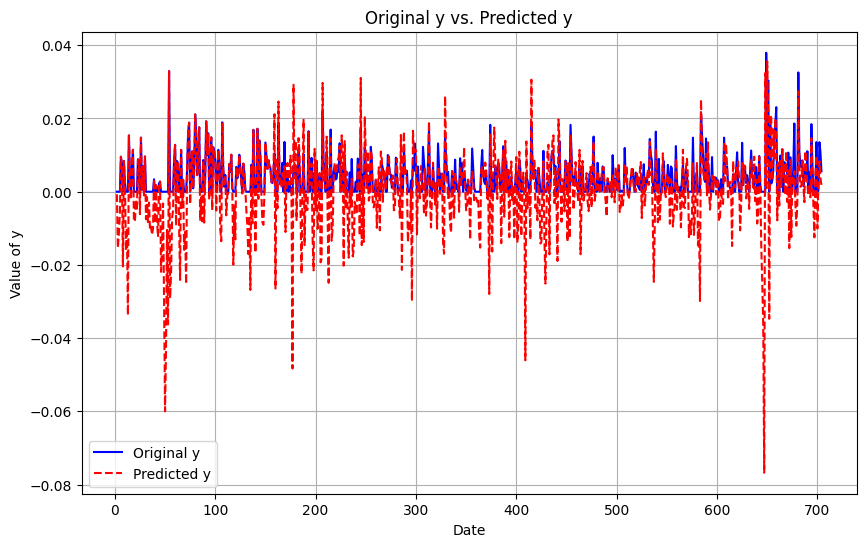

Return: 0.18584190466863887 %
Upper Partial Moment: 9.094729934962428e-05
Lower Partial Moment: 0.00017532144586096594
Semi-Deviation: 0.009637850773670721
Value at Risk (VaR): -0.017108433398468428
Conditional Value at Risk (CVaR): -0.02891785321914804
Downside Deviation: 0.009637850773670721
Lower Partial Standard Deviation (LPSD): 0.009637850773670721
Omega Ratio: -1.2285920098915644
Sortino Ratio: 0.05455993275545528
Conditional Drawdown at Risk (CDaR): 0.009079277412075292


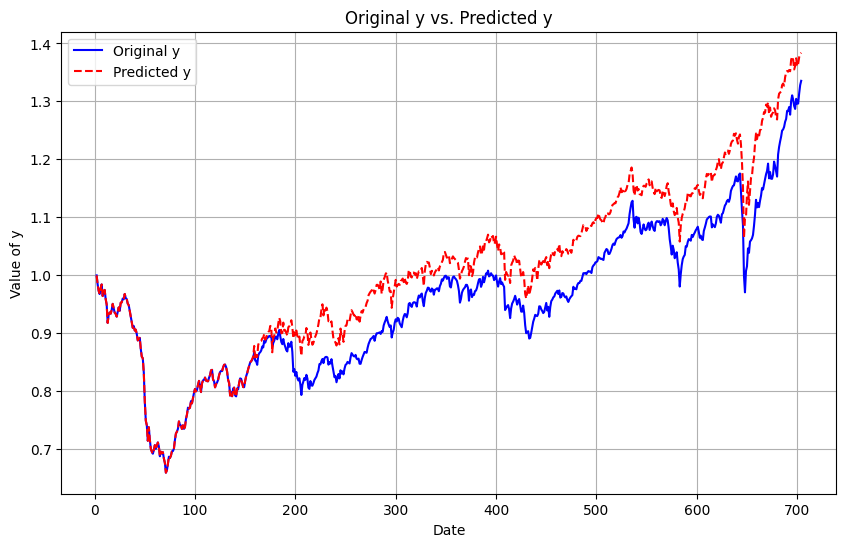

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -1.8956922558731226
Episode 200/1000, Total Reward: -1.8585338200879555
Episode 300/1000, Total Reward: -1.873013343442867
Episode 400/1000, Total Reward: -1.8419828391901945
Episode 500/1000, Total Reward: -1.823974125226818
Episode 600/1000, Total Reward: -1.8357171840718223
Episode 700/1000, Total Reward: -1.8885690107062905
Episode 800/1000, Total Reward: -1.8616140952945208
Episode 900/1000, Total Reward: -1.846375500271725
Episode 1000/1000, Total Reward: -1.8797035818298706


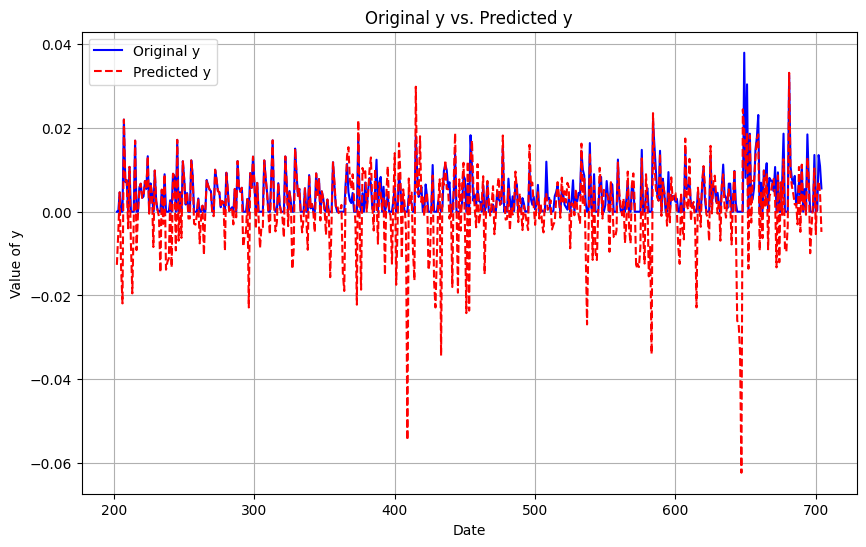

Return: -0.4833353864076314 %
Upper Partial Moment: 7.222853378896908e-05
Lower Partial Moment: 0.00013831433826282943
Semi-Deviation: 0.008701936975326096
Value at Risk (VaR): -0.01507726251324471
Conditional Value at Risk (CVaR): -0.024988037596227305
Downside Deviation: 0.008701936975326096
Lower Partial Standard Deviation (LPSD): 0.008701936975326096
Omega Ratio: -1.175158014194921
Sortino Ratio: 0.11792189357086254
Conditional Drawdown at Risk (CDaR): 0.007911424090534013


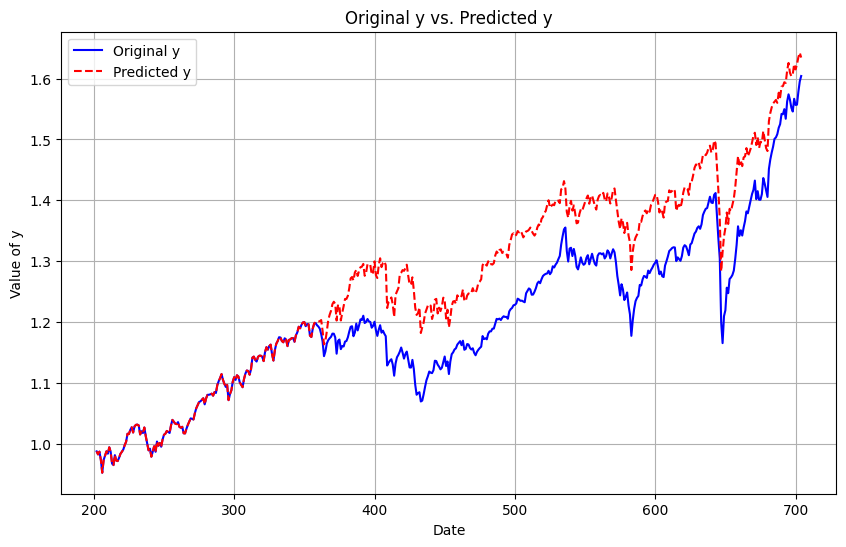

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -1.812046771784765
Episode 200/1000, Total Reward: -1.9001820824525446
Episode 300/1000, Total Reward: -1.8510170583470311
Episode 400/1000, Total Reward: -1.8943493542853411
Episode 500/1000, Total Reward: -1.8390969853692347
Episode 600/1000, Total Reward: -1.9249330320959972
Episode 700/1000, Total Reward: -1.914115229417219
Episode 800/1000, Total Reward: -1.8264983988186179
Episode 900/1000, Total Reward: -1.9685171324167343
Episode 1000/1000, Total Reward: -1.9053762105642142


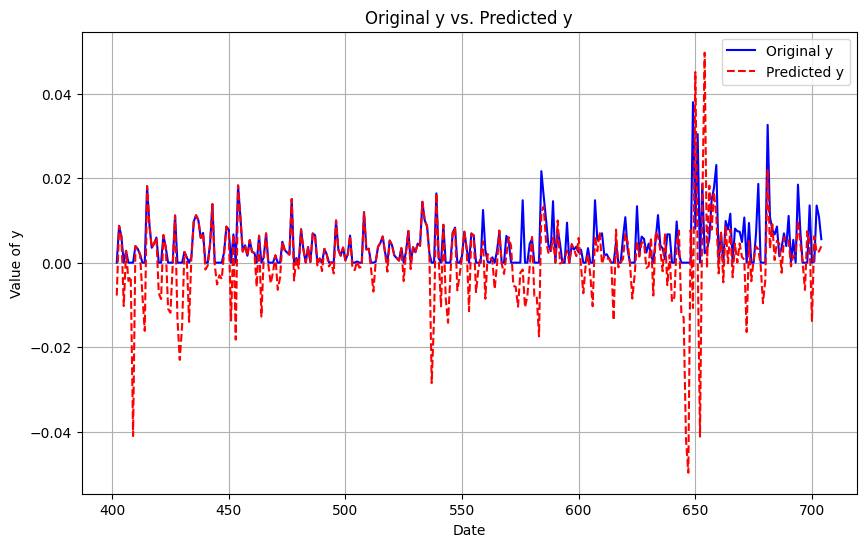

Return: 0.38884529005889523 %
Upper Partial Moment: 6.579587460070194e-05
Lower Partial Moment: 0.00013046636148219773
Semi-Deviation: 0.008754948258616635
Value at Risk (VaR): -0.013571784750862292
Conditional Value at Risk (CVaR): -0.023609724094752607
Downside Deviation: 0.008754948258616635
Lower Partial Standard Deviation (LPSD): 0.008754948258616635
Omega Ratio: -1.3226639756944503
Sortino Ratio: 0.07990311263903577
Conditional Drawdown at Risk (CDaR): 0.007336023614407416


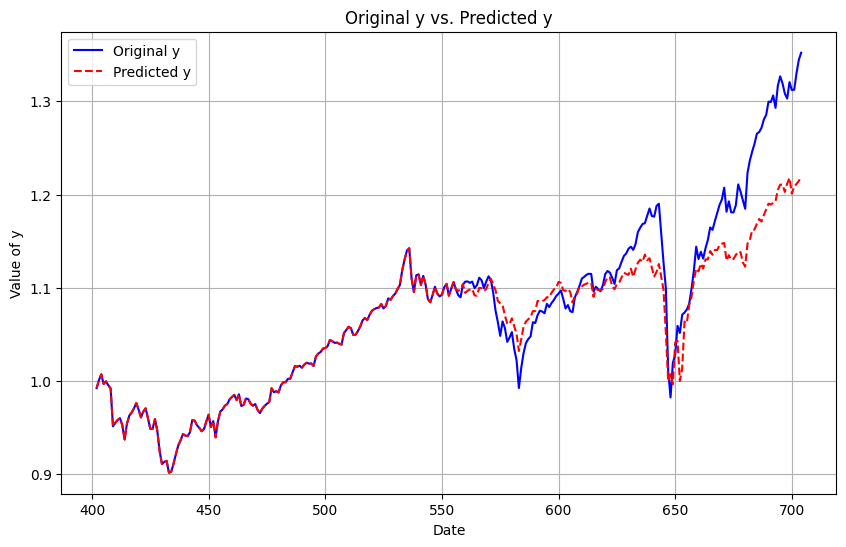

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.705871695563151
Episode 200/1000, Total Reward: -1.6219898870426228
Episode 300/1000, Total Reward: -1.7058739466938388
Episode 400/1000, Total Reward: -1.650191755154566
Episode 500/1000, Total Reward: -1.6291561483665455
Episode 600/1000, Total Reward: -1.6347332612810346
Episode 700/1000, Total Reward: -1.6544674037703593
Episode 800/1000, Total Reward: -1.6398784353923266
Episode 900/1000, Total Reward: -1.6737182919936502
Episode 1000/1000, Total Reward: -1.6323032220850668


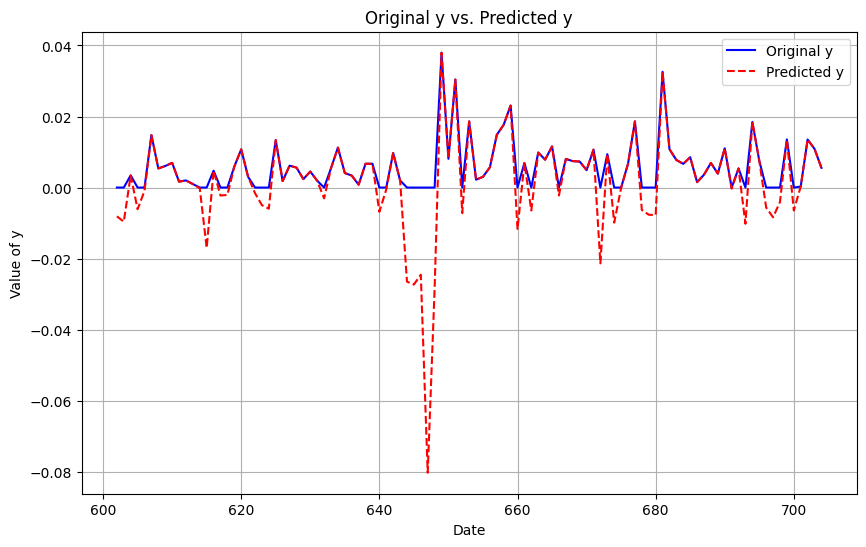

Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


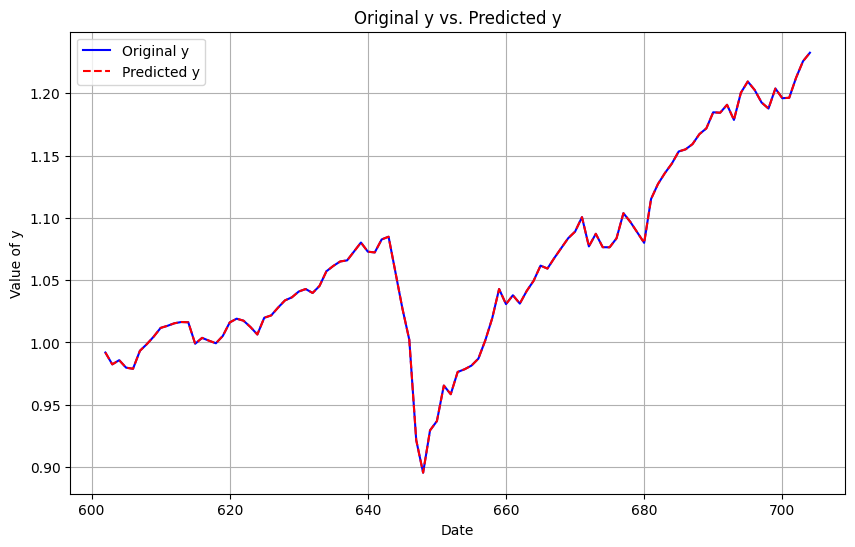

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -3.6467716729153414
Episode 200/1000, Total Reward: -3.5935589366595257
Episode 300/1000, Total Reward: -3.5493248909140003
Episode 400/1000, Total Reward: -3.520024031653535
Episode 500/1000, Total Reward: -3.5864267714895104
Episode 600/1000, Total Reward: -3.5065903132708462
Episode 700/1000, Total Reward: -3.6176073632545442
Episode 800/1000, Total Reward: -3.667187136446395
Episode 900/1000, Total Reward: -3.581471798952228
Episode 1000/1000, Total Reward: -3.5287871239290305


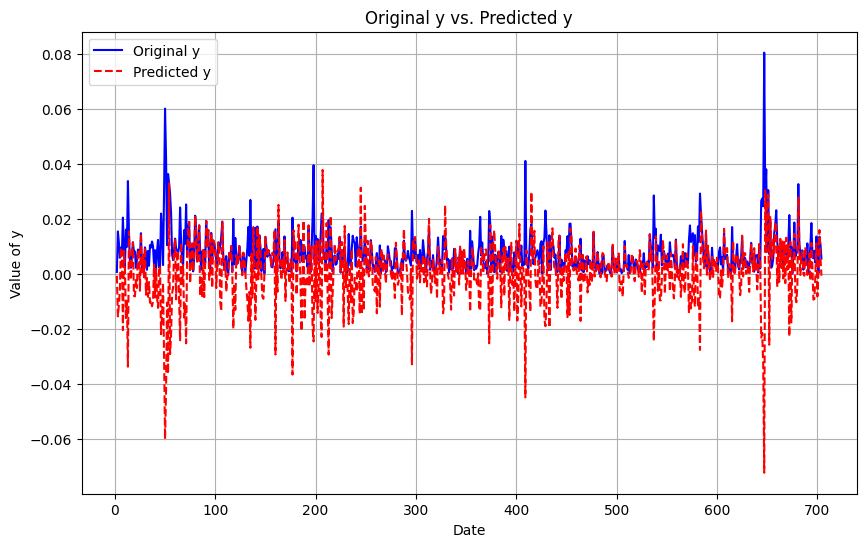

Return: -0.0641957504303583 %
Upper Partial Moment: 9.406001775973691e-05
Lower Partial Moment: 0.00017321570247274648
Semi-Deviation: 0.009405534961573581
Value at Risk (VaR): -0.01782842597012094
Conditional Value at Risk (CVaR): -0.028364058150213478
Downside Deviation: 0.009405534961573581
Lower Partial Standard Deviation (LPSD): 0.009405534961573581
Omega Ratio: -1.2145918767905552
Sortino Ratio: 0.07473705781721847
Conditional Drawdown at Risk (CDaR): 0.009206064010170878


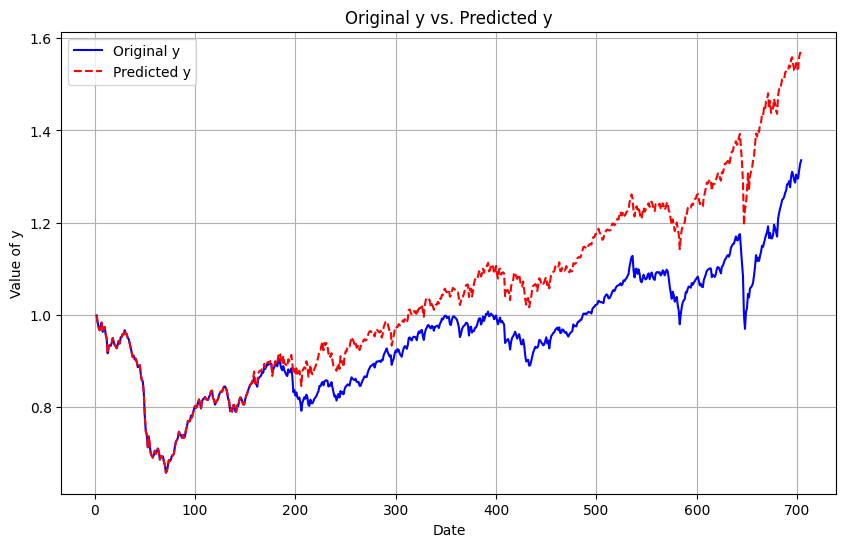

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -1.9966890862224016
Episode 200/1000, Total Reward: -2.0108701742111785
Episode 300/1000, Total Reward: -2.0360908024358326
Episode 400/1000, Total Reward: -2.012914787361404
Episode 500/1000, Total Reward: -2.0460730723843583
Episode 600/1000, Total Reward: -2.0209367304256847
Episode 700/1000, Total Reward: -2.014984963894723
Episode 800/1000, Total Reward: -2.018339484141294
Episode 900/1000, Total Reward: -2.0208442570006815
Episode 1000/1000, Total Reward: -2.032953655465072


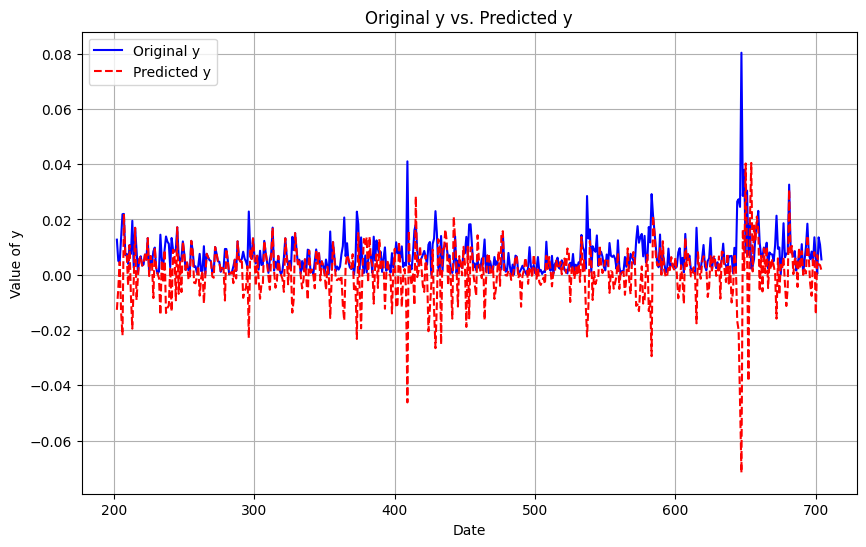

Return: 0.1582094558080518 %
Upper Partial Moment: 7.34035675146875e-05
Lower Partial Moment: 0.00013456694053343079
Semi-Deviation: 0.00879160214336016
Value at Risk (VaR): -0.01425322344095283
Conditional Value at Risk (CVaR): -0.024302773809018262
Downside Deviation: 0.00879160214336016
Lower Partial Standard Deviation (LPSD): 0.00879160214336016
Omega Ratio: -1.1729283603384992
Sortino Ratio: 0.09982076019474788
Conditional Drawdown at Risk (CDaR): 0.007568003190161581


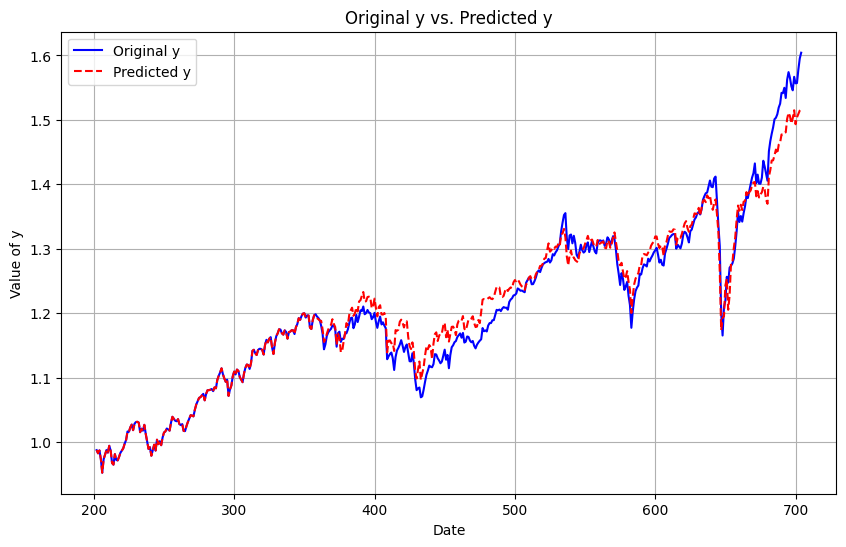

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -2.073603045091327
Episode 200/1000, Total Reward: -2.115569614468876
Episode 300/1000, Total Reward: -2.0676238899396857
Episode 400/1000, Total Reward: -2.075269038698366
Episode 500/1000, Total Reward: -2.0619148095345414
Episode 600/1000, Total Reward: -2.100311443601836
Episode 700/1000, Total Reward: -2.085297292781488
Episode 800/1000, Total Reward: -2.090255983817665
Episode 900/1000, Total Reward: -2.0957877192158607
Episode 1000/1000, Total Reward: -2.0798014697511578


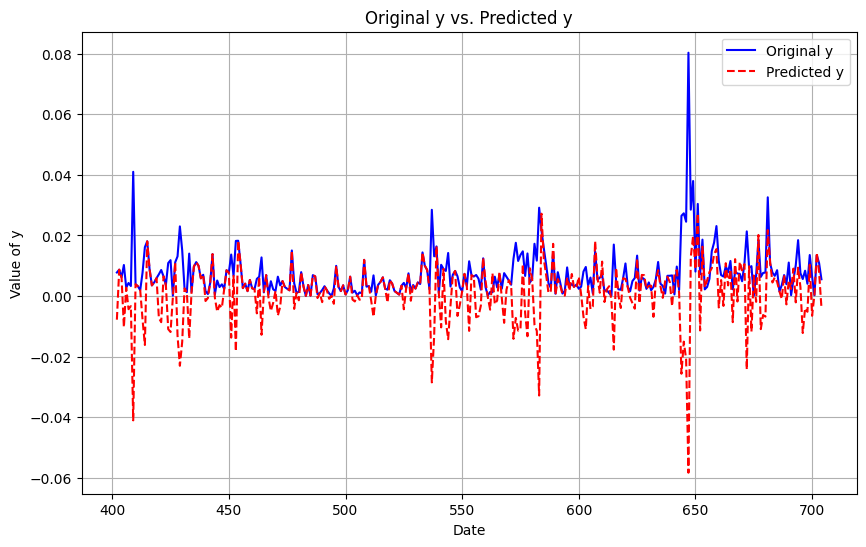

Return: -0.3720786673695989 %
Upper Partial Moment: 6.460001529991823e-05
Lower Partial Moment: 0.0001367752474265228
Semi-Deviation: 0.00861257705302223
Value at Risk (VaR): -0.01398750172996342
Conditional Value at Risk (CVaR): -0.02366188541077492
Downside Deviation: 0.00861257705302223
Lower Partial Standard Deviation (LPSD): 0.00861257705302223
Omega Ratio: -1.2564682085735575
Sortino Ratio: 0.12675929048598844
Conditional Drawdown at Risk (CDaR): 0.007911938064234183


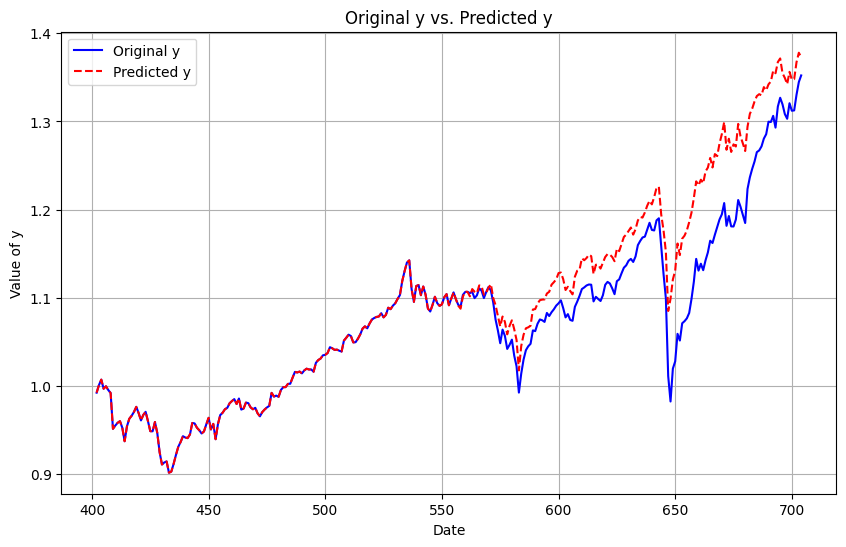

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.8654828784560815
Episode 200/1000, Total Reward: -1.867606625091766
Episode 300/1000, Total Reward: -1.8879559057274864
Episode 400/1000, Total Reward: -1.8246564059980792
Episode 500/1000, Total Reward: -1.8720399167610757
Episode 600/1000, Total Reward: -1.8345421510608062
Episode 700/1000, Total Reward: -1.8289181303874131
Episode 800/1000, Total Reward: -1.8779550263434865
Episode 900/1000, Total Reward: -1.9062754835235056
Episode 1000/1000, Total Reward: -1.849163485900091


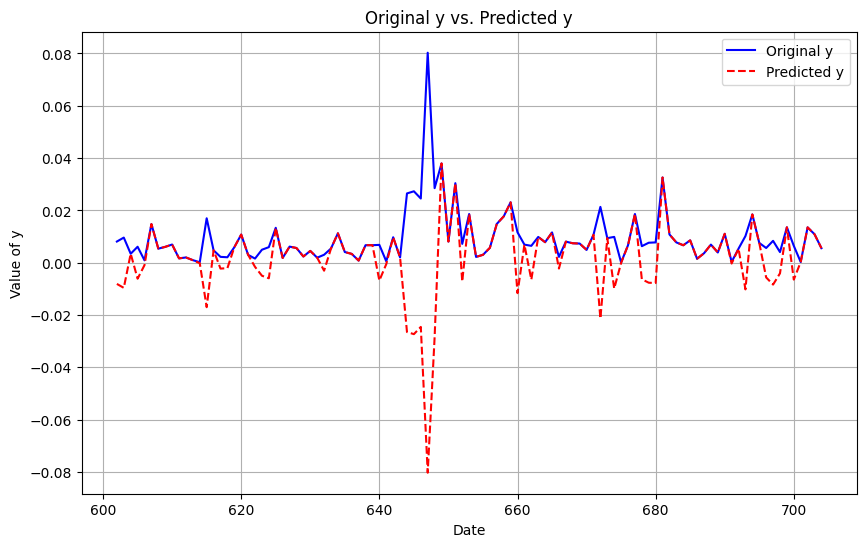

Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953576895041
Sortino Ratio: 0.14861315462445326
Conditional Drawdown at Risk (CDaR): 0.010626030564272321


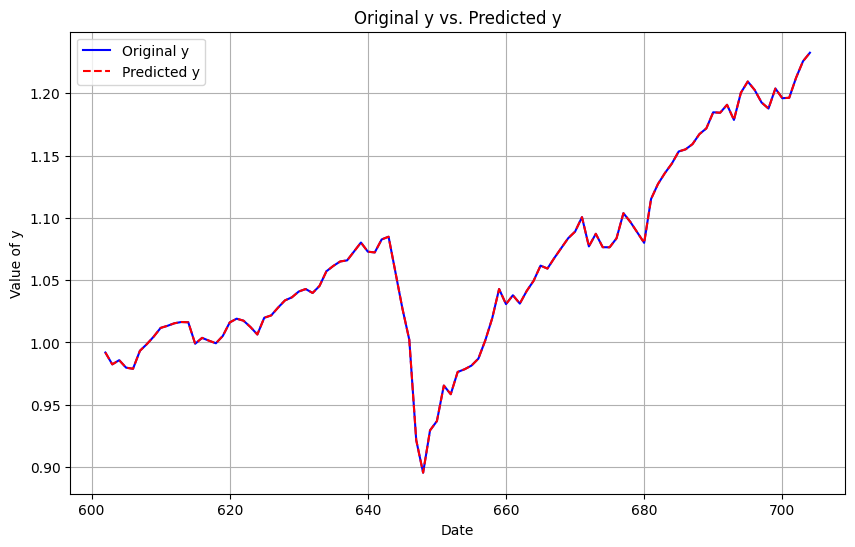

In [ ]:
# Backtesting Function
model_function = perform_RandomLearning
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

### Q-Learning

In [ ]:
import numpy as np

class QLearningAgent:
    def __init__(self, state_size, action_size, learning_rate=0.1, discount_rate=0.99, exploration_rate=1.0, exploration_decay=0.995, exploration_min=0.01):
        self.state_size = state_size
        self.action_size = action_size
        self.learning_rate = learning_rate
        self.discount_rate = discount_rate
        self.exploration_rate = exploration_rate
        self.exploration_decay = exploration_decay
        self.exploration_min = exploration_min
        self.q_table = np.zeros((state_size, action_size))


class DecayingEpsilonGreedyQLearningAgent(QLearningAgent):
    def __init__(self, state_size, action_size, learning_rate=0.1, discount_rate=0.99, initial_exploration_rate=0.5, exploration_decay=0.95, exploration_min=0.001):
        super().__init__(state_size, action_size, learning_rate, discount_rate, initial_exploration_rate, exploration_decay, exploration_min)
        self.initial_exploration_rate = initial_exploration_rate

    def choose_action(self, state):
        exploration_rate = max(self.exploration_min, self.initial_exploration_rate * (self.exploration_decay ** state))
        if np.random.rand() < exploration_rate:
            return np.random.randint(self.action_size)
        return np.argmax(self.q_table[state, :])


    def update_q_table(self, state, action, reward, next_state):
        q_value = self.q_table[state, action]
        max_next_q_value = np.max(self.q_table[next_state, :])
        new_q_value = (1 - self.learning_rate) * q_value + self.learning_rate * (reward + self.discount_rate * max_next_q_value)
        self.q_table[state, action] = new_q_value

        self.exploration_rate *= self.exploration_decay
        self.exploration_rate = max(self.exploration_rate, self.exploration_min)

    def get_reward(predicted_series, target_series):
        return -np.mean(np.abs(predicted_series - target_series))

class Environment:
    def __init__(self, target_series, asset_series):
        self.target_series = target_series
        self.asset_series = asset_series
        self.num_assets = len(asset_series)
        self.num_steps = len(target_series)

    def reset(self):
        self.current_step = 0
        return 0  # Initial state

    def step(self, action):
        weights = action / np.sum(action) if np.sum(action) > 0 else action
        predicted_series = np.dot(weights, self.asset_series)
        reward = self.get_reward(predicted_series, self.target_series[self.current_step])
        self.current_step += 1
        next_state = self.current_step if self.current_step < self.num_steps else None
        return reward, next_state

    def get_reward(self, predicted_series, target_series):
        return -np.mean(np.abs(predicted_series - target_series))

def train_agent(agent, env, episodes=30000):
    for episode in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0
        while not done:
            action = agent.choose_action(state)
            reward, next_state = env.step(action)
            if next_state is None:
                done = True
                next_state = 0  # Reset the environment
            agent.update_q_table(state, action, reward, next_state)
            state = next_state
            total_reward += reward
        if (episode+1) % 100 == 0:
            print(f"Episode {episode+1}/{episodes}, Total Reward: {total_reward}")

In [ ]:
# Sample data
#target_series = np.random.randn(100)
#asset_series = [np.random.randn(100) for _ in range(5)]

target_series = y_ret.to_numpy()
asset_series = [X_ret[col].to_numpy() for col in X_ret.columns]

# Environment setup
env = Environment(target_series, asset_series)
state_size = env.num_steps
action_size = env.num_assets

# Agent setup
agent = DecayingEpsilonGreedyQLearningAgent(state_size, action_size)

# Training
train_agent(agent, env, episodes=1000)

Episode 100/1000, Total Reward: -10.613966896003296
Episode 200/1000, Total Reward: -10.837127425395991
Episode 300/1000, Total Reward: -10.915577244560172
Episode 400/1000, Total Reward: -10.697466751981654
Episode 500/1000, Total Reward: -10.774448548882008
Episode 600/1000, Total Reward: -10.820667863283509
Episode 700/1000, Total Reward: -10.931627817041248
Episode 800/1000, Total Reward: -11.062244360875455
Episode 900/1000, Total Reward: -10.904019966050278
Episode 1000/1000, Total Reward: -10.755676695443864


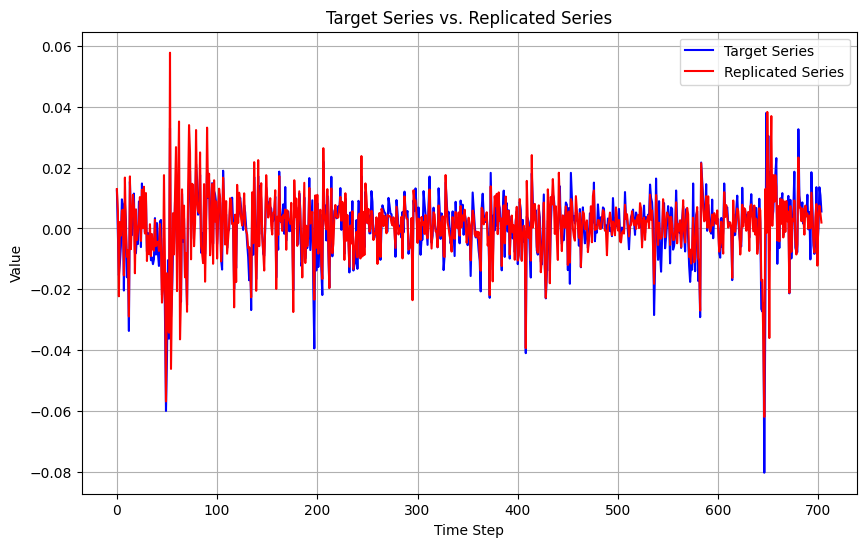

In [ ]:
weights = agent.q_table[-1, :]
replicated_series = -np.dot(weights, asset_series)

# calculate variance of target_serie
tgt_serie_std = np.std(target_series)
# calculate variance of replicated_serie
repl_serie_std = np.std(replicated_series)

# scaling
coef = repl_serie_std / tgt_serie_std

# Visualize the results
visualize_results(target_series, replicated_series/coef)

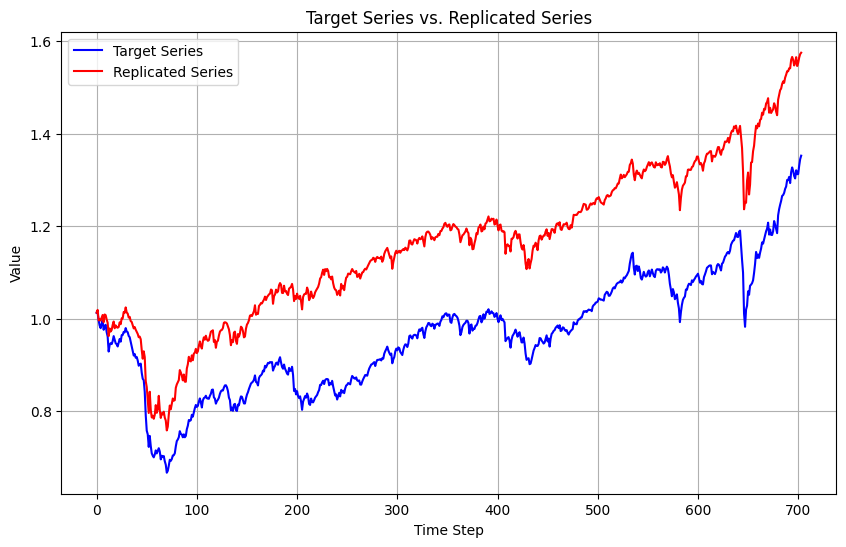

In [ ]:
# Calculate cumulative returns
cumulative_y = (1 + target_series).cumprod()
cumulative_predicted_y = (1 + replicated_series/coef).cumprod()

visualize_results(cumulative_y, cumulative_predicted_y)

In [ ]:
def perform_QLearning(X, y):

  name = 'Q-Learning'

  target_series = y.to_numpy()
  asset_series = [X[col].to_numpy() for col in X.columns]

  # Environment setup
  env = Environment(target_series, asset_series)
  state_size = env.num_steps
  action_size = env.num_assets

  # Agent setup
  agent = DecayingEpsilonGreedyQLearningAgent(state_size, action_size)

  # Training
  train_agent(agent, env, episodes=1000)

  weights = agent.q_table[-1, :] * -1

  return weights, name

In [ ]:
# Window parameters
rolling = True
rolling_window = 156

# Status Parameters
print_every = 200

# Model function and plots
plots = [0,0,1]

Metrics of target serie:
Return: 0.5556218303365279 %
Upper Partial Moment: 7.765485070830142e-05
Lower Partial Moment: 0.00016240787261110202
Semi-Deviation: 0.0093232559444688
Value at Risk (VaR): -0.01695518635962312
Conditional Value at Risk (CVaR): -0.027662152727071166
Downside Deviation: 0.0093232559444688
Lower Partial Standard Deviation (LPSD): 0.0093232559444688
Omega Ratio: -1.243426992497662
Sortino Ratio: 0.05207742596962363
Conditional Drawdown at Risk (CDaR): 0.008688197235619664
Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -3.173575319744319
Episode 200/1000, Total Reward: -3.2878449771977465
Episode 300/1000, Total Reward: -3.2456225015288913
Episode 400/1000, Total Reward: -3.2031481294026203
Episode 500/1000, Total Reward: -3.114734503765878
Episode 600/1000, Total Reward: -3.220179722465436
Episode 700/1000, Total Reward: -3.087521640252247
Episode 800/1000, Total Reward: -3.

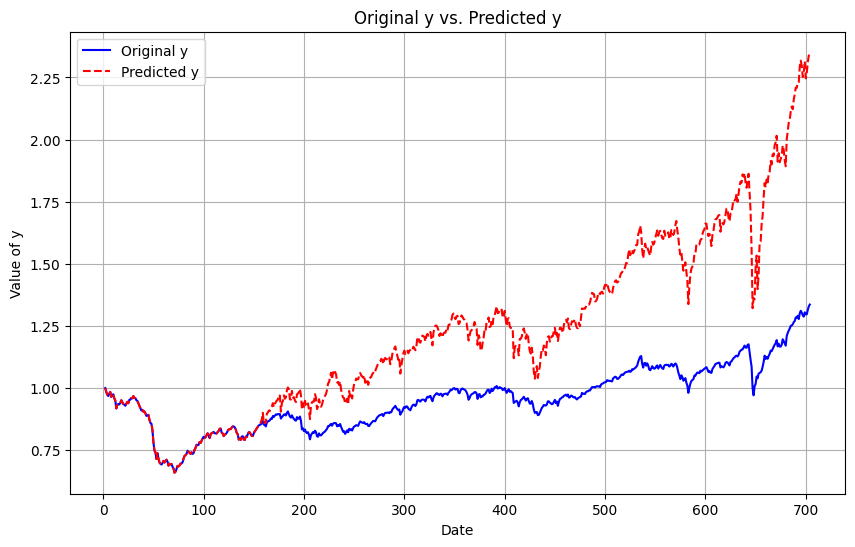

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -1.9093396627358505
Episode 200/1000, Total Reward: -1.9692539232952466
Episode 300/1000, Total Reward: -1.9417256019833584
Episode 400/1000, Total Reward: -1.919679600731053
Episode 500/1000, Total Reward: -1.8903397638849258
Episode 600/1000, Total Reward: -1.9292843514432012
Episode 700/1000, Total Reward: -1.888518814329319
Episode 800/1000, Total Reward: -1.9738529219455854
Episode 900/1000, Total Reward: -1.8980008774154264
Episode 1000/1000, Total Reward: -1.8093517490594893
Return: 0.369821215471523 %
Upper Partial Moment: 0.00018440157302749224
Lower Partial Moment: 0.0003238424242114856
Semi-Deviation: 0.014169520182008863
Value at Risk (VaR): -0.021235590493610217
Conditional Value at Risk (CVaR): -0.03816220057013881
Downside Deviation: 0.014169520182008863
Lower Partial Standard Deviation (LPSD): 0.014169520182008863
Omega Ratio: -1.116

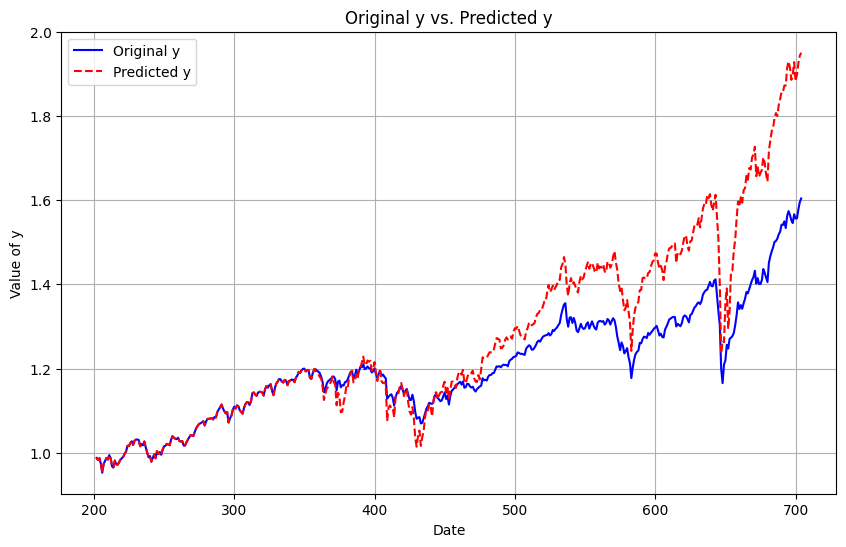

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -1.9216335599030703
Episode 200/1000, Total Reward: -1.942171869749581
Episode 300/1000, Total Reward: -1.9359741285162875
Episode 400/1000, Total Reward: -1.914665497427791
Episode 500/1000, Total Reward: -1.9226181069776351
Episode 600/1000, Total Reward: -1.8943865669400786
Episode 700/1000, Total Reward: -1.8971495545240553
Episode 800/1000, Total Reward: -1.9628101695039
Episode 900/1000, Total Reward: -1.9255922232815255
Episode 1000/1000, Total Reward: -1.9063707858346568
Return: 0.33824823487267275 %
Upper Partial Moment: 0.00015412757625126824
Lower Partial Moment: 0.0003379722673226777
Semi-Deviation: 0.014730690391043383
Value at Risk (VaR): -0.01810762966312816
Conditional Value at Risk (CVaR): -0.03739080416499772
Downside Deviation: 0.014730690391043383
Lower Partial Standard Deviation (LPSD): 0.014730690391043383
Omega Ratio: -1.29703

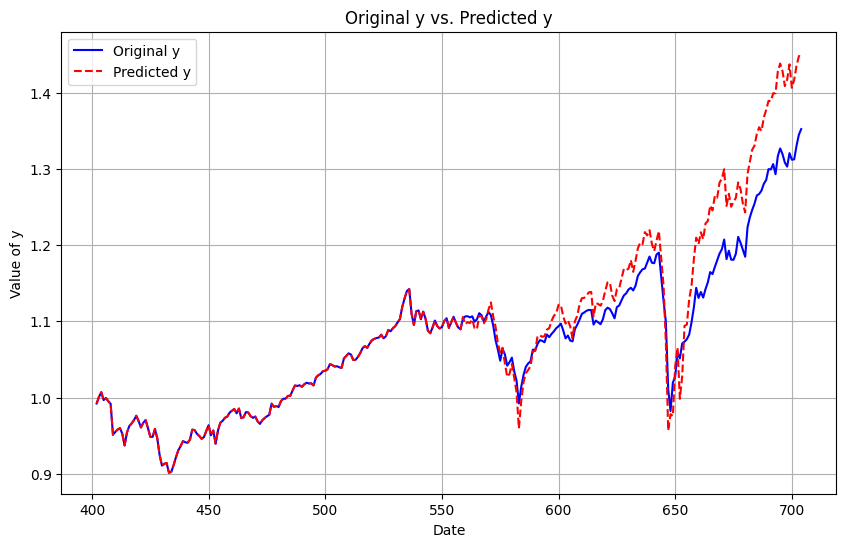

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.7626618992476921
Episode 200/1000, Total Reward: -1.784872922947604
Episode 300/1000, Total Reward: -1.8321648662126955
Episode 400/1000, Total Reward: -1.819945435055866
Episode 500/1000, Total Reward: -1.8052661600579634
Episode 600/1000, Total Reward: -1.7742368828008923
Episode 700/1000, Total Reward: -1.8200324282226104
Episode 800/1000, Total Reward: -1.7097719150812338
Episode 900/1000, Total Reward: -1.7890510087426221
Episode 1000/1000, Total Reward: -1.738864327138748
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.2222953

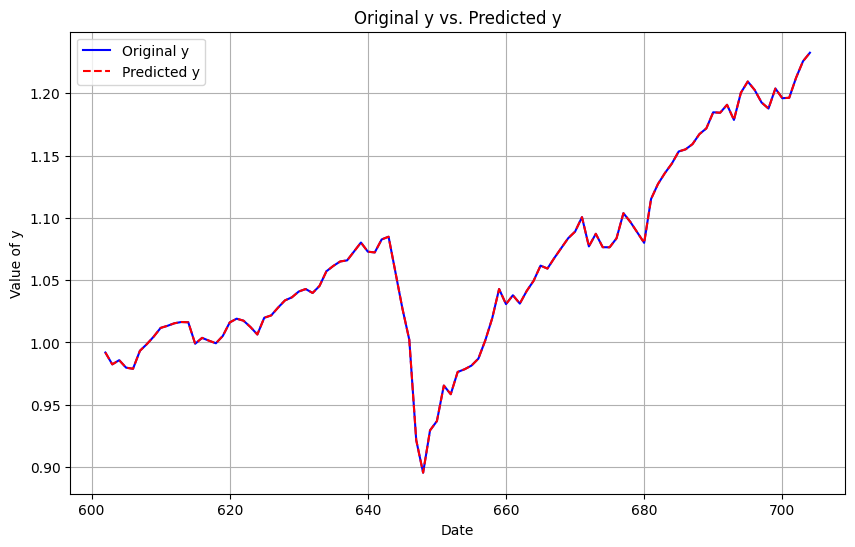

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -2.0840642812855887
Episode 200/1000, Total Reward: -2.373780408651659
Episode 300/1000, Total Reward: -2.5242940415780764
Episode 400/1000, Total Reward: -2.2634598703960016
Episode 500/1000, Total Reward: -2.346335231635821
Episode 600/1000, Total Reward: -2.3095551331015645
Episode 700/1000, Total Reward: -2.273815738541363
Episode 800/1000, Total Reward: -2.388505012762633
Episode 900/1000, Total Reward: -2.1184899384844806
Episode 1000/1000, Total Reward: -2.267560415117794
Return: 0.30816876899458084 %
Upper Partial Moment: 0.00013883234472044007
Lower Partial Moment: 0.00025215688895433323
Semi-Deviation: 0.011573525319934289
Value at Risk (VaR): -0.020368302341475637
Conditional Value at Risk (CVaR): -0.03450664849319728
Downside Deviation: 0.011573525319934289
Lower Partial Standard Deviation (LPSD): 0.011573525319934289
Omega Ratio: -1.20872

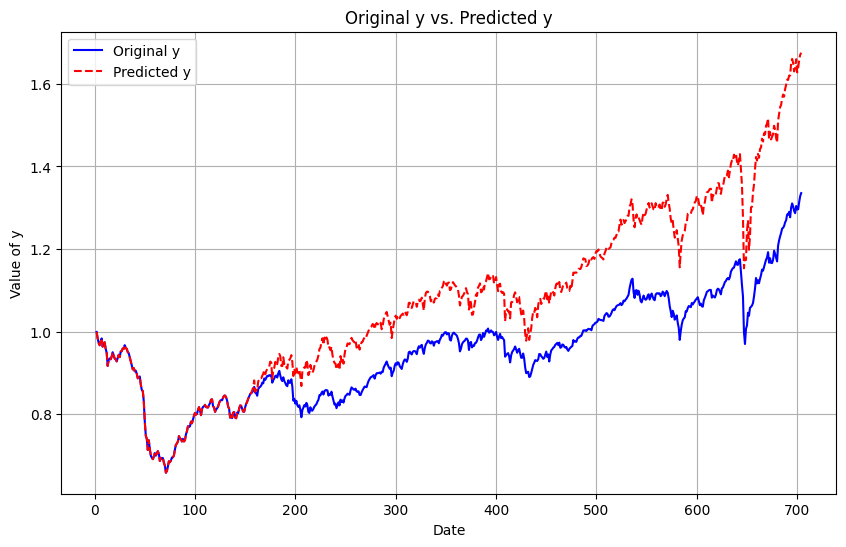

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -1.489153629533655
Episode 200/1000, Total Reward: -1.5280204523572678
Episode 300/1000, Total Reward: -1.4918436363490029
Episode 400/1000, Total Reward: -1.5334512728885217
Episode 500/1000, Total Reward: -1.5103275316799134
Episode 600/1000, Total Reward: -1.491936437753738
Episode 700/1000, Total Reward: -1.4631231924963237
Episode 800/1000, Total Reward: -1.5070593870449858
Episode 900/1000, Total Reward: -1.4297762326132748
Episode 1000/1000, Total Reward: -1.57930124600041
Return: 0.2571084365946841 %
Upper Partial Moment: 9.580043951961151e-05
Lower Partial Moment: 0.00016252898288983785
Semi-Deviation: 0.009756620799349379
Value at Risk (VaR): -0.015073260553909163
Conditional Value at Risk (CVaR): -0.026833143677961652
Downside Deviation: 0.009756620799349379
Lower Partial Standard Deviation (LPSD): 0.009756620799349379
Omega Ratio: -1.108

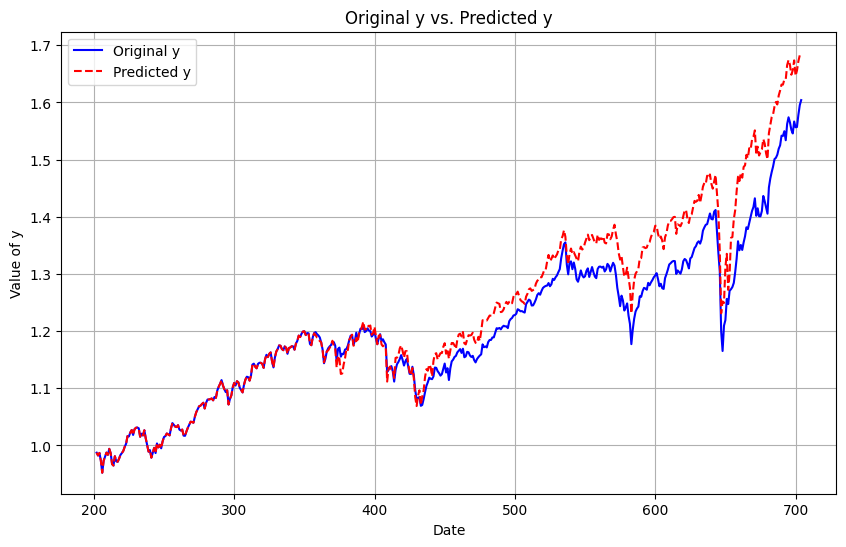

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -1.6079856408605067
Episode 200/1000, Total Reward: -1.574458376089625
Episode 300/1000, Total Reward: -1.4068908352665845
Episode 400/1000, Total Reward: -1.4439565861696697
Episode 500/1000, Total Reward: -1.4710629937992137
Episode 600/1000, Total Reward: -1.5204115264861682
Episode 700/1000, Total Reward: -1.5641414351266691
Episode 800/1000, Total Reward: -1.4311237593914452
Episode 900/1000, Total Reward: -1.581886722712334
Episode 1000/1000, Total Reward: -1.4223256027700948
Return: 0.20413878248234577 %
Upper Partial Moment: 6.917641949218546e-05
Lower Partial Moment: 0.0001563857229314408
Semi-Deviation: 0.009554321898584971
Value at Risk (VaR): -0.01398750172996342
Conditional Value at Risk (CVaR): -0.025829442821821817
Downside Deviation: 0.009554321898584971
Lower Partial Standard Deviation (LPSD): 0.009554321898584971
Omega Ratio: -1.31

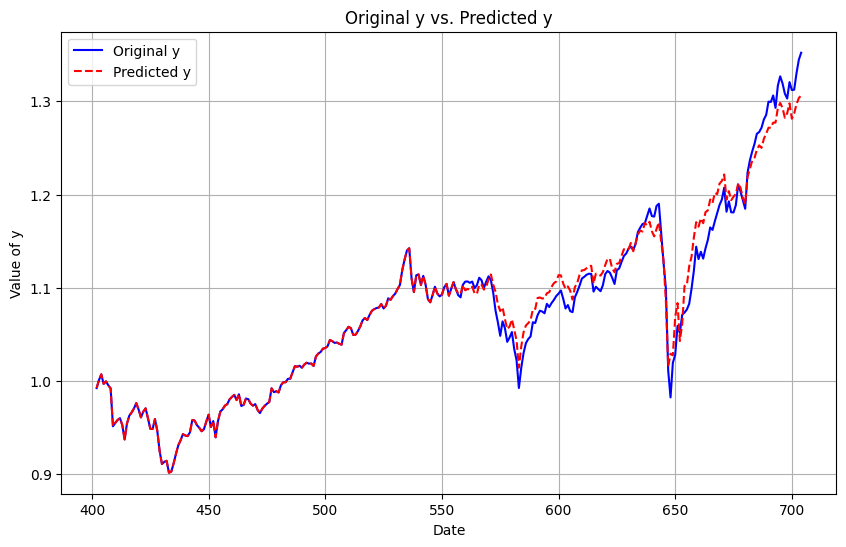

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.5357546047930133
Episode 200/1000, Total Reward: -1.4433413105366477
Episode 300/1000, Total Reward: -1.4709003069661526
Episode 400/1000, Total Reward: -1.3855005289859343
Episode 500/1000, Total Reward: -1.3776891752615341
Episode 600/1000, Total Reward: -1.4390159954665158
Episode 700/1000, Total Reward: -1.4521718895766396
Episode 800/1000, Total Reward: -1.4973261376958722
Episode 900/1000, Total Reward: -1.365001202756077
Episode 1000/1000, Total Reward: -1.3823835477229522
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.22229

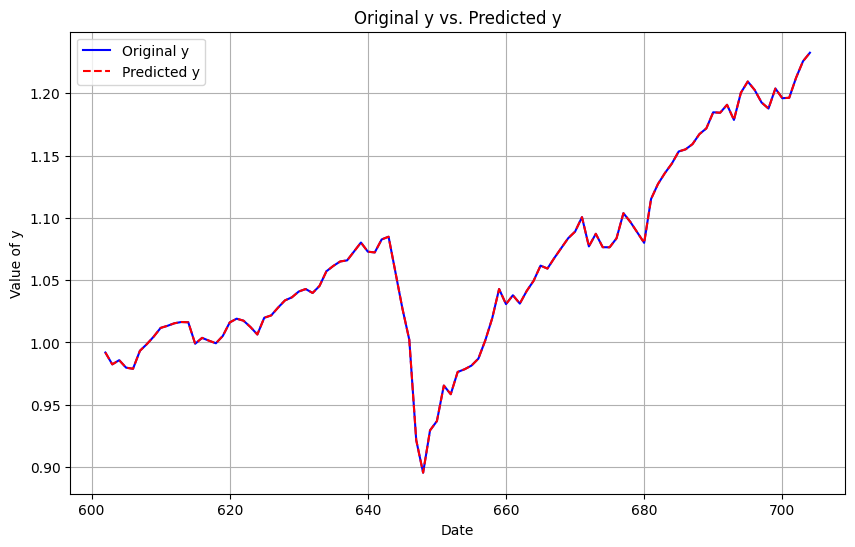

Starting training from observation 1
Starting prediction from observation 156
Using rolling window: True
Episode 100/1000, Total Reward: -3.2713813342591176
Episode 200/1000, Total Reward: -3.3279188409484615
Episode 300/1000, Total Reward: -3.3153366204789774
Episode 400/1000, Total Reward: -3.240571005124705
Episode 500/1000, Total Reward: -3.4260269493404687
Episode 600/1000, Total Reward: -3.240492227050842
Episode 700/1000, Total Reward: -3.1708392659043567
Episode 800/1000, Total Reward: -3.219215598694387
Episode 900/1000, Total Reward: -3.2160287270993995
Episode 1000/1000, Total Reward: -3.3944948432643294
Return: 0.4636118229205123 %
Upper Partial Moment: 0.00030067915073788044
Lower Partial Moment: 0.0005169646865296101
Semi-Deviation: 0.016870754957412085
Value at Risk (VaR): -0.02846693326358485
Conditional Value at Risk (CVaR): -0.04867738231951518
Downside Deviation: 0.016870754957412085
Lower Partial Standard Deviation (LPSD): 0.016870754957412085
Omega Ratio: -1.177635

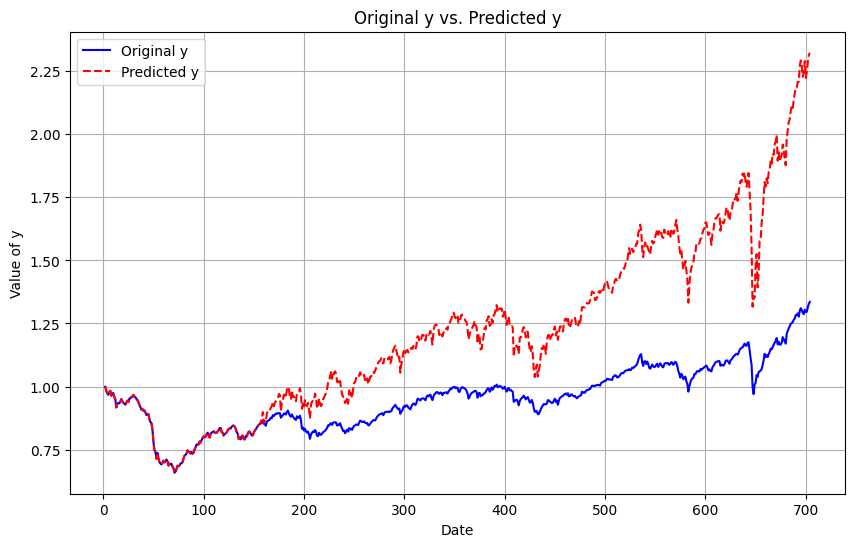

Starting training from observation 201
Starting prediction from observation 356
Using rolling window: True
Episode 100/1000, Total Reward: -1.8387227329112397
Episode 200/1000, Total Reward: -1.8836386224050772
Episode 300/1000, Total Reward: -1.7717153366434413
Episode 400/1000, Total Reward: -1.911398190034236
Episode 500/1000, Total Reward: -1.8757246624089352
Episode 600/1000, Total Reward: -1.8380696894507025
Episode 700/1000, Total Reward: -1.8641117884834153
Episode 800/1000, Total Reward: -1.8570532306434946
Episode 900/1000, Total Reward: -1.9223740012208161
Episode 1000/1000, Total Reward: -1.8415519470159611
Return: 0.362299162911095 %
Upper Partial Moment: 0.0001724887957344686
Lower Partial Moment: 0.0003017884321511983
Semi-Deviation: 0.013640371837928668
Value at Risk (VaR): -0.020462972720520722
Conditional Value at Risk (CVaR): -0.03679662809490243
Downside Deviation: 0.013640371837928668
Lower Partial Standard Deviation (LPSD): 0.013640371837928668
Omega Ratio: -1.115

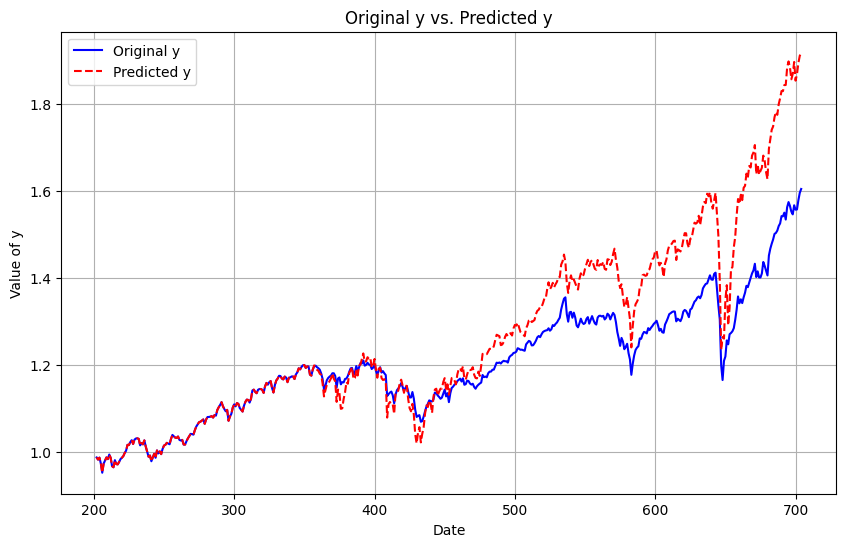

Starting training from observation 401
Starting prediction from observation 556
Using rolling window: True
Episode 100/1000, Total Reward: -1.8647529012981408
Episode 200/1000, Total Reward: -1.9018045068071148
Episode 300/1000, Total Reward: -1.961602082263668
Episode 400/1000, Total Reward: -1.9802050355962373
Episode 500/1000, Total Reward: -1.8677948316656277
Episode 600/1000, Total Reward: -1.9068010393992694
Episode 700/1000, Total Reward: -1.9199749363194234
Episode 800/1000, Total Reward: -1.8170056326707527
Episode 900/1000, Total Reward: -1.9802761087771261
Episode 1000/1000, Total Reward: -1.7838418703621366
Return: 0.3329229799119647 %
Upper Partial Moment: 0.00014545497382301346
Lower Partial Moment: 0.0003189446165715744
Semi-Deviation: 0.014261290449295265
Value at Risk (VaR): -0.017794950848934444
Conditional Value at Risk (CVaR): -0.03634752250945135
Downside Deviation: 0.014261290449295265
Lower Partial Standard Deviation (LPSD): 0.014261290449295265
Omega Ratio: -1.2

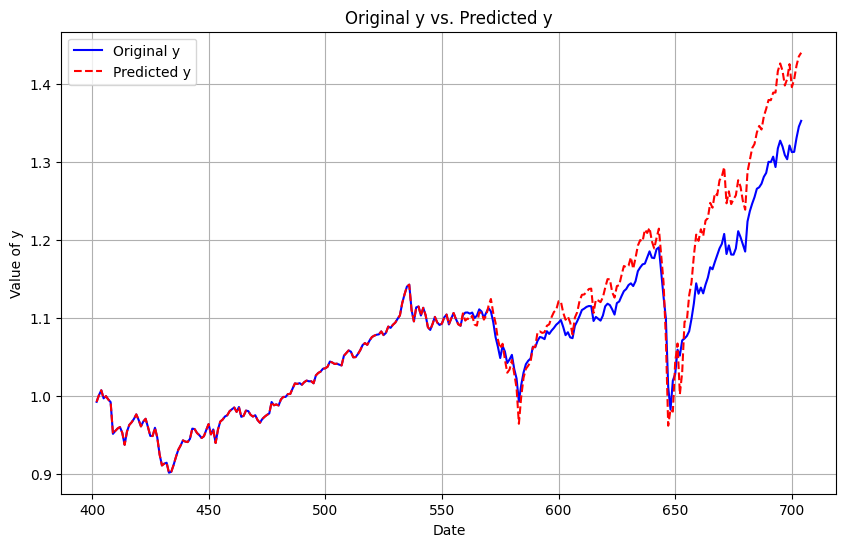

Starting training from observation 601
Starting prediction from observation 756
Using rolling window: True
Episode 100/1000, Total Reward: -1.6675983852319762
Episode 200/1000, Total Reward: -1.8146798955368155
Episode 300/1000, Total Reward: -1.7308951495365559
Episode 400/1000, Total Reward: -1.813093006272682
Episode 500/1000, Total Reward: -1.7277752268175166
Episode 600/1000, Total Reward: -1.7208397667526472
Episode 700/1000, Total Reward: -1.7474566736758113
Episode 800/1000, Total Reward: -1.7783499434077323
Episode 900/1000, Total Reward: -1.6224297326016848
Episode 1000/1000, Total Reward: -1.7563145874668777
Return: 0.5556218303365279 %
Upper Partial Moment: 0.0001281448098935571
Lower Partial Moment: 0.0003180662385089313
Semi-Deviation: 0.01432318794668567
Value at Risk (VaR): -0.020914982665070147
Conditional Value at Risk (CVaR): -0.03474940709578924
Downside Deviation: 0.01432318794668567
Lower Partial Standard Deviation (LPSD): 0.01432318794668567
Omega Ratio: -1.22229

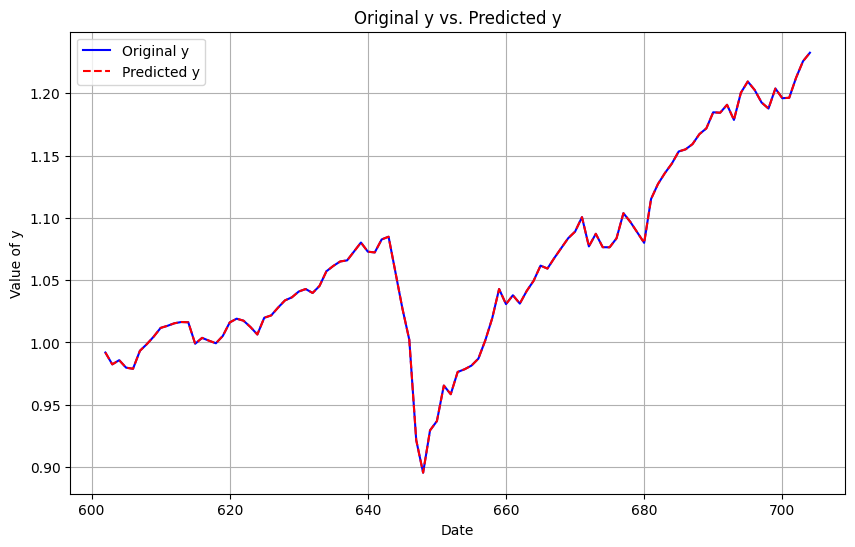

In [ ]:
# Backtesting Function
model_function = perform_QLearning
c = backtest(X_ret, y_ret, y_cropped, y_abs, rolling_window, model_function, plots, print_every, rolling)

## Conclusion

From the exploration of all these models we found that:
- With the original dataset we can achieve good replicas of the target index
- With the cropped dataset we can obtain low variance replicas of the target index (significant reduction of lower partial moments). We noticed that whenever the training happened on a window where the index was growing the replica tended to mantain the growth trend of that window [possible future development].
- With the absolute values dataset we obtained almost flat or bad performing replicas

The only case in which the absolute values dataset performed better than the original and cropped values was with the Kalman Filter.

The algorithms that achieved the best results in terms of replicating the target index were the Reinforcement Learning algorithms, that showed a tendency to outperform the index by showing generally higher returns for a more consistent period of time. The negative side effect is that they increase the variance of the replicated index. When utilizing the cropped dataset, the variance of the replicated serie becomes comparable with the one of the target index and keeps the tendency to have higher returns. When utilizing the absolute values dataset the variance is increased.

The best result so far might be to utilize a combination of Reinforcement Learning on a cropped dataset, to be able to balance the tendency to increase returns and to decrease variance.

Possible developments of this work may be:
- including trading costs in the analysis and adjust the step size accordingly.
- gathering more datasets and simulating different hedge funds.
- analyze the idea to train a rolling window on growth periods to mantain growth tendency momentum